# Imports & General settings
change paths for your environments and folder architecture

In [2]:
%%time
# Standard library imports
import argparse
from datetime import datetime
import glob
import gzip
import io
import json
import logging as log
import os
import re
import requests
from requests.adapters import HTTPAdapter, Retry
import shutil
import subprocess
import sys
import urllib.parse
import urllib.request

# Third party imports
from adjustText import adjust_text
from Bio.PDB import PDBParser
from Bio.PDB.PDBList import PDBList 
from Bio.PDB.DSSP import DSSP
import circlify
from IPython.display import display
import math
import ipywidgets
%matplotlib inline
from matplotlib.colors import LogNorm, ColorConverter
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from scipy import stats
import scipy.cluster.hierarchy as sch
import sklearn.model_selection
from sklearn.metrics import mean_squared_error
import squarify
import xmltodict


CPU times: user 1.11 ms, sys: 162 µs, total: 1.27 ms
Wall time: 1.25 ms


In [3]:
log_message="verbose"

if log_message=="verbose":
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.INFO
    )
elif log_message=="debug":
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.WARNING
    )
else:
    log.basicConfig(
        format='%(levelname)s:%(message)s',
        datefmt='%m/%d/%Y %I:%M:%S %p',
        level=log.ERROR
    )

logger = log.getLogger(__name__)


In [4]:
# General settings

saving_dir_flag = 'projects/Xray_calc'

basepath = '/storage1/tiemann'#''
shared_basepath = '/storage1/shared/data'#'path_to_prism_data'
path_to_script_exec_dir = '/storage1/tiemann/dev/repos/PRISM'#'_path_to_software_/PRISM_tools/rosetta_stability-v0.2.2/'


# Local application imports
try:
    sys.path.insert(1, os.path.join(path_to_script_exec_dir, 'software/scripts'))
    from FillVariants import copy_wt_variants
    from prism_parser_helper import read_prism, merge_prism_df
    from pdb_to_prism import pdb_to_prism

except (ModuleNotFoundError, ImportError) as e:
    logger.error("{} fileure".format(type(e)))
    print(e)
else:
    logger.info("Import succeeded")
    

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/Bio/SubsMat/__init__.py:126: BiopythonDeprecationWarning: Bio.SubsMat has been deprecated, and we intend to remove it in a future release of Biopython. As an alternative, please consider using Bio.Align.substitution_matrices as a replacement, and contact the Biopython developers if you still need the Bio.SubsMat module.
  warnings.warn(
INFO:Import succeeded
INFO:Import succeeded
INFO:Import succeeded


In [5]:
timeflag = '2022_11_09'#'2022_05_05'

working_dir = os.path.join(basepath, saving_dir_flag)
os.makedirs(working_dir, exist_ok=True)

plots_dir = os.path.join(working_dir, 'plots')
os.makedirs(plots_dir, exist_ok=True)

tables_dir = os.path.join(working_dir, 'tables')
os.makedirs(tables_dir, exist_ok=True)

tmp_dir = os.path.join(working_dir, 'tmp')
os.makedirs(tmp_dir, exist_ok=True)

input_data_dir = os.path.join(working_dir, 'data')
os.makedirs(tables_dir, exist_ok=True)

input_dir = os.path.join(working_dir, 'input')
os.makedirs(input_dir, exist_ok=True)

shared_prism_dir = os.path.join(shared_basepath, 'prism')
shared_pdb_prism_dir = os.path.join(shared_basepath, 'prism_pdb')

struc_sele_script = os.path.join(path_to_script_exec_dir, 'software/scripts/struc_select_sifts.py')
path_to_python = 'python3'

#wget ftp://ftp.uniprot.org/pub/databases/uniprot/current_release/knowledgebase/idmapping/by_organism/HUMAN_9606_idmapping.dat.gz
#gunzip HUMAN_9606_idmapping.dat.gz

morbid_file = os.path.join(input_data_dir, f'{timeflag}-morbidmap.txt')
genemap2_file = os.path.join(input_data_dir, f'{timeflag}-genemap2.txt')


# get MP uniprot ids

## Functions

In [6]:
def extract_MP_uniprot():
    url_base = "https://www.uniprot.org/uniprot/"
    search_params = "?query=reviewed:yes" +\
        "+annotation%3A%28type%3Apositional+transmembrane%29" +\
        "+OR+annotation%3A%28type%3Apositional+intramembrane%29"
    return_params = "+&format=tab&" +\
        "columns=id" +\
        ",entry%20name" +\
        ",protein%20name" +\
        ",genes(PREFERRED)" +\
        ",organism" +\
        ",length" +\
        ",feature(TRANSMEMBRANE)" +\
        ",feature(INTRAMEMBRANE)" +\
        ",feature(TOPOLOGICAL%20DOMAIN)" +\
        ""
    url = url_base+search_params+return_params

    data_array = []
    for line in urllib.request.urlopen(url):
        line = line.decode('utf-8')
        unprocessed = line[:-1].split('\t')
        data_array.append(unprocessed)

    return data_array
def extract_MP_uniprot_beta():
    url_base = "https://rest.uniprot.org/beta/uniprotkb/search"
    search_params = "?query=reviewed:true" +\
        "+ft_topo_dom" +\
        "+OR+ft_transmem+OR+ft_intramem"
    return_params = "+&format=tab&" +\
        "columns=id" +\
        ",entry%20name" +\
        ",protein%20name" +\
        ",genes(PREFERRED)" +\
        ",organism" +\
        ",length" +\
        ",feature(TRANSMEMBRANE)" +\
        ",feature(INTRAMEMBRANE)" +\
        ",feature(TOPOLOGICAL%20DOMAIN)" +\
        ""
    url = url_base+search_params+return_params
    print(url)
    data_array = []
    for line in urllib.request.urlopen(url):
        line = line.decode('utf-8')
        unprocessed = line[:-1].split('\t')
        data_array.append(unprocessed)

    return data_array

In [7]:
def extract_MP_ebi(human=True):

    if human:
        requestURL = "https://www.ebi.ac.uk/proteins/api/features?offset=0&size=-1&organism=homo%20sapiens&types=TRANSMEM%2CINTRAMEM"
    else:
        logger.warn('currently not implemented to get all :(')
        sys.exit()
        #requestURL = "https://www.ebi.ac.uk/proteins/api/features?offset=0&size=-1&types=TRANSMEM%2CINTRAMEM"

    r = requests.get(requestURL, headers={ "Accept" : "application/json"})

    if not r.ok:
        r.raise_for_status()
        sys.exit()

    j = r.json()
    df = pd.DataFrame.from_dict(j)
    
    return df

In [8]:
def check_memb(prism_data, filename):
    MP_columns = ['TRANSMEM','INTRAMEM','TOPO_DOM','LIPID',]
    for column in prism_data.metadata['columns']:
        if column in MP_columns:
            return filename

## Execution

In [ ]:
%%time
unique_hMP_ebi_csv = os.path.join(tables_dir, f'{timeflag}-ebi_hMP_entries.csv')
if os.path.isfile(unique_hMP_ebi_csv):
    logger.info('Read dataframe from existing files...')
    unique_hMP_ebi = pd.read_csv(unique_hMP_ebi_csv)
else:
    logger.info('No existing files. Generate new files - estimated time: ~ 20min')
    unique_hMP_ebi = extract_MP_ebi(human=True)
    unique_hMP_ebi = unique_hMP_ebi[unique_hMP_ebi["entryName"].str.contains("HUMAN")].reset_index(drop=True)
    unique_hMP_ebi.to_csv(unique_hMP_ebi_csv)
logger.info(f'human MP in ebi: {len(unique_hMP_ebi["accession"].unique())}')


INFO:No existing files. Generate new files - estimated time: ~ 20min


In [ ]:
%%time
unique_hMP_uniprot_csv = os.path.join(working_dir, f'{timeflag}-uniprot_hMP_entries.csv')
if os.path.isfile(unique_hMP_uniprot_csv):
    logger.info('Read dataframe from existing files...')
    unique_hMP_uniprot = pd.read_csv(unique_hMP_uniprot_csv)  
else:
    logger.info('No existing files. Generate new files - estimated time: ~ 5 min')
    uniprot_MP = extract_MP_uniprot()
    data_array_uniprot = pd.DataFrame(uniprot_MP[1:],columns=uniprot_MP[0])
    unique_hMP_uniprot = data_array_uniprot[data_array_uniprot["Entry name"].str.contains("HUMAN")].reset_index(drop=True)
    unique_hMP_uniprot.to_csv(unique_hMP_uniprot_csv)
logger.info(f'human MP in uniprot: {len(unique_hMP_uniprot["Entry"].unique())}')


In [ ]:
unique_hMP_uniprot['db_uniprot'] = True
unique_hMP_ebi['db_ebi'] = True
unique_hMP_uniprot = unique_hMP_uniprot.rename(columns={"Entry": "accession", "Entry name": "entryName"})
hMP_merged_dfs = pd.merge(unique_hMP_uniprot, unique_hMP_ebi,  how='outer', on = ['accession','entryName']).replace(np.nan, False)
hMP_merged_dfs = hMP_merged_dfs[['accession', 'entryName', 'db_uniprot', 'db_ebi']]
logger.info(hMP_merged_dfs['db_uniprot'].value_counts())
logger.info(hMP_merged_dfs['db_ebi'].value_counts())
hMP_merged_dfs

In [ ]:
intercept_hMP_ids = hMP_merged_dfs.copy()
intercept_hMP_ids = intercept_hMP_ids[(intercept_hMP_ids['db_uniprot'] == True) & (intercept_hMP_ids['db_ebi'] == True)].reset_index(drop=True)
intercept_hMP_ids = intercept_hMP_ids['accession'].unique()
intercept_hMP_ids.sort()
logger.info(f'Number of human MPs in both datasets: {len(intercept_hMP_ids)}')


In [ ]:
%%time
hMP_merged_anno_csv = os.path.join(working_dir, f'{timeflag}-merged_hMP_anno_entries.csv')
if os.path.isfile(hMP_merged_anno_csv):
    logger.info('Read dataframe from existing files...')
    hMP_anno_ids = pd.read_csv(hMP_merged_anno_csv)
else:
    logger.info('No existing files. Generate new files - estimated time: ~ 1h')
    error_list_touching = []
    hMP_merged_anno_dfs = []
    for index, hMP_id in enumerate(hMP_merged_dfs['accession'].unique()): #intercept_hMP_ids:
        if index%100 == 0:
            logger.info(index)
        uniprot_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_uniprot_*_{hMP_id}.txt'))
        try:
            #uniprot
            if len(uniprot_files) !=0:
                uniprot = read_prism(uniprot_files[0])
                anno_hMP = check_memb(uniprot, hMP_id)
                if anno_hMP:
                    hMP_merged_anno_dfs.append(anno_hMP)
        except:
            logger.info(f'Error at id {hMP_id}')
            error_list_touching.append(hMP_id, index=False)
            
    hMP_anno_ids = pd.DataFrame(columns=['accession'], data=hMP_merged_anno_dfs)
    hMP_anno_ids.to_csv(hMP_merged_anno_csv, index=False)
    
    logger.info('Done')
    print(len(error_list_touching))
hMP_anno_ids

## OMIM

### Functions

In [13]:
def read_mim_uniprot_mapping():
    import urllib
    link = "https://www.uniprot.org/docs/mimtosp.txt"
    uniprot2omim = {}

    f = urllib.request.urlopen(link)
    data = False
    previous_key = None
    for line in f:
        if line.decode('UTF-8') == '________________________________________________________________________\n':
            data=True
        elif line.decode('UTF-8') == '--------------------------------------------------------------------------------\n':
            data=False
        if data:
            processed_line = line.decode('UTF-8').strip().split(':')
            if len(processed_line)>1:
                mimID = processed_line[0]
                previous_key = mimID
                uniprot_ids = processed_line[1].split('(')
                if len(uniprot_ids)>1:
                    for elem in range(1,len(uniprot_ids)):
                        uniprot_id = uniprot_ids[elem].split(')')[0]
                        uniprot2omim[uniprot_id] = mimID
            elif len(processed_line)==1:
                uniprot_ids = processed_line[0].strip().split('(')
                if len(uniprot_ids)>1:
                    for elem in range(1,len(uniprot_ids)):
                        uniprot_id = uniprot_ids[elem].split(')')[0]
                        uniprot2omim[uniprot_id] = previous_key
    return uniprot2omim

def read_mim_henrike_uniprot(idmapping_file):
    omim2ensembl = {}
    uniprot_omim_df = pd.read_table(idmapping_file, header=None)
    uniprot_omim_df = uniprot_omim_df.rename(columns={0:'uniprot', 1:'resource', 2:'ID'})
    uniprot_omim_df = uniprot_omim_df[uniprot_omim_df['resource']=='MIM'].reset_index(drop=True)
    uniprot_omim_df = uniprot_omim_df.set_index('uniprot')[['ID']]
    uniprot2omim = uniprot_omim_df.to_dict()['ID']
    return uniprot2omim

def read_mim_ensembl_uniprot(idmapping_file):
    link = "https://omim.org/static/omim/data/mim2gene.txt"
    s=requests.get(link).content
    omim_ensembl = pd.read_csv(io.StringIO(s.decode('utf-8')), skiprows=4, sep='\t')
    omim_ensembl = omim_ensembl.rename(columns={'Ensembl Gene ID (Ensembl)':'Ensembl_ID', '# MIM Number': 'MIM_ID'})[['Ensembl_ID', 'MIM_ID']]
    omim_ensembl = omim_ensembl.dropna(subset=['Ensembl_ID']).reset_index(drop=True)
    mapper_df = pd.read_table(idmapping_file, header=None)
    mapper_df = mapper_df.rename(columns={0:'uniprot', 1:'resource', 2:'Ensembl_ID'})
    mapper_df = mapper_df[mapper_df['resource']=='Ensembl'].reset_index(drop=True)[['uniprot', 'Ensembl_ID']]
    omim_ensembl_merged = pd.merge(omim_ensembl, mapper_df, on='Ensembl_ID')[['uniprot', 'MIM_ID']].sort_values(by=['uniprot']).drop_duplicates()
    omim_ensembl_merged = omim_ensembl_merged.set_index('uniprot')[['MIM_ID']]
    uniprot2omim = omim_ensembl_merged.to_dict()['MIM_ID']
    return uniprot2omim

In [14]:
def get_orbidmap_df(morbid_file, known=True):
    morbidmap_df = pd.read_table(morbid_file, skiprows=3, skipfooter=24, sep='\t')
    # 1 - The disorder is placed on the map based on its association with
    # a gene, but the underlying defect is not known.
    # 2 - The disorder has been placed on the map by linkage or other
    # statistical method; no mutation has been found.
    # 3 - The molecular basis for the disorder is known; a mutation has been
    # found in the gene.
    # 4 - A contiguous gene deletion or duplication syndrome, multiple genes
    # are deleted or duplicated causing the phenotype.
    morbidmap_df['Phenotype_class'] = morbidmap_df['# Phenotype'].apply(lambda x: int(x[-2]))
    morbidmap_df['Phenotype_ID'] = morbidmap_df['# Phenotype'].apply(lambda x: x.split()[-2] if x.split()[-2].isdigit() else None)
    morbidmap_df['# Phenotype'] = morbidmap_df['# Phenotype'].apply(lambda x: ",".join(x.split(',')[:-1]) if x.split()[-2].isdigit() else x[:-4])
    morbidmap_df = morbidmap_df.rename(columns={'# Phenotype':'Phenotype', 'MIM Number': 'MIM_ID', 'Gene Symbols': 'Gene_Name', 'Cyto Location': 'Cyto_loc'})
    if known:
        morbidmap_df = morbidmap_df[morbidmap_df['Phenotype_class']==3].reset_index(drop=True)
    return morbidmap_df

In [15]:
def get_genemap2_df(genemap2_file, known=True):
    genemap2 = pd.read_table(genemap2_file, skiprows=3, skipfooter=76, sep='\t')
    # 1 - the disorder is placed on the map based on its association with
    # a gene, but the underlying defect is not known.
    # 2 - the disorder has been placed on the map by linkage; no mutation has
    # been found.
    # 3 - the molecular basis for the disorder is known; a mutation has been
    # found in the gene.
    # 4 - a contiguous gene deletion or duplication syndrome, multiple genes
    # are deleted or duplicated causing the phenotype.
    genemap2['MIM Number'] = genemap2['MIM Number'].astype(int)
    genemap2 = genemap2.rename(columns={'Phenotypes':'Phenotype', '# Chromosome':'Chromosome', 'MIM Number': 'MIM_ID', 'Gene Symbols': 'Gene_Name', 'Cyto Location': 'Cyto_loc'})

    return genemap2

### Execution

In [16]:
# get uniprot2omim
origin=2
if origin==0:
    uniprot2omim = read_mim_uniprot_mapping() #15,647
elif origin==1:
    uniprot2omim = read_mim_henrike_uniprot(os.path.join(input_data_dir, 'HUMAN_9606_idmapping.dat')) #15,647
elif origin==2:
    uniprot2omim = read_mim_ensembl_uniprot(os.path.join(input_data_dir, 'HUMAN_9606_idmapping.dat')) #65,883

logger.info(len(uniprot2omim))
uniprot2omim

INFO:65963


{'A0A024QZ33': 616173,
 'A0A024QZ42': 601057,
 'A0A024QZP7': 116940,
 'A0A024QZW4': 610845,
 'A0A024QZX5': 173321,
 'A0A024R0K5': 114890,
 'A0A024R0Y4': 602276,
 'A0A024R214': 607342,
 'A0A024R3B8': 619870,
 'A0A024R3B9': 123590,
 'A0A024R4E5': 142695,
 'A0A024R4K9': 616550,
 'A0A024R571': 605888,
 'A0A024R5G9': 603539,
 'A0A024R5I4': 604988,
 'A0A024R6J8': 601413,
 'A0A024R772': 601677,
 'A0A024R7E8': 619818,
 'A0A024R7P0': 603200,
 'A0A024R7W5': 618669,
 'A0A024R8F3': 604383,
 'A0A024RA28': 600124,
 'A0A024RAC6': 600786,
 'A0A024RBT2': 605219,
 'A0A024RBT8': 613481,
 'A0A024RCL3': 600169,
 'A0A024RCN4': 616474,
 'A0A024RDL5': 607270,
 'A0A067XG54': 300516,
 'A0A067XG57': 300516,
 'A0A075B6E2': 603474,
 'A0A075B6E4': 618692,
 'A0A075B6E5': 609061,
 'A0A075B6E9': 614453,
 'A0A075B6F3': 603337,
 'A0A075B6F6': 607106,
 'A0A075B6F9': 616759,
 'A0A075B6G3': 300377,
 'A0A075B6G4': 604210,
 'A0A075B6G5': 614006,
 'A0A075B6G6': 607307,
 'A0A075B6G7': 603448,
 'A0A075B6G8': 612658,
 'A0A075B6H

In [17]:
morbidmap_df = get_orbidmap_df(morbid_file, known=True)
morbidmap_df
#morbidmap_df[morbidmap_df['MIM_ID'] == uniprot2omim['P07550']]

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/io/parsers.py:767: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  return read_csv(**locals())


,Phenotype,Gene_Name,MIM_ID,Cyto_loc,Phenotype_class,Phenotype_ID
0,"17,20-lyase deficiency, isolated","CYP17A1, CYP17, P450C17",609300,10q24.32,3,202110
1,"17-alpha-hydroxylase/17,20-lyase deficiency","CYP17A1, CYP17, P450C17",609300,10q24.32,3,202110
2,"2,4-dienoyl-CoA reductase deficiency","NADK2, C5orf33, DECRD",615787,5p13.2,3,616034
3,2-methylbutyrylglycinuria,"ACADSB, SBCAD",600301,10q26.13,3,610006
4,3-M syndrome 1,"CUL7, 3M1",609577,6p21.1,3,273750
...,...,...,...,...,...,...
7162,"{West nile virus, susceptibility to}","CCR5, CMKBR5, CCCKR5, IDDM22",601373,3p21.31,3,610379
7163,"{Wilms tumor 6, susceptibility to}","REST, NRSF, WT6, GINGF5, HGF5, DFNA27",600571,4q12,3,616806
7164,{Wilms tumor susceptibility-5},"POU6F2, WTSL, WT5",609062,7p14.1,3,601583
7165,{Yao syndrome},"NOD2, CARD15, IBD1, CD, YAOS, BLAUS",605956,16q12.1,3,617321


In [18]:
genemap2_df = get_genemap2_df(genemap2_file, known=True)
genemap2_df
#logger.info(genemap2_df[genemap2_df['MIM_ID'] == uniprot2omim['P07550']]['Phenotype'].to_list())
#logger.info(genemap2_df['Chromosome'].unique())
#genemap2_df[genemap2_df['MIM_ID'] == uniprot2omim['P07550']]

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/io/parsers.py:767: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  return read_csv(**locals())


,Chromosome,Genomic Position Start,Genomic Position End,Cyto_loc,Computed Cyto Location,MIM_ID,Gene_Name,Gene Name,Approved Gene Symbol,Entrez Gene ID,Ensembl Gene ID,Comments,Phenotype,Mouse Gene Symbol/ID
0,chr1,0,123400000,1p,NaN,606788,ANON1,"Anorexia nervosa, susceptibility to, 1",NaN,171514.0,NaN,NaN,"{Anorexia nervosa, susceptibility to, 1}, 6067...",NaN
1,chr1,0,2300000,1p36.33,NaN,618815,"C1DUPp36.33, DUP1p36.33","Chromosome 1p36.33 duplication syndrome, ATAD3...",NaN,NaN,NaN,NaN,"Chromosome 1p36.33 duplication syndrome, ATAD3...",NaN
2,chr1,0,20100000,1pter-p36.13,NaN,115665,"CTRCT8, CCV","Cataract, congenital, Volkmann type",NaN,7792.0,NaN,linked to Rh in Scottish family,"Cataract 8, multiple types, 115665 (2), Autoso...",NaN
3,chr1,0,27600000,1pter-p36,NaN,131190,"ERPL1, HLM2",Endogenous retroviral pol gene-like sequence 1...,NaN,NaN,NaN,NaN,NaN,NaN
4,chr1,0,123400000,1p,NaN,605606,PSORS7,Psoriasis susceptibility 7,NaN,65245.0,NaN,NaN,"{Psoriasis susceptibility 7}, 605606 (2)",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17932,chrY,25622114,25625510,Yq11.23,Yq11.23,400016,"CDY1, CDY","Chromodomain protein, Y chromosome",CDY1,9085.0,ENSG00000172288,NaN,NaN,NaN
17933,chrY,25728489,25733387,Yq11.23,Yq11.23,400036,TTTY3,"Testis-specific transcript, Y-linked, 3",TTTY3,114760.0,ENSG00000231141,NaN,NaN,NaN
17934,chrY,26600000,57227415,Yq12,NaN,475000,"GCY, TSY, STA","Growth control, Y-chromosome influenced",NaN,2656.0,NaN,NaN,NaN,NaN
17935,chrY,0,57227415,Chr.Y,NaN,400043,DFNY1,"Deafness, Y-linked 1",NaN,724074.0,NaN,NaN,"Deafness, Y-linked 1, 400043 (2), Y-linked",NaN


# get gnomAD, clinvar, uniprot, pdb files

## Get PDB regions

### from RCSB

In [19]:
%%time
pdbrcsb_acc_csv = os.path.join(tables_dir, f'{timeflag}-pdbrcsb_acc_hMP.csv')
if os.path.isfile(pdbrcsb_acc_csv):
    logger.info('Read dataframe from existing files...')
    pdbrcsb_acc_df = pd.read_csv(pdbrcsb_acc_csv)
else:
    logger.info('No existing files. Generate new files - estimated time: > 1h')
    pdbrcsb_acc_df = [['accession', 'pdb_id', 'pdb_chain', 'pdb_instance', 'pdb_score', 'pdb_resolution']]
    for index, accession_id in enumerate(hMP_anno_ids['accession'].unique()):
        if index%100 == 0:
            print(index)
        search_string = f"https://search.rcsb.org/rcsbsearch/v1/query?json=%7B%22query%22%3A%7B%22type%22%3A%22group%22%2C%22logical_operator%22%3A%22and%22%2C%22nodes%22%3A%5B%7B%22type%22%3A%22terminal%22%2C%22service%22%3A%22text%22%2C%22parameters%22%3A%7B%22operator%22%3A%22exact_match%22%2C%22value%22%3A%22{accession_id}%22%2C%22attribute%22%3A%22rcsb_polymer_entity_container_identifiers.reference_sequence_identifiers.database_accession%22%7D%7D%2C%7B%22type%22%3A%22terminal%22%2C%22service%22%3A%22text%22%2C%22parameters%22%3A%7B%22operator%22%3A%22exact_match%22%2C%22value%22%3A%22UniProt%22%2C%22attribute%22%3A%22rcsb_polymer_entity_container_identifiers.reference_sequence_identifiers.database_name%22%7D%7D%5D%7D%2C%22return_type%22%3A%22polymer_instance%22%7D"
        r = urllib.request.urlopen(search_string)
        search_string2 = f"https://search.rcsb.org/rcsbsearch/v1/query?json=%7B%22query%22%3A%7B%22type%22%3A%22group%22%2C%22logical_operator%22%3A%22and%22%2C%22nodes%22%3A%5B%7B%22type%22%3A%22terminal%22%2C%22service%22%3A%22text%22%2C%22parameters%22%3A%7B%22operator%22%3A%22exact_match%22%2C%22value%22%3A%22{accession_id}%22%2C%22attribute%22%3A%22rcsb_polymer_entity_container_identifiers.reference_sequence_identifiers.database_accession%22%7D%7D%2C%7B%22type%22%3A%22terminal%22%2C%22service%22%3A%22text%22%2C%22parameters%22%3A%7B%22operator%22%3A%22exact_match%22%2C%22value%22%3A%22UniProt%22%2C%22attribute%22%3A%22rcsb_polymer_entity_container_identifiers.reference_sequence_identifiers.database_name%22%7D%7D%5D%7D%2C%22return_type%22%3A%22polymer_entity%22%7D"
        r2 = urllib.request.urlopen(search_string2)
        try:
            data = json.loads(r.read())
            data2 = json.loads(r2.read())
            for indi, results in enumerate(data['result_set']):
                pdbrcsb_acc_df.append([accession_id, results['identifier'].split('.')[0], results['identifier'].split('.')[1], data2['result_set'][indi]['identifier'].split('_')[1], results['score'], None])
        except:
            pass
    pdbrcsb_acc_df = pd.DataFrame(data=pdbrcsb_acc_df[1:], columns=pdbrcsb_acc_df[0])
    pdbrcsb_acc_df.to_csv(pdbrcsb_acc_csv, index=False)

pdbrcsb_acc_df

INFO:Read dataframe from existing files...


CPU times: user 15.5 ms, sys: 0 ns, total: 15.5 ms
Wall time: 18.4 ms


,accession,pdb_id,pdb_chain,pdb_instance,pdb_score,pdb_resolution
0,P22223,4OY9,A,1,1.0,NaN
1,P22223,4ZML,A,1,1.0,NaN
2,P22223,4ZMN,A,1,1.0,NaN
3,P22223,4ZMO,A,1,1.0,NaN
4,P22223,4ZMP,A,1,1.0,NaN
...,...,...,...,...,...,...
7342,Q6P179,4JBS,B,1,1.0,NaN
7343,Q6P179,5AB0,A,1,1.0,NaN
7344,Q6P179,5AB0,B,1,1.0,NaN
7345,Q6P179,5AB2,A,1,1.0,NaN


In [20]:
print(len(pdbrcsb_acc_df['accession'].unique()))
pdbrcsb_acc_df['accession'].unique()

1720


array(['P22223', 'Q9ULX7', 'Q9HCJ2', ..., 'Q9P0I2', 'P98172', 'Q6P179'],
      dtype=object)

In [21]:
%%time
#generate pdb prism files (takes quite long >>h)
pdbrcsb_acc_error_file = os.path.join(tmp_dir, f'{timeflag}-pdb_acc_hMP_error.csv')

if os.path.isfile(pdbrcsb_acc_error_file):
    logger.info('Read dataframe from existing files...')
    pdbrcsb_errors_df = pd.read_csv(pdbrcsb_acc_error_file)
    pdbs = pdbrcsb_errors_df.copy()
    pdbs['pdb_merge'] = pdbs['pdb_id'] + '_' + pdbs['pdb_chain']
    pdbs = list(pdbs['pdb_merge'].unique())
    pdbrcsb_errors = pdbrcsb_errors_df.copy().values.tolist()
    pdbrcsb_errors = [pdbrcsb_errors_df.columns.tolist()] + pdbrcsb_errors
else:
    pdbrcsb_errors = [pdbrcsb_acc_df.columns]
    pdbs = []
pdbrcsb_errors = pdbrcsb_errors + pdbrcsb_acc_df[pdbrcsb_acc_df['pdb_chain'].isnull().values].reset_index(drop=True).values.tolist()
for index, row in pdbrcsb_acc_df.iterrows():
    if index%100 == 0:
        print(index)
    pdbID = row['pdb_id']
    chains = row['pdb_chain']
    accession_id = row['accession']
    if type(chains)==str:
        for chain in list(chains):
            if not f'{pdbID}_{chain}' in pdbs:
                try:
                    result_pdb_subdir = os.path.join(shared_pdb_prism_dir, accession_id[0:2], accession_id[2:4], accession_id[4:6])
                    os.makedirs(result_pdb_subdir, exist_ok = True)
                    final_pdb_prism = os.path.join(result_pdb_subdir, f'prism_pdb_XXX_{accession_id}-{pdbID}-{chain}.txt')
                    if not os.path.isfile(final_pdb_prism):
                        tmp_pdb_dir = os.path.join(working_dir, 'tmp_processing', f'{pdbID}_{chain}_tmp')
                        os.makedirs(tmp_pdb_dir, exist_ok = True)
                        tmp_prism_pdb = pdb_to_prism(pdbID, output_dir=tmp_pdb_dir, chain=chain)[0]
                        shutil.copyfile(tmp_prism_pdb, final_pdb_prism)
                        shutil.rmtree(tmp_pdb_dir, ignore_errors=True)
                except:
                    pdbrcsb_errors.append([accession_id, pdbID, chain, row['pdb_instance'], row['pdb_score'], row['pdb_resolution']])#row.tolist())
                    pdbrcsb_errors2 = pd.DataFrame(data=pdbrcsb_errors[1:], columns=pdbrcsb_errors[0])
                    pdbrcsb_errors2.to_csv(pdbrcsb_acc_error_file, index=False)
shutil.rmtree(os.path.join(working_dir, 'tmp_processing'), ignore_errors=True)
pdbrcsb_errors = pd.DataFrame(data=pdbrcsb_errors[1:], columns=pdbrcsb_errors[0])
pdbrcsb_errors.to_csv(pdbrcsb_acc_error_file, index=False)
pdbrcsb_errors

INFO:Read dataframe from existing files...


0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
CPU times: user 3.68 s, sys: 733 ms, total: 4.41 s
Wall time: 1min 9s


,accession,pdb_id,pdb_chain,pdb_instance,pdb_score,pdb_resolution
0,P22223,4ZMQ,A,1,1.000,NaN
1,P22223,4ZMQ,B,1,1.000,NaN
2,P22223,4ZMT,A,1,1.000,NaN
3,P22223,4ZMT,B,1,1.000,NaN
4,P22223,4ZMT,C,1,1.000,NaN
...,...,...,...,...,...,...
5803,P04439,4l3c,NaN,1,0.806,2.64
5804,P04439,4l29,NaN,1,0.806,3.09
5805,P01375,5mu8,NaN,1,0.674,3.00
5806,P62191,5vfs,NaN,26,0.839,3.60


### from PDBe

In [22]:
%%time
pdbe_acc_csv = os.path.join(tables_dir, f'{timeflag}-pdbe_acc_hMP.csv')
if os.path.isfile(pdbe_acc_csv):
    logger.info('Read dataframe from existing files...')
    pdbe_acc_df = pd.read_csv(pdbe_acc_csv)
else:
    logger.info('No existing files. Generate new files - estimated time: > 1h')
    pdbe_acc_df = [['accession', 'pdb_id', 'pdb_chain', 'pdb_instance', 'pdb_coverage', 'pdb_resolution']]
    for index, accession_id in enumerate(hMP_anno_ids['accession'].unique()):
        if index%100 == 0:
            print(index)
        search_string = f'https://www.ebi.ac.uk/pdbe/graph-api/mappings/best_structures/{accession_id}'
        try:
            r = urllib.request.urlopen(search_string)
            data = json.loads(r.read())
            #print(data)
            for indi, results in enumerate(data[accession_id]):
                pdbe_acc_df.append([accession_id, results['pdb_id'], results['chain_id'], results['entity_id'], results['coverage'], results['resolution'] ])
        except:
            pass
    pdbe_acc_df = pd.DataFrame(data=pdbe_acc_df[1:], columns=pdbe_acc_df[0])
    pdbe_acc_df.to_csv(pdbe_acc_csv, index=False)
pdbe_acc_df


INFO:Read dataframe from existing files...


CPU times: user 40.5 ms, sys: 2.53 ms, total: 43 ms
Wall time: 66.7 ms


,accession,pdb_id,pdb_chain,pdb_instance,pdb_coverage,pdb_resolution
0,P22223,4zmn,A,1,0.287,2.60
1,P22223,4zmt,F,1,0.287,2.70
2,P22223,4zmt,E,1,0.287,2.70
3,P22223,4zmt,C,1,0.287,2.70
4,P22223,4zmt,A,1,0.287,2.70
...,...,...,...,...,...,...
29338,Q6P179,3se6,A,1,1.000,3.08
29339,Q6P179,4e36,B,1,1.000,3.22
29340,Q6P179,4e36,A,1,1.000,3.22
29341,Q6P179,4jbs,B,1,0.998,2.79


In [23]:
print(len(pdbe_acc_df['accession'].unique()))
pdbe_acc_df['pdb_chain'].unique()
#pdbe_errors['pdb_chain'].unique()

1720


array(['A', 'F', 'E', 'C', 'D', 'B', 'K', 'H', 'L', 'J', 'G', 'I', 'M',
       'N', 'YA', 'O', 'HA', 'V', 'LC', 'Q', 'R', 'P', 'BB', 'X', 'T',
       'S', 'W', 'U', 'KC', 'LD', 'RB', 'AD', 'XB', 'RC', 'JC', 'FD',
       'YC', 'ZC', 'DD', 'AC', 'LB', 'UB', 'ND', 'BD', 'PC', 'BC', 'FC',
       'OC', 'GD', 'XC', 'VB', 'OD', 'WB', 'PD', 'ID', 'SB', 'CD', 'DC',
       'NC', 'QC', 'IC', 'PB', 'JB', 'OB', 'EC', 'HC', 'IB', 'KB', 'NB',
       'MB', 'HD', 'ZB', 'ED', 'JD', 'TB', 'KD', 'WC', 'SC', 'CC', 'MC',
       'MD', 'VC', 'YB', 'UC', 'GC', 'QB', 'TC', 'XA', 'GA', 'IA', 'DA',
       'QA', nan, 'LA', 'AA', 'CB', 'WA', 'UA', 'EA', 'SA', 'FB', 'OA',
       'AB', 'Z', 'BA', 'Y', 'FA', 'CA', 'KA', 'MA', 'EB', 'JA', 'ZA',
       'TA', 'VA', 'PA', 'RA', 'DB', 'NF', 'WG', 'EE', 'GB', 'LF', 'UG',
       'CE', 'HB', 'TD', 'QD'], dtype=object)

In [24]:
#generate pdb prism files (takes quite long >>h)
pdbe_acc_error_file = os.path.join(tmp_dir, f'{timeflag}-pdb_acc_hMP_error.csv')
if os.path.isfile(pdbe_acc_error_file):
    logger.info('Read dataframe from existing files...')
    pdbe_errors_df = pd.read_csv(pdbe_acc_error_file)
    pdbs = pdbe_errors_df.copy()
    pdbs['pdb_merge'] = pdbs['pdb_id'] + '_' + pdbs['pdb_chain']
    pdbs = list(pdbs['pdb_merge'].unique())
    pdbe_errors = pdbe_errors_df.copy().values.tolist()
    pdbe_errors = [pdbe_errors_df.columns.tolist()] + pdbe_errors
else:
    pdbe_errors = [pdbe_acc_df.columns]
    pdbs = []
pdbe_errors = pdbe_errors + pdbe_acc_df[pdbe_acc_df['pdb_chain'].isnull().values].reset_index(drop=True).values.tolist()

for index, row in pdbe_acc_df.iterrows():
    if index%100 == 0:
        print(index)
    pdbID = row['pdb_id']
    chains = row['pdb_chain']
    accession_id = row['accession']
    if type(chains)==str:
        for chain in list(chains):
            if not f'{pdbID}_{chain}' in pdbs:
                try:
                    result_pdb_subdir = os.path.join(shared_pdb_prism_dir, accession_id[0:2], accession_id[2:4], accession_id[4:6])
                    os.makedirs(result_pdb_subdir, exist_ok = True)
                    final_pdb_prism = os.path.join(result_pdb_subdir, f'prism_pdb_XXX_{accession_id}-{pdbID}-{chain}.txt')
                    if not os.path.isfile(final_pdb_prism):
                        tmp_pdb_dir = os.path.join(working_dir, 'tmp_processing', f'{pdbID}_{chain}_tmp')
                        os.makedirs(tmp_pdb_dir, exist_ok = True)
                        tmp_prism_pdb = pdb_to_prism(pdbID, output_dir=tmp_pdb_dir, chain=chain)[0]
                        shutil.copyfile(tmp_prism_pdb, final_pdb_prism)
                        shutil.rmtree(tmp_pdb_dir, ignore_errors=True)
                except:
                    pdbe_errors.append([accession_id, pdbID, chain, row['pdb_instance'], row['pdb_coverage'], row['pdb_resolution']])#row.tolist())
                    pdbe_errors2 = pd.DataFrame(data=pdbe_errors[1:], columns=pdbe_errors[0])
                    pdbe_errors2.to_csv(pdbe_acc_error_file, index=False)
shutil.rmtree(os.path.join(working_dir, 'tmp_processing'), ignore_errors=True)
pdbe_errors = pd.DataFrame(data=pdbe_errors[1:], columns=pdbe_errors[0])
pdbe_errors.to_csv(pdbe_acc_error_file, index=False)
pdbe_errors

INFO:Read dataframe from existing files...


0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900
10000
10100
10200
10300
10400
10500
10600
10700
10800
10900
11000
11100
11200
11300
11400
11500
11600
11700
11800
11900
12000
12100
12200
12300
12400
12500
12600
12700
12800
12900
13000
13100
13200
13300
13400
13500
13600
13700
13800
13900
14000
14100
14200
14300
14400
14500
14600
14700
14800
14900
15000
15100
15200
15300
15400
15500
15600
15700
15800
15900
16000
16100
16200
16300
16400
16500
16600
16700
16800
16900
17000
17100
17200
17300
17400
17500
17600
17700
17800
17900
18000
18100
18200
18300
18400
18

,accession,pdb_id,pdb_chain,pdb_instance,pdb_score,pdb_resolution
0,P22223,4ZMQ,A,1,1.000,NaN
1,P22223,4ZMQ,B,1,1.000,NaN
2,P22223,4ZMT,A,1,1.000,NaN
3,P22223,4ZMT,B,1,1.000,NaN
4,P22223,4ZMT,C,1,1.000,NaN
...,...,...,...,...,...,...
5809,P04439,4l3c,NaN,1,0.806,2.64
5810,P04439,4l29,NaN,1,0.806,3.09
5811,P01375,5mu8,NaN,1,0.674,3.00
5812,P62191,5vfs,NaN,26,0.839,3.60


## read and merge into csv

In [6]:
### execute this to get both files - the second is a subset of the first
timeflag = '2022_05_05'
csv_file_all_merged = os.path.join(tables_dir, f'{timeflag}-merged_anno_hMP_merged_df.csv')
ifclinV=False
ifpdb=False
flag_sub = ''
# csv_file_all_merged = os.path.join(tables_dir, f'{timeflag}-merged_anno_hMP_ClinVar_PDB_df.csv')
# ifclinV=True
# ifpdb=True
# flag_sub = '_ClinVar_PDB'

### make initial csv

In [2]:
#pd.set_option('display.max_columns', 100)
def make_all_merged_prism_nowrite(hMP_id, ifclinV=False, ifpdb=False, noPDB=False):#hMP_anno_ids['accession'].unique(): #intercept_hMP_ids:
    netsurfp_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_netsurfp_*_{hMP_id}.txt'))
    spliceAI_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_spliceai_XXX_{hMP_id}*.txt'))
    gnomAD_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_gnomad_*{hMP_id}*.txt'))
    clinvar_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_clinvar_XXX_{hMP_id}*.txt'))
    uniprot_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_uniprot_*_{hMP_id}.txt'))
    pdb_files = glob.glob(os.path.join(shared_pdb_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_pdb_XXX_{hMP_id}-*.txt'))

    dataframe_list = []
    #uniprot
    if len(uniprot_files) !=0:
        try:
            uniprot = read_prism(uniprot_files[0])
            uniprot.dataframe = copy_wt_variants(uniprot.dataframe, incl_del=True)
            uniprot.dataframe['aa_ref'] = uniprot.dataframe['variant'].apply(lambda x: [x[0]])
            uniprot.dataframe['aa_var'] = uniprot.dataframe['variant'].apply(lambda x: [x[-1]])
            uniprot.dataframe['resi'] = uniprot.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
            uniprot.dataframe['n_mut'] = 1
            dataframe_list.append(uniprot)
        except:
            logger.info(f'error at {uniprot_files}')
    else:
        logger.info(f'no uniprot file at {hMP_id}')
        return []
    #netsurfp
    if len(netsurfp_files) !=0:
        try:
            netsurfp = read_prism(netsurfp_files[0])
            netsurfp.dataframe = copy_wt_variants(netsurfp.dataframe, )#incl_del=False)
            netsurfp.dataframe['aa_ref'] = netsurfp.dataframe['variant'].apply(lambda x: [x[0]])
            netsurfp.dataframe['aa_var'] = netsurfp.dataframe['variant'].apply(lambda x: [x[-1]])
            netsurfp.dataframe['resi'] = netsurfp.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
            netsurfp.dataframe['n_mut'] = 1
            dataframe_list.append(netsurfp)
        except:
            logger.info(f'error at {netsurfp_files}')
    #clinvar
    if len(clinvar_files) !=0:
        for clinvar_file in clinvar_files:
            try:
                clinvar = read_prism(clinvar_file)
                dataframe_list.append(clinvar)
            except:
                logger.info(f'error at {clinvar_file}')
                if ifclinV:
                    logger.info(f'no clinvar file at {hMP_id}')
                    return []
    else:
        if ifclinV:
            logger.info(f'no clinvar file at {hMP_id}')
            return []
    #gnomAD
    if len(gnomAD_files) !=0:
        for gnomAD_file in gnomAD_files:
            try:
                gnomAD = read_prism(gnomAD_file)
                dataframe_list.append(gnomAD)
            except:
                logger.info(f'error at {gnomAD_file}')
    #spliceAI
    if len(spliceAI_files) !=0:
        for spliceAI_file in spliceAI_files:
            try:
                spliceAI = read_prism(spliceAI_file)
                dataframe_list.append(spliceAI)
            except:
                logger.info(f'error at {spliceAI_file}')
    #pdb
    if noPDB==False:
        if len(pdb_files) !=0:
            pdb_files_unique = []
            for pdb_file in pdb_files:
                if not pdb_file.upper() in pdb_files_unique:
                    pdb_files_unique.append(pdb_file.upper())
                    try:
                        pdb = read_prism(pdb_file)
                        pdb.dataframe = copy_wt_variants(pdb.dataframe, incl_del=True)
                        pdb.dataframe['aa_ref'] = pdb.dataframe['variant'].apply(lambda x: [x[0]])
                        pdb.dataframe['aa_var'] = pdb.dataframe['variant'].apply(lambda x: [x[-1]])
                        pdb.dataframe['resi'] = pdb.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                        pdb.dataframe['n_mut'] = 1
                        pdb.dataframe['ID'] = pdb_file.split(hMP_id)[-1][1:-4]
                        pdb.metadata['columns']['ID'] = 'PDB_ID + chain'
                        dataframe_list.append(pdb)
                    except:
                        logger.info(f'error at {pdb_file}')
                        if ifpdb:
                            logger.info(f'no pdb file at {hMP_id}')
                            return []
        else:
            if ifpdb:
                logger.info(f'no pdb file at {hMP_id}')
                return []

    if len(dataframe_list) > 1:
        try:
            all_merged = merge_prism_df(dataframe_list, identity=0.7)
        except:
            return []
    else:
        return []

    key_dic = {}
    new_columns = {}
    for key in all_merged.metadata['merged']:
        num = key.split("_")[1]
        name = all_merged.metadata['merged'][key].split('_')[1]
        for column in all_merged.metadata['columns']:
            if column.endswith(num):
                key_dic[column] = f'{name};{column}'
                new_columns[f'{name};{column}'] = all_merged.metadata['columns'][column]
    
    all_merged.dataframe.rename(columns=key_dic, inplace=True)
    all_merged.metadata['columns'] = new_columns
    #modify pdb IDs
    pdb_ids = [elem for elem in all_merged.dataframe.columns if elem.startswith('pdb;ID_')]
    all_merged.dataframe[f'pdb;IDs'] = all_merged.dataframe[pdb_ids].apply(
        lambda x: '|'.join(list(set(x.astype(str)))), axis=1)
    all_merged.dataframe = all_merged.dataframe.drop(columns=pdb_ids)
    for key in pdb_ids:
        all_merged.metadata['columns'].pop(key)
    all_merged.metadata['columns']['pdb;IDs'] = 'PDB_ID + chain'
    #removing no-values from FillVariants
    non_relevant = [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('uniprot')] + [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('netsurfp')] + [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('pdb')]
    non_relevant = list(np.unique(non_relevant))
    tmp_df1 = all_merged.dataframe.copy()
    tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
    tmp_df2 = all_merged.dataframe.copy()
    tmp_df2 = tmp_df2.drop(columns=non_relevant)
    tmp_df2.dropna(axis=0, how='all', inplace=True, thresh=6)
    new_clean = pd.merge(tmp_df1, tmp_df2, how='right', on='variant')
    new_clean = new_clean.dropna(axis='columns', how ='all')
    all_merged.dataframe = new_clean
    drop_meta_columns = [key for key in all_merged.metadata['columns'].keys() if not key in all_merged.dataframe.columns]
    for key in drop_meta_columns:
        all_merged.metadata['columns'].pop(key)

    return all_merged.dataframe


In [71]:
%%time
write_file = False
if write_file:
    txt_included = os.path.join(tmp_dir, f'{timeflag}-ids_included{flag_sub}.csv')
    if os.path.isfile(txt_included):
        logger.info('Read dataframe from existing files...')
        already_included = pd.read_csv(txt_included)
        already_included = list(already_included['accession'].unique())
    else:
        already_included = []
        
    error_file = os.path.join(tmp_dir, f'{timeflag}-empty-df{flag_sub}.csv')
    if os.path.isfile(error_file):
        logger.info('Read dataframe from existing files...')
        error_df = pd.read_csv(error_file)
        error = list(error_df['accession'].unique())
        error_list = list(error_df['accession'].unique())
    else:
        error = [] 
        error_list = []

    df_list = []
    for index, hMP_id in enumerate(hMP_anno_ids['accession'].unique()):
        if index%50 == 0:
            print(int(index/50))
            if len(df_list) !=0:
                df_list = pd.concat(df_list, join='outer')
                df_list.to_csv(csv_file_all_merged_sub, index=False)
                if not os.path.isfile(txt_included):
                    with open(txt_included, 'a') as fp:
                        fp.write(f'accession\n')
                with open(txt_included, 'a') as fp:
                    for rr in hMP_id_seen:
                        fp.write(f'{rr}\n')
            num = len(glob.glob(os.path.join(tmp_dir, f'sub_*_{timeflag}-merged_anno_hMP_merged_df{flag_sub}.csv')))
            csv_file_all_merged_sub = os.path.join(tmp_dir, f'sub_{num}_{timeflag}-merged_anno_hMP_merged_df{flag_sub}.csv')
            df_list = []
            hMP_id_seen = []
        checking = already_included
        checking.extend(error)
        if not hMP_id in checking:
            all_merged_dataframe = make_all_merged_prism_nowrite(hMP_id, ifclinV=ifclinV, ifpdb=ifpdb)
            if len(all_merged_dataframe) == 0:
                error_list.append(hMP_id)
                error_df = pd.DataFrame(columns=['accession'], data=error_list)
                error_df.to_csv(error_file, index=False)
                logger.info('Empty dataframe')
                continue
            #all_merged_dataframe = all_merged_dataframe.reindex(['accession', *all_merged_dataframe.columns], axis=1).assign(accession=hMP_id)
            
            all_merged_dataframe['accession'] = hMP_id
            df_list.append(all_merged_dataframe)
            hMP_id_seen.append(hMP_id)

            logger.info(f'Successful written of {hMP_id} - {index}')

    if len(df_list) !=0:
        df_list = pd.concat(df_list, join='outer')
        df_list.to_csv(csv_file_all_merged_sub, index=False)
        if not os.path.isfile(txt_included):
            with open(txt_included, 'a') as fp:
                fp.write(f'accession\n')
        with open(txt_included, 'a') as fp:
            for rr in hMP_id_seen:
                fp.write(f'{rr}\n')


INFO:Read dataframe from existing files...


['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2'] []
0
['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']
['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']
['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']
['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']
['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']
1
['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']


INFO:Successful written of P0C6S8 - 5


['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']


INFO:Successful written of Q643R3 - 6


['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']


INFO:Successful written of P16581 - 7


['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']


INFO:Successful written of Q14CX5 - 8


['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']


INFO:Successful written of Q96ES6 - 9


2
Index(['variant', 'uniprot;pfam_name_00', 'uniprot;TRANSMEM_00',
       'uniprot;TOPO_DOM_00', 'uniprot;CARBOHYD_00', 'uniprot;SIGNAL_00',
       'uniprot;COMPBIAS_00', 'netsurfp;burried_exposed_01', 'netsurfp;rsa_01',
       'netsurfp;asa_01',
       ...
       'gnomad;Codons_g_03', 'gnomad;Homozygotes_ex_03',
       'gnomad;Homozygotes_g_03', 'gnomad;SNP_03', 'spliceai;maxdelta_04',
       'spliceai;DS_AG_04', 'spliceai;DS_AL_04', 'spliceai;DS_DG_04',
       'spliceai;DS_DL_04', 'spliceai;HGVSc_04'],
      dtype='object', length=106)
['P51451', 'P22223', 'Q9ULX7', 'Q53RY4', 'Q9HCJ2']
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.

INFO:Successful written of Q2M2H8 - 10


CPU times: user 1min 6s, sys: 500 ms, total: 1min 7s
Wall time: 1min 7s


### test reading of files

In [ ]:
read_csv_true = True
if read_csv_true:
    get_counts = [int(x.split('sub_')[1].split('_')[0]) for x in glob.glob(os.path.join(tmp_dir, f'sub_*_{timeflag}-merged_anno_hMP_merged_df{flag_sub}.csv'))]
    print(len(get_counts))
    for count_file in sorted(get_counts):
        read_csv = os.path.join(tmp_dir, f'sub_{count_file}_{timeflag}-merged_anno_hMP_merged_df{flag_sub}.csv')# + [csv_file_all_merged]:
        df_tmpiiiiiii = pd.read_csv(read_csv, low_memory=False)
        print(read_csv)
        print(len(df_tmpiiiiiii['accession'].unique()))


### merge all files

In [ ]:
# merge files
merge_all_files=False

if merge_all_files:
    #reading all files
    all_merged_dataframe = []
    get_counts = [int(x.split('sub_')[1].split('_')[0]) for x in glob.glob(os.path.join(tmp_dir, f'sub_*_{timeflag}-merged_anno_hMP_merged_df{flag_sub}.csv'))]
    print(len(get_counts))
    for count_file in sorted(get_counts):
        read_csv = os.path.join(tmp_dir, f'sub_{count_file}_{timeflag}-merged_anno_hMP_merged_df{flag_sub}.csv')# + [csv_file_all_merged]:
        df_tmpiiiiiii = pd.read_csv(read_csv, low_memory=False)
        print(read_csv, len(df_tmpiiiiiii['accession'].unique()))
        all_merged_dataframe.append(df_tmpiiiiiii)
    all_merged_dataframe = pd.concat(all_merged_dataframe)
    
    #check if all have been calculated or had a problem
    all_total = list(hMP_anno_ids['accession'].unique())
    all_from_df = list(all_merged_dataframe['accession'].unique())
    error = pd.read_csv(os.path.join(tmp_dir, f'{timeflag}-empty-df{flag_sub}.csv'))
    error = list(error['accession'].unique())
    print(f'errors: {len(error)}')
    to_check = all_from_df.copy()
    to_check.extend(error)
    missing = []
    for elem in all_total:
        if not elem in to_check:
            missing.append(elem)
    
    logger.info(f"missing: {len(missing)}")
    if len(missing) == 0:
        #cleaning df
        all_merged_dataframe.drop_duplicates(inplace=True)
        all_merged_dataframe.dropna(how='all', axis=1, inplace=True)
        #writing df
        all_merged_dataframe.to_csv(csv_file_all_merged)


# Analysing, statistics & figures on hMPs


## Functions

In [25]:
def check_length(s):
    if type(s)==str:
        for x in s.split('|'):
            if len(x)!=6:
                return False
            else:
                try:
                    float(x)
                    return False
                except:
                    return True
    else:
        return False

    return True
def recheck_pdblist(s):
    new_list = []
    if type(s)==str:
        for x in s.split('|'):
            if len(x)==6:
                try:
                    float(x)
                except:
                    new_list.append(x)
        new_list = '|'.join(new_list)
        if new_list=='':
            return np.NaN
        else:
            return new_list
    else:
        return np.NaN

In [26]:
def cutoff_checks(control_df, nameA='gnomad;AF_tot_first'):
    
    backup_df = control_df.copy()
    
    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)
    gmeans1 = np.sqrt(tpr1 * (1-fpr1))
    ix1 = np.argmax(gmeans1)
    cutoffA = thresholds1[ix1]
    
    return cutoffA

def calculate_AUC_error(control_df, nameA='gnomad;AF_tot_first', runs=1000):

    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)

    results_rosetta = []
    i = 0

    size_groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
    size_groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
    if size_groupA < size_groupB:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==1].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==0].reset_index(drop=True)
        size = size_groupA
    else:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==0].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==1].reset_index(drop=True)
        size = size_groupB
    while i < runs:
        i += 1
        new_large_df = large_df.copy()
        new_large_df = new_large_df.sample(n=size)
        df_subset = pd.concat([new_large_df, small_df], ignore_index=True)

        control_score = np.copy(df_subset['score'].values)
        test_score1 = df_subset[nameA].values
        auc1 = sklearn.metrics.roc_auc_score(control_score, test_score1)
        results_rosetta.append(float(auc1))

    results_rosetta = np.array(results_rosetta)
    results_rosetta = results_rosetta[~np.isnan(results_rosetta)]
    y_true_rosetta = [float(base_auc1)] * len(results_rosetta)
    mse_rosetta = mean_squared_error(results_rosetta, y_true_rosetta)


    return {'gnomAD': [base_auc1, mse_rosetta, np.std(results_rosetta), thresholds1], }


def clinvar_class_anno5(x, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['benign', ]:
                return 0
            elif subx in [ 'pathogenic']:
                return 1
            else:
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return None
    return None
    
def disease_ROC_adapted(control_df, control, test1, groupA=0, groupB=0, nameA='gnomad;AF_tot_first'):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)

    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])
    #ax.set_prop_cycle(color=['Set2'])


    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('FPR (1-specificity)', fontsize=19)
    ax.set_ylabel('TPR (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)


    auc_dic = calculate_AUC_error(control_df, nameA=nameA, runs=1000)
    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['gnomAD'][0]#sklearn.metrics.roc_auc_score(control, test1)
    auc1_mse = auc_dic['gnomAD'][1]
    auc1_std = auc_dic['gnomAD'][2]
    auc1_threshold = auc_dic['gnomAD'][3]
#    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (rosetta): {auc1:.2f}, MSE: {auc1_mse:.2f}, std: {auc1_std:.2f}', linestyle='-', linewidth=1.2, color='mediumvioletred')
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (gnomAD): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')
    y_test = np.copy(control_df['score'].values)
    final_pred = control_df[nameA].values
    from sklearn.metrics import roc_auc_score, roc_curve
    print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
    False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
    False_pos_rate, True_pos_rate, threshold
    from sklearn.metrics import accuracy_score
    acc = []
    for thres in threshold:
        y_pred = np.where(final_pred>thres,1,0)
        acc.append(accuracy_score(y_test,y_pred,normalize=True))

    acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
    acc.columns = ['threshold','accuracy']
    acc.sort_values(by="accuracy", ascending=False, inplace = True)
    max_accuracy1 = acc['accuracy'].max()
    cutoff1 = acc.loc[(acc['accuracy']==max_accuracy1), 'threshold'].mean()#.head()


    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    fig.text(0.25, 0.75, f'pathogenic: {groupA}\nbenign: {groupB}', fontsize=18)
    plt.show()
    return auc_dic, max_accuracy1, cutoff1

In [27]:
def calculate_struc_sele(accession_list, exception_list=[]):
    for index, accession in enumerate(accession_list):
        if not accession in exception_list:
            struc_sele_dir = os.path.join(working_dir, 'struc_sele')
            os.makedirs(struc_sele_dir, exist_ok = True)
            os.makedirs(os.path.join(struc_sele_dir, 'data'), exist_ok = True)
            submitter = f'{path_to_python} {struc_sele_script} {accession}'
            logger.info(f'{index} {submitter}')
            pipes = subprocess.Popen(submitter, shell=True, cwd=struc_sele_dir,stdout=subprocess.PIPE,stderr=subprocess.PIPE,)
            std_out, std_err = pipes.communicate()

## read-in & preprocess dfs

In [28]:
%%time
write_out=True
csv_file_all_merged_edited = os.path.join(tables_dir, f'{timeflag}-merged_anno_hMP_merged_df_edited.csv')


if (os.path.isfile(csv_file_all_merged_edited) == True):
    analysis_df = pd.read_csv(csv_file_all_merged_edited, low_memory=False)
    analysis_df_back = analysis_df.copy()
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
else:
    
    all_files=True#False
    logger.info(all_files)
    if all_files:
        csv_file_pdb_merged = os.path.join(tables_dir, f'{timeflag}-merged_anno_hMP_merged_df.csv')
        if os.path.isfile(csv_file_pdb_merged):
            logger.info('Read dataframe from existing files...')
            interesting_anno_subset = pd.read_csv(csv_file_pdb_merged, low_memory=False)
        logger.info(interesting_anno_subset.columns)
        logger.info(f'#accession: {len(interesting_anno_subset["accession"].unique())}')
        analysis_df_base = interesting_anno_subset.copy()

    else:
        csv_file_anno_onlyclinv_pdb_merged = os.path.join(tables_dir, f'{timeflag}-merged_anno_hMP_ClinVar_PDB_df.csv')
        if os.path.isfile(csv_file_anno_onlyclinv_pdb_merged):
            logger.info('Read dataframe from existing files...')
            interesting_anno_ClinVar_pdb_subset = pd.read_csv(csv_file_anno_onlyclinv_pdb_merged, low_memory=False)
        logger.info(interesting_anno_ClinVar_pdb_subset.columns)
        logger.info(f'#accession: {len(interesting_anno_ClinVar_pdb_subset["accession"].unique())}')
        analysis_df_base = interesting_anno_ClinVar_pdb_subset.copy()
    
    logger.info(f"1: {datetime.now().time()}")
    logger.info('No existing files. Generate new files - estimated time: > 2h')
    analysis_df = analysis_df_base.copy()
    logger.info(f"1: {datetime.now().time()}")
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')


    analysis_df['uniprot;regions_top'] = analysis_df['uniprot;TOPO_DOM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    #analysis_df['uniprot;regions_mobidb'] = analysis_df['uniprot;mobidb_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    #analysis_df['uniprot;regions_disprot'] = analysis_df['uniprot;disprot_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    analysis_df['uniprot;regions_tm'] = analysis_df['uniprot;TRANSMEM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    analysis_df['uniprot;regions_im'] = analysis_df['uniprot;INTRAMEM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    analysis_df['uniprot;regions_all'] = analysis_df[[elem for elem in analysis_df.columns if elem.startswith('uniprot;regions_')]].apply(
        lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    logger.info(f"3: {datetime.now().time()}")
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')

    clinvar_columns = [elem for elem in analysis_df.columns if elem.startswith('clinvar')]
    analysis_df['clinvar;significance_all'] = analysis_df[[elem for elem in clinvar_columns if elem.startswith('clinvar;Clinvar_signifiance')]].apply(
        lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    logger.info(f"4: {datetime.now().time()}")
    
    gnomad_columns = [elem for elem in analysis_df.columns if elem.startswith('gnomad')]
    analysis_df['gnomad;AF_tot_all'] = analysis_df[[elem for elem in gnomad_columns if elem.startswith('gnomad;AF_tot')]].apply(
        lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    logger.info(f"5: {datetime.now().time()}")

    pdb_columns = [elem for elem in analysis_df.columns if elem.startswith('pdb')]
    analysis_df['pdb;SS_all'] = analysis_df[[elem for elem in pdb_columns if elem.startswith('pdb;SS_')]].apply(
        lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    logger.info(f"6: {datetime.now().time()}")
    
    analysis_df = analysis_df.replace(to_replace=[''], value=np.nan)
    analysis_df = analysis_df.replace(to_replace=['nan'], value=np.nan)
    analysis_df = analysis_df.replace(to_replace=[None], value=np.nan)
    logger.info(f"7: {datetime.now().time()}")
    
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
    analysis_df = analysis_df.dropna(how='all', subset=['clinvar;significance_all', 'gnomad;AF_tot_all']).reset_index(drop=True) #['pdb;SS_all', 'clinvar;significance_all']
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
    logger.info(f"9: {datetime.now().time()}")
    
    #remove synon, silent, del
    analysis_df['tmp_resi_var'] = analysis_df['variant'].apply(lambda x: x[-1])
    logger.info(len(analysis_df[analysis_df['tmp_resi_var'].isin(['~', '.', '*', '='])]['accession'].unique()))
    logger.info(len(analysis_df[analysis_df['tmp_resi_var'].isin(['~', '.', '*', '='])]['variant']))
    analysis_df = analysis_df[~ analysis_df['tmp_resi_var'].isin(['~', '.', '*', '='])].reset_index(drop=True).drop(columns=['tmp_resi_var'])
    logger.info(f"2: {datetime.now().time()}")
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
    
    analysis_df_back = analysis_df.copy()
    if write_out:
        analysis_df_back.to_csv(csv_file_all_merged_edited, index=False)
    logger.info(f"8: {datetime.now().time()}")


INFO:#accession: 5471
INFO:#variants: 1867856


CPU times: user 14min 24s, sys: 2min 39s, total: 17min 4s
Wall time: 17min 3s


In [29]:
%%time
write_out=True
csv_file_all_merged_edited_filtered = os.path.join(tables_dir, f'{timeflag}-merged_anno_hMP_merged_df_edited_filtered.csv')

if os.path.isfile(csv_file_all_merged_edited_filtered) == True:
    analysis_df = pd.read_csv(csv_file_all_merged_edited_filtered, low_memory=False)
    base_analysis_formated = analysis_df.copy()
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
else:
    
    analysis_df['pdb;IDs_tmp'] = analysis_df['pdb;IDs'].apply(lambda x: check_length(x))
    logger.info(analysis_df['pdb;IDs_tmp'].unique())

    analysis_df['pdb;IDs'] = analysis_df['pdb;IDs'].apply(lambda x: recheck_pdblist(x))
    analysis_df['pdb;IDs_tmp'] = analysis_df['pdb;IDs'].apply(lambda x: check_length(x))
    logger.info(analysis_df['pdb;IDs_tmp'].unique())
    
    analysis_df = analysis_df.dropna(how='any', subset=['pdb;IDs']).reset_index(drop=True) #['pdb;SS_all', 'clinvar;significance_all']
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
    logger.info(f"10: {datetime.now().time()}")
    

    base_analysis_formated = analysis_df.copy()
    if write_out:
        base_analysis_formated.to_csv(csv_file_all_merged_edited_filtered, index=False)
    base_analysis_formated

INFO:#accession: 1504
INFO:#variants: 281220


CPU times: user 2min 22s, sys: 30 s, total: 2min 52s
Wall time: 2min 52s


## Protein compartments

In [9]:
%%time
### TM and other distributions
total = []
TM = []
EC = []
IC = []
other = []
compartments = []

TM_range = ['TRANSMEM', 'Mitochondrial_intermembrane', 'INTRAMEM', 'INTRAMEM|TRANSMEM']
other_range = ['TRANSMEM', 'Mitochondrial_intermembrane', 'INTRAMEM', 'INTRAMEM|TRANSMEM', 'Extracellular', 'Cytoplasmic']

for index, accession in enumerate(analysis_df_back['accession'].unique()):
    if index%1000 == 0:
        logger.info(index)
    try:
        uniprot_files = glob.glob(os.path.join(shared_prism_dir, accession[0:2], accession[2:4], accession[4:6], f'prism_uniprot_*_{accession}.txt'))
        uniprot = read_prism(uniprot_files[0])
        sequence = uniprot.metadata['protein']['sequence']
        uniprot = uniprot.dataframe.copy()
        try:
            uniprot['uniprot;regions_top'] = uniprot['TOPO_DOM'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
        except:
            pass
        try:
            uniprot['uniprot;regions_tm'] = uniprot['TRANSMEM'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
        except:
            pass
        try:
            uniprot['uniprot;regions_im'] = uniprot['INTRAMEM'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
        except:
            pass
        try:
            uniprot['uniprot;regions_all'] = uniprot[[elem for elem in uniprot.columns if elem.startswith('uniprot;regions_')]].apply(
                lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
        except:
            pass

        length_total = int(len(sequence))
        length_TM=len(uniprot.loc[(uniprot['uniprot;regions_all'].isin(TM_range))].reset_index(drop=True)['variant'])
        length_EC=len(uniprot.loc[(uniprot['uniprot;regions_all'].isin(['Extracellular']))].reset_index(drop=True)['variant'])
        length_IC=len(uniprot.loc[(uniprot['uniprot;regions_all'].isin(['Cytoplasmic']))].reset_index(drop=True)['variant'])
        length_other=len(uniprot.loc[~(uniprot['uniprot;regions_all'].isin(other_range))].reset_index(drop=True)['variant'])

        compartments.append([accession, length_total, length_TM, length_EC, length_IC, length_other])
    except:
        logger.info(accession)
compartments = pd.DataFrame(data = compartments, columns=['accession', 'length_total', 'length_TM', 'length_EC', 'length_IC', 'length_other'])
compartments


INFO:0
INFO:1000
INFO:2000
INFO:3000
INFO:4000
INFO:5000


CPU times: user 20min 1s, sys: 17.6 s, total: 20min 19s
Wall time: 24min 24s


,accession,length_total,length_TM,length_EC,length_IC,length_other
0,P51451,505,0,0,0,416
1,P22223,829,23,547,152,24
2,Q9ULX7,337,21,275,26,15
3,Q53RY4,240,84,0,0,104
4,Q9HCJ2,640,21,0,0,392
...,...,...,...,...,...,...
5466,A0A1B0GTG8,36,19,0,0,0
5467,A0A075B734,347,91,0,0,160
5468,V9GZ13,50,18,0,0,0
5469,A0A2R8YED5,311,110,0,0,172


In [10]:
compartments['p_anno'] = compartments['length_TM']+compartments['length_EC']+compartments['length_IC']+compartments['length_other']

compartments['p_TM'] = compartments['length_TM']/compartments['p_anno']
compartments['p_EC'] = compartments['length_EC']/compartments['p_anno']
compartments['p_IC'] = compartments['length_IC']/compartments['p_anno']
compartments['p_other'] = compartments['length_other']/compartments['p_anno']
logger.info(f"TM: {compartments['p_TM'].mean()}, {compartments['p_TM'].std()}")
logger.info(f"EC: {compartments['p_EC'].mean()}, {compartments['p_EC'].std()}")
logger.info(f"IC: {compartments['p_IC'].mean()}, {compartments['p_IC'].std()}")
logger.info(f"other: {compartments['p_other'].mean()}, {compartments['p_other'].std()}")
logger.info('#####################')
logger.info(f"TM: {compartments['length_TM'].sum()/compartments['p_anno'].sum()}")
logger.info(f"EC: {compartments['length_EC'].sum()/compartments['p_anno'].sum()}")
logger.info(f"IC: {compartments['length_IC'].sum()/compartments['p_anno'].sum()}")
logger.info(f"other: {compartments['length_other'].sum()/compartments['p_anno'].sum()}")
compartments

INFO:TM: 0.22424233202043115, 0.2184774408664916
INFO:EC: 0.23083818343464685, 0.2968886355906997
INFO:IC: 0.2070192179505558, 0.24816996492620627
INFO:other: 0.33790026659436617, 0.39508855227351486
INFO:#####################
INFO:TM: 0.16089923351519217
INFO:EC: 0.32669141091706044
INFO:IC: 0.25089716704770193
INFO:other: 0.2615121885200455


,accession,length_total,length_TM,length_EC,length_IC,length_other,p_anno,p_TM,p_EC,p_IC,p_other
0,P51451,505,0,0,0,416,416,0.000000,0.000000,0.000000,1.000000
1,P22223,829,23,547,152,24,746,0.030831,0.733244,0.203753,0.032172
2,Q9ULX7,337,21,275,26,15,337,0.062315,0.816024,0.077151,0.044510
3,Q53RY4,240,84,0,0,104,188,0.446809,0.000000,0.000000,0.553191
4,Q9HCJ2,640,21,0,0,392,413,0.050847,0.000000,0.000000,0.949153
...,...,...,...,...,...,...,...,...,...,...,...
5466,A0A1B0GTG8,36,19,0,0,0,19,1.000000,0.000000,0.000000,0.000000
5467,A0A075B734,347,91,0,0,160,251,0.362550,0.000000,0.000000,0.637450
5468,V9GZ13,50,18,0,0,0,18,1.000000,0.000000,0.000000,0.000000
5469,A0A2R8YED5,311,110,0,0,172,282,0.390071,0.000000,0.000000,0.609929


In [17]:
analysis_df_back.groupby(['uniprot;regions_all']).agg(['mean', 'count', 'sum'])

Unnamed: 0                     netsurfp;rsa_01  \
                                     mean   count         sum            mean   
uniprot;regions_all                                                             
Cytoplasmic                  11566.636305  447435  5175317915        0.444452   
Exoplasmic_loop              11204.081633     686     7686000        0.360796   
Extracellular                12274.519102  574211  7048163888        0.361115   
INTRAMEM                     12087.719204    3166    38269719        0.219881   
Intragranular                 6460.098606    1004     6485939        0.309160   
Lumenal                      10214.871242  108444  1107741497        0.352217   
Lumenal,_melanosome          12552.571667    1200    15063086        0.272440   
Lumenal,_vesicle              8252.369527     571     4712103        0.334354   
Mitochondrial_intermembrane   9882.840851    7471    73834704        0.406446   
Mitochondrial_matrix         11473.113099    5367    61576198        0.392154   
Nuclear                      12208.239244    1534    18727439        0.554451   
Perinuclear_space            15403.465693    2740    42205496        0.364423   
Peroxisomal                  17803.936170     141     2510355        0.381987   
Peroxisomal_matrix           12913.015152      66      852259        0.447655   
TRANSMEM                     11435.924316  247729  2833010095        0.255533   
TRANSMEM|INTRAMEM             8475.615385      13      110183        0.137183   
Vacuolar                      9205.756052     537     4943491        0.346531   
Vesicular                    19929.136783    2493    49683338        0.366750   

                                                   netsurfp;asa_01          \
                              count            sum            mean   count   
uniprot;regions_all                                                          
Cytoplasmic                  422191  187643.537553       71.757053  422191   
Exoplasmic_loop                 686     247.506391       55.928859     686   
Extracellular                546391  197309.798065       56.849471  546391   
INTRAMEM                       3069     674.815243       35.522264    3069   
Intragranular                  1004     310.396790       48.868765    1004   
Lumenal                      104918   36953.926812       57.210414  104918   
Lumenal,_melanosome            1200     326.928167       42.666015    1200   
Lumenal,_vesicle                466     155.808853       51.586982     466   
Mitochondrial_intermembrane    7287    2961.775026       67.134324    7287   
Mitochondrial_matrix           5223    2048.218853       64.801732    5223   
Nuclear                        1486     823.914712       90.376642    1486   
Perinuclear_space              2589     943.490785       58.225847    2589   
Peroxisomal                     141      53.860223       65.109723     141   
Peroxisomal_matrix               66      29.545210       78.569218      66   
TRANSMEM                     236946   60547.527191       41.390373  236946   
TRANSMEM|INTRAMEM                13       1.783377       27.453414      13   
Vacuolar                        409     141.731217       55.502207     409   
Vesicular                      2468     905.137936       58.040636    2468   

                                          netsurfp;p_q3_H_01  ...  \
                                      sum               mean  ...   
uniprot;regions_all                                           ...   
Cytoplasmic                  3.029518e+07           0.312845  ...   
Exoplasmic_loop              3.836720e+04           0.276317  ...   
Extracellular                3.106204e+07           0.173852  ...   
INTRAMEM                     1.090178e+05           0.694773  ...   
Intragranular                4.906424e+04           0.069460  ...   
Lumenal                      6.002402e+06           0.300988  ...   
Lumenal,_melanosome          5.119922e+04           0.329927  ...   


# get P uniprot ids

## Functions

In [6]:
def extract_P_uniprot():
    url_base = "https://www.uniprot.org/uniprot/"
    search_params = "?query=reviewed:yes"
    return_params = "+&format=tab&" +\
        "columns=id" +\
        ",entry%20name" +\
        ",protein%20name" +\
        ",genes(PREFERRED)" +\
        ",organism" +\
        ",length" +\
        ""
    url = url_base+search_params+return_params

    data_array = []
    for line in urllib.request.urlopen(url):
        line = line.decode('utf-8')
        unprocessed = line[:-1].split('\t')
        data_array.append(unprocessed)

    return data_array

def extract_P_uniprot_beta():
    re_next_link = re.compile(r'<(.+)>; rel="next"')
    retries = Retry(total=5, backoff_factor=0.25, status_forcelist=[500, 502, 503, 504])
    session = requests.Session()
    session.mount("https://", HTTPAdapter(max_retries=retries))

    def get_next_link(headers):
        if "Link" in headers:
            match = re_next_link.match(headers["Link"])
            if match:
                return match.group(1)

    def get_batch(batch_url):
        while batch_url:
            response = session.get(batch_url)
            response.raise_for_status()
            total = response.headers["x-total-results"]
            yield response, total
            batch_url = get_next_link(response.headers)

    url = 'https://rest.uniprot.org/uniprotkb/search?fields=accession%2Cid&format=tsv&query=human%20AND%20%28reviewed%3Atrue%29&size=500'
    data_array = [['Entry', 'Entry name']]
    for batch, total in get_batch(url):
        for line in batch.text.splitlines()[1:]:
            primaryAccession, ids = line.split('\t')
            data_array.append([primaryAccession, ids])
    return data_array

# extract_P_uniprot_beta()

In [7]:
def extract_P_ebi(human=True):

    if human:
        requestURL = "https://www.ebi.ac.uk/proteins/api/features?offset=0&size=-1&organism=homo%20sapiens"
    else:
        logger.warn('currently not implemented to get all :(')
        sys.exit()
        #requestURL = "https://www.ebi.ac.uk/proteins/api/features?offset=0&size=-1&types=TRANSMEM%2CINTRAMEM"

    r = requests.get(requestURL, headers={ "Accept" : "application/json"})

    if not r.ok:
        r.raise_for_status()
        sys.exit()

    j = r.json()
    df = pd.DataFrame.from_dict(j)
    
    return df

## Execution

In [8]:
%%time
unique_hP_ebi_csv = os.path.join(tables_dir, f'{timeflag}-ebi_hP_entries.csv')
if os.path.isfile(unique_hP_ebi_csv):
    logger.info('Read dataframe from existing files...')
    unique_hP_ebi = pd.read_csv(unique_hP_ebi_csv)
else:
    logger.info('No existing files. Generate new files - estimated time: ~ 80min')
    unique_hP_ebi = extract_P_ebi(human=True)
    unique_hP_ebi = unique_hP_ebi[unique_hP_ebi["entryName"].str.contains("HUMAN")].reset_index(drop=True)
    unique_hP_ebi.to_csv(unique_hP_ebi_csv)
logger.info(f'human P in ebi: {len(unique_hP_ebi["accession"].unique())}')


INFO:Read dataframe from existing files...
INFO:human P in ebi: 227805


CPU times: user 7.49 s, sys: 943 ms, total: 8.43 s
Wall time: 10.4 s


In [9]:
%%time
unique_hP_uniprot_csv = os.path.join(working_dir, f'{timeflag}-uniprot_hP_entries.csv')
if os.path.isfile(unique_hP_uniprot_csv):
    logger.info('Read dataframe from existing files...')
    unique_hP_uniprot = pd.read_csv(unique_hP_uniprot_csv)  
else:
    logger.info('No existing files. Generate new files - estimated time: ~ 2 min')
    uniprot_P = extract_P_uniprot_beta()
    data_array_uniprot = pd.DataFrame(uniprot_P[1:],columns=uniprot_P[0])
    unique_hP_uniprot = data_array_uniprot[data_array_uniprot["Entry name"].str.contains("HUMAN")].reset_index(drop=True)
    unique_hP_uniprot.to_csv(unique_hP_uniprot_csv)
logger.info(f'human P in uniprot: {len(unique_hP_uniprot["Entry"].unique())}')


INFO:Read dataframe from existing files...
INFO:human P in uniprot: 20401


CPU times: user 38.9 ms, sys: 420 µs, total: 39.3 ms
Wall time: 79.1 ms


In [10]:
unique_hP_uniprot['db_uniprot'] = True
unique_hP_ebi['db_ebi'] = True
unique_hP_uniprot = unique_hP_uniprot.rename(columns={"Entry": "accession", "Entry name": "entryName"})
hP_merged_dfs = pd.merge(unique_hP_uniprot, unique_hP_ebi,  how='outer', on = ['accession','entryName']).replace(np.nan, False)
hP_merged_dfs = hP_merged_dfs[['accession', 'entryName', 'db_uniprot', 'db_ebi']]
logger.info(hP_merged_dfs['db_uniprot'].value_counts())
logger.info(hP_merged_dfs['db_ebi'].value_counts())
hP_merged_dfs

INFO:False    207404
True      20401
Name: db_uniprot, dtype: int64
INFO:True    227805
Name: db_ebi, dtype: int64


,accession,entryName,db_uniprot,db_ebi
0,P04439,HLAA_HUMAN,True,True
1,O95905,ECD_HUMAN,True,True
2,P42694,HELZ_HUMAN,True,True
3,P08246,ELNE_HUMAN,True,True
4,Q6ZWK4,RHEX_HUMAN,True,True
...,...,...,...,...
227800,A0A023I9A1,A0A023I9A1_HUMAN,False,True
227801,A0A023I989,A0A023I989_HUMAN,False,True
227802,A0A023I954,A0A023I954_HUMAN,False,True
227803,A0A023I8N5,A0A023I8N5_HUMAN,False,True


In [11]:
intercept_hP_ids = hP_merged_dfs.copy()
intercept_hP_ids = intercept_hP_ids[(intercept_hP_ids['db_uniprot'] == True) & (intercept_hP_ids['db_ebi'] == True)].reset_index(drop=True)
intercept_hP_ids = intercept_hP_ids['accession'].unique()
intercept_hP_ids.sort()
logger.info(f'Number of human Ps in both datasets: {len(intercept_hP_ids)}')


INFO:Number of human Ps in both datasets: 20401


In [12]:
%%time
hP_merged_anno_csv = os.path.join(working_dir, f'{timeflag}-merged_hP_anno_entries.csv')
if os.path.isfile(hP_merged_anno_csv):
    logger.info('Read dataframe from existing files...')
    hP_anno_ids = pd.read_csv(hP_merged_anno_csv)
else:
    logger.info('No existing files. Generate new files - estimated time: ~ 1h')
    error_list_touching = []
    hP_merged_anno_dfs = []
    for index, hP_id in enumerate(hP_merged_dfs['accession'].unique()): #intercept_hP_ids:
        if index%100 == 0:
            logger.info(index)
        uniprot_files = glob.glob(os.path.join(shared_prism_dir, hP_id[0:2], hP_id[2:4], hP_id[4:6], f'prism_uniprot_*_{hP_id}.txt'))
        try:
            #uniprot
            if len(uniprot_files) !=0:
                uniprot = read_prism(uniprot_files[0])
                hP_merged_anno_dfs.append(hP_id)
        except:
            logger.info(f'Error at id {hP_id}')
            error_list_touching.append(hP_id, index=False)
            
    hP_anno_ids = pd.DataFrame(columns=['accession'], data=hP_merged_anno_dfs)
    hP_anno_ids.to_csv(hP_merged_anno_csv, index=False)
    
    logger.info('Done')
    print(len(error_list_touching))
hP_anno_ids

INFO:Read dataframe from existing files...


CPU times: user 17.2 ms, sys: 0 ns, total: 17.2 ms
Wall time: 46.2 ms


,accession
0,P04439
1,O95905
2,P42694
3,P08246
4,Q6ZWK4
...,...
20134,A0A0G2JLG4
20135,A0A087WW49
20136,A0A075B7D8
20137,A0A075B7D4


## OMIM

### Functions

In [13]:
def read_mim_uniprot_mapping():
    import urllib
    link = "https://www.uniprot.org/docs/mimtosp.txt"
    uniprot2omim = {}

    f = urllib.request.urlopen(link)
    data = False
    previous_key = None
    for line in f:
        if line.decode('UTF-8') == '________________________________________________________________________\n':
            data=True
        elif line.decode('UTF-8') == '--------------------------------------------------------------------------------\n':
            data=False
        if data:
            processed_line = line.decode('UTF-8').strip().split(':')
            if len(processed_line)>1:
                mimID = processed_line[0]
                previous_key = mimID
                uniprot_ids = processed_line[1].split('(')
                if len(uniprot_ids)>1:
                    for elem in range(1,len(uniprot_ids)):
                        uniprot_id = uniprot_ids[elem].split(')')[0]
                        uniprot2omim[uniprot_id] = mimID
            elif len(processed_line)==1:
                uniprot_ids = processed_line[0].strip().split('(')
                if len(uniprot_ids)>1:
                    for elem in range(1,len(uniprot_ids)):
                        uniprot_id = uniprot_ids[elem].split(')')[0]
                        uniprot2omim[uniprot_id] = previous_key
    return uniprot2omim

def read_mim_henrike_uniprot(idmapping_file):
    omim2ensembl = {}
    uniprot_omim_df = pd.read_table(idmapping_file, header=None)
    uniprot_omim_df = uniprot_omim_df.rename(columns={0:'uniprot', 1:'resource', 2:'ID'})
    uniprot_omim_df = uniprot_omim_df[uniprot_omim_df['resource']=='MIM'].reset_index(drop=True)
    uniprot_omim_df = uniprot_omim_df.set_index('uniprot')[['ID']]
    uniprot2omim = uniprot_omim_df.to_dict()['ID']
    return uniprot2omim

def read_mim_ensembl_uniprot(idmapping_file):
    link = "https://omim.org/static/omim/data/mim2gene.txt"
    s=requests.get(link).content
    omim_ensembl = pd.read_csv(io.StringIO(s.decode('utf-8')), skiprows=4, sep='\t')
    omim_ensembl = omim_ensembl.rename(columns={'Ensembl Gene ID (Ensembl)':'Ensembl_ID', '# MIM Number': 'MIM_ID'})[['Ensembl_ID', 'MIM_ID']]
    omim_ensembl = omim_ensembl.dropna(subset=['Ensembl_ID']).reset_index(drop=True)
    mapper_df = pd.read_table(idmapping_file, header=None)
    mapper_df = mapper_df.rename(columns={0:'uniprot', 1:'resource', 2:'Ensembl_ID'})
    mapper_df = mapper_df[mapper_df['resource']=='Ensembl'].reset_index(drop=True)[['uniprot', 'Ensembl_ID']]
    omim_ensembl_merged = pd.merge(omim_ensembl, mapper_df, on='Ensembl_ID')[['uniprot', 'MIM_ID']].sort_values(by=['uniprot']).drop_duplicates()
    omim_ensembl_merged = omim_ensembl_merged.set_index('uniprot')[['MIM_ID']]
    uniprot2omim = omim_ensembl_merged.to_dict()['MIM_ID']
    return uniprot2omim

In [14]:
def get_orbidmap_df(morbid_file, known=True):
    morbidmap_df = pd.read_table(morbid_file, skiprows=3, skipfooter=24, sep='\t')
    # 1 - The disorder is placed on the map based on its association with
    # a gene, but the underlying defect is not known.
    # 2 - The disorder has been placed on the map by linkage or other
    # statistical method; no mutation has been found.
    # 3 - The molecular basis for the disorder is known; a mutation has been
    # found in the gene.
    # 4 - A contiguous gene deletion or duplication syndrome, multiple genes
    # are deleted or duplicated causing the phenotype.
    morbidmap_df['Phenotype_class'] = morbidmap_df['# Phenotype'].apply(lambda x: int(x[-2]))
    morbidmap_df['Phenotype_ID'] = morbidmap_df['# Phenotype'].apply(lambda x: x.split()[-2] if x.split()[-2].isdigit() else None)
    morbidmap_df['# Phenotype'] = morbidmap_df['# Phenotype'].apply(lambda x: ",".join(x.split(',')[:-1]) if x.split()[-2].isdigit() else x[:-4])
    morbidmap_df = morbidmap_df.rename(columns={'# Phenotype':'Phenotype', 'MIM Number': 'MIM_ID', 'Gene Symbols': 'Gene_Name', 'Cyto Location': 'Cyto_loc'})
    if known:
        morbidmap_df = morbidmap_df[morbidmap_df['Phenotype_class']==3].reset_index(drop=True)
    return morbidmap_df

In [15]:
def get_genemap2_df(genemap2_file, known=True):
    genemap2 = pd.read_table(genemap2_file, skiprows=3, skipfooter=76, sep='\t')
    # 1 - the disorder is placed on the map based on its association with
    # a gene, but the underlying defect is not known.
    # 2 - the disorder has been placed on the map by linkage; no mutation has
    # been found.
    # 3 - the molecular basis for the disorder is known; a mutation has been
    # found in the gene.
    # 4 - a contiguous gene deletion or duplication syndrome, multiple genes
    # are deleted or duplicated causing the phenotype.
    genemap2['MIM Number'] = genemap2['MIM Number'].astype(int)
    genemap2 = genemap2.rename(columns={'Phenotypes':'Phenotype', '# Chromosome':'Chromosome', 'MIM Number': 'MIM_ID', 'Gene Symbols': 'Gene_Name', 'Cyto Location': 'Cyto_loc'})

    return genemap2

### Execution

In [16]:
# get uniprot2omim
origin=2
if origin==0:
    uniprot2omim = read_mim_uniprot_mapping() #15,647
elif origin==1:
    uniprot2omim = read_mim_henrike_uniprot(os.path.join(input_data_dir, 'HUMAN_9606_idmapping.dat')) #15,647
elif origin==2:
    uniprot2omim = read_mim_ensembl_uniprot(os.path.join(input_data_dir, 'HUMAN_9606_idmapping.dat')) #65,883

logger.info(len(uniprot2omim))
uniprot2omim

INFO:65963


{'A0A024QZ33': 616173,
 'A0A024QZ42': 601057,
 'A0A024QZP7': 116940,
 'A0A024QZW4': 610845,
 'A0A024QZX5': 173321,
 'A0A024R0K5': 114890,
 'A0A024R0Y4': 602276,
 'A0A024R214': 607342,
 'A0A024R3B8': 619870,
 'A0A024R3B9': 123590,
 'A0A024R4E5': 142695,
 'A0A024R4K9': 616550,
 'A0A024R571': 605888,
 'A0A024R5G9': 603539,
 'A0A024R5I4': 604988,
 'A0A024R6J8': 601413,
 'A0A024R772': 601677,
 'A0A024R7E8': 619818,
 'A0A024R7P0': 603200,
 'A0A024R7W5': 618669,
 'A0A024R8F3': 604383,
 'A0A024RA28': 600124,
 'A0A024RAC6': 600786,
 'A0A024RBT2': 605219,
 'A0A024RBT8': 613481,
 'A0A024RCL3': 600169,
 'A0A024RCN4': 616474,
 'A0A024RDL5': 607270,
 'A0A067XG54': 300516,
 'A0A067XG57': 300516,
 'A0A075B6E2': 603474,
 'A0A075B6E4': 618692,
 'A0A075B6E5': 609061,
 'A0A075B6E9': 614453,
 'A0A075B6F3': 603337,
 'A0A075B6F6': 607106,
 'A0A075B6F9': 616759,
 'A0A075B6G3': 300377,
 'A0A075B6G4': 604210,
 'A0A075B6G5': 614006,
 'A0A075B6G6': 607307,
 'A0A075B6G7': 603448,
 'A0A075B6G8': 612658,
 'A0A075B6H

In [17]:
morbidmap_df = get_orbidmap_df(morbid_file, known=True)
morbidmap_df
#morbidmap_df[morbidmap_df['MIM_ID'] == uniprot2omim['P07550']]

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/io/parsers.py:767: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  return read_csv(**locals())


,Phenotype,Gene_Name,MIM_ID,Cyto_loc,Phenotype_class,Phenotype_ID
0,"17,20-lyase deficiency, isolated","CYP17A1, CYP17, P450C17",609300,10q24.32,3,202110
1,"17-alpha-hydroxylase/17,20-lyase deficiency","CYP17A1, CYP17, P450C17",609300,10q24.32,3,202110
2,"2,4-dienoyl-CoA reductase deficiency","NADK2, C5orf33, DECRD",615787,5p13.2,3,616034
3,2-methylbutyrylglycinuria,"ACADSB, SBCAD",600301,10q26.13,3,610006
4,3-M syndrome 1,"CUL7, 3M1",609577,6p21.1,3,273750
...,...,...,...,...,...,...
7162,"{West nile virus, susceptibility to}","CCR5, CMKBR5, CCCKR5, IDDM22",601373,3p21.31,3,610379
7163,"{Wilms tumor 6, susceptibility to}","REST, NRSF, WT6, GINGF5, HGF5, DFNA27",600571,4q12,3,616806
7164,{Wilms tumor susceptibility-5},"POU6F2, WTSL, WT5",609062,7p14.1,3,601583
7165,{Yao syndrome},"NOD2, CARD15, IBD1, CD, YAOS, BLAUS",605956,16q12.1,3,617321


In [18]:
genemap2_df = get_genemap2_df(genemap2_file, known=True)
genemap2_df
#logger.info(genemap2_df[genemap2_df['MIM_ID'] == uniprot2omim['P07550']]['Phenotype'].to_list())
#logger.info(genemap2_df['Chromosome'].unique())
#genemap2_df[genemap2_df['MIM_ID'] == uniprot2omim['P07550']]

/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/io/parsers.py:767: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  return read_csv(**locals())


,Chromosome,Genomic Position Start,Genomic Position End,Cyto_loc,Computed Cyto Location,MIM_ID,Gene_Name,Gene Name,Approved Gene Symbol,Entrez Gene ID,Ensembl Gene ID,Comments,Phenotype,Mouse Gene Symbol/ID
0,chr1,0,123400000,1p,NaN,606788,ANON1,"Anorexia nervosa, susceptibility to, 1",NaN,171514.0,NaN,NaN,"{Anorexia nervosa, susceptibility to, 1}, 6067...",NaN
1,chr1,0,2300000,1p36.33,NaN,618815,"C1DUPp36.33, DUP1p36.33","Chromosome 1p36.33 duplication syndrome, ATAD3...",NaN,NaN,NaN,NaN,"Chromosome 1p36.33 duplication syndrome, ATAD3...",NaN
2,chr1,0,20100000,1pter-p36.13,NaN,115665,"CTRCT8, CCV","Cataract, congenital, Volkmann type",NaN,7792.0,NaN,linked to Rh in Scottish family,"Cataract 8, multiple types, 115665 (2), Autoso...",NaN
3,chr1,0,27600000,1pter-p36,NaN,131190,"ERPL1, HLM2",Endogenous retroviral pol gene-like sequence 1...,NaN,NaN,NaN,NaN,NaN,NaN
4,chr1,0,123400000,1p,NaN,605606,PSORS7,Psoriasis susceptibility 7,NaN,65245.0,NaN,NaN,"{Psoriasis susceptibility 7}, 605606 (2)",NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17932,chrY,25622114,25625510,Yq11.23,Yq11.23,400016,"CDY1, CDY","Chromodomain protein, Y chromosome",CDY1,9085.0,ENSG00000172288,NaN,NaN,NaN
17933,chrY,25728489,25733387,Yq11.23,Yq11.23,400036,TTTY3,"Testis-specific transcript, Y-linked, 3",TTTY3,114760.0,ENSG00000231141,NaN,NaN,NaN
17934,chrY,26600000,57227415,Yq12,NaN,475000,"GCY, TSY, STA","Growth control, Y-chromosome influenced",NaN,2656.0,NaN,NaN,NaN,NaN
17935,chrY,0,57227415,Chr.Y,NaN,400043,DFNY1,"Deafness, Y-linked 1",NaN,724074.0,NaN,NaN,"Deafness, Y-linked 1, 400043 (2), Y-linked",NaN


# get gnomAD, clinvar, uniprot, pdb files

## Get hP ids

In [13]:
hP_anno_ids = hP_anno_ids[['accession']]
hP_anno_ids

,accession
0,P04439
1,O95905
2,P42694
3,P08246
4,Q6ZWK4
...,...
20134,A0A0G2JLG4
20135,A0A087WW49
20136,A0A075B7D8
20137,A0A075B7D4


## read and merge into csv

In [14]:
### execute this to get both files - the second is a subset of the first
timeflag = '2022_11_09'
csv_file_all_merged = os.path.join(tables_dir, f'{timeflag}-merged_anno_hP_merged_df.csv')
ifclinV=False
ifpdb=False
flag_sub = ''
# csv_file_all_merged = os.path.join(tables_dir, f'{timeflag}-merged_anno_hMP_ClinVar_PDB_df.csv')
# ifclinV=True
# ifpdb=True
# flag_sub = '_ClinVar_PDB'

### make initial csv

In [44]:
#pd.set_option('display.max_columns', 100)
def make_all_merged_prism_nowrite(hMP_id, ifclinV=False, ifpdb=False, noPDB=False):#hMP_anno_ids['accession'].unique(): #intercept_hMP_ids:
    netsurfp_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_netsurfp_*_{hMP_id}.txt'))
    spliceAI_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_spliceai_XXX_{hMP_id}*.txt'))
    gnomAD_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_gnomad_*{hMP_id}*.txt'))
    clinvar_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_clinvar_XXX_{hMP_id}*.txt'))
    uniprot_files = glob.glob(os.path.join(shared_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_uniprot_*_{hMP_id}.txt'))
    pdb_files = glob.glob(os.path.join(shared_pdb_prism_dir, hMP_id[0:2], hMP_id[2:4], hMP_id[4:6], f'prism_pdb_XXX_{hMP_id}-*.txt'))

    dataframe_list = []
    #uniprot
    if len(uniprot_files) !=0:
        try:
            uniprot = read_prism(uniprot_files[0])
            uniprot.dataframe = copy_wt_variants(uniprot.dataframe, incl_del=True)
            uniprot.dataframe['aa_ref'] = uniprot.dataframe['variant'].apply(lambda x: [x[0]])
            uniprot.dataframe['aa_var'] = uniprot.dataframe['variant'].apply(lambda x: [x[-1]])
            uniprot.dataframe['resi'] = uniprot.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
            uniprot.dataframe['n_mut'] = 1
            dataframe_list.append(uniprot)
        except:
            logger.info(f'error at {uniprot_files}')
    else:
        logger.info(f'no uniprot file at {hMP_id}')
        return []
    #netsurfp
    if len(netsurfp_files) !=0:
        try:
            netsurfp = read_prism(netsurfp_files[0])
            netsurfp.dataframe = copy_wt_variants(netsurfp.dataframe, )#incl_del=False)
            netsurfp.dataframe['aa_ref'] = netsurfp.dataframe['variant'].apply(lambda x: [x[0]])
            netsurfp.dataframe['aa_var'] = netsurfp.dataframe['variant'].apply(lambda x: [x[-1]])
            netsurfp.dataframe['resi'] = netsurfp.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
            netsurfp.dataframe['n_mut'] = 1
            dataframe_list.append(netsurfp)
        except:
            logger.info(f'error at {netsurfp_files}')
    #clinvar
    if len(clinvar_files) !=0:
        for clinvar_file in clinvar_files:
            try:
                clinvar = read_prism(clinvar_file)
                dataframe_list.append(clinvar)
            except:
                logger.info(f'error at {clinvar_file}')
                if ifclinV:
                    logger.info(f'no clinvar file at {hMP_id}')
                    return []
    else:
        if ifclinV:
            logger.info(f'no clinvar file at {hMP_id}')
            return []
    #gnomAD
    if len(gnomAD_files) !=0:
        for gnomAD_file in gnomAD_files:
            try:
                gnomAD = read_prism(gnomAD_file)
                dataframe_list.append(gnomAD)
            except:
                logger.info(f'error at {gnomAD_file}')
    #spliceAI
    if len(spliceAI_files) !=0:
        for spliceAI_file in spliceAI_files:
            try:
                spliceAI = read_prism(spliceAI_file)
                dataframe_list.append(spliceAI)
            except:
                logger.info(f'error at {spliceAI_file}')
    #pdb
    if noPDB==False:
        if len(pdb_files) !=0:
            pdb_files_unique = []
            for pdb_file in pdb_files:
                if not pdb_file.upper() in pdb_files_unique:
                    pdb_files_unique.append(pdb_file.upper())
                    try:
                        pdb = read_prism(pdb_file)
                        pdb.dataframe = copy_wt_variants(pdb.dataframe, incl_del=True)
                        pdb.dataframe['aa_ref'] = pdb.dataframe['variant'].apply(lambda x: [x[0]])
                        pdb.dataframe['aa_var'] = pdb.dataframe['variant'].apply(lambda x: [x[-1]])
                        pdb.dataframe['resi'] = pdb.dataframe['variant'].apply(lambda x: [int(x[1:-1])])
                        pdb.dataframe['n_mut'] = 1
                        pdb.dataframe['ID'] = pdb_file.split(hMP_id)[-1][1:-4]
                        pdb.metadata['columns']['ID'] = 'PDB_ID + chain'
                        dataframe_list.append(pdb)
                    except:
                        logger.info(f'error at {pdb_file}')
                        if ifpdb:
                            logger.info(f'no pdb file at {hMP_id}')
                            return []
        else:
            if ifpdb:
                logger.info(f'no pdb file at {hMP_id}')
                return []

    if len(dataframe_list) > 1:
        try:
            all_merged = merge_prism_df(dataframe_list, identity=0.7)
        except:
            return []
    else:
        return []

    key_dic = {}
    new_columns = {}
    for key in all_merged.metadata['merged']:
        num = key.split("_")[1]
        name = all_merged.metadata['merged'][key].split('_')[1]
        for column in all_merged.metadata['columns']:
            if column.endswith(num):
                key_dic[column] = f'{name};{column}'
                new_columns[f'{name};{column}'] = all_merged.metadata['columns'][column]
    
    all_merged.dataframe.rename(columns=key_dic, inplace=True)
    all_merged.metadata['columns'] = new_columns
    #modify pdb IDs
    pdb_ids = [elem for elem in all_merged.dataframe.columns if elem.startswith('pdb;ID_')]
    all_merged.dataframe[f'pdb;IDs'] = all_merged.dataframe[pdb_ids].apply(
        lambda x: '|'.join(list(set(x.astype(str)))), axis=1)
    all_merged.dataframe = all_merged.dataframe.drop(columns=pdb_ids)
    for key in pdb_ids:
        all_merged.metadata['columns'].pop(key)
    all_merged.metadata['columns']['pdb;IDs'] = 'PDB_ID + chain'
    #removing no-values from FillVariants
    non_relevant = [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('uniprot')] + [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('netsurfp')] + [elem for elem in list(all_merged.dataframe.columns) if elem.startswith('pdb')]
    non_relevant = list(np.unique(non_relevant))
    tmp_df1 = all_merged.dataframe.copy()
    tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
    tmp_df2 = all_merged.dataframe.copy()
    tmp_df2 = tmp_df2.drop(columns=non_relevant)
    tmp_df2.dropna(axis=0, how='all', inplace=True, thresh=6)
    new_clean = pd.merge(tmp_df1, tmp_df2, how='right', on='variant')
    new_clean = new_clean.dropna(axis='columns', how ='all')
    all_merged.dataframe = new_clean
    drop_meta_columns = [key for key in all_merged.metadata['columns'].keys() if not key in all_merged.dataframe.columns]
    for key in drop_meta_columns:
        all_merged.metadata['columns'].pop(key)

    return all_merged.dataframe


In [45]:
%%time
write_file = True
if write_file:
    txt_included = os.path.join(tmp_dir, f'{timeflag}-hP_ids_included{flag_sub}.csv')
    if os.path.isfile(txt_included):
        logger.info('Read dataframe from existing files...')
        already_included = pd.read_csv(txt_included)
        already_included = list(already_included['accession'].unique())
    else:
        already_included = []
        
    error_file = os.path.join(tmp_dir, f'{timeflag}-hP_empty-df{flag_sub}.csv')
    if os.path.isfile(error_file):
        logger.info('Read dataframe from existing files...')
        error_df = pd.read_csv(error_file)
        error = list(error_df['accession'].unique())
        error_list = list(error_df['accession'].unique())
    else:
        error = [] 
        error_list = []

    df_list = []
    for index, hP_id in enumerate(hP_anno_ids['accession'].unique()):
        if index%50 == 0:
            print(int(index/50))
            if len(df_list) !=0:
                df_list = pd.concat(df_list, join='outer')
                df_list.to_csv(csv_file_all_merged_sub, index=False)
                if not os.path.isfile(txt_included):
                    with open(txt_included, 'a') as fp:
                        fp.write(f'accession\n')
                with open(txt_included, 'a') as fp:
                    for rr in hP_id_seen:
                        fp.write(f'{rr}\n')
            num = len(glob.glob(os.path.join(tmp_dir, f'sub_*_{timeflag}-merged_anno_hP_merged_df{flag_sub}.csv')))
            csv_file_all_merged_sub = os.path.join(tmp_dir, f'sub_{num}_{timeflag}-merged_anno_hP_merged_df{flag_sub}.csv')
            df_list = []
            hP_id_seen = []
        checking = already_included
        checking.extend(error)
        if not hP_id in checking:
            all_merged_dataframe = make_all_merged_prism_nowrite(hP_id, ifclinV=ifclinV, ifpdb=ifpdb, noPDB=True)
            if len(all_merged_dataframe) == 0:
                error_list.append(hP_id)
                error_df = pd.DataFrame(columns=['accession'], data=error_list)
                error_df.to_csv(error_file, index=False)
                logger.info('Empty dataframe')
                continue
            #all_merged_dataframe = all_merged_dataframe.reindex(['accession', *all_merged_dataframe.columns], axis=1).assign(accession=hMP_id)
            
            all_merged_dataframe['accession'] = hP_id
            df_list.append(all_merged_dataframe)
            hP_id_seen.append(hP_id)

            logger.info(f'Successful written of {hP_id} - {index}')

    if len(df_list) !=0:
        df_list = pd.concat(df_list, join='outer')
        df_list.to_csv(csv_file_all_merged_sub, index=False)
        if not os.path.isfile(txt_included):
            with open(txt_included, 'a') as fp:
                fp.write(f'accession\n')
        with open(txt_included, 'a') as fp:
            for rr in hP_id_seen:
                fp.write(f'{rr}\n')


0


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04439 - 0
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95905 - 1
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42694 - 2
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15529 - 8
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01911 - 9


 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149.
 3149. 3149. 3149. 3149. 3149. 3149. 3149. 3149. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29590 - 10


 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78310 - 11


 1618. 1618. 1618. 1618. 1618. 1618. 1618. 1618. 1618. 1618. 1618. 1618.
 1618. 1618. 1618. 1618. 1618. 1618. 1618. 1618.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM44 - 12


 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N884 - 13
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75970 - 14


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08174 - 15
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WV6 - 16
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06400 - 17
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop exce

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2H6 - 21
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05556 - 22
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2E9 - 23
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop exce

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZP9 - 25


 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.]
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75475 - 26
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92956 - 27
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31358 - 29
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments o

 373. 373.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61916 - 33


 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268.
 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268. 3268.
 3268. 3268.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60502 - 34


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06756 - 35


 265. 265. 265. 265. 265. 265. 265. 265. 265. 265. 265. 265. 265. 265.
 265.]
 265. 265. 265. 265. 265. 265. 265. 265. 265. 265. 265. 265. 265. 265.
 265.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16234 - 36
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13158 - 37


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92793 - 38


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43561 - 39


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14164 - 40
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08575 - 41


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49411 - 42


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13287 - 43


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX65 - 44


 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067.
 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067.
 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067.
 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067.
 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067.
 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067.
 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067. 4067.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14159 - 45
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPC3 - 46
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05106 - 47
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop exce

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15326 - 49


1


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99623 - 50
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3P7 - 51
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17301 - 52


 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190. 190.
 190. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17544 - 53
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63279 - 54
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYF1 - 55


 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969.
 1969. 1969. 1969. 1969. 1969. 1969. 1969. 1969. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92692 - 56
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6Q3 - 57
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9K5 - 58
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop exce

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75452 - 61
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25685 - 62


 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.]
 966. 966. 966. 966.]
 1329. 1329. 1329. 1329. 1329. 1329.]
 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648.
 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648.
 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648.
 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648.
 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648.
 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648.
 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648.
 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648. 1648.
 1648. 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2X3 - 63
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31689 - 64


 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457.
 2457. 2457. 2457. 2457. 2457. 2457. 2457. 2457. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29320 - 65
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05362 - 66
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35232 - 67


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36406 - 68
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43489 - 69
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63172 - 70


 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14790 - 71


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16891 - 72


 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.
 -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717. -717.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD26 - 73
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92900 - 74


 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309.]
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYX4 - 75
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPU5 - 76
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4B6 - 77


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12956 - 78
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13010 - 79


 3160. 3160. 3160. 3160. 3160. 3160. 3160. 3160. 3160. 3160. 3160. 3160.
 3160. 3160. 3160. 3160. 3160. 3160.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23142 - 80
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27487 - 81


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49815 - 82
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51784 - 83


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61289 - 84
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61964 - 85


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13190 - 86


 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.
 1847. 1847. 1847. 1847. 1847. 1847. 1847. 1847.]
 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153.
 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153.
 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153.
 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153. 153.
 153. 153

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14653 - 87


 1248. 1248. 1248. 1248. 1248. 1248. 1248. 1248. 1248.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NNX6 - 88


 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985.
 5985. 5985. 5985. 5985. 5985. 5985. 5985. 5985. 59

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZM3 - 89
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHD2 - 90


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95071 - 91
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96006 - 92


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19256 - 93
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20248 - 94


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZP0 - 95


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1F7 - 96
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L91 - 97


 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H171 - 98
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8N7 - 99


2
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBU9 - 100


 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457.
 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457.
 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457.
 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457.
 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457.
 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457.
 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457. 4457.]
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.]
 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435.
 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435.
 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435.
 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 4435. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60462 - 101


 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138. -138.
 -138. -138. -138. -138. -138. -138. -138. -138. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95197 - 102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01730 - 103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36888 - 104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92985 - 107
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93034 - 108
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LA8 - 109
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2A7 - 112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y490 - 113


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4E8 - 114


 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8.
 -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8. -8

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5X3 - 115


 1246. 1246. 1246. 1246. 1246. 1246. 1246. 1246. 1246. 1246. 1246. 1246.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6W5 - 116
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15294 - 117


 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76064 - 118


 1527. 1527.]
 1527. 1527.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04637 - 119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46940 - 120


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54284 - 121
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63167 - 122
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12824 - 123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YS3 - 125


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93009 - 126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QK1 - 127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX63 - 128


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYB9 - 129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZM5 - 130
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y572 - 131
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14763 - 141
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03164 - 142
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRW3 - 143


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20340 - 144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60238 - 145


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00220 - 146


 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720. -1720.
 -1720

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12802 - 147


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05086 - 148
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBS4 - 149


3
 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961.
 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961.
 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961.
 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961.
 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961. 1961.
 1961. 1961. 1961. 1961. 1961. 1961. 1961.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B97 - 150


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43166 - 151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54289 - 152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6G9 - 153


 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647.
 5647. 5647. 5647. 5647. 5647. 5647. 5647. 5647. 56

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60271 - 154


 1876. 1876. 1876. 1876. 1876. 1876.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55209 - 155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13283 - 156


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13409 - 157


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBV2 - 158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63244 - 159
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06141 - 160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235.
 3235. 3235. 3235. 3235. 3235. 3235. 3235. 3235. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RUB1 - 162
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D126 - 163


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6ND01 - 164
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDG6 - 165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MT69 - 166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00154 - 171


 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609.
 4609. 4609. 4609. 4609. 4609. 4609. 4609. 4609. 46

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00192 - 172
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00230 - 173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00273 - 174
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00468 - 176


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00592 - 177
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00764 - 178


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14578 - 179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14594 - 180
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14645 - 181
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14764 - 183


 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309. 309.
 309. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14772 - 184


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14920 - 185
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14936 - 186


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15013 - 187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15194 - 188
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15229 - 189
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43766 - 195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43768 - 196


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43772 - 197
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43791 - 198


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43815 - 199


4


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43847 - 200


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60443 - 201


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60506 - 202


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60701 - 203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60760 - 204


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60931 - 205


 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75052 - 206


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75061 - 207


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75144 - 208


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75324 - 209


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75330 - 210


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75569 - 211


 5762. 5762. 5762. 5762. 5762. 5762. 5762. 5762. 5762. 5762. 5762. 5762.
 5762. 5762. 5762.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75976 - 212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76070 - 213
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76095 - 214


 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554.
 2554. 2554. 2554. 2554. 2554. 2554. 2554. 2554. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94856 - 215
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94900 - 216
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94915 - 217
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95238 - 219
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95363 - 220
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95425 - 221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95671 - 223


 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95727 - 224
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95822 - 225


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95936 - 226


 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803.
 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803. 1803.
 1803. 1803. 1803. 1803. 1803. 1803.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00738 - 227
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00750 - 228
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00751 - 229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01574 - 235
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01903 - 238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02008 - 239


 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166.
 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166.
 3166. 3166.]
 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166.
 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166.
 3166. 3166.]
 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166.
 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166. 3166.
 3166. 3166.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02671 - 240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02766 - 241


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02768 - 242
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02794 - 243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P03971 - 244


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04075 - 245


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04181 - 246
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05111 - 247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05164 - 248


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05165 - 249


5


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06401 - 250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06576 - 251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06732 - 252


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07098 - 253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07148 - 254
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07199 - 255


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07202 - 256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07225 - 257
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07315 - 258
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07911 - 262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07988 - 263
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08100 - 264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08237 - 266


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08842 - 267


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09104 - 268


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09110 - 269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG47 - 270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DMC3 - 271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10243 - 274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10253 - 275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10301 - 276
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10398 - 278


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10451 - 279
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10586 - 280


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10636 - 281
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10912 - 282
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11217 - 283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11532 - 286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11684 - 287


 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900. 1900.
 1900. 1900. 1900. 1900.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12270 - 288
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12272 - 289


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12273 - 290


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12524 - 291


 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12532 - 292


 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953.
 2953. 2953. 2953. 2953. 2953. 2953. 2953. 2953. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12821 - 293
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12955 - 294


 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.
 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.
 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.
 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.
 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.
 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.
 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.
 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.
 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873. 1873.]
 2139. 2139. 2139. 2139. 2139. 2139. 2139. 2139. 2139. 2139. 2139. 2139.
 2139. 2139. 2139. 2139. 2139. 2139. 2139. 2139.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13631 - 295
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13798 - 296
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14384 - 297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

6


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15056 - 300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15173 - 301


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15289 - 302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15309 - 303
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15531 - 304


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17174 - 305


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17677 - 306
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17735 - 307


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18615 - 308
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19957 - 309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20226 - 310


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20594 - 311
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20701 - 312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20702 - 313
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21397 - 315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21399 - 316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22466 - 317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 2377. 2377. 2377. 2377. 2377. 2377. 2377. 2377. 2377. 2377. 2377. 2377.
 2377. 2377. 2377. 2377. 2377.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23368 - 321


 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877.
 3877. 3877. 3877. 3877. 3877. 3877. 3877. 3877. 38

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23508 - 322


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23526 - 323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23919 - 324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24387 - 325
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26440 - 327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26441 - 328
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26651 - 329
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37287 - 343


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38117 - 344


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40200 - 345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41143 - 346
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41180 - 347
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

7


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42704 - 350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43235 - 351


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43251 - 352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43307 - 353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43405 - 354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 2102. 2102. 2102. 2102. 2102. 2102.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48546 - 359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48637 - 360


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48643 - 361
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49069 - 362


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49321 - 363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49368 - 364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49590 - 365
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49711 - 367
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49716 - 368
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49915 - 369


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50135 - 370


 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.
 284. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50336 - 371
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50402 - 372


 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489.]
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50607 - 373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50851 - 374


 2332. 2332. 2332. 2332. 2332. 2332. 2332. 2332. 2332. 2332. 2332. 2332.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50990 - 375


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51003 - 376


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51449 - 377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51580 - 378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51649 - 379


 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404.
 2404. 2404. 2404. 2404. 2404. 2404. 2404. 2404. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51801 - 380
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51888 - 381


 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581. 581.
 581. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52429 - 382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52788 - 383
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53007 - 384


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53539 - 385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54136 - 386


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55058 - 387
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55145 - 388
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55789 - 389


 412. 412.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55957 - 390


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56180 - 391
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56192 - 392
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56730 - 393


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59103 - 394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60981 - 395


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61978 - 396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62306 - 397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63267 - 398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

8


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P84074 - 400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P84090 - 401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00604 - 402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01105 - 404


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01449 - 405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02156 - 406


 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.
 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.]
 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817.
 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817.
 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817.
 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817. 1817.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02161 - 407
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03111 - 408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03188 - 409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05932 - 415


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06187 - 416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06643 - 417


 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150. 150.
 150. 150. 150. 150.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07352 - 418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07869 - 419


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08495 - 420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08881 - 421
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VAQ4 - 422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12979 - 424


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13085 - 425


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13126 - 426
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13127 - 427


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13421 - 428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13423 - 429


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13492 - 430


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13501 - 431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13569 - 432


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13795 - 433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13951 - 434


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14032 - 435


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14103 - 436
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14397 - 437


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14406 - 438
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14442 - 439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14696 - 440
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15468 - 443


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15758 - 444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16534 - 445


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16585 - 446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16586 - 447
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16612 - 448


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16635 - 449


9


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16674 - 450


 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451.
 1451. 1451. 1451. 1451. 1451. 1451. 1451. 1451. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16719 - 451


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16760 - 452


 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793. 793.
 793. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16774 - 453


 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146. 146.
 146. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16854 - 454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16880 - 455


 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429.
 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429. 2429.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1MX18 - 456


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2YD98 - 457
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KNW5 - 458
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q401N2 - 459


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49MI3 - 460


 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.
 597. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0P3 - 461
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4KMQ1 - 462


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VCS5 - 463


 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9.
 -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9. -9

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53H12 - 464


 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53H47 - 465


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5EB52 - 466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5EE01 - 467


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FYB1 - 468


 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839. 839.
 839. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H8A4 - 469


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JRX3 - 470
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTZ9 - 471
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5KSL6 - 472


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5ST30 - 473


 1085. 1085. 1085. 1085.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4W7 - 474
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T7M4 - 475
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TBA9 - 476
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CZ1 - 478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IA69 - 479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IQ16 - 480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NTE8 - 482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P5S7 - 483
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PI48 - 484


 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435.
 1435. 1435. 1435. 1435. 1435. 1435. 1435. 1435. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6QHF9 - 485


Skip merge of file prism_spliceai_XXX_Q6RW13-ENST00000452018-ENSG00000177674.txt: Sequence identity 0.660 below threshold of 0.700
Skip merge of file prism_spliceai_XXX_Q6RW13-ENST00000400895-ENSG00000177674.txt: Sequence identity 0.667 below threshold of 0.700
 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93.
 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93. 93.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6RW13 - 486


 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458.
 7458. 7458. 7458. 7458. 7458. 7458. 7458. 7458. 74

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6T4R5 - 487
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWY0 - 488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZU35 - 489


 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743. 743.
 743. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70UQ0 - 490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71F23 - 491


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q75N03 - 492
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L0X0 - 493


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L2J0 - 494
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L775 - 495


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7LFX5 - 496


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTW8 - 497


 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2Y5 - 498
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2Z1 - 499


10


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z333 - 500


 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3H0 - 501


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z434 - 502


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5L7 - 503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z624 - 504


 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487.
 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487.
 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487.
 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487.
 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487.
 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487.
 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487. 487.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6A9 - 505


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7A4 - 506
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7B1 - 507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7G0 - 508
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UA6 - 510


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VE0 - 511


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VW2 - 512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WG3 - 513


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X29 - 514
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XM0 - 515
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YZ3 - 516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVI9 - 518


 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646. 646.
 646. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVS8 - 519
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVT2 - 520
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWL8 - 521


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX03 - 522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXN7 - 523
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXQ9 - 524


 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045.
 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045.
 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045.
 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045.
 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045.
 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045.
 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045. 3045.
 3045. 3045. 3045. 3045. 3045. 3045. 3045.]
 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425.
 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425. 3425.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY22 - 525
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYS5 - 526


 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0V3 - 527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0W3 - 528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0X4 - 529


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N137 - 530


 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2G8 - 531


 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623.]
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665.]
 299. 299. 299. 299. 299

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N490 - 532


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6R0 - 533


 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446.
 3446. 3446. 3446. 3446. 3446. 3446. 3446. 3446. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7U6 - 534


 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137. 137.
 137. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8R3 - 535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCE2 - 536


 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCG7 - 537
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NET6 - 538


 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380.
 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380.
 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380.
 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380.
 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380.
 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380.
 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380.]
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.]
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.]
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEY8 - 539
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFR3 - 540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFU5 - 541


 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563.
 3563. 3563. 3563. 3563. 3563. 3563. 3563. 3563. 35

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFW9 - 542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI35 - 543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDG4 - 544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937.
 1937. 1937. 1937. 1937. 1937. 1937. 1937. 1937. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVB3 - 547


 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143.
 1143. 1143. 1143. 1143. 1143. 1143. 1143. 1143. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVV9 - 548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWY8 - 549


11


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92521 - 550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92626 - 551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92696 - 552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402.
 3402. 3402. 3402. 3402. 3402. 3402. 3402. 3402. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92834 - 555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92947 - 556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93052 - 557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BJ3 - 560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BW1 - 561


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C11 - 562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C23 - 563


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96E11 - 564


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EP1 - 565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FX8 - 566
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GX9 - 567


 1494. 1494.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I15 - 568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IU4 - 569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IX5 - 570
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QD9 - 572


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QE5 - 573
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QF7 - 574


 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242.
 1242. 1242. 1242. 1242. 1242. 1242. 1242. 1242. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QV1 - 575


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RQ9 - 576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S42 - 577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S44 - 578
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T55 - 580


 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205.
 1205. 1205. 1205. 1205. 1205. 1205. 1205. 1205. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99426 - 581


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99489 - 582


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99590 - 583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99750 - 584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99895 - 585


 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347.
 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347.
 1347. 1347. 1347. 1347.]
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ95 - 586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRX2 - 587
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT92 - 588


 411. 411.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BU02 - 589
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BU64 - 590


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUH6 - 591


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV36 - 592
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVW5 - 593


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW04 - 594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW92 - 595
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWT3 - 596
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

12


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZZ2 - 600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0K7 - 601


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZM7 - 602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZZ8 - 603


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0E2 - 604


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H237 - 605


 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H295 - 606
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2M9 - 607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2X0 - 608
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7C4 - 615
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7M9 - 616
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8K7 - 617


 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323.
 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323.
 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323.
 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323.
 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323.
 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323. 5323.
 5323. 5323. 5323. 5323. 5323. 5323.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC77 - 618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCP6 - 619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCU5 - 620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212.
 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212. 2212.
 2212. 2212. 2212. 2212.]
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771. 1771.
 1771. 1771. 1771. 1771. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP87 - 622
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ87 - 623
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ88 - 624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWS1 - 632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXJ5 - 633


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXV6 - 634
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYK6 - 635
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYX4 - 636


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0L0 - 637


 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347. 1347.]
 1338. 1338. 1338. 1338. 1338. 1338. 1338. 1338. 1338. 1338. 1338. 1338.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P287 - 638
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBD6 - 639


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBU3 - 640
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBX1 - 641
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UEF7 - 642


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UER7 - 643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UEW3 - 644


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UEY8 - 645
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHJ6 - 646
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI12 - 647


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJ70 - 648


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJT1 - 649


13


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK55 - 650


 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741.
 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741.
 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741.
 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741.
 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741.
 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741.
 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741. 741.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKJ1 - 651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKM9 - 652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULD6 - 653


 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551.
 4551. 4551. 4551. 4551. 4551. 4551. 4551. 4551. 45

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULH0 - 654


 5357. 5357. 5357. 5357. 5357. 5357. 5357. 5357. 5357. 5357. 5357. 5357.
 5357. 5357. 5357. 5357.]
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088. 1088.
 1088. 1088. 1088. 1088. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULH7 - 655
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULZ3 - 656


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNP9 - 657


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNS1 - 658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPQ8 - 659


 7039. 7039. 7039. 7039.]
 7039. 7039. 7039. 7039.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPX0 - 660


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y232 - 661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y253 - 662


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2I6 - 663
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2W6 - 664
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Z4 - 665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3F4 - 669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3I0 - 670


 14729. 14729. 14729. 14729. 14729. 14729. 14729. 14729. 14729. 14729.
 14729. 14729. 14729. 14729. 14729. 14729. 14729. 14729. 14729. 14729.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y493 - 671


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4A5 - 672


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5P6 - 673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Q3 - 674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Q5 - 675


 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5X9 - 676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y617 - 677


 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330.
 2330. 2330. 2330. 2330. 2330. 2330. 2330. 2330. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6H5 - 678
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6T7 - 680


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6U3 - 681


 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989. -2989.
 -2989

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6V0 - 682


 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183. -183.
 -183. -183. -183. -183. -183. -183. -183. -183. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6X0 - 683
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GTW7 - 684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D1B5 - 685
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dr

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B1AK53 - 689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00116 - 690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00168 - 691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 513. 513. 513. 513.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00712 - 697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00746 - 698


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14561 - 699


14


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14618 - 700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14967 - 701


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14979 - 702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15111 - 703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15120 - 704


 1055. 1055. 1055. 1055. 1055. 1055.]
 1055. 1055. 1055. 1055. 1055. 1055.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15266 - 705


 1055. 1055. 1055. 1055. 1055. 1055.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15533 - 706
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43310 - 707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43323 - 708
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43556 - 710


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43593 - 711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43914 - 712


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60393 - 713
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60469 - 714
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60682 - 715
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60941 - 718


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75072 - 719


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75177 - 720
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75191 - 721


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75369 - 722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75390 - 723
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75443 - 724


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75564 - 725
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75618 - 726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75781 - 727
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470. 470.
 470. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75952 - 730
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76075 - 731
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O77932 - 732
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 2874. 2874. 2874. 2874. 2874. 2874. 2874. 2874. 2874. 2874. 2874.]
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061. 3061.
 3061. 3061. 3061.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95876 - 739
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95996 - 740
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96000 - 741


 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.]
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00338 - 742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00374 - 743


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00480 - 744
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00505 - 745
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01011 - 746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

15


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01579 - 750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02511 - 751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02649 - 752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02774 - 756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P03999 - 757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04080 - 758


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04179 - 759
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04180 - 760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04198 - 761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07197 - 769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07492 - 770


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07510 - 771


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07902 - 772


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07910 - 773


 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040.
 9040. 9040. 9040. 9040. 9040. 9040. 9040. 9040. 90

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08519 - 774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08670 - 775
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08865 - 776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09496 - 778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09668 - 779
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09683 - 780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10276 - 784
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10523 - 785
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10619 - 786
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11308 - 792


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11686 - 793
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11766 - 794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12004 - 795


 5081.]
 5081.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12036 - 796


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12694 - 797


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13051 - 798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13284 - 799


16


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13489 - 800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13765 - 801


 1947. 1947. 1947. 1947. 1947. 1947.]
 1937. 1937. 1937. 1937. 1937. 1937.]
 1947. 1947. 1947. 1947. 1947. 1947.]
 1937. 1937. 1937. 1937. 1937. 1937.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14136 - 802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14174 - 803


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14678 - 804


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14735 - 805
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14920 - 806
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15104 - 807


 602.]
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15428 - 808
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15514 - 809


 2096. 2096. 2096. 2096. 2096. 2096. 2096. 2096. 2096. 2096.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15848 - 810


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16112 - 811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16150 - 812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16455 - 813


 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16473 - 814


 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904.
 1904. 1904. 1904. 1904. 1904. 1904. 1904. 1904. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16591 - 815
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16870 - 816
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17050 - 817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17405 - 819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17540 - 820
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17676 - 821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21128 - 829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21583 - 830


 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734.
 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734.
 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734.
 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734.
 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734.
 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734. 1734.
 1734. 1734. 1734. 1734.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21757 - 831
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21815 - 832


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22105 - 833


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22303 - 834


 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605.]
 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605. 1605.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22304 - 835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22570 - 836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22674 - 837


 7375. 7375. 7375. 7375. 7375. 7375.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23468 - 838


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24666 - 839
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26038 - 840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26639 - 841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

17


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30049 - 850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30533 - 851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30968 - 852


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31040 - 853


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32239 - 854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32320 - 855
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32321 - 856


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32754 - 857


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33981 - 858


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34897 - 859


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34949 - 860


 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108.
 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108.
 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108.
 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108. 2108.
 2108. 2108. 2108. 2108.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35241 - 861
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35243 - 862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35270 - 863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35573 - 865
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35637 - 866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35858 - 867


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35914 - 868


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36776 - 869


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38571 - 870


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40121 - 871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40222 - 872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40925 - 873


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41145 - 874
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41146 - 875
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41159 - 876
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43007 - 881
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43487 - 882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46100 - 883
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46597 - 885
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47756 - 886


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47871 - 887


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48728 - 888


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48735 - 889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49247 - 890
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49356 - 891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49619 - 893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49715 - 894


 3238. 3238.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49748 - 895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49767 - 896
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49863 - 897
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

18


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50895 - 900


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51168 - 901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51813 - 902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51817 - 903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54802 - 913


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54845 - 914
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54920 - 915
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55072 - 916


 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3.
 -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3. -3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55157 - 917


 8410. 8410. 8410. 8410. 8410.]
 8410. 8410. 8410. 8410. 8410.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55196 - 918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55263 - 919


 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287.
 2287. 2287. 2287. 2287. 2287. 2287. 2287. 2287. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56270 - 920


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60174 - 921
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61163 - 922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62304 - 923
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00341 - 933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00LT1 - 934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01201 - 935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01813 - 938


 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734. 734.
 734. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01892 - 939


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01968 - 940
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02083 - 941


 1594. 1594. 1594. 1594. 1594. 1594. 1594. 1594. 1594. 1594. 1594. 1594.
 1594. 1594. 1594. 1594. 1594. 1594. 1594. 1594.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02094 - 942


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03112 - 943


 1401. 1401. 1401. 1401. 1401. 1401.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03405 - 944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04756 - 945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07283 - 946


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07326 - 947


 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178. 178.
 178. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12797 - 948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12830 - 949


19
 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462.
 4462. 4462. 4462. 4462.]
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12967 - 950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13021 - 951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13253 - 952


 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422.
 1422. 1422. 1422. 1422. 1422. 1422. 1422. 1422. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13427 - 953


 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205.
 4205. 4205. 4205. 4205. 4205. 4205. 4205. 4205. 42

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13428 - 954
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13449 - 955
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13630 - 956


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13724 - 957
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13794 - 958


 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77.
 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77. 77

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13867 - 959


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14242 - 960


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14315 - 961
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14493 - 962


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14669 - 963
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14739 - 964
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14774 - 965


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14938 - 966
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15125 - 967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15185 - 968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15646 - 970
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15738 - 971
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15744 - 972


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15746 - 973
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15813 - 974
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15848 - 975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16849 - 982
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16864 - 983


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1RMZ1 - 984


 3625.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2QGD7 - 985


 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784.
 1784. 1784. 1784. 1784. 1784. 1784. 1784. 1784. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KR37 - 986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KRB8 - 987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LXA3 - 988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop e

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53FA7 - 990
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53QV2 - 991


 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818.
 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818.
 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818.
 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53TS8 - 992


 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492.
 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492. 1492.
 1492. 1492. 1492. 1492. 1492. 1492.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SQI0 - 993


 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T1H1 - 994


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5P2 - 995
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T749 - 996
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TA50 - 997


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTY9 - 998


 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506.
 2506. 2506. 2506. 2506. 2506. 2506. 2506. 2506. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VU43 - 999


20


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VXI9 - 1000


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63HQ2 - 1001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IA17 - 1002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUI6 - 1003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P4R8 - 1005
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P988 - 1006


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6R327 - 1007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ULP2 - 1008


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW88 - 1009
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWF3 - 1010


 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX15 - 1011
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6X4W1 - 1013


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XUX3 - 1014


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XZB0 - 1015


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNB7 - 1016
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRI0 - 1017


 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600.
 1600. 1600. 1600. 1600. 1600. 1600. 1600. 1600. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUJ8 - 1018
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L3V2 - 1019


 1024. 1024. 1024. 1024. 1024. 1024.]
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L513 - 1020


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTN6 - 1021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z418 - 1022


 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949. 949.
 949. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z591 - 1023


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SQ9 - 1024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UT8 - 1025


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VV8 - 1026
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WA6 - 1027


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WG5 - 1028


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WU2 - 1029
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WX3 - 1030


 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y39 - 1031


 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.
 537. 537. 537. 537. 537. 537.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YL7 - 1032
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW19 - 1033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWI9 - 1034


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWW8 - 1035


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXH7 - 1036


 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYD8 - 1037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYJ0 - 1038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYL9 - 1039
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506. 506.
 506. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N187 - 1041
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N488 - 1042


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4E7 - 1043
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4J0 - 1044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5I4 - 1045


 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638.
 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638.
 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638.
 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638.
 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638.
 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638. 638.]
 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981.
 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981.
 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981.
 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981.
 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981.
 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981.
 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981. 2981.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5V2 - 1046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5Z0 - 1047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6F7 - 1048


 730. 730. 730. 730.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7B6 - 1049


21


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9B5 - 1050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA82 - 1051


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB16 - 1052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBI3 - 1053


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCB2 - 1054
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCU8 - 1055


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFT8 - 1056
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI38 - 1057


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAX9 - 1058


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB45 - 1059
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBG9 - 1060


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCY9 - 1061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDU6 - 1062
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF30 - 1063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWB7 - 1068
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WY64 - 1069


 4753. 4753. 4753. 4753. 4753. 4753. 4753. 4753. 4753.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92636 - 1070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92673 - 1071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92752 - 1072


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969N2 - 1073


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AQ7 - 1074


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B86 - 1075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CV9 - 1076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DZ1 - 1077
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GD4 - 1079


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IJ6 - 1080


 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488. 10488.
 10488

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JI7 - 1081


 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K21 - 1082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LW4 - 1083
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M61 - 1084


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NH3 - 1085
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P65 - 1086
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QS3 - 1087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RT1 - 1089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99075 - 1090
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99574 - 1091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99729 - 1094
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99943 - 1095
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ61 - 1096


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQS7 - 1097
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSJ6 - 1098


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV79 - 1099


22


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVA6 - 1100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVM4 - 1101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW66 - 1102


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWF2 - 1103


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXS6 - 1104


 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646.
 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646.
 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646. 5646.
 5646. 5646.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY12 - 1105


 6956. 6956. 6956.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZF9 - 1106
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0B0 - 1107
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0C6 - 1108


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZY8 - 1109


 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.]
 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121.
 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121.
 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121.
 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121. 1121.
 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H040 - 1110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1E3 - 1111
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2S6 - 1112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3K2 - 1114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H427 - 1115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4X1 - 1116
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H714 - 1118
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H741 - 1119


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9S0 - 1120


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAC7 - 1121
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAI6 - 1122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAW4 - 1123


 220. 220. 220. 220. 220. 220.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB71 - 1124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCC0 - 1125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCJ1 - 1126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRA1 - 1133


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRG9 - 1134
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRJ7 - 1135
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRN7 - 1136


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRR4 - 1137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRX6 - 1138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS37 - 1139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935.
 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935.
 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935.
 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935. 2935.
 2935. 2935. 2935. 2935.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUT2 - 1142


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW38 - 1143


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWM0 - 1144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWT8 - 1145
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX14 - 1146
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX95 - 1149


23


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY61 - 1150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYP3 - 1151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ01 - 1152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZV5 - 1155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0R6 - 1156


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P121 - 1157


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1W8 - 1158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2B2 - 1159


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2M7 - 1160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2X3 - 1161
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBC7 - 1162


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UF12 - 1163


 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703.
 1703. 1703. 1703. 1703. 1703. 1703. 1703. 1703. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UG56 - 1164


 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366.
 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366.
 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366.
 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366.
 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366.
 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366. 1366.
 1366. 1366. 1366. 1366.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGK8 - 1165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGM6 - 1166


 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGP5 - 1167


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UH92 - 1168


 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHK6 - 1169


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHQ1 - 1170


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI08 - 1171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI32 - 1172


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIF7 - 1173


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIQ6 - 1174
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK23 - 1175
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKU6 - 1176
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMZ2 - 1180
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN88 - 1182


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNE7 - 1183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPA5 - 1184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPY5 - 1185


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQB9 - 1186


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y215 - 1187


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y223 - 1188
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y244 - 1189
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y266 - 1190


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2C4 - 1191


 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299. 299.
 299. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2V3 - 1192


 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023.
 1023. 1023. 1023. 1023. 1023. 1023. 1023. 1023. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2W7 - 1193
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y315 - 1194
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3B8 - 1195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150.]
 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724.
 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724.
 2724. 2724. 2724. 2724.]
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.
 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786. 1786.

/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:499: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.dataframe['n_mut'] = [len(var) for var in var_split]
/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:500: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.dataframe['aa_ref'] = aa_ref_ll
/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:501: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perform

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5F1 - 1199


24


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5L2 - 1200


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Y9 - 1201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y646 - 1202


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6K9 - 1203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1A4Y4 - 1204
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1KZ92 - 1205
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B7ZAQ6 - 1209
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00401 - 1210


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00541 - 1211
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00625 - 1212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14522 - 1213
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812. 812.
 812. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14727 - 1216
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14807 - 1217


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14874 - 1218
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14944 - 1219


 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14948 - 1220
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14964 - 1221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15061 - 1222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15360 - 1224


 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15519 - 1225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15525 - 1226


 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15553 - 1227
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43148 - 1228
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43175 - 1229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43281 - 1233
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43427 - 1234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43451 - 1235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43734 - 1238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43776 - 1239


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43852 - 1240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60229 - 1241


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60256 - 1242
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60303 - 1243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60494 - 1244
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2494. 2494. 2494. 2494.]
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.
 2000. 2000. 2000. 2000. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75030 - 1249


25


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75063 - 1250


 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411.
 1411. 1411. 1411. 1411. 1411. 1411. 1411. 1411. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75128 - 1251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75496 - 1252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75909 - 1253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76041 - 1255
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76096 - 1256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95166 - 1257


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95171 - 1258
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95231 - 1259


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95299 - 1260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95428 - 1261
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95613 - 1262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00390 - 1265


 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176.
 3176. 3176. 3176. 3176. 3176. 3176. 3176. 3176. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00533 - 1266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00739 - 1267
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00746 - 1268
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01100 - 1274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01111 - 1275


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01112 - 1276


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01116 - 1277


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01130 - 1278
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01189 - 1279
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01210 - 1280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02686 - 1290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02708 - 1291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02724 - 1292


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02749 - 1293
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02790 - 1294
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02818 - 1295
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

26


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04118 - 1300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04183 - 1301


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04424 - 1302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05090 - 1303
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05129 - 1304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05771 - 1307
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06132 - 1308


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06213 - 1309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06307 - 1310
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06733 - 1311
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07196 - 1316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07339 - 1317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07741 - 1318


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07947 - 1319
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08235 - 1320


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08236 - 1321
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08247 - 1322
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08294 - 1323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08582 - 1328
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08603 - 1329


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08631 - 1330
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09172 - 1331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09341 - 1332
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CAP1 - 1339
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG48 - 1340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DME0 - 1341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

27


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12544 - 1350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12724 - 1351
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13569 - 1352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13725 - 1354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13995 - 1355


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14210 - 1356


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14324 - 1357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14868 - 1358


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15151 - 1359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15586 - 1360
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16233 - 1361


 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16471 - 1362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17081 - 1363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17661 - 1364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113. 11113.
 11113

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18583 - 1369


 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501.
 1501. 1501. 1501. 1501. 1501. 1501. 1501. 1501. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19235 - 1370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19338 - 1371
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19971 - 1372
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989.
 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989.
 2989.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20916 - 1375


 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279. 33279.
 33279

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20929 - 1376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21333 - 1377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21695 - 1378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22891 - 1383
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23284 - 1384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23352 - 1385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232. 10232.
 10232

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23467 - 1388
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23515 - 1389


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23560 - 1390


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24723 - 1391
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24863 - 1392


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25101 - 1393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26640 - 1394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27105 - 1395


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27797 - 1396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27824 - 1397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28067 - 1398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

28


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28325 - 1400


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28329 - 1401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28676 - 1402


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28799 - 1403


 3719. 3719. 3719. 3719. 3719. 3719.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29376 - 1404
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29803 - 1405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30990 - 1406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34913 - 1408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34925 - 1409


 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466.
 2466. 2466. 2466. 2466. 2466. 2466.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35398 - 1410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35558 - 1411
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35611 - 1412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.]
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38405 - 1414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40227 - 1415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40261 - 1416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42898 - 1425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43146 - 1426


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43304 - 1427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43364 - 1428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43365 - 1429
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46976 - 1432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47985 - 1433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48047 - 1434
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49023 - 1436
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49454 - 1437


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49589 - 1438


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49747 - 1439


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49765 - 1440


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50440 - 1441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51124 - 1442
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51170 - 1443


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51172 - 1444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51690 - 1445


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51800 - 1446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52272 - 1447
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52824 - 1448
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

29


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55042 - 1450


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55160 - 1451


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55265 - 1452


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57054 - 1453
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57679 - 1454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58546 - 1455
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62633 - 1462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63261 - 1463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P68871 - 1464


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78371 - 1465
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78509 - 1466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78527 - 1467


 1936. 1936. 1936. 1936. 1936. 1936. 1936. 1936. 1936. 1936. 1936. 1936.
 1936. 1936. 1936. 1936.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78539 - 1468


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78549 - 1469
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78560 - 1470
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82979 - 1471
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98153 - 1473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98160 - 1474
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98168 - 1475
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01844 - 1481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02252 - 1482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04671 - 1483
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08257 - 1489


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08426 - 1490


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08431 - 1491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08752 - 1492


 2653. 2653.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09013 - 1493


 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011. -5011.
 -5011

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09666 - 1494
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12770 - 1495


 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2. 2.
 2. 2. 2. 2. 2. 2. 2. 2.]
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91. 91.
 91. 91. 91. 91. 91. 91. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12815 - 1496


 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 27

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12816 - 1497


 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995. 1995.
 1995. 1995. 1995. 1995. 1995. 1995. 1995.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12913 - 1498


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13057 - 1499


30
 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061.
 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061.
 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061.
 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061.
 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061.
 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061. 1061.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13061 - 1500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13093 - 1501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13123 - 1502


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13332 - 1503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13352 - 1504
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13371 - 1505


 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726.]
 4705. 4705. 4705. 4705. 4705. 4705.]
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13574 - 1506
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13685 - 1507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13790 - 1508
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 325. 325. 325. 325. 325. 325. 325. 325. 325. 325. 325. 325. 325. 325.
 325. 325. 325. 325. 325. 325. 325. 325. 325. 325. 325. 325.]
 1352. 1352. 1352. 1352.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13952 - 1510
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14117 - 1511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14249 - 1512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1052. 1052. 1052. 1052. 1052. 1052.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14376 - 1514


 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14511 - 1515
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14764 - 1516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15126 - 1517


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15233 - 1518


 2680. 2680. 2680. 2680. 2680. 2680. 2680. 2680. 2680. 2680. 2680. 2680.
 2680. 2680. 2680. 2680. 2680. 2680. 2680. 2680.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15256 - 1519


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15257 - 1520
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15370 - 1521


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15465 - 1522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15517 - 1523


 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15631 - 1524
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15828 - 1525


 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16595 - 1526


 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840. 840.
 840. 840. 840. 840. 840. 840. 840. 840.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16611 - 1527


 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16613 - 1528


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16625 - 1529
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16647 - 1530
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16739 - 1531
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526.
 2526. 2526. 2526. 2526. 2526. 2526. 2526. 2526. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16827 - 1534


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KP66 - 1535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3V6T2 - 1536


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4J6C6 - 1537


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4KMG0 - 1538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53FT3 - 1539
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53HL2 - 1540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q66K79 - 1545
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DKI7 - 1546
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6HA08 - 1547


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IPM2 - 1548


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6J4K2 - 1549


31
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862. 862.
 86

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6K0P9 - 1550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NSI4 - 1551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NSJ0 - 1552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSZ5 - 1556


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVN8 - 1557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L2Z9 - 1558
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L523 - 1559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2E3 - 1561


 3524. 3524. 3524. 3524.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2W4 - 1562


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3K3 - 1563
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z569 - 1564
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6M1 - 1565


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SE5 - 1566


 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438. 11438.
 11438. 11438. 11438.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UK0 - 1567
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UQ4 - 1568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UW2 - 1569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YT9 - 1572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWB1 - 1574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the arg

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXT2 - 1576


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZF0 - 1577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZQ8 - 1578


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZT6 - 1579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N122 - 1580
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1B3 - 1581


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4C6 - 1582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N565 - 1583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N635 - 1584


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8Q3 - 1585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N912 - 1586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA54 - 1587
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND76 - 1590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE86 - 1591


 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NES3 - 1592


 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.]
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.
 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470. 1470.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFG4 - 1593
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG08 - 1594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHG7 - 1595


 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.]
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.]
 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047.
 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047.
 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047. 2047.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI51 - 1596
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAP9 - 1597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB37 - 1598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

32


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC71 - 1600


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD31 - 1601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTP8 - 1602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV28 - 1603
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WX93 - 1605


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXE1 - 1606


 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313. -3313.
 -3313

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZ42 - 1607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZ55 - 1608
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92542 - 1609


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92753 - 1610
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92797 - 1611


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92847 - 1612


 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470.]
 2203. 2203. 2203. 2203. 2203. 2203. 2203. 2203. 2203. 2203. 2203. 2203.
 2203. 2203. 2203. 2203.]
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.
 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089. 1089.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92851 - 1613
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92904 - 1614
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93062 - 1615


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93099 - 1616
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969F8 - 1617
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969G6 - 1618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837.
 1837. 1837. 1837. 1837. 1837. 1837. 1837. 1837. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DR7 - 1623
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96E22 - 1624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EG1 - 1625
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.
 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208. 3208.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GW7 - 1628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IR7 - 1629


 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JN0 - 1630


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PU8 - 1631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QH2 - 1632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QR8 - 1633


 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732.
 5732. 5732. 5732. 5732. 5732. 5732. 5732. 5732. 57

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RG2 - 1634


 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505.
 7505. 7505. 7505. 7505. 7505. 7505. 7505. 7505. 75

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RK0 - 1635
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RP9 - 1636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S52 - 1637


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SI9 - 1638
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99217 - 1639
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99608 - 1640
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99732 - 1642


 684. 684. 684. 684. 684. 684. 684. 684. 684. 684. 684. 684. 684. 684.
 684. 684.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99747 - 1643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99757 - 1644
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99972 - 1645


 2154. 2154. 2154. 2154. 2154. 2154. 2154. 2154. 2154. 2154. 2154. 2154.
 2154. 2154. 2154. 2154. 2154. 2154. 2154. 2154.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQA5 - 1646
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQE4 - 1647
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQT8 - 1648


 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406. 406.
 406. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRF8 - 1649


33


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRJ7 - 1650


 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729. 729.
 729. 729. 729. 729.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTW9 - 1651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUA3 - 1652


 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458.
 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458.
 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458.
 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458.
 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458. 1458.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV20 - 1653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVL4 - 1654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWD1 - 1655


 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909.
 4909. 4909. 4909. 4909. 4909. 4909. 4909. 4909. 49

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX63 - 1656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX97 - 1657
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXJ8 - 1658


 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603. -603.
 -603. -603. -603. -603. -603. -603. -603. -603. -6

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXM0 - 1659


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXP5 - 1660


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY32 - 1661


 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064.
 2064. 2064. 2064. 2064. 2064. 2064. 2064. 2064. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY79 - 1662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0E8 - 1663
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZN7 - 1664
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H115 - 1667


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1K1 - 1668
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3J6 - 1669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3P2 - 1670
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4L7 - 1672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7T9 - 1673


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8P0 - 1674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9S5 - 1675


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC10 - 1676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC21 - 1677


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCE6 - 1678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HDC9 - 1679


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPC7 - 1680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPI8 - 1681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQS7 - 1682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVI1 - 1690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVR5 - 1691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXS2 - 1692
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZC4 - 1694


 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838. 838.
 838. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZC7 - 1695
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZW4 - 1696


 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057.
 1057. 1057. 1057. 1057. 1057. 1057. 1057. 1057. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P202 - 1697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P219 - 1698
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2D0 - 1699


34


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2J5 - 1700


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2R6 - 1701


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBB6 - 1702


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBF9 - 1703


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBM1 - 1704


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBP0 - 1705
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBP6 - 1706


 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGM5 - 1707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHG3 - 1708
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHY1 - 1709
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI09 - 1711


 236. 236. 236. 236. 236. 236. 236. 236. 236. 236.]
 7228. 7228. 7228. 7228. 7228. 7228. 7228. 7228. 7228.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI33 - 1712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIL1 - 1713


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJ68 - 1714


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJU6 - 1715
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJW2 - 1716


 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262.
 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262.
 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262.
 2262. 2262. 2262.]
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393. 2393.
 2393. 2393. 2393. 2393. 2393. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKV3 - 1717
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKY0 - 1718


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULC0 - 1719
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULX9 - 1720


 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPY3 - 1721
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ07 - 1722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y259 - 1723
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2I1 - 1726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5S2 - 1727


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y600 - 1728


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6W8 - 1729


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A0U1RRE5 - 1730
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RU49 - 1731
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A9YTQ3 - 1732


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00142 - 1733
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00198 - 1734
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00212 - 1735
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 294. 294.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14521 - 1740
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14684 - 1741
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14746 - 1742


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14976 - 1743


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15079 - 1744
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15085 - 1745
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15146 - 1746


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15178 - 1747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15205 - 1748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15240 - 1749


35


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15273 - 1750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15304 - 1751


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43405 - 1752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43602 - 1753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43708 - 1754


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43765 - 1755
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43915 - 1756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43918 - 1757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60500 - 1761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60906 - 1762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75444 - 1763


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75530 - 1764
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75663 - 1765


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75787 - 1766
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75829 - 1767


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75874 - 1768


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75923 - 1769


 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546. 546.
 546. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75962 - 1770
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76031 - 1771


 2924. 2924. 2924. 2924. 2924. 2924. 2924. 2924. 2924. 2924. 2924. 2924.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94925 - 1772


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95050 - 1773


 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295.
 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295.]
 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295.
 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295. 295.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95292 - 1774


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95453 - 1775


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95954 - 1776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00450 - 1777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00492 - 1778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01106 - 1783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01127 - 1784
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01213 - 1785
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2733. 2733. 2733. 2733. 2733. 2733.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02545 - 1798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02675 - 1799


36


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02810 - 1800


 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819.
 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819.
 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819.
 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819.
 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819.
 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819.
 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819. 819.
 819. 819. 819. 819. 819. 819. 819. 819.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P03950 - 1801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04035 - 1802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04040 - 1803


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04150 - 1804
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04156 - 1805


 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424.
 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424.
 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424.
 1424. 1424. 1424. 1424. 1424. 1424. 1424.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04278 - 1806


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04818 - 1807
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05154 - 1808
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05166 - 1809


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05186 - 1810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05455 - 1811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05981 - 1812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07093 - 1816
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07195 - 1817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07204 - 1818
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148.
 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148.
 3148. 3148.]
 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148.
 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148. 3148.
 3148. 3148.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08048 - 1822
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08185 - 1823
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08240 - 1824


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08243 - 1825


 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414.
 3414. 3414. 3414. 3414. 3414. 3414. 3414. 3414. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08581 - 1826


 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000. 2000.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08651 - 1827
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09012 - 1828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09486 - 1829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10275 - 1834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10696 - 1835


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10826 - 1836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11172 - 1837


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11177 - 1838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11215 - 1839


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11597 - 1840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11717 - 1841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12104 - 1842


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12757 - 1843
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13747 - 1844
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13796 - 1845


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13797 - 1846
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13804 - 1847


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13929 - 1848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14222 - 1849


37


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14410 - 1850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14625 - 1851


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14866 - 1852
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14923 - 1853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15144 - 1854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368.
 1368. 1368. 1368. 1368. 1368. 1368. 1368. 1368. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17342 - 1862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17612 - 1863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17813 - 1864


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18206 - 1865
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18428 - 1866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18545 - 1867
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21964 - 1878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22392 - 1879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22612 - 1880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23381 - 1883


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23470 - 1884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23471 - 1885
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23582 - 1886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23945 - 1888


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24071 - 1889


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24557 - 1890


 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24752 - 1891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25105 - 1892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25208 - 1893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26927 - 1895


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27540 - 1896


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28827 - 1897


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28838 - 1898


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29401 - 1899


38


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30039 - 1900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30046 - 1901


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30085 - 1902


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30405 - 1903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30414 - 1904


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30511 - 1905
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30536 - 1906
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30559 - 1907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31327 - 1910


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32189 - 1911
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32238 - 1912
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33316 - 1913


 754. 754. 754. 754. 754. 754. 754. 754. 754. 754. 754. 754. 754. 754.
 754. 754. 754. 754. 754. 754. 754. 754. 754. 754. 754. 754. 754. 754.
 754. 754.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34059 - 1914
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35318 - 1915


 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004.
 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004.
 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004.
 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004.
 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004.
 3004. 3004. 3004. 3004. 3004. 3004. 3004. 3004.]
 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652.
 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652.
 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652.
 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652.
 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652.
 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652.
 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652.
 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652. 2652.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35612 - 1916


 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870. 870.
 870. 870.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35613 - 1917
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36575 - 1918


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37268 - 1919
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37837 - 1920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38159 - 1921


 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252. 252.
 252. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38567 - 1922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38606 - 1923


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40225 - 1924
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40238 - 1925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41002 - 1926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42679 - 1930
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42702 - 1931


 16067. 16067. 16067. 16067. 16067. 16067. 16067. 16067. 16067. 16067.
 16067. 16067.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42858 - 1932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43155 - 1933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43234 - 1934


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45954 - 1935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48147 - 1936


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48167 - 1937


 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620.]
 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761.
 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761.
 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761. 4761.
 4761. 4761. 4761. 4761. 4761. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48357 - 1938
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48444 - 1939
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48645 - 1940
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49914 - 1948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51451 - 1949


39


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51688 - 1950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51811 - 1951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52758 - 1952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356. 356.
 356. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53634 - 1954


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53814 - 1955
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54132 - 1956
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55040 - 1957
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00577 - 1971
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00597 - 1972
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00796 - 1973


 12777. 12777. 12777. 12777. 12777. 12777. 12777. 12777. 12777. 12777.
 12777. 12777.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02224 - 1974


 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337. 25337.
 25337

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03001 - 1975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03014 - 1976


 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.
 233. 233. 233. 233. 233. 233. 233. 233. 233. 233. 233.]
 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425.
 425. 425. 425. 425.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03060 - 1977


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03181 - 1978
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04446 - 1979
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04837 - 1980
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0ZGT2 - 1985
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q10586 - 1986


 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773.
 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773.
 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773.
 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773. 1773.
 1773. 1773. 1773. 1773.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q10713 - 1987


 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62.
 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62. 62

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12882 - 1988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12884 - 1989


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13045 - 1990
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13145 - 1991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13148 - 1992
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951.
 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951. 1951.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13418 - 1994


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13477 - 1995
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13519 - 1996


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13535 - 1997
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13588 - 1998
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13641 - 1999


40


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13702 - 2000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13956 - 2001


 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930.
 2930. 2930. 2930. 2930. 2930. 2930. 2930. 2930. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14162 - 2002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14623 - 2003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14651 - 2004


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14680 - 2005
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14749 - 2006
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14894 - 2007


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14982 - 2008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15031 - 2009


 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038.]
 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038.]
 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15046 - 2010


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15063 - 2011
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15072 - 2012


 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403. 22403.
 22403

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15149 - 2013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15274 - 2014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15369 - 2015


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15382 - 2016


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15532 - 2017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15546 - 2018


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15653 - 2019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15669 - 2020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16520 - 2021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16698 - 2023


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16851 - 2024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17RS7 - 2025


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2KHM9 - 2026


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M2Z5 - 2027
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32M88 - 2028
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q504Y2 - 2029
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JPH6 - 2031
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MJ70 - 2032
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5NDL2 - 2033


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T7V8 - 2034


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TZA2 - 2035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5U651 - 2036


 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800. 31800.
 31800

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VST9 - 2037


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VWP3 - 2038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VYX0 - 2039


 1187. 1187. 1187. 1187.]
 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443.
 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q674X7 - 2040


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CP4 - 2041


 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 52

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q69YN4 - 2042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q69YQ0 - 2043


 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.]
 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165.
 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165.
 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165.
 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165.
 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165. 1165.]
 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041.
 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041.
 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041.
 1041. 1041. 1041. 1041. 1041. 1041. 1041. 1041. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6BAA4 - 2044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DT37 - 2045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6E0U4 - 2046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

41


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PD74 - 2050


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PGQ7 - 2051


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJW8 - 2052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Q4G3 - 2053


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX01 - 2054


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXI9 - 2055
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXV0 - 2056


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6WCQ1 - 2057


 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805.
 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805.
 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805. 3805.
 3805. 3805. 3805.]
 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548.
 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548.
 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548.
 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548.
 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548. 3548.
 3548.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6YHU6 - 2058
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNK6 - 2059


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZT21 - 2060
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70HW3 - 2062


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTS9 - 2063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3E1 - 2064
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z401 - 2065
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7A1 - 2068


 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635.
 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635.
 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635. 635.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7G1 - 2069


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7K6 - 2070


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UK5 - 2071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X51 - 2072


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XP1 - 2073


 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUR6 - 2074


 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695. 695.
 695. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVS2 - 2075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWX8 - 2076


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX15 - 2077


 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350. 350.
 350. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ41 - 2078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0U8 - 2079


 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.
 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411. 411.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0W4 - 2080
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N131 - 2081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1N2 - 2082


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2M8 - 2083


 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963.
 1963. 1963. 1963. 1963. 1963. 1963. 1963. 1963. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N350 - 2084
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3F0 - 2085


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3J3 - 2086


 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064.
 3064. 3064. 3064. 3064. 3064. 3064. 3064. 3064. 30

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3V7 - 2087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N594 - 2088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N807 - 2089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9N5 - 2091


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9R8 - 2092
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9V2 - 2093


 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832.
 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832.
 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832. 832.
 832. 832. 832. 832. 832. 832.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9W6 - 2094


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NC51 - 2095
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCD3 - 2096
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEQ6 - 2097
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFZ3 - 2099


42


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB73 - 2100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC29 - 2101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDX5 - 2102


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEA7 - 2103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF01 - 2104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF76 - 2105


 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWV6 - 2106


 8081. 8081. 8081. 8081.]
 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418.
 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418.
 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418.
 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418. 7418.
 7418. 7418. 7418. 7418.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXG6 - 2107


 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXS3 - 2108


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92622 - 2109
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92729 - 2111
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92733 - 2112


 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92734 - 2113
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92737 - 2114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92785 - 2115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.]
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372. 1372.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92889 - 2118
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92917 - 2119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92990 - 2120


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93100 - 2121
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969D9 - 2122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969H8 - 2123


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969W9 - 2124


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BN8 - 2125


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BY9 - 2126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DP5 - 2127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EK5 - 2128


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FJ0 - 2129


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GX5 - 2130


 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851. 851.
 851. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96H22 - 2131
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HA7 - 2132
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HY6 - 2133


 3916. 3916. 3916. 3916. 3916. 3916. 3916. 3916. 3916. 3916.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J02 - 2134
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JH8 - 2135
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JY0 - 2136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NT5 - 2139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QA5 - 2140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S97 - 2141
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T60 - 2144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99469 - 2145


 1835. 1835. 1835. 1835.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99538 - 2146
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99583 - 2147
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99685 - 2148


 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99708 - 2149


43


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99797 - 2150


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99832 - 2151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99835 - 2152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99983 - 2153
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRR6 - 2155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSF0 - 2156
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT56 - 2157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX59 - 2159
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXJ7 - 2160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY49 - 2161


 2755. 2755. 2755. 2755. 2755. 2755. 2755. 2755. 2755. 2755. 2755. 2755.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYE2 - 2162


 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749.
 1749. 1749. 1749. 1749. 1749. 1749. 1749. 1749. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYI3 - 2163
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYT8 - 2164


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZP6 - 2165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZP0 - 2166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H008 - 2167


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0B3 - 2168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0C8 - 2169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0R6 - 2170
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAT2 - 2179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB96 - 2180
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBH0 - 2181
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBI0 - 2183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBM0 - 2184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCQ7 - 2185


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ76 - 2186
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ92 - 2187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQG1 - 2188


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQL2 - 2189


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR19 - 2190
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRM1 - 2191
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTG1 - 2192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV56 - 2194
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVD7 - 2195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWH9 - 2196


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWU1 - 2197
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX58 - 2198
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZD2 - 2199


44


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZD4 - 2200


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZJ4 - 2201


 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091. -1091.
 -1091

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZM1 - 2202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZN5 - 2203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZS9 - 2204
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P107 - 2206


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1T7 - 2207


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P243 - 2208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P266 - 2209


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2J2 - 2210
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBG3 - 2211


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBK8 - 2212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBK9 - 2213


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBM4 - 2214
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBR2 - 2215
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBR5 - 2216


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBS9 - 2217


 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981.
 1981. 1981. 1981. 1981. 1981. 1981. 1981. 1981. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBT6 - 2218
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBX3 - 2219


 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651. 651.
 651. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGB7 - 2220
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHD4 - 2221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJM3 - 2222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULD0 - 2225


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULV8 - 2226
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM73 - 2227


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMX1 - 2228
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMX5 - 2229


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQQ1 - 2230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y224 - 2231


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y251 - 2232


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2D8 - 2233


 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y303 - 2234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3A5 - 2235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3Y2 - 2236


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y448 - 2237


 1113. 1113. 1113. 1113. 1113. 1113.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4D2 - 2238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5K8 - 2239


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5P4 - 2240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y644 - 2241
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y664 - 2242
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665.
 4665. 4665. 4665. 4665. 4665. 4665. 4665. 4665. 46

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1L4H1 - 2248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RUH7 - 2249


45


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D1E9 - 2251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NK89 - 2252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of D6RGH6 - 2253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14579 - 2259


 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155.
 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155.
 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155.]
 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155.
 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155.
 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155. 5155.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14607 - 2260


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14832 - 2261
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14841 - 2262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14965 - 2263
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15195 - 2265


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15226 - 2266


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15381 - 2267
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43280 - 2268


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43313 - 2269


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43390 - 2270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43583 - 2271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43612 - 2272
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60504 - 2274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60543 - 2275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60547 - 2276
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544.
 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544.
 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544.
 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544.
 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544. 544.
 544. 544. 544. 544. 544. 544.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75223 - 2279
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75347 - 2280


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75366 - 2281
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75409 - 2282
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75417 - 2283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75600 - 2286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75718 - 2287
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75936 - 2288


 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94763 - 2289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94811 - 2290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94850 - 2291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481.
 3481. 3481. 3481. 3481. 3481. 3481. 3481. 3481. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95785 - 2296


 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567.
 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567.
 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567.
 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567. 2567.
 2567. 2567. 2567. 2567.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95870 - 2297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95925 - 2298


INFO:Empty dataframe


46


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00441 - 2300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00491 - 2301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00709 - 2302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01133 - 2304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01160 - 2305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01222 - 2306
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 12004. 12004.]
 12031. 12031.]
 11868. 11868. 11868. 11868. 11868. 11868. 11868. 11868. 11868. 11868.
 11868. 11868. 11868. 11868.]
 11449. 11449.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02751 - 2311
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02760 - 2312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02765 - 2313
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02788 - 2315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02792 - 2316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02808 - 2317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05062 - 2326
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05156 - 2327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05413 - 2328


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06241 - 2329
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06340 - 2330


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06396 - 2331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06748 - 2332


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06850 - 2333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07099 - 2334
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07498 - 2335
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07948 - 2340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07949 - 2341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08118 - 2342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08559 - 2344
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08949 - 2345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09228 - 2346


 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09327 - 2347
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09529 - 2348
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09681 - 2349


47


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09923 - 2350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C1Z6 - 2351


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DN84 - 2352


 3264. 3264. 3264. 3264. 3264. 3264. 3264. 3264. 3264. 3264. 3264. 3264.
 3264. 3264. 3264. 3264.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10242 - 2353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10599 - 2354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10768 - 2355


 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948.
 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948.
 1948. 1948. 1948. 1948. 1948. 1948.]
 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948.
 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948.
 1948. 1948. 1948. 1948. 1948. 1948.]
 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948.
 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948. 1948.
 1948. 1948. 1948. 1948. 1948. 1948.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10827 - 2356


 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024.
 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024.
 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024.
 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024.
 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024. 2024.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10828 - 2357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11021 - 2358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11086 - 2359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11230 - 2362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11234 - 2363


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11473 - 2364


 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926.
 1926. 1926. 1926. 1926. 1926. 1926. 1926. 1926. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11498 - 2365
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12277 - 2366
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12755 - 2367
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1036. 1036. 1036. 1036. 1036. 1036.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14091 - 2370


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14618 - 2371
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14679 - 2372
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15018 - 2373


 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15121 - 2374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15311 - 2375


 2714. 2714. 2714. 2714.]
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.]
 2714. 2714. 2714. 2714.]
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15502 - 2376


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15692 - 2377


 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441.
 1441. 1441. 1441. 1441. 1441. 1441. 1441. 1441. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15882 - 2378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16066 - 2379


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16278 - 2380


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16435 - 2381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16860 - 2382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16930 - 2383


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17010 - 2384


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17213 - 2385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17535 - 2386
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17693 - 2387
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1191. 1191. 1191. 1191. 1191. 1191. 1191. 1191. 1191. 1191. 1191. 1191.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20142 - 2391


 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588.
 1588. 1588. 1588. 1588. 1588. 1588.]
 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588.
 1588. 1588. 1588. 1588. 1588. 1588.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20711 - 2392


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20810 - 2393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20941 - 2394


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21741 - 2395


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21953 - 2396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22033 - 2397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22681 - 2398


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22694 - 2399


48


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22760 - 2400


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22830 - 2401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22914 - 2402


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23469 - 2403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23490 - 2404
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23511 - 2405


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24530 - 2406


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24821 - 2407


 14197. 14197. 14197. 14197. 14197. 14197. 14197. 14197. 14197. 14197.
 14197. 14197. 14197. 14197. 14197. 14197. 14197. 14197. 14197. 14197.
 14197. 14197. 14197. 14197. 14197. 14197.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25054 - 2408


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25325 - 2409


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25705 - 2410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25774 - 2411


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26436 - 2412


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27707 - 2413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27918 - 2414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28068 - 2415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28702 - 2417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30273 - 2418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30530 - 2419


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30626 - 2420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30740 - 2421
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31150 - 2422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34896 - 2424
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34981 - 2425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35070 - 2426


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35240 - 2427


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35372 - 2428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35869 - 2429


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37088 - 2430


 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690. 690.
 690. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37231 - 2431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38432 - 2432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38435 - 2433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39905 - 2435
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40197 - 2436
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40337 - 2437
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42357 - 2440
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42765 - 2441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42768 - 2442


 922. 922.]
 922. 922.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43897 - 2443
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46108 - 2444


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46459 - 2445


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47804 - 2446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47897 - 2447
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47974 - 2448
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

49


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48449 - 2450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48739 - 2451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49354 - 2452


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49366 - 2453
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49588 - 2454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49591 - 2455
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49789 - 2459
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49913 - 2460
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50053 - 2461
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50548 - 2465


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50991 - 2466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51571 - 2467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51606 - 2468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1116. 1116. 1116. 1116. 1116. 1116.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51858 - 2470


 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468.
 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468.
 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468.
 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468.
 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468.
 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468.
 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468. 1468.]
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52757 - 2471


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53396 - 2472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53621 - 2473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53801 - 2474
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.]
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54803 - 2476
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54922 - 2477


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55084 - 2478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55786 - 2479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56134 - 2480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57789 - 2483
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58753 - 2484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60709 - 2485


 287. 287. 287. 287. 287. 287. 287. 287. 287. 287.]
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61244 - 2486


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61278 - 2487
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61326 - 2488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61626 - 2489
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63162 - 2492
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78330 - 2493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78334 - 2494
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00059 - 2499


50


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00839 - 2500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02127 - 2501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02643 - 2502
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04864 - 2504
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05513 - 2505
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06136 - 2506


 2537.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06330 - 2507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VD83 - 2508
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0ZLH3 - 2509
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12857 - 2511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13129 - 2512


 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975.
 3975. 3975. 3975. 3975. 3975. 3975. 3975. 3975. 39

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13191 - 2513
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13315 - 2514
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13323 - 2515
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14160 - 2520
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14165 - 2521
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14191 - 2522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14296 - 2524
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14527 - 2525
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14558 - 2526


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14714 - 2527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14956 - 2528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14973 - 2529


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q149N8 - 2530


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14BN4 - 2531
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14CZ8 - 2532


 235. 235. 235. 235. 235. 235. 235. 235. 235. 235. 235. 235. 235. 235.
 235. 235. 235. 235. 235. 235. 235. 235. 235. 235. 235.]
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14D04 - 2533


 1733. 1733. 1733. 1733. 1733. 1733. 1733. 1733.]
 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715.
 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715. 1715.
 1715. 1715. 1715. 1715.]
 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427.
 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427.
 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427.
 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427. 1427.
 1427. 1427. 1427. 1427.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15109 - 2534


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15262 - 2535


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15493 - 2536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15628 - 2537


 -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573.
 -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573.
 -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573. -2573.
 -2573. -2573.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15772 - 2538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15814 - 2539


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15942 - 2540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16134 - 2541
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16352 - 2542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16653 - 2544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16769 - 2545


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16822 - 2546
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q19T08 - 2547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q29980 - 2548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

51


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M3C7 - 2550


 693. 693. 693. 693. 693. 693. 693. 693.]
 90. 90. 90. 90. 90. 90. 90.]
 1210. 1210.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q30201 - 2551


 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3T906 - 2552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q495A1 - 2553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53FP2 - 2554


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q58F21 - 2555


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BVD1 - 2556


 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JZY3 - 2557


 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656.
 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656. 3656.
 3656. 3656. 3656.]
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5M775 - 2558
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5QGS0 - 2559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SW96 - 2560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T9L3 - 2563


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VV41 - 2564


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VV42 - 2565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CJ6 - 2566
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6AI39 - 2567


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DHV7 - 2568


 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560.
 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560.
 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560.
 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560.
 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560.
 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560.
 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560.
 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560. 1560.
 1560. 1560. 1560. 1560. 1560. 1560.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DKJ4 - 2569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IB77 - 2570


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IPU0 - 2571


 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389. 389.
 389. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IQ20 - 2572


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ISU1 - 2573


 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687. 13687.
 13687

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6KC79 - 2574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P4H8 - 2575


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW56 - 2576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX34 - 2577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6W2J9 - 2578


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XQN6 - 2579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XZF7 - 2580


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMI3 - 2581
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRS2 - 2582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L0Q8 - 2583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z353 - 2585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z465 - 2586


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4W1 - 2587


 -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838.
 -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838.
 -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838.
 -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838.
 -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838. -838.
 -838. -838. -838.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z589 - 2588
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5K2 - 2589
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7H3 - 2590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798.
 1798. 1798. 1798. 1798. 1798. 1798. 1798. 1798. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TC9 - 2592
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TL2 - 2593
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UE4 - 2594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

52


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVL8 - 2600


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW45 - 2601


 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX04 - 2602


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXM6 - 2603


 930. 930. 930. 930. 930. 930. 930. 930. 930. 930.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY49 - 2604
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0X7 - 2605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0Z3 - 2606
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5A5 - 2610
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5F7 - 2611


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5G2 - 2612


 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776.
 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776. 2776.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6M6 - 2613
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N726 - 2614


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7C3 - 2615


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8B7 - 2616


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8S7 - 2617
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB91 - 2618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDC0 - 2619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFV4 - 2622
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHW3 - 2623


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAM6 - 2624


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBY8 - 2625


 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342.
 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342.
 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342.
 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342.
 342. 342.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCY5 - 2626


 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342.
 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342.
 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342.
 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342. 342.
 342. 342.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDB4 - 2627
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU66 - 2628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUJ3 - 2629
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWZ3 - 2633


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWZ4 - 2634


 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WY36 - 2635


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYP5 - 2636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZ04 - 2637


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZ73 - 2638
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92526 - 2639
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92535 - 2640


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92629 - 2641
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92674 - 2642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92686 - 2643


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92823 - 2644


 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.
 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275. 275.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92844 - 2645
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92934 - 2646
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969V3 - 2647


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969V6 - 2648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AP0 - 2649


53


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AP7 - 2650


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AT9 - 2651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BT3 - 2652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CD2 - 2653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ER9 - 2658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EY8 - 2659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GA7 - 2660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I59 - 2663


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IF1 - 2664
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IZ0 - 2665


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IZ2 - 2666


 3139. 3139. 3139. 3139. 3139. 3139. 3139. 3139. 3139. 3139. 3139. 3139.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KR4 - 2667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LC9 - 2668


 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N76 - 2669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NA2 - 2670
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PE7 - 2671


 7898. 7898. 7898. 7898. 7898. 7898. 7898. 7898. 7898. 7898. 7898. 7898.
 7898. 7898. 7898.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PN6 - 2672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QE2 - 2673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T58 - 2674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99523 - 2677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99598 - 2678


 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99650 - 2679
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99707 - 2680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99748 - 2681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.]
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059.
 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1059. 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRB3 - 2685
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BS16 - 2686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BS40 - 2687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BST9 - 2689


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT04 - 2690


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTA9 - 2691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTE3 - 2692
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTL3 - 2693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWV1 - 2697


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXD5 - 2698
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXN1 - 2699


54
 255. 255. 255. 255. 255. 255. 255. 255. 255. 255. 255. 255. 255. 255.
 255. 255. 255. 255. 255. 255. 255. 255. 255. 255. 255. 255. 255. 255.
 255. 255. 255. 255.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY08 - 2700


 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449. 449.
 449. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYG8 - 2701


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYH8 - 2702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZJ3 - 2703


 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238. 238.
 238. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0B1 - 2704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0I1 - 2705
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZT3 - 2706


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZT4 - 2707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZX7 - 2708
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZY6 - 2709


 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H078 - 2710
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0L4 - 2711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1Z8 - 2712


 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574.
 1574. 1574. 1574. 1574. 1574. 1574. 1574. 1574. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2D6 - 2713
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2G2 - 2714
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2P0 - 2715


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H300 - 2716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3L0 - 2717
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H477 - 2718
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6B4 - 2720
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6K1 - 2721
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6R7 - 2722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8T0 - 2724


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H900 - 2725


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9P2 - 2726


 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376. 376.
 376. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9P5 - 2727


 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353. 353.
 353. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAP2 - 2728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB90 - 2729


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBI1 - 2730
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBJ8 - 2731


 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283.
 1283. 1283. 1283. 1283. 1283. 1283. 1283. 1283. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCN6 - 2732


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD26 - 2733
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD40 - 2734
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD89 - 2735


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP50 - 2736


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP70 - 2737


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP74 - 2738


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP81 - 2739
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPF2 - 2740
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPF4 - 2741
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRZ9 - 2747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS56 - 2748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS64 - 2749


55
 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936.
 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936.
 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936. 936.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUJ1 - 2750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUL5 - 2751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUU6 - 2752


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVH6 - 2753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWR8 - 2754
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXC5 - 2755


 931. 931. 931. 931. 931. 931. 931. 931. 931.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXG0 - 2756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P021 - 2757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0W0 - 2758
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2Y5 - 2760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBE8 - 2761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBK5 - 2762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGI8 - 2765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHF0 - 2766


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJF2 - 2767
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJJ9 - 2768
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJT2 - 2769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 7641. 7641. 7641. 7641. 7641. 7641.]
 7641. 7641. 7641. 7641. 7641. 7641.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK61 - 2771


 -96. -96. -96. -96. -96. -96. -96. -96. -96. -96. -96. -96. -96. -96.
 -96. -96. -96. -96.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKG9 - 2772
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKL6 - 2773


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULA0 - 2774


 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443. 1443.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULI2 - 2775
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULZ1 - 2776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNA4 - 2777


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNE0 - 2778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNN8 - 2779
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQP3 - 2780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474. -474.
 -474. -474. -474. -474. -474. -474. -474. -474. -4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y283 - 2782
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y284 - 2783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2B2 - 2784


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2G1 - 2785


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2T3 - 2786


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5E9 - 2787


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5I2 - 2788


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y639 - 2789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6N5 - 2790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6R0 - 2791


 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867. 867.
 867. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70SY1 - 2792
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32314 - 2793


 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYL2 - 2794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A0B4J2F0 - 2795
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0JLT2 - 2797


 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003.
 1003. 1003. 1003. 1003. 1003. 1003. 1003. 1003. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1XBS5 - 2798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2IDD5 - 2799


56


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RU30 - 2800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A3KMH1 - 2801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NI15 - 2802


 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NJ78 - 2803
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NL88 - 2804
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNY8 - 2805


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8K8P3 - 2806
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MPY1 - 2807


 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.]
Skip merge of file prism_clinvar_XXX_A8MTZ0-BBIP1-NM_001195304.txt: Sequence identity 0.543 below threshold of 0.700
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94. 94.
 94. 9

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MTZ0 - 2808
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MVW5 - 2809
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MYU2 - 2810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00187 - 2816
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00217 - 2817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00231 - 2818
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00305 - 2822


 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00341 - 2823
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00451 - 2824
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00472 - 2825
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00533 - 2828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00585 - 2829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00602 - 2830
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14559 - 2837
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14595 - 2838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14625 - 2839


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14647 - 2840


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14653 - 2841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14681 - 2842
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14713 - 2843


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14770 - 2844


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14773 - 2845


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14775 - 2846


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14776 - 2847


 541. 541. 541. 541.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14818 - 2848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14827 - 2849


57


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14862 - 2850


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14901 - 2851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14917 - 2852
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14978 - 2853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 12450. 12450. 12450. 12450. 12450. 12450. 12450. 12450.]
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426. 12426.
 12426. 12426. 1242

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15021 - 2855


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15117 - 2856


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15131 - 2857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15151 - 2858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15155 - 2859
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15357 - 2864


 1638. 1638. 1638. 1638. 1638. 1638. 1638. 1638. 1638. 1638. 1638. 1638.
 1638. 1638. 1638. 1638. 1638. 1638.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15374 - 2865
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15391 - 2866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15392 - 2867


 444. 444. 444. 444. 444. 444. 444. 444. 444. 444. 444. 444. 444. 444.
 444. 444. 444. 444.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15393 - 2868


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15405 - 2869
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15409 - 2870


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15455 - 2871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15457 - 2872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15467 - 2873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2248. 2248. 2248. 2248. 2248.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15530 - 2877
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15552 - 2878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43156 - 2879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43295 - 2882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43315 - 2883
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43353 - 2884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43426 - 2887


 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.]
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.
 1804. 1804. 1804. 1804. 1804. 1804. 1804. 1804.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43435 - 2888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43488 - 2889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43493 - 2890


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43516 - 2891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43559 - 2892


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43586 - 2893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43617 - 2894


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43676 - 2895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43678 - 2896
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43681 - 2897


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43731 - 2898


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43759 - 2899


58


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43809 - 2900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43889 - 2901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43909 - 2902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60294 - 2907


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60343 - 2908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60356 - 2909


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60383 - 2910
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60427 - 2911


 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60477 - 2912
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60487 - 2913
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60499 - 2914


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60507 - 2915
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60551 - 2916
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60602 - 2917
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60749 - 2920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60762 - 2921
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60826 - 2922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557.
 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557. 1557.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60861 - 2925


 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411.
 3411. 3411. 3411. 3411. 3411. 3411. 3411. 3411. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60885 - 2926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60894 - 2927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60911 - 2928


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60936 - 2929


 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75027 - 2930
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75054 - 2931


 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75129 - 2932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75131 - 2933


 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75161 - 2934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75317 - 2935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75340 - 2936


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75348 - 2937


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75354 - 2938


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75355 - 2939
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75356 - 2940
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75360 - 2941


 1584. 1584. 1584. 1584. 1584. 1584.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75410 - 2942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75425 - 2943


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75473 - 2944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75487 - 2945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75489 - 2946


 808. 808. 808. 808.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75494 - 2947
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75508 - 2948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75509 - 2949


59
 682. 682. 682. 682. 682. 682. 682. 682. 682. 682. 682. 682. 682. 682.
 682. 682. 682. 682. 682. 682. 682. 682. 682. 682. 682. 682. 682. 682.
 682. 682. 682. 682. 682. 682.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75553 - 2950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75563 - 2951


 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.
 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.
 797. 797. 797. 797. 797. 797.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75586 - 2952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75593 - 2953


 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790.
 1790. 1790. 1790. 1790. 1790. 1790. 1790. 1790. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75604 - 2954
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75607 - 2955
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75665 - 2956
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75717 - 2958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75808 - 2959
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75817 - 2960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75888 - 2963
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75899 - 2964
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75937 - 2965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76013 - 2967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76024 - 2968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76050 - 2969
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94812 - 2973
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94842 - 2974
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94919 - 2975


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94921 - 2976


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94929 - 2977
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94991 - 2978
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95149 - 2979
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95198 - 2983
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95202 - 2984
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95249 - 2985


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95251 - 2986


 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893. -893.
 -893. -893. -893. -893. -893. -893. -893. -893. -8

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95255 - 2987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95279 - 2988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95347 - 2989
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658.
 2658. 2658. 2658. 2658. 2658. 2658. 2658. 2658. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95398 - 2991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95416 - 2992
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95475 - 2993
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2831. 2831. 2831. 2831. 2831. 2831. 2831. 2831. 2831. 2831. 2831. 2831.]
 2804. 2804. 2804. 2804. 2804. 2804. 2804. 2804. 2804. 2804. 2804. 2804.]
 2114. 2114. 2114. 2114. 2114. 2114. 2114. 2114. 2114. 2114. 2114. 2114.
 2114. 2114. 2114. 2114. 2114. 2114.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95628 - 2996
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95631 - 2997


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95639 - 2998
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95672 - 2999


60


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95677 - 3000


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95684 - 3001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95707 - 3002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95711 - 3003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95831 - 3007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95832 - 3008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95863 - 3009
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.]
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253.
 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1253. 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95970 - 3012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95971 - 3013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95999 - 3014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96028 - 3017


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00740 - 3018
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01031 - 3019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01178 - 3020


 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01242 - 3021


 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.
 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.
 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.
 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.
 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.
 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.
 797. 797. 797. 797. 797. 797. 797. 797. 797. 797.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01566 - 3022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01568 - 3023
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01570 - 3024
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipyke

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04629 - 3033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05014 - 3034


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05067 - 3035


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05089 - 3036
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05120 - 3037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05230 - 3038


 223. 223. 223. 223. 223. 223. 223. 223. 223. 223. 223. 223. 223. 223.
 223.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05305 - 3039
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05388 - 3040
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05423 - 3041


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05937 - 3042
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07203 - 3044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07237 - 3045


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07355 - 3046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07437 - 3047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08173 - 3048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

61


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08263 - 3050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08571 - 3051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08574 - 3052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 348. 348.]
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09455 - 3059
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09919 - 3060
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CB47 - 3061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DML3 - 3063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10145 - 3064


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10155 - 3065
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10745 - 3066
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10809 - 3067


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11049 - 3068


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11161 - 3069


 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.
 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748. 10748.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11277 - 3070


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11362 - 3071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11488 - 3072
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11836 - 3073


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12034 - 3074


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12107 - 3075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12235 - 3076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12271 - 3077
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13497 - 3082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13639 - 3083
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14061 - 3084
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15086 - 3089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15172 - 3090
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15515 - 3091


 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452.
 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452.
 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452.
 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452.
 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452.
 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452.
 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452. 2452.]
 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952.
 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952.
 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952.
 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952.
 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952. 2952.]
 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441.
 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 

/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:499: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.dataframe['n_mut'] = [len(var) for var in var_split]
/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:500: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.dataframe['aa_ref'] = aa_ref_ll
/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:501: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor perform

 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291.]
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16671 - 3099


62


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17021 - 3100


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17027 - 3101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17483 - 3102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17655 - 3103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764.
 1764. 1764. 1764. 1764. 1764. 1764. 1764. 1764. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18627 - 3108
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18846 - 3109


 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450.
 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450.
 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450.
 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450. 4450.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19022 - 3110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19237 - 3111


 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19419 - 3112


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19801 - 3113
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19876 - 3114


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19878 - 3115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20023 - 3116
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20160 - 3117
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21281 - 3119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21291 - 3120
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21673 - 3121
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 434. 434. 434. 434. 434.]
 3621. 3621. 3621. 3621. 3621. 3621. 3621. 3621.]
 784. 784. 784. 784. 784. 784. 784. 784. 784. 784. 784. 784. 784. 784.
 784. 784. 784. 784. 784. 784. 784. 784. 784. 784. 784. 784. 784. 784.
 784. 784. 784. 784. 784. 784.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21802 - 3123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21854 - 3124


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22234 - 3125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22460 - 3126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22692 - 3127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24593 - 3129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24855 - 3130


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24864 - 3131
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25021 - 3132
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25063 - 3133
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25205 - 3135
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25398 - 3136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25787 - 3137


 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415.
 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415. 5415.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26006 - 3138


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26012 - 3139


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26378 - 3140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26572 - 3141
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26583 - 3142


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26599 - 3143
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26842 - 3144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27708 - 3145
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28356 - 3147
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28476 - 3148
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28907 - 3149


63


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29120 - 3150


 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127.
 3127. 3127. 3127. 3127. 3127. 3127. 3127. 3127. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29122 - 3151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29373 - 3152


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29466 - 3153
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30044 - 3154


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30086 - 3155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30154 - 3156


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30305 - 3157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30419 - 3158


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30566 - 3159
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30874 - 3160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30876 - 3161


 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30926 - 3162
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31321 - 3163


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31483 - 3164
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31512 - 3165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31939 - 3166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32121 - 3169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32249 - 3170
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32456 - 3171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33681 - 3173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33992 - 3174


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33993 - 3175
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34741 - 3176
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34810 - 3177
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35236 - 3182


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35346 - 3183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35354 - 3184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35443 - 3185
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332.
 1332. 1332. 1332. 1332. 1332. 1332. 1332. 1332. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35590 - 3187


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35606 - 3188
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35625 - 3189
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35638 - 3190


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35713 - 3191
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36404 - 3192


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36544 - 3193
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36578 - 3194


 919. 919. 919. 919. 919. 919. 919. 919. 919. 919. 919. 919. 919. 919.
 919. 919. 919. 919. 919. 919. 919. 919.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36952 - 3195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36980 - 3196
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37108 - 3197


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37275 - 3198


 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930.
 6930. 6930. 6930. 6930. 6930. 6930. 6930. 6930. 69

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39060 - 3199


64


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39086 - 3200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39748 - 3201


 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389.
 1389. 1389. 1389. 1389. 1389. 1389. 1389. 1389. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39880 - 3202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39900 - 3203


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40126 - 3204
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40305 - 3205


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40692 - 3206


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40938 - 3207
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41208 - 3208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41226 - 3209
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41271 - 3211


 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41587 - 3212


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42081 - 3213


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42263 - 3214
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42568 - 3215
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42677 - 3216
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43004 - 3219
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43166 - 3220


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43246 - 3221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43378 - 3222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43694 - 3223


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45844 - 3224


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46013 - 3225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46063 - 3226
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46093 - 3227
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46937 - 3229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48023 - 3230


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48050 - 3231
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48052 - 3232


 1783. 1783. 1783. 1783. 1783. 1783. 1783. 1783. 1783. 1783. 1783. 1783.
 1783. 1783.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48058 - 3233
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48431 - 3234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48539 - 3235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48740 - 3238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48788 - 3239


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48995 - 3240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49005 - 3241
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49221 - 3242


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49662 - 3243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49720 - 3244
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49754 - 3245


 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49768 - 3246


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49802 - 3247


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49862 - 3248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49910 - 3249


65


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50221 - 3250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50281 - 3251


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50542 - 3252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50591 - 3253


 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50613 - 3254
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51610 - 3255
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51654 - 3256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51677 - 3259
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51685 - 3260


 4185. 4185. 4185. 4185. 4185. 4185. 4185. 4185. 4185. 4185. 4185. 4185.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51790 - 3261


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51793 - 3262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51798 - 3263
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51810 - 3264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52298 - 3268


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52333 - 3269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52435 - 3270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52565 - 3271


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52594 - 3272


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52738 - 3273


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52756 - 3274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52797 - 3275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52803 - 3276
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53367 - 3280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53384 - 3281
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53673 - 3282


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53779 - 3283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53803 - 3284


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53805 - 3285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53999 - 3286


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54108 - 3287
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54578 - 3288


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54756 - 3289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54851 - 3290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55001 - 3291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55087 - 3294
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55089 - 3295


 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335. -335.
 -335. -335. -335. -335. -335. -335. -335. -335. -3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55197 - 3296
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55268 - 3297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55286 - 3298


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55289 - 3299


66
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55290 - 3300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55771 - 3301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55795 - 3302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56539 - 3304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56597 - 3305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56693 - 3306
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56817 - 3312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57059 - 3313


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57071 - 3314
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57082 - 3315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57682 - 3316


 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651.
 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651.
 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651.
 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651.
 1651. 1651. 1651. 1651.]
 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651.
 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651.
 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651.
 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651. 1651.
 1651. 1651. 1651. 1651.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57727 - 3317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57729 - 3318


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57740 - 3319


 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481.
 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481.
 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481.
 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481.
 1481. 1481. 1481. 1481. 1481. 1481. 1481. 1481.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58005 - 3320
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58012 - 3321


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58335 - 3322


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58340 - 3323


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59046 - 3324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59665 - 3325
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60006 - 3326
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61011 - 3331


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61073 - 3332
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61221 - 3333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61254 - 3334
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61981 - 3337
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62079 - 3338
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62249 - 3339
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529.
 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529.]
 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529.
 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529. 529.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62847 - 3345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62857 - 3346
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62875 - 3347
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

67


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62910 - 3350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63165 - 3351


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63211 - 3352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63218 - 3353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P69891 - 3354


 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948.
 3948. 3948. 3948. 3948. 3948. 3948. 3948. 3948. 39

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78316 - 3355
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78345 - 3356


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78380 - 3357


 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78426 - 3358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78536 - 3359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78540 - 3360
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78563 - 3362
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P80162 - 3364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P80365 - 3365
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532.
 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532.
 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532.
 7532. 7532. 7532. 7532. 7532. 7532. 7532. 7532.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82279 - 3368
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P83436 - 3369
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P83731 - 3370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P85299 - 3372
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98161 - 3373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98164 - 3374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98175 - 3377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00532 - 3378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00535 - 3379


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00536 - 3380


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00610 - 3381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00722 - 3382


 1577. 1577. 1577. 1577. 1577. 1577. 1577. 1577. 1577. 1577. 1577. 1577.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00887 - 3383


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00888 - 3384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00978 - 3385


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00987 - 3386
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01167 - 3387


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01433 - 3388
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01524 - 3389
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01628 - 3390
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02218 - 3393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02535 - 3394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02556 - 3395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02930 - 3398


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02952 - 3399


68


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02985 - 3400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03013 - 3401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03468 - 3402


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03519 - 3403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04724 - 3404
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05084 - 3405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630.
 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630.
 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630.
 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630.
 1630. 1630.]
 1699. 1699. 1699. 1699. 1699. 1699. 1699. 1699. 1699. 1699. 1699. 1699.
 1699. 1699. 1699. 1699. 1699. 1699. 1699.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06547 - 3408


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06609 - 3409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07157 - 3410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07325 - 3411


 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563.
 1563. 1563. 1563. 1563. 1563. 1563. 1563. 1563. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07617 - 3412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08116 - 3413


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08188 - 3414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08999 - 3415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AG7 - 3416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08J23 - 3418


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0D2I5 - 3419


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VDD7 - 3420


 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457. -1457.
 -1457

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VDD8 - 3421
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VG06 - 3422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q10472 - 3423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543. 543.
 543. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q11203 - 3425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12792 - 3426


 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527.
 6527. 6527. 6527. 6527. 6527. 6527. 6527. 6527. 65

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12879 - 3427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12891 - 3428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12905 - 3429


 3416.]
 3422.]
 3361. 3361. 3361. 3361. 3361. 3361. 3361. 3361.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12906 - 3430


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12929 - 3431


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12934 - 3432


 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633.
 3633. 3633. 3633. 3633. 3633. 3633. 3633. 3633. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12959 - 3433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12983 - 3434


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13002 - 3435


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13007 - 3436


 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22.
 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13009 - 3437


 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232.
 4232. 4232. 4232. 4232. 4232. 4232. 4232. 4232. 42

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13023 - 3438


 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359. -359.
 -359. -359. -359. -359. -359. -359. -359. -359. -3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13029 - 3439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13049 - 3440
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13084 - 3441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13137 - 3443


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13153 - 3444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13155 - 3445


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13164 - 3446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13185 - 3447
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13188 - 3448
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

69


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13241 - 3450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13247 - 3451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13285 - 3452


 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432.
 1432. 1432. 1432. 1432. 1432. 1432. 1432. 1432. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13291 - 3453


 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708.
 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708.
 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708. 1708.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13303 - 3454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13304 - 3455


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13308 - 3456


 3925. 3925. 3925. 3925. 3925. 3925. 3925. 3925. 3925. 3925.]
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13342 - 3457


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13363 - 3458
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13394 - 3459
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13395 - 3460


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13422 - 3461
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13425 - 3462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13426 - 3463


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13438 - 3464
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13443 - 3465


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13469 - 3466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13496 - 3467


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13508 - 3468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13515 - 3469
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13526 - 3470
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13561 - 3472


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13625 - 3473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13636 - 3474


 5215. 5215. 5215. 5215.]
 5215. 5215. 5215. 5215.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13683 - 3475


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13829 - 3476


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13972 - 3477


 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14028 - 3478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14112 - 3479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14119 - 3480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838.]
 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14194 - 3486
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14197 - 3487


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14202 - 3488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14204 - 3489
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14331 - 3490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14526 - 3492
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14534 - 3493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14554 - 3494


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14574 - 3495
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14676 - 3496


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14678 - 3497


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14746 - 3498


 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198.
 7198. 7198. 7198. 7198. 7198. 7198. 7198. 7198. 71

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14766 - 3499


70


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14789 - 3500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q147X3 - 3501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14916 - 3502


 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473.
 3473. 3473. 3473. 3473. 3473. 3473. 3473. 3473. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14966 - 3503


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14974 - 3504
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14990 - 3505
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14CB8 - 3506
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 177. 177. 177. 177. 177. 177. 177. 177. 177. 177. 177. 177. 177. 177.
 177. 177. 177. 177.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15019 - 3509


 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127.
 1127. 1127. 1127. 1127. 1127. 1127. 1127. 1127. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15047 - 3510


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15052 - 3511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15061 - 3512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15111 - 3513
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15119 - 3515


 1844. 1844. 1844. 1844. 1844.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15124 - 3516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15165 - 3517
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15166 - 3518
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 600. 600.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15306 - 3521
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15311 - 3522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15398 - 3523
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15413 - 3525
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15417 - 3526


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15431 - 3527


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15438 - 3528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15545 - 3529


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15554 - 3530
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15560 - 3531


 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334.]
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334. 1334.
 1334. 1334. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15583 - 3532
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15596 - 3533
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15784 - 3534


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15788 - 3535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15796 - 3536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15797 - 3537


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15822 - 3538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15833 - 3539
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15842 - 3540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15853 - 3542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15973 - 3543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16186 - 3544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16280 - 3546


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16385 - 3547


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16512 - 3548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16518 - 3549


71


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16549 - 3550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16633 - 3551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16649 - 3552


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16651 - 3553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16670 - 3554


 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317.
 2317. 2317. 2317. 2317. 2317. 2317. 2317. 2317. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16671 - 3555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16676 - 3556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16690 - 3557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912. 912.
 912. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q18PE1 - 3559


 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636.
 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636.
 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636. 1636.
 1636. 1636. 1636. 1636.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1HG43 - 3560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1HG44 - 3561
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2I0M5 - 3562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M1K9 - 3565


 4271. 4271. 4271. 4271. 4271. 4271.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M2I8 - 3566


 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481. -481.
 -481. -481. -481. -481. -481. -481. -481. -481. -4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M3G0 - 3567
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M3T9 - 3568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2Q1W2 - 3569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32MK0 - 3572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32MQ0 - 3573


 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157.
 1157. 1157. 1157. 1157. 1157. 1157. 1157. 1157. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32MZ4 - 3574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32NB8 - 3575


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KP44 - 3576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KQV3 - 3577


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KRA9 - 3578
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LI70 - 3579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MHD2 - 3580
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3ZCQ8 - 3584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q460N5 - 3585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q494R4 - 3586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080. 2080.
 2080. 2080. 2080. 2080. 2080. 2080.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4LDE5 - 3588
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4LDR2 - 3589


 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077.
 1077. 1077. 1077. 1077. 1077. 1077. 1077. 1077. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52LW3 - 3590


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53EL9 - 3591
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53G59 - 3592
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GA4 - 3593


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GD3 - 3594


 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q562E7 - 3595


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q56NI9 - 3596
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q587J8 - 3597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q58A45 - 3598


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q58WW2 - 3599


72


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BJH2 - 3600


 691. 691. 691. 691. 691. 691. 691. 691. 691.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BKX5 - 3601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BKX8 - 3602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BKZ1 - 3603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5DX21 - 3605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5EBL8 - 3606


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5F1R6 - 3607


 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690.
 1690. 1690. 1690. 1690. 1690. 1690. 1690. 1690. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5GFL6 - 3608
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5GH76 - 3609
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5J8M3 - 3610


 627. 627. 627. 627.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JUK2 - 3611
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MNZ6 - 3612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5PRF9 - 3613
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823.
 1823. 1823. 1823. 1823. 1823. 1823. 1823. 1823. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SNT2 - 3616


 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SW24 - 3617
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SXM2 - 3618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SY16 - 3619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076.
 2076. 2076. 2076. 2076. 2076. 2076. 2076. 2076. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T447 - 3623


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4B2 - 3624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TAB7 - 3625


 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TAQ9 - 3626
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TCY1 - 3627


 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886. 886.
 886. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TEJ8 - 3628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TGZ0 - 3629
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5U5X0 - 3630
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VT52 - 3635


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VV43 - 3636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VV67 - 3637
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VYJ5 - 3638
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XUX0 - 3641


 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63HN8 - 3642


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63HR2 - 3643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q66K64 - 3644


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CZ2 - 3645


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68G75 - 3646


 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121. 121.
 121. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q69YG0 - 3647


 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195.
 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195.
 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195. 2195.
 2195. 2195.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6AZY7 - 3648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6AZZ1 - 3649


73
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.
 3234. 3234. 3234. 3234. 3234. 3234. 3234. 3234.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DN14 - 3650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6FIF0 - 3651


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6H3X3 - 3652


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ISB3 - 3653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6J9G0 - 3654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6KF10 - 3655
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUK1 - 3659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NX45 - 3660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P050 - 3661


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1J6 - 3662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P3W7 - 3663
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P6C2 - 3664


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9F5 - 3665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9H4 - 3666
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PD62 - 3667


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PHR2 - 3668
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PI78 - 3669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJG9 - 3670
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UN15 - 3678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UUV7 - 3679


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UVM3 - 3680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW60 - 3681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW68 - 3682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWN5 - 3685
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX98 - 3686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXK2 - 3687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941. 14941.
 14941

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6V0I7 - 3689


 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449.
 5449. 5449. 5449. 5449. 5449. 5449. 5449. 5449. 54

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6VMQ6 - 3690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6W0C5 - 3691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6X4U4 - 3692


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XR72 - 3693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XYQ8 - 3694
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6YHK3 - 3695
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZP82 - 3699


74


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZQY3 - 3700


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZS17 - 3701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSA7 - 3702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZTQ4 - 3703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUT1 - 3705
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUX7 - 3706
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVK8 - 3707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70EL1 - 3710
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70EL4 - 3711


 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221. 221.
 221. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71RG4 - 3712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71RS6 - 3713
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q765P7 - 3714


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76LX8 - 3715


 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163.
 2163. 2163. 2163. 2163. 2163. 2163. 2163. 2163. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L099 - 3716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L266 - 3717
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L4E1 - 3718
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTP0 - 3722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTR0 - 3723


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3B3 - 3724


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3K6 - 3725


 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507. 8507.
 8507. 8507. 8507. 8507. 8507. 8507.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3U7 - 3726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z417 - 3727
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z478 - 3728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5Q1 - 3731


 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625.
 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625. 2625.
 2625. 2625. 2625. 2625.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z628 - 3732


 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6G3 - 3733
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6J4 - 3734


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6L0 - 3735
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6M4 - 3736


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7H5 - 3737
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SE9 - 3738


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SG2 - 3739
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SG6 - 3740


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SJ6 - 3741


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SQ0 - 3742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SS6 - 3743


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86T82 - 3744
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TB3 - 3745


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TI2 - 3746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TM3 - 3747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86U06 - 3748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

75
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UD3 - 3750
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UP0 - 3752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UV6 - 3753


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UW7 - 3754


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UW9 - 3755
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V24 - 3756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V97 - 3757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VK4 - 3760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VM9 - 3761


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VP3 - 3762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VQ0 - 3763


 2742. 2742. 2742.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VQ3 - 3764
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W26 - 3765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W47 - 3766


 1996. 1996.]
 1997. 1997.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y07 - 3767
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y34 - 3768
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y38 - 3769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YN6 - 3771
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YW0 - 3772


 5321. 5321. 5321.]
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800. 3800.
 3800. 3800. 3800. 3800. 3800. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Z02 - 3773
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUC3 - 3774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUG1 - 3775


 1023. 1023. 1023. 1023. 1023. 1023. 1023.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUH4 - 3776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUR0 - 3777


 1629. 1629. 1629. 1629. 1629. 1629. 1629. 1629. 1629. 1629. 1629. 1629.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUR7 - 3778


 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177.
 3177. 3177. 3177. 3177. 3177. 3177. 3177. 3177. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUX7 - 3779
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV01 - 3780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV08 - 3781
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVF5 - 3783


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVT5 - 3784
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW40 - 3785


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW41 - 3786


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWA5 - 3787
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWJ2 - 3788


 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504.
 2504. 2504. 2504. 2504. 2504. 2504. 2504. 2504. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWK6 - 3789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWT3 - 3790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWU2 - 3791
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX90 - 3795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXI1 - 3796


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXI2 - 3797


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXM2 - 3798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY18 - 3799


76
 359. 359. 359. 359. 359. 359. 359. 359. 359. 359. 359. 359. 359. 359.
 359. 359. 359. 359. 359. 359. 359. 359. 359. 359. 359. 359.]
 508. 508. 508. 508. 508. 508. 508. 508. 508. 508. 508. 508. 508. 508.
 508. 508. 508. 508. 508. 508. 508. 508. 508. 508. 508.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY31 - 3800


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY57 - 3801


 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067.
 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067.
 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067. 2067.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYB5 - 3802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYB8 - 3803


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYF3 - 3804


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYI0 - 3805


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYJ1 - 3806


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYM1 - 3807
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYM2 - 3808
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYR0 - 3809
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189.
 2189. 2189. 2189. 2189. 2189. 2189. 2189. 2189. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYX3 - 3811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYX4 - 3812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ20 - 3813


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ21 - 3814


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZC7 - 3815


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZF6 - 3816


 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZH2 - 3817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZL2 - 3818


 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872. 872.
 872. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZL9 - 3819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N100 - 3820


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N149 - 3821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1C3 - 3822
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1G0 - 3823


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1K5 - 3824


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2F6 - 3825
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2H4 - 3826


 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609.
 8609. 8609. 8609. 8609. 8609. 8609. 8609. 8609. 86

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2S1 - 3827
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2Y8 - 3828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N393 - 3829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4M1 - 3835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N511 - 3836


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N568 - 3837
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5G0 - 3838


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5Y8 - 3839


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N608 - 3840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N653 - 3841


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N684 - 3842


 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.
 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843. 843.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6K7 - 3843


 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527.
 1527. 1527. 1527. 1527. 1527. 1527. 1527. 1527. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6T3 - 3844


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7J2 - 3845
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7U7 - 3846


 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7W2 - 3847
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8Q8 - 3848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8X9 - 3849


77
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.]
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.
 880. 880. 880. 880. 880. 880. 880. 880. 880. 880.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N983 - 3850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9I0 - 3851


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9N2 - 3852


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA29 - 3853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA42 - 3854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA58 - 3855
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBK3 - 3860


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBR6 - 3861
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBV8 - 3862


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NC56 - 3863


 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCC3 - 3864


 438. 438.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCR6 - 3865
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCT1 - 3866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCW0 - 3867


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDB2 - 3868
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDC4 - 3869


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDL9 - 3870
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDX2 - 3871


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEB5 - 3872


 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761.
 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761.
 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761. 761.
 761. 761. 761. 761. 761. 761. 761. 761.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEL9 - 3873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NES8 - 3874
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NET8 - 3875


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NF64 - 3876


 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146.]
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.
 1146. 1146. 1146. 1146. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFF5 - 3877
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFJ5 - 3878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFM4 - 3879


 4900. 4900.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFP4 - 3880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFP7 - 3881
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFX7 - 3882


 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290. 290.
 290. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFZ4 - 3883


 2822. 2822. 2822. 2822.]
 2300. 2300. 2300. 2300. 2300. 2300. 2300. 2300.]
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG66 - 3884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHP6 - 3885
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHU3 - 3886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAA9 - 3888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAC2 - 3889


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAC9 - 3890


 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331. -331.
 -331. -331. -331. -331. -331. -331. -331. -331. -3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAD4 - 3891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAF8 - 3892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAM1 - 3893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB72 - 3898


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBB1 - 3899


78


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBC3 - 3900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBE0 - 3901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBE3 - 3902


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC41 - 3903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCE9 - 3904


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCF1 - 3905
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCT6 - 3906


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCT9 - 3907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD10 - 3908


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD17 - 3909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD91 - 3910


 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDC0 - 3911


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDJ6 - 3912


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDN1 - 3913
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDN7 - 3914


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDQ7 - 3915


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE73 - 3916


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE76 - 3917


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE77 - 3918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEB7 - 3919


 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591.
 1591. 1591. 1591. 1591. 1591. 1591. 1591. 1591. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEB9 - 3920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEP8 - 3921


 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982.
 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982.
 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982. 4982.
 4982. 4982.]
 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722.
 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722.
 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722. 4722.
 4722. 4722.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEW0 - 3922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF09 - 3923


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF66 - 3924
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF74 - 3925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTS1 - 3926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTV0 - 3928


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTV1 - 3929
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU79 - 3930
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUE5 - 3931


 326. 326. 326. 326. 326. 326. 326. 326. 326. 326. 326. 326. 326. 326.
 326. 326. 326. 326.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUK0 - 3932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUW1 - 3933


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV37 - 3934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV41 - 3935


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV74 - 3936
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVB6 - 3937
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVD3 - 3938
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28.
 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVQ1 - 3943
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVX3 - 3944


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVX9 - 3945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWA0 - 3946
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWC4 - 3947
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

79


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXD0 - 3950


 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620. 4620.
 4620. 4620. 4620.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXE9 - 3951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXF7 - 3952


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXF8 - 3953
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXG1 - 3954


 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982.
 1982. 1982. 1982. 1982. 1982. 1982. 1982. 1982. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXI3 - 3955


 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXX7 - 3956
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYK0 - 3957
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYK2 - 3958


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92466 - 3959


 1598. 1598.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92496 - 3960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92499 - 3961
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92530 - 3962
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92609 - 3965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92613 - 3966
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92616 - 3967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939.
 1939. 1939. 1939. 1939. 1939. 1939. 1939. 1939. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92796 - 3971
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92858 - 3972
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92876 - 3973


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92890 - 3974
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92896 - 3975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92905 - 3976


 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991.
 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991.
 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991.
 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991. 991.
 991. 991.]
 995. 995. 995. 995. 995. 995. 995. 995. 995. 995. 995. 995. 995. 995.
 995. 995. 995. 995. 995. 995. 995. 995. 995. 995. 995. 995. 995. 995.
 995. 995. 995. 995. 995. 995.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92913 - 3977


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92963 - 3978
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92968 - 3979


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92973 - 3980
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92979 - 3981
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93050 - 3982


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93063 - 3983
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969E3 - 3984
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969G5 - 3985


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969K4 - 3986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969Q1 - 3987


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969S8 - 3988


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A33 - 3989
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A65 - 3990


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AA8 - 3991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AD5 - 3992


 4427. 4427. 4427. 4427. 4427. 4427.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AE7 - 3993
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AP4 - 3994


 914. 914. 914. 914.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AX2 - 3995


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AY2 - 3996
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AY4 - 3997
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BD6 - 3998
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

80


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BY2 - 4000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C00 - 4001


 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C03 - 4002


 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230.
 3230. 3230. 3230. 3230. 3230. 3230. 3230. 3230. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C12 - 4003


 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C24 - 4004
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C45 - 4005
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CB8 - 4006


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CB9 - 4007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CK0 - 4008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CS3 - 4009


 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.
 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542. 542.]
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CS7 - 4010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D09 - 4011
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D31 - 4012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DF8 - 4014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DR8 - 4015
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DU3 - 4016
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96E52 - 4019


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EB1 - 4020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EC8 - 4021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ED9 - 4022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305.
 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305.
 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305.
 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305.
 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305.
 1305. 1305. 1305. 1305. 1305. 1305. 1305. 1305.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EY1 - 4024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EY4 - 4025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F05 - 4026
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FV9 - 4029
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FW1 - 4030
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FX2 - 4031


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FZ7 - 4032
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G21 - 4033


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G97 - 4034


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GC6 - 4035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GE4 - 4036
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GF1 - 4037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GM5 - 4039


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GP6 - 4040


 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990. 990.
 990. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96H55 - 4041


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HD1 - 4042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HH6 - 4043


 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HR8 - 4044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HR9 - 4045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HS1 - 4046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I99 - 4048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IK5 - 4049


81
 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181.
 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181.]
 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791.]
 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791. 2791.]
 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181.
 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181. 3181.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IV0 - 4050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IY4 - 4051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J42 - 4052


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J66 - 4053


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JD6 - 4054


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JE9 - 4055
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JM3 - 4056
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JM7 - 4057


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JN2 - 4058


 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 35

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JP9 - 4059


 721. 721. 721. 721. 721. 721.]
 721. 721. 721. 721. 721. 721.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K19 - 4060
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KC8 - 4061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KN4 - 4062


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L08 - 4063


 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287.
 3287. 3287. 3287. 3287. 3287. 3287. 3287. 3287. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L34 - 4064
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L92 - 4065
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L96 - 4066
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 888. 888. 888. 888. 888. 888. 888.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LT7 - 4070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LW7 - 4071


 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LZ3 - 4072


 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243.
 1243. 1243. 1243. 1243. 1243. 1243. 1243. 1243. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LZ7 - 4073
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M29 - 4074
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M32 - 4075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283.
 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283.
 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283. 4283.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MT7 - 4080
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MU7 - 4081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MX0 - 4082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P20 - 4089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P31 - 4090
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P70 - 4091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PH1 - 4093


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PQ1 - 4094


 2832. 2832. 2832. 2832. 2832. 2832. 2832. 2832. 2832. 2832. 2832. 2832.
 2832. 2832. 2832.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PR1 - 4095
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PU4 - 4096


 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802.
 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802.
 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802.
 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802. 3802.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PV6 - 4097
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q27 - 4098
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QE3 - 4099


82
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.
 7582. 7582. 7582. 7582. 7582. 7582. 7582. 7582.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QU1 - 4100


 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RD9 - 4101


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RE9 - 4102


 3397. 3397. 3397. 3397. 3397. 3397.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RN5 - 4103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RP3 - 4104


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RS6 - 4105
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RU3 - 4106
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S66 - 4107


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S94 - 4108
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SL1 - 4109


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SQ5 - 4110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ST8 - 4111


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T23 - 4112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T88 - 4113


 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942.
 1942. 1942. 1942. 1942. 1942. 1942. 1942. 1942. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99081 - 4114


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99418 - 4115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99424 - 4116
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99436 - 4117


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99460 - 4118


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99502 - 4119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99575 - 4120


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99592 - 4121
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99616 - 4122
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99626 - 4123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99728 - 4127


 440. 440. 440. 440. 440. 440. 440.]
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99784 - 4128
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99871 - 4129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99944 - 4130
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BPW9 - 4133


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ24 - 4134
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ52 - 4135
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ83 - 4136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BR39 - 4140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRK5 - 4141


 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.
 1614. 1614. 1614. 1614. 1614. 1614. 1614. 1614.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRQ8 - 4142
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRT3 - 4143
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRT9 - 4144


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRU9 - 4145
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRV8 - 4146
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BS86 - 4147
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSG1 - 4149


83


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSK2 - 4150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSR8 - 4151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSV6 - 4152


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT22 - 4153
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTE7 - 4154
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTL4 - 4155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUE6 - 4157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUF5 - 4158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUI4 - 4159


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUX1 - 4160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUY5 - 4161
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUZ4 - 4162
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVG3 - 4164


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVG8 - 4165


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVK8 - 4166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW60 - 4167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW62 - 4168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3511. 3511. 3511. 3511.]
 2925. 2925. 2925. 2925. 2925. 2925. 2925. 2925. 2925. 2925. 2925. 2925.
 2925. 2925. 2925. 2925. 2925. 2925. 2925. 2925.]
 3511. 3511. 3511. 3511.]
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 427

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX66 - 4175
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX70 - 4176
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXF9 - 4177
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXU9 - 4181
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY76 - 4182


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY77 - 4183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYE9 - 4184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYQ5 - 4185
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYT9 - 4190


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYV7 - 4191


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYZ6 - 4192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZ67 - 4193


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZ72 - 4194


 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZ95 - 4195


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZC7 - 4196
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZE2 - 4197
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZJ8 - 4198


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZQ6 - 4199


84


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZW8 - 4200


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZX2 - 4201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZY9 - 4202


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C037 - 4203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0F3 - 4204


 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210. 9210.
 9210. 9210. 9210. 9210. 9210.]
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0G0 - 4205
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZL7 - 4206
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZM8 - 4207


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZN2 - 4208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZN4 - 4209
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZR5 - 4210


 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991.
 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991. 1991.
 1991.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZS1 - 4211
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZU8 - 4212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZX9 - 4213
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2471. 2471. 2471. 2471. 2471. 2471. 2471. 2471. 2471. 2471. 2471. 2471.
 2471. 2471. 2471. 2471. 2471. 2471. 2471. 2471.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0M4 - 4218
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0R8 - 4219


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0W5 - 4220
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H116 - 4221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1K0 - 4222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H239 - 4230


 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489.
 1489. 1489. 1489. 1489. 1489. 1489. 1489. 1489. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H254 - 4231


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H269 - 4232


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2A7 - 4233
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2B2 - 4234


 724. 724.]
 724. 724.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2U2 - 4235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2W2 - 4236


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3M0 - 4237
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3S7 - 4238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H422 - 4239


 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859. 859.
 859. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H488 - 4240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4B0 - 4241
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4B6 - 4242


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4P4 - 4243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H583 - 4244
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5I5 - 4245


 666. 666. 666. 666.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H633 - 4246


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6D7 - 4247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6L4 - 4248


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6P5 - 4249


85


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6Q3 - 4250


 916. 916. 916. 916. 916. 916. 916. 916. 916. 916.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6S0 - 4251


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6Z4 - 4252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H799 - 4253


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7B4 - 4254


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7D0 - 4255
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7L9 - 4256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7S9 - 4257
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H869 - 4259


 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533.
 2533. 2533. 2533. 2533. 2533. 2533. 2533. 2533. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8M5 - 4260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8W5 - 4261


 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385. 385.
 385. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H902 - 4262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9B4 - 4263
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9D4 - 4264


 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834.
 4834. 4834. 4834. 4834. 4834. 4834. 4834. 4834. 48

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9Y6 - 4265
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HA65 - 4266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HA82 - 4267


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAU0 - 4268
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAV0 - 4269


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB63 - 4270


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB75 - 4271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBB8 - 4272
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBE4 - 4273


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBG4 - 4274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBM1 - 4275


 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068. 1068.
 1068. 1068. 1068. 1068. 1068. 1068.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBU6 - 4276
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC07 - 4277
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC36 - 4278
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165. 165.
 165. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC96 - 4281
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCD5 - 4282


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCH3 - 4283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCK0 - 4284
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCK5 - 4285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCR9 - 4287


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCX4 - 4288
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD34 - 4289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NNW5 - 4290


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP58 - 4291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP61 - 4292


 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP73 - 4293


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP78 - 4294


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPB3 - 4295
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPF8 - 4296
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPG4 - 4297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.]
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPH0 - 4299


86


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPJ3 - 4300


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPL8 - 4301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ30 - 4302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ36 - 4303
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ55 - 4304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQP4 - 4305


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQW7 - 4306


 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48.
 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48.
 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48. 48.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQX1 - 4307


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR30 - 4308
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR61 - 4309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR77 - 4310
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRA0 - 4313


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRA8 - 4314
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRC8 - 4315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRG0 - 4316


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRM0 - 4317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRM7 - 4318
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRP7 - 4319


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRS4 - 4320


 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS39 - 4321
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS61 - 4322


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS62 - 4323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS82 - 4324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSA3 - 4325
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.
 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380. 11380.]
 -1595. -1595. -1595. -1595. -1595. -1595. -1595. -1595. -1595. -1595.
 -1595. -1595. -1595. -1595. -1595. -1595. -1595. -1595.]
 11518. 11518. 11518. 11518. 11518. 11518. 11518. 11518. 11518. 11518.
 11518. 11518. 115

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSI6 - 4327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NST1 - 4328


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTJ3 - 4329
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NU22 - 4330
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUV7 - 4331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV88 - 4336
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVA1 - 4337
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVM9 - 4338
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVV5 - 4340


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVX0 - 4341


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW13 - 4342


 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098.]
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098. 3098.
 3098. 3098. 3098. 3098.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW15 - 4343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWH2 - 4344


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWS9 - 4345


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWW5 - 4346


 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603. 603.
 603. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWX5 - 4347
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWY4 - 4348


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWZ3 - 4349


87


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX02 - 4350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX07 - 4351
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX70 - 4352


 657. 657. 657. 657. 657. 657.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXA8 - 4353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXB0 - 4354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXE4 - 4355
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXL9 - 4358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXR1 - 4359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXV2 - 4360
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 947. 947. 947. 947. 947. 947. 947. 947. 947. 947. 947. 947. 947. 947.
 947. 947. 947. 947. 947. 947. 947. 947.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY33 - 4362


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY65 - 4363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY74 - 4364


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYC9 - 4365


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYF0 - 4366
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYF8 - 4367


 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125.
 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125.
 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125.
 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125.
 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125.
 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125.
 2125. 2125. 2125. 2125. 2125. 2125. 2125. 2125.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYI0 - 4368
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYK1 - 4369
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYP7 - 4370


 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46. 46. 46. 46.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYY8 - 4371


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYZ4 - 4372


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ08 - 4373


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZH6 - 4374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZJ7 - 4375


 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167.
 1167. 1167. 1167. 1167. 1167. 1167. 1167. 1167. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZK5 - 4376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZL4 - 4377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZN1 - 4378


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZN8 - 4379


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZN9 - 4380
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZP6 - 4381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZU0 - 4382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P013 - 4386


 980. 980. 980. 980. 980. 980. 980. 980. 980. 980. 980. 980. 980. 980.
 980. 980. 980. 980. 980. 980. 980. 980. 980. 980. 980. 980. 980.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0L1 - 4387


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0L2 - 4388


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0N9 - 4389
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P109 - 4390
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1W9 - 4391
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1Z2 - 4393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P273 - 4394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2E3 - 4395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2N7 - 4398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2P5 - 4399


88


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2P6 - 4400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2S5 - 4401


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2W1 - 4402


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBB4 - 4403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBD0 - 4404


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBD5 - 4405


 3532. 3532. 3532. 3532. 3532. 3532. 3532. 3532. 3532. 3532. 3532. 3532.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBF2 - 4406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBG0 - 4407
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBI6 - 4408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBN4 - 4410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBN7 - 4411


 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012.
 2012. 2012. 2012. 2012.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBR4 - 4412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBT3 - 4413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBW5 - 4414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UDY2 - 4418


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UET6 - 4419


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFE4 - 4420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFF9 - 4421


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFH2 - 4422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGI9 - 4423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGJ1 - 4424
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943.
 4943. 4943. 4943. 4943. 4943. 4943. 4943. 4943. 49

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGM3 - 4426


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGN4 - 4427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGP4 - 4428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHA4 - 4429


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHB4 - 4430


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHB6 - 4431


 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361.
 4361. 4361. 4361. 4361. 4361. 4361. 4361. 4361. 43

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHB7 - 4432


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHB9 - 4433


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHC6 - 4434


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHF7 - 4435
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHJ3 - 4436
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHL4 - 4437
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHX1 - 4439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI14 - 4440
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI43 - 4441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2871. 2871. 2871. 2871.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIS9 - 4444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIW0 - 4445
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIW2 - 4446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 928. 928. 928.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJA2 - 4448


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJA5 - 4449


89


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJT9 - 4450
INFO:Empty dataframe


 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJX2 - 4452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK33 - 4453


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK99 - 4454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKF5 - 4455
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKF7 - 4456
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKX7 - 4462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKY1 - 4463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKZ1 - 4464
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL15 - 4466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL17 - 4467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL46 - 4468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULP0 - 4471


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULQ0 - 4472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULR0 - 4473


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULT6 - 4474


 5862. 5862. 5862. 5862. 5862. 5862.]
 5493. 5493. 5493. 5493. 5493. 5493.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULU4 - 4475


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULV3 - 4476
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULW3 - 4477
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULW8 - 4478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULZ9 - 4480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM07 - 4481


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM54 - 4482


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMD9 - 4483
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMQ3 - 4484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMR3 - 4485


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMS0 - 4486


 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255.
 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255.
 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255.
 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255.
 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255. 5255.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMS6 - 4487
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMY4 - 4488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN19 - 4489


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN36 - 4490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNA0 - 4491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNA1 - 4492
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPE1 - 4498


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPM6 - 4499


90


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPN3 - 4500


 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.
 3373. 3373. 3373. 3373. 3373. 3373. 3373. 3373.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPP2 - 4501


 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496.
 1496. 1496. 1496. 1496. 1496. 1496. 1496. 1496. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPQ3 - 4502


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPT9 - 4503


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPW5 - 4504


 6227. 6227. 6227. 6227. 6227. 6227. 6227. 6227. 6227. 6227. 6227. 6227.
 6227. 6227. 6227. 6227.]
 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216.
 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216.]
 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216.
 7216. 7216. 7216. 7216. 7216. 7216. 7216. 7216.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPX8 - 4505


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ16 - 4506


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ84 - 4507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQB3 - 4508


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQC2 - 4509
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQF2 - 4510
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y237 - 4511


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y239 - 4512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y255 - 4513
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y256 - 4514
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y272 - 4516


 1014. 1014. 1014.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y274 - 4517
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y276 - 4518


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y282 - 4519
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2B0 - 4520


 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066.]
 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066.]
 1181. 1181. 1181. 1181. 1181. 1181. 1181. 1181.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2G2 - 4521


 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216. 216.
 216. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2H2 - 4522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2K3 - 4523
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2L5 - 4524
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251. 251.
 251. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2R2 - 4526
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2T1 - 4527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2T7 - 4528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3E7 - 4538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3M2 - 4539


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3Q0 - 4540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y478 - 4541


 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381. -381.
 -381. -381. -381. -381. -381. -381. -381. -381. -3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4F1 - 4542


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4F3 - 4543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4L1 - 4544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4X3 - 4545
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y548 - 4548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y561 - 4549


91
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.
 7613. 7613. 7613. 7613. 7613. 7613. 7613. 7613.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y566 - 4550


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H5 - 4551


 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938.
 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938. 3938.
 3938. 3938. 3938. 3938. 3938. 3938.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H9 - 4552


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5J3 - 4553


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5K1 - 4554
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5L0 - 4555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5N6 - 4556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Y7 - 4562


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y606 - 4563


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y608 - 4564
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y613 - 4565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y616 - 4566
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Q6 - 4576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6X3 - 4577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0JP26 - 4578
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2A2Y4 - 4583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RU14 - 4584


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RUB6 - 4585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RUC4 - 4586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4GXA9 - 4587
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 5654. 5654. 5654. 5654.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6BM72 - 4590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6H8Y1 - 4591
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NCS4 - 4592
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483.
 2483. 2483. 2483. 2483. 2483. 2483. 2483. 2483. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NKB5 - 4594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNB3 - 4595
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A7E2V4 - 4596


 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688. 688.
 688. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A7MCY6 - 4597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A7MD48 - 4598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MQ03 - 4599


92


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MW99 - 4600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B1AL88 - 4601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B3KU38 - 4602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00165 - 4609


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00214 - 4610
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00237 - 4611


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00254 - 4612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00268 - 4613


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00291 - 4614


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00409 - 4615
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00422 - 4616


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00444 - 4617
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00453 - 4618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00505 - 4619


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00506 - 4620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00560 - 4621
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00622 - 4622
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14524 - 4628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14613 - 4629


 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113. -113.
 -113. -113. -113. -113. -113. -113. -113. -113. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14628 - 4630
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14638 - 4631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14640 - 4632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14744 - 4634


 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14757 - 4635


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14788 - 4636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14843 - 4637


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14908 - 4638
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14925 - 4639


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14926 - 4640
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14939 - 4641
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14949 - 4642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

93


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15119 - 4650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15127 - 4651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15162 - 4652


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15169 - 4653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15230 - 4654


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15232 - 4655
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15247 - 4656


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15259 - 4657


 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521. 521.
 521. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15260 - 4658


 3727. 3727.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15265 - 4659


 420. 420. 420. 420. 420. 420. 420. 420. 420. 420. 420. 420. 420. 420.
 420. 420. 420. 420.]
 420. 420. 420. 420. 420. 420. 420. 420. 420. 420. 420. 420. 420. 420.
 420. 420. 420. 420.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15269 - 4660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15318 - 4661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15370 - 4662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15446 - 4666
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15484 - 4667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15488 - 4668
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15551 - 4672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15554 - 4673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43143 - 4674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43196 - 4678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43264 - 4679


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43294 - 4680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43395 - 4681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43464 - 4682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43525 - 4684


 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558.
 1558. 1558. 1558. 1558. 1558. 1558. 1558. 1558. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43526 - 4685
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43543 - 4686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43548 - 4687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43581 - 4689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43598 - 4690


 639. 639. 639. 639.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43603 - 4691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43609 - 4692
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43715 - 4693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

94


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43854 - 4700


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43865 - 4701


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43897 - 4702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43903 - 4703


 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568.
 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568.
 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568.]
 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499.
 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499. 1499.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43913 - 4704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60264 - 4705
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60266 - 4706
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60519 - 4714
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60548 - 4715
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60568 - 4716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60667 - 4719


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60678 - 4720
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60687 - 4721
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60706 - 4722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60784 - 4724
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60831 - 4725


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60879 - 4726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60882 - 4727
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60884 - 4728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60930 - 4730
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60942 - 4731


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75019 - 4732
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75077 - 4734
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75132 - 4735
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75190 - 4739


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75309 - 4740


 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150.
 1150. 1150. 1150. 1150. 1150. 1150. 1150. 1150. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75319 - 4741


 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616.
 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616.
 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616. 5616.]
 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619.
 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619.
 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619.
 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619.
 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619.
 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619.
 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619. 5619.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75334 - 4742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75339 - 4743


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75344 - 4744


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75376 - 4745
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75379 - 4746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75438 - 4747


 1418. 1418. 1418. 1418.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75449 - 4748


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75486 - 4749


95


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75503 - 4750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75554 - 4751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75558 - 4752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 712. 712. 712. 712.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75648 - 4757


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75679 - 4758
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75762 - 4759


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75815 - 4760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75828 - 4761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75864 - 4762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75928 - 4764


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75935 - 4765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75969 - 4766
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76027 - 4767


 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.]
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.]
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726.
 4726. 4726. 4726. 4726. 4726. 4726. 4726. 4726. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76039 - 4768
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76093 - 4769


 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662.
 1662. 1662. 1662. 1662. 1662. 1662. 1662. 1662. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94762 - 4770
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94808 - 4771


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94810 - 4772
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94876 - 4773
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94898 - 4774


 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94901 - 4775


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94964 - 4776


 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093.
 6093. 6093. 6093. 6093. 6093. 6093. 6093. 6093. 60

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94983 - 4777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94985 - 4778


 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240. 2240.
 2240. 2240. 2240. 2240. 2240. 2240.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94993 - 4779


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95049 - 4780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95125 - 4781
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95139 - 4782
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95208 - 4786


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95248 - 4787
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95274 - 4788


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95294 - 4789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95343 - 4790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95352 - 4791


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95361 - 4792
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95373 - 4793
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95393 - 4794


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95394 - 4795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95415 - 4796


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95429 - 4797
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95466 - 4798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95470 - 4799


96


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95497 - 4800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95528 - 4801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95571 - 4802


 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341.
 4341. 4341. 4341. 4341. 4341. 4341. 4341. 4341. 43

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95622 - 4803
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95670 - 4804


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95674 - 4805
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95714 - 4806


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95741 - 4807
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95750 - 4808


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95758 - 4809
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95777 - 4810


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95793 - 4811


 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186.
 3186. 3186. 3186. 3186. 3186. 3186. 3186. 3186. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95835 - 4812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95881 - 4813
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95886 - 4814
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95944 - 4816
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96004 - 4817


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96005 - 4818


 5768. 5768. 5768. 5768. 5768. 5768.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00519 - 4819
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01185 - 4821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01571 - 4822
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02748 - 4829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02776 - 4830
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02786 - 4831
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04062 - 4835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04090 - 4836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04155 - 4837


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04626 - 4838


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04844 - 4839
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05204 - 4840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05386 - 4841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

97


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08172 - 4850


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08253 - 4851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08620 - 4852


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08621 - 4853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08700 - 4854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08922 - 4855
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09493 - 4858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09525 - 4859


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09543 - 4860
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09544 - 4861


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09603 - 4862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09758 - 4863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09874 - 4864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09914 - 4866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09936 - 4867
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C024 - 4868


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7P0 - 4869
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C870 - 4870
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG20 - 4871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 331. 331. 331. 331. 331. 331. 331. 331. 331. 331.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10646 - 4876


 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146. 1146.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10767 - 4877


 4686. 4686. 4686.]
 4704. 4704. 4704.]
 4686. 4686. 4686.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10911 - 4878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11055 - 4879


 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11137 - 4880


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11464 - 4881
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11801 - 4882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12814 - 4883
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13378 - 4886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13473 - 4887


 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390.
 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390.
 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390. 1390.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13591 - 4888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13671 - 4889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13686 - 4890


 1856. 1856. 1856. 1856.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13688 - 4891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13716 - 4892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13928 - 4893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

98


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15374 - 4900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15391 - 4901


 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15814 - 4902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15880 - 4903


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15923 - 4904


 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94. -94.
 -94. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15941 - 4905


 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746. 746.
 746.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16383 - 4906


 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534.
 1534. 1534. 1534. 1534. 1534. 1534. 1534. 1534. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16389 - 4907


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16410 - 4908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16989 - 4909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17022 - 4910
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17040 - 4912
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17096 - 4913
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17509 - 4914
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831. 831.
 831. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17861 - 4918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17947 - 4919


 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710.
 1710. 1710. 1710. 1710. 1710. 1710. 1710. 1710. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18074 - 4920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18075 - 4921
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18084 - 4922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18621 - 4925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18669 - 4926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18848 - 4927


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18858 - 4928


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19224 - 4929


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19367 - 4930
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19532 - 4931
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19875 - 4932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21359 - 4937
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21439 - 4938


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21589 - 4939


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21675 - 4940
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21709 - 4941
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21728 - 4942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280. -280.
 -280. -280. -280. -280. -280. -280. -280. -280. -2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21860 - 4944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21926 - 4945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21980 - 4946


 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22307 - 4947


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22455 - 4948


 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845. 845.
 845. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22732 - 4949


99


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22735 - 4950
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23193 - 4952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23409 - 4953


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23416 - 4954
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23458 - 4955
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23786 - 4956
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25440 - 4963


 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106.
 1106. 1106. 1106. 1106. 1106. 1106.]
 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106. 1106.
 1106. 1106. 1106. 1106. 1106. 1106.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25445 - 4964
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25788 - 4965


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25874 - 4966
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26022 - 4967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26885 - 4968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28069 - 4973
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28340 - 4974


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28347 - 4975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28360 - 4976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28370 - 4977
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033.
 1033. 1033. 1033. 1033. 1033. 1033. 1033. 1033. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28698 - 4979


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29353 - 4980
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29475 - 4981


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29508 - 4982
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29536 - 4983


 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29728 - 4984
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30260 - 4985


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30281 - 4986


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30307 - 4987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31269 - 4988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31271 - 4989
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31948 - 4992


 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948. 948.
 948. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32241 - 4993
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32246 - 4994
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32298 - 4995
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33991 - 4999


100


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35221 - 5000


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35237 - 5001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35452 - 5002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35462 - 5003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35712 - 5006
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36021 - 5007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36382 - 5008


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36871 - 5009
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36897 - 5010


 2272. 2272. 2272. 2272. 2272. 2272.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36941 - 5011
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36959 - 5012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37023 - 5013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38935 - 5018
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39019 - 5019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39023 - 5020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41181 - 5024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41225 - 5025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42126 - 5026


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42224 - 5027


 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933.
 1933. 1933. 1933. 1933. 1933. 1933. 1933. 1933. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42331 - 5028
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42566 - 5029


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42658 - 5030
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43005 - 5031


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43268 - 5032
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43358 - 5033


 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707.
 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707.
 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707. 2707.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43681 - 5034
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45452 - 5035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45973 - 5036


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46020 - 5037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46060 - 5038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46089 - 5039
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158.
 4158. 4158. 4158. 4158. 4158. 4158. 4158. 4158. 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46934 - 5043
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47211 - 5044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47710 - 5045


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47736 - 5046


 1379. 1379. 1379. 1379. 1379. 1379. 1379. 1379.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47870 - 5047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47914 - 5048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48506 - 5049


101


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48509 - 5050


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48547 - 5051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48742 - 5052


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48960 - 5053
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49019 - 5054


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49137 - 5055
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49279 - 5056


 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196.
 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196.]
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267. 1267.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49326 - 5057
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49458 - 5058


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49639 - 5059


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49643 - 5060


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49761 - 5061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49790 - 5062
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49821 - 5063


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49842 - 5064


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49895 - 5065
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49908 - 5066
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50151 - 5067
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1166. 1166. 1166. 1166.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50479 - 5070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50553 - 5071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50748 - 5072


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50897 - 5073


 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.
 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51114 - 5074
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51512 - 5075


 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152.
 3152. 3152. 3152. 3152. 3152. 3152. 3152. 3152. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51530 - 5076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51531 - 5077


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51532 - 5078


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51617 - 5079


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51795 - 5080


 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373.
 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373.
 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373. 4373.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51797 - 5081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51956 - 5082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51959 - 5083


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51970 - 5084
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52732 - 5085
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52739 - 5086
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875.
 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875.
 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875.
 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875.
 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875. 875.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52798 - 5088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52799 - 5089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52849 - 5090
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 358. 358. 358. 358. 358. 358. 358. 358. 358. 358. 358. 358. 358. 358.]
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.]
 358. 358. 358. 358. 358. 358. 358. 358. 358. 358. 358. 358. 358. 358.]
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52952 - 5092
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52961 - 5093


 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53365 - 5094
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53674 - 5095
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53804 - 5096
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

102


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54821 - 5100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54840 - 5101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54855 - 5102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55259 - 5105


 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55287 - 5106


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55327 - 5107


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55809 - 5108
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55854 - 5109
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56470 - 5110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 6295. 6295. 6295. 6295. 6295. 6295.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56645 - 5112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56962 - 5113


 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226.
 2226. 2226. 2226. 2226. 2226. 2226. 2226. 2226. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56975 - 5114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57088 - 5115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57678 - 5116
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58397 - 5121


 465. 465. 465. 465. 465. 465. 465. 465. 465. 465.]
 465. 465. 465. 465. 465. 465. 465. 465. 465. 465.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58418 - 5122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59044 - 5123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59666 - 5124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59827 - 5125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60022 - 5127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60033 - 5128
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60368 - 5129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61587 - 5136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61604 - 5137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61927 - 5138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61968 - 5141
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61970 - 5142


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62258 - 5143
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62266 - 5144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62277 - 5145
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63096 - 5149


103


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63098 - 5150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63104 - 5151


 722. 722. 722. 722. 722. 722. 722. 722. 722. 722.]


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P67936 - 5153


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78332 - 5154
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78357 - 5155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78364 - 5156
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P85298 - 5168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98066 - 5169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98082 - 5170
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01534 - 5176
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01581 - 5177
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01740 - 5178
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02548 - 5183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02575 - 5184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02742 - 5185
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487.
 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487.
 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487.
 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487.
 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487.
 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487. 3487.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04725 - 5187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04741 - 5188


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05329 - 5189


 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637.]
 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462.
 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462.
 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462.
 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462. 4462.
 4462. 4462. 4462. 4462.]
 4439. 4439. 4439. 4439. 4439. 4439. 4439. 4439. 4439. 4439. 4439. 4439.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05586 - 5190


 2503. 2503. 2503. 2503. 2503. 2503.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05682 - 5191
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06203 - 5192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06945 - 5193
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549. 549.
 549. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08345 - 5196


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08554 - 5197


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08623 - 5198


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08708 - 5199


104


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08945 - 5200


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AM6 - 5201


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09028 - 5202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09161 - 5203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0D2K3 - 5204


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0PNE2 - 5205
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VAK6 - 5206
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VD86 - 5207
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119. -119.
 -119. -119. -119. -119. -119. -119. -119. -119. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12769 - 5211


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12794 - 5212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12836 - 5213


 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920.
 2920. 2920. 2920. 2920. 2920. 2920. 2920. 2920. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12860 - 5214
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12899 - 5215
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12947 - 5216
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -453. -453. -453. -453. -453. -453. -453. -453. -453. -453. -453. -453.
 -453. -453. -453. -453. -453. -453. -453. -453. -453. -453. -453. -453.
 -453. -453. -453. -453. -453. -453. -453. -453. -453. -453. -453. -453.
 -453. -453.]
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12996 - 5219


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13042 - 5220


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13043 - 5221


 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070.
 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070.
 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070. 6070.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13075 - 5222


 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918.
 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918.
 2918.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13117 - 5223


 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918.
 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918. 2918.
 2918.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13162 - 5224
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13177 - 5225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13216 - 5226


 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452.
 4452. 4452. 4452. 4452. 4452. 4452. 4452. 4452. 44

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13255 - 5227
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13277 - 5228


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13309 - 5229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13325 - 5230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13416 - 5231


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13439 - 5232


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13470 - 5233
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13485 - 5234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13489 - 5235


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13509 - 5236


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13564 - 5237
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13573 - 5238


 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.]
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.]
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.
 2604. 2604. 2604. 2604. 2604. 2604. 2604. 2604.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13586 - 5239
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13601 - 5240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13616 - 5241
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13882 - 5245
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13884 - 5246


 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.]
 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209. 3209.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13976 - 5247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14140 - 5248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14147 - 5249


105


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14168 - 5250


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14188 - 5251


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14246 - 5252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14289 - 5253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14392 - 5254
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.
 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.
 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.
 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.
 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.
 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.
 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.
 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.
 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233. 2233.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14451 - 5256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14469 - 5257


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14515 - 5258


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14520 - 5259
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14566 - 5260


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14596 - 5261
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14644 - 5262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14686 - 5263


 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14802 - 5264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14839 - 5265


 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992.
 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992. 1992.
 1992. 1992. 1992. 1992.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14849 - 5266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14896 - 5267
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14978 - 5268


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14C86 - 5269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14CM0 - 5270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14CX7 - 5271


 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200. -200.
 -200. -200. -200. -200. -200. -200. -200. -200. -2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15020 - 5272
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15021 - 5273
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15024 - 5274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15038 - 5276
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15051 - 5277
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15120 - 5278
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214.
 2214. 2214. 2214. 2214. 2214. 2214. 2214. 2214. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q155Q3 - 5284


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15648 - 5285


 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23. -23.
 -23. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15654 - 5286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15726 - 5287


 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276.
 4276. 4276. 4276. 4276. 4276. 4276. 4276. 4276. 42

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15811 - 5288
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15818 - 5289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15835 - 5290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16181 - 5292


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16270 - 5293


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16281 - 5294


 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.
 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920. 920.]
 891. 891. 891. 891. 891. 891. 891. 891. 891. 891. 891. 891.]
 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135.
 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135. 1135.
 1135. 113

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16342 - 5295


 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129. -1129.
 -1129

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16363 - 5296
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16514 - 5297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16533 - 5298
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

106


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16594 - 5300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16617 - 5301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16627 - 5302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16659 - 5304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16667 - 5305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16718 - 5306
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KNS6 - 5322
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KNV8 - 5323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LI59 - 5324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809.
 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809. 1809.
 1809.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MIW9 - 5327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SXR2 - 5328
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SXY7 - 5329
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49A88 - 5332


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0J3 - 5333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G163 - 5334


 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559.
 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559.
 4559. 4559. 4559. 4559. 4559. 4559. 4559. 4559.]
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576. 4576.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4KWH8 - 5335
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q504Y3 - 5336
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53ET0 - 5337


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53FZ2 - 5338
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GL0 - 5339
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GL7 - 5340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q56P42 - 5343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q58DX5 - 5344


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5DID0 - 5345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HYN5 - 5346


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HYW2 - 5347


 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368.
 6368. 6368. 6368. 6368. 6368. 6368. 6368. 6368. 63

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5IJ48 - 5348


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JPE7 - 5349


107
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909.
 2909. 2909. 2909. 2909. 2909. 2909. 2909. 2909

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JRA6 - 5350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JSP0 - 5351


 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037.
 6037. 6037. 6037. 6037. 6037. 6037. 6037. 6037. 60

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JUK3 - 5352


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JWF2 - 5353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5NUL3 - 5354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5QP82 - 5355


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SQN1 - 5356
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SW79 - 5357


 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546.
 1546. 1546. 1546. 1546. 1546. 1546. 1546. 1546. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SXH7 - 5358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T124 - 5359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T2D2 - 5360


 2249. 2249. 2249. 2249.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T2S8 - 5361


 7325. 7325. 7325. 7325.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T3U5 - 5362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4F7 - 5363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T6F0 - 5364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T9G4 - 5367


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TA45 - 5368


 3283. 3283. 3283. 3283. 3283. 3283. 3283. 3283. 3283. 3283. 3283. 3283.
 3283. 3283. 3283.]
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.
 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526. 3526.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TAT6 - 5369


 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TCS8 - 5370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TDH0 - 5371
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TGU0 - 5372


 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5THR3 - 5373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VT06 - 5374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VT99 - 5375
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103.
 1103. 1103. 1103. 1103. 1103. 1103. 1103. 1103. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VXU9 - 5379


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VYK3 - 5380
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZY2 - 5381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XKL5 - 5382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883.
 2883. 2883. 2883. 2883. 2883. 2883. 2883. 2883. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XXA6 - 5384


 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428.
 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428.
 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428.
 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428.
 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428.
 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428. 1428.
 1428. 1428.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5ZPR3 - 5385


 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.
 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346. 346.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q66GS9 - 5386
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q684P5 - 5388
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q685J3 - 5389


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q687X5 - 5390


 2309. 2309. 2309. 2309. 2309. 2309. 2309. 2309. 2309. 2309. 2309. 2309.
 2309. 2309. 2309. 2309. 2309. 2309. 2309. 2309.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CZ6 - 5391
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68D06 - 5392


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68E01 - 5393


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68EM7 - 5394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68G74 - 5395


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q69YH5 - 5396


 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DN12 - 5397


 2068. 2068. 2068. 2068. 2068. 2068. 2068. 2068. 2068. 2068. 2068. 2068.
 2068. 2068. 2068.]
 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467.
 1467. 1467. 1467.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DN72 - 5398


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DN90 - 5399


108
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6EMB2 - 5400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6FI81 - 5401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6GMV2 - 5402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6GYQ0 - 5404


 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IBW4 - 5405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ICB0 - 5406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ICB4 - 5407


 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390.
 2390. 2390. 2390. 2390. 2390. 2390. 2390. 2390. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IE81 - 5408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IN84 - 5409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IQ22 - 5410


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IQ23 - 5411


 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IWH7 - 5412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6MZP7 - 5413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NS38 - 5414


 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495. 495.
 495. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NSW7 - 5415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUI2 - 5416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NVH7 - 5417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1W5 - 5419
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2D0 - 5420


 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2D8 - 5421
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2P2 - 5422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P3W2 - 5423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P4F1 - 5425


 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122. -122.
 -122. -122. -122. -122. -122. -122. -122. -122. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PCB0 - 5426


 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PGN9 - 5427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PGP7 - 5428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIU1 - 5429


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIU2 - 5430
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJG6 - 5431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Q759 - 5432


 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742.
 1742. 1742. 1742. 1742. 1742. 1742. 1742. 1742. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6S5L8 - 5433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6TCH7 - 5434
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6TFL4 - 5435
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWE0 - 5439


 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWP7 - 5440
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX27 - 5441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXH0 - 5442
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1333. 1333. 1333. 1333. 1333. 1333. 1333. 1333. 1333. 1333. 1333. 1333.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6WKZ4 - 5444


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6WN34 - 5445


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XPS3 - 5446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6YN16 - 5447


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMJ2 - 5448
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMS7 - 5449


 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMU5 - 5450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNC8 - 5451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNE9 - 5452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSG1 - 5456
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSM3 - 5457


 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUM4 - 5458


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZV73 - 5459
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZW61 - 5460
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70CQ2 - 5461
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70IA6 - 5463


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70YC5 - 5464
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70Z35 - 5465
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71DI3 - 5466


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71RC2 - 5467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71SY5 - 5468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q75V66 - 5469


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76FK4 - 5470
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76I76 - 5471


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76L83 - 5472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76M96 - 5473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L190 - 5474


 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176. -176.
 -176. -176. -176. -176. -176. -176. -176. -176. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L2R6 - 5475
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L5D6 - 5476


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTS1 - 5477
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTU3 - 5478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTU4 - 5479


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3B1 - 5480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3E5 - 5481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3I7 - 5482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.
 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z403 - 5484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z410 - 5485


 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190.
 2190. 2190. 2190. 2190. 2190. 2190. 2190. 2190. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4K8 - 5486


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4V0 - 5487
INFO:Empty dataframe


 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334.
 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334.
 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334.
 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334.
 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334.
 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334.
 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334.
 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334. 334.
 334. 334. 334. 334. 334. 334. 334. 334. 334.]
 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425.
 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425.
 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425.
 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425.
 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425. 425.
 425. 425. 425. 425. 425. 425.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z614 - 5489
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6M3 - 5490


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7H8 - 5491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7M0 - 5492
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SJ2 - 5493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676.
 1676. 1676. 1676. 1676. 1676. 1676. 1676. 1676. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SR1 - 5495
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TB9 - 5496


 5314. 5314. 5314. 5314. 5314. 5314.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TI0 - 5497


 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232.
 1232. 1232. 1232. 1232. 1232. 1232. 1232. 1232. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TU7 - 5498


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86U70 - 5499


110


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86U86 - 5500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UC2 - 5501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UD4 - 5502
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UP2 - 5505


 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.
 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.
 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.
 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.
 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.
 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.
 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.
 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.
 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522. 4522.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UT6 - 5506


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UY6 - 5507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VD7 - 5508


 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287.
 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287.
 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287.
 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287. 287.
 287. 287. 287. 287. 287. 287. 287. 287. 287. 287.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VH2 - 5509


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VP1 - 5510
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VZ4 - 5511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W24 - 5512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W92 - 5514


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WA8 - 5515


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X24 - 5516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XF0 - 5517


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XL3 - 5518
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XQ3 - 5519
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y82 - 5520


 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448.
 4448. 4448. 4448. 4448. 4448. 4448. 4448. 4448. 44

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YA3 - 5521
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YC3 - 5522


 1487. 1487.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YD3 - 5523
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YT6 - 5524


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YW5 - 5525
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUC4 - 5526
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUC6 - 5527


 2781. 2781. 2781. 2781. 2781. 2781. 2781. 2781.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUC8 - 5528


 634. 634. 634. 634. 634. 634. 634. 634. 634. 634. 634. 634. 634. 634.
 634. 634. 634. 634. 634. 634. 634. 634. 634. 634. 634. 634. 634. 634.
 634.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUM7 - 5529


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUQ4 - 5530
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV61 - 5531


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVF7 - 5532


 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609.
 6609. 6609. 6609. 6609. 6609. 6609. 6609. 6609. 66

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVL1 - 5533
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVP5 - 5534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVU3 - 5535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989.
 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989.
 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989.
 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989. 2989.
 2989. 2989. 2989. 2989.]
 3360. 3360. 3360. 3360. 3360. 3360. 3360. 3360. 3360. 3360. 3360. 3360.
 3360. 3360. 3360. 3360. 3360. 3360. 3360. 3360.]
 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336.
 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWQ3 - 5538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWS0 - 5539


 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493.
 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493.
 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493. 1493.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWU4 - 5540


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWV2 - 5541
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWV7 - 5542


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWW6 - 5543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWY4 - 5544


 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWZ3 - 5545
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX01 - 5546
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX07 - 5547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXB3 - 5549


111
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10. -10.
 -

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXF0 - 5550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXJ9 - 5551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXK2 - 5552


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXL7 - 5553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXM3 - 5554


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY17 - 5555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY21 - 5556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY37 - 5557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYI6 - 5562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYI8 - 5563


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYJ2 - 5564
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYR2 - 5565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYR6 - 5566


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYT4 - 5567
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYV9 - 5568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYX1 - 5569


 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZC4 - 5570
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZC6 - 5571
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZF3 - 5572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N126 - 5579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N138 - 5580


 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497. -497.
 -497. -497. -497. -497. -497. -497. -497. -497. -4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N139 - 5581
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1I0 - 5582


 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802.
 1802. 1802. 1802. 1802. 1802. 1802. 1802. 1802. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1M1 - 5583


 1482. 1482. 1482. 1482. 1482. 1482. 1482. 1482. 1482. 1482. 1482. 1482.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2H9 - 5584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2W9 - 5585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N344 - 5586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2198. 2198. 2198. 2198. 2198. 2198. 2198. 2198. 2198. 2198. 2198. 2198.
 2198. 2198. 2198. 2198. 2198. 2198. 2198. 2198.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N414 - 5589
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N448 - 5590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N474 - 5591
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4B1 - 5593
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N556 - 5594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N668 - 5595
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208. 208.
 208. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6C5 - 5597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6D2 - 5598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6L0 - 5599


112


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6R1 - 5600


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6U8 - 5601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6Y0 - 5602


 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967.
 1967. 1967. 1967. 1967. 1967. 1967. 1967. 1967. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7H5 - 5603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8N7 - 5604


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N988 - 5605
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9M5 - 5607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA56 - 5608


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA61 - 5609
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAG6 - 5610
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAN2 - 5611


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB14 - 5612


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB59 - 5613


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBJ7 - 5614


 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142.
 1142. 1142. 1142. 1142. 1142. 1142. 1142. 1142. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBM4 - 5615
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBQ7 - 5616
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBU5 - 5617
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCM2 - 5619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCM8 - 5620


 2296. 2296. 2296. 2296.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCP5 - 5621


 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674. 674.
 674. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCW6 - 5622


 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND04 - 5623
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND25 - 5624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDP4 - 5625
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE71 - 5627
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEA9 - 5628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NER1 - 5629
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEZ5 - 5632


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NF50 - 5633
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFQ8 - 5634
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFU3 - 5635


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFW1 - 5636


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFZ5 - 5637
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHG8 - 5638


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHH9 - 5639
INFO:Empty dataframe


 1317.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHS9 - 5641
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHZ8 - 5642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI36 - 5643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAP6 - 5645


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAQ2 - 5646


 2988. 2988. 2988. 2988. 2988. 2988. 2988. 2988. 2988. 2988. 2988. 2988.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAT6 - 5647
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAZ6 - 5648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB40 - 5649


113


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBB0 - 5650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBC4 - 5651


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBK2 - 5652


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC07 - 5653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC36 - 5654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC92 - 5655
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1286. 1286. 1286. 1286. 1286. 1286. 1286. 1286. 1286. 1286. 1286. 1286.
 1286. 1286. 1286. 1286. 1286. 1286. 1286. 1286.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCS8 - 5657
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCX5 - 5658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD43 - 5659


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDB8 - 5660


 425. 425. 425. 425. 425. 425. 425. 425. 425. 425.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDF5 - 5661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDI0 - 5662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDI8 - 5663


 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603.
 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603.
 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDN4 - 5664


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDR0 - 5665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDW7 - 5666


 1283. 1283.]
 744. 744. 744. 744. 744. 744. 744. 744. 744. 744. 744. 744. 744. 744.
 744. 744. 744. 744. 744. 744. 744. 744. 744. 744. 744. 744. 744. 744.
 744. 744. 744. 744. 744. 744.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE02 - 5667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE57 - 5668
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE60 - 5669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTR2 - 5673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTX7 - 5674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU03 - 5675


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUI4 - 5676


 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.
 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663. 1663.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUP2 - 5677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUY3 - 5678


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV16 - 5679
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV24 - 5680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVM7 - 5681


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVM8 - 5682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVP7 - 5683


 1853. 1853. 1853. 1853. 1853. 1853. 1853. 1853. 1853. 1853. 1853. 1853.
 1853. 1853. 1853. 1853. 1853. 1853. 1853. 1853. 1853. 1853.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WW22 - 5684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WW24 - 5685
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WW38 - 5686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWN8 - 5690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWN9 - 5691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWQ8 - 5692


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WX94 - 5693


 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561.
 1561. 1561. 1561. 1561. 1561. 1561. 1561. 1561. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXA3 - 5694
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXF1 - 5695
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXG9 - 5696
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXS8 - 5699


114
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959. -959.
 -959. -959. -959. -959. -959. -959. -959. -959

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXX0 - 5700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WY41 - 5701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYJ6 - 5702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34.
 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92563 - 5709


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92600 - 5710


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92630 - 5711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92633 - 5712


 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973.
 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973.]
 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973.
 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92685 - 5713


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92784 - 5714
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92805 - 5715


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92833 - 5716


 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114.
 4114. 4114. 4114. 4114. 4114. 4114. 4114. 4114. 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92888 - 5717
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92945 - 5718
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92982 - 5719


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92995 - 5720
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92997 - 5721
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93015 - 5722


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93038 - 5723
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93045 - 5724


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93088 - 5725
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969E2 - 5726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969F9 - 5727
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150.
 3150. 3150. 3150. 3150. 3150. 3150. 3150. 3150. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969R2 - 5730
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969R5 - 5731
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969S6 - 5732
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969Y2 - 5735
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A44 - 5736
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A49 - 5737


 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417.
 1417. 1417. 1417. 1417. 1417. 1417. 1417. 1417. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A59 - 5738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A83 - 5739
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AQ8 - 5740
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B96 - 5744


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BD8 - 5745


 645. 645. 645. 645. 645. 645. 645. 645. 645. 645.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BK5 - 5746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BP2 - 5747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BR5 - 5748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

115


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C55 - 5750


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CA5 - 5751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CC6 - 5752


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CG8 - 5753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CN5 - 5754
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CS2 - 5755
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D96 - 5757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DE5 - 5758
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DN0 - 5759


 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721.
 2721. 2721. 2721. 2721. 2721. 2721. 2721. 2721. 27

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DT7 - 5760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DX7 - 5761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96E93 - 5762


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EB6 - 5763
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EE3 - 5764
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EK4 - 5765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F86 - 5769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FA3 - 5770
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FJ2 - 5771


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FV3 - 5772
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FZ5 - 5773
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GM8 - 5774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96H96 - 5778


 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.
 2518. 2518. 2518. 2518. 2518. 2518. 2518. 2518.]
 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519.
 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519.
 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519. 2519.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HN2 - 5779


 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.
 481. 481. 481. 481. 481. 481. 481. 481. 481. 481.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HZ4 - 5780


 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323.
 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323.
 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323.
 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323.
 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323.
 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323.
 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323.
 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323. 323.
 323. 323.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I24 - 5781
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IL0 - 5782


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J65 - 5783


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JF0 - 5784


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JJ3 - 5785
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JJ6 - 5786


 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768.
 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768.
 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768.
 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768.
 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768.
 768. 768. 768. 768. 768. 768. 768. 768. 768. 768. 768.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JJ7 - 5787


 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.]
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.
 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455. 2455.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JX3 - 5788


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K12 - 5789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K76 - 5790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K78 - 5791


 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639.
 3639. 3639. 3639. 3639. 3639. 3639. 3639. 3639. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KG9 - 5792


 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425.
 2425. 2425. 2425. 2425. 2425. 2425. 2425. 2425. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KN7 - 5793
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KP4 - 5794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KQ4 - 5795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770.]
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LI6 - 5799


 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.
 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810. 810.]
116


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LJ7 - 5800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LJ8 - 5801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LM5 - 5802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LX7 - 5804
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M02 - 5805
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MP8 - 5806


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MS0 - 5807
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MT3 - 5808
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MV8 - 5809


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MW5 - 5810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NB1 - 5811


 -202. -202. -202. -202. -202. -202. -202. -202. -202. -202. -202. -202.
 -202. -202. -202. -202. -202. -202. -202. -202. -202. -202. -202. -202.
 -202. -202. -202. -202. -202. -202. -202. -202.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NL6 - 5812


 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331.]
 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331. 2331.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NM4 - 5813
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NZ8 - 5814


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P11 - 5815
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P53 - 5816


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PD2 - 5817


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PD5 - 5818


 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272. 272.
 272. 272. 272. 272.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PK6 - 5819


 5446. 5446. 5446. 5446. 5446. 5446. 5446. 5446. 5446.]
 5446. 5446. 5446. 5446. 5446. 5446. 5446. 5446. 5446.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PY5 - 5820


 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QB1 - 5821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QP1 - 5822
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96R06 - 5823


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RF0 - 5824


 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375.
 1375. 1375. 1375. 1375. 1375. 1375. 1375. 1375. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RL1 - 5825
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RS0 - 5826
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RU8 - 5827


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RW7 - 5828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S16 - 5829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SB3 - 5830
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99447 - 5834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99466 - 5835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99467 - 5836


 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772.
 3772. 3772. 3772. 3772. 3772. 3772. 3772. 3772. 37

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99490 - 5837
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99496 - 5838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99518 - 5839


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99536 - 5840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99578 - 5841


 697. 697. 697. 697. 697.]
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667. 1667.
 1667. 1667. 1667. 1667.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99593 - 5842


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99615 - 5843


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99619 - 5844


 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149. 149.
 149. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99674 - 5845


 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443. 443.
 443. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99675 - 5846
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99689 - 5847


 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611. 611.
 611. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99704 - 5848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99705 - 5849


117


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99735 - 5850


 246. 246. 246. 246. 246. 246. 246. 246. 246. 246.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99795 - 5851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99828 - 5852


 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732.
 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732.
 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732.
 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732.
 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732.
 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732.
 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732. 732.
 732. 732. 732. 732. 732. 732. 732. 732. 732.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99836 - 5853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99853 - 5854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99909 - 5855


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99966 - 5856


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99988 - 5857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BPU6 - 5858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ69 - 5859
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRK0 - 5864


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRQ3 - 5865
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRR3 - 5866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRV3 - 5867


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BS26 - 5868


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSA9 - 5869
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSH4 - 5870
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSI4 - 5871


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSJ2 - 5872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSW7 - 5873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT17 - 5874
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2603. 2603. 2603. 2603. 2603. 2603.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTC8 - 5876
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTD3 - 5877


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTE1 - 5878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTP7 - 5879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTV5 - 5880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BU40 - 5882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUB4 - 5883
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUB7 - 5884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUR5 - 5887
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV23 - 5888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVI0 - 5889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099.
 2099. 2099. 2099. 2099. 2099. 2099. 2099. 2099. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVN2 - 5891


 2388. 2388. 2388. 2388. 2388. 2388. 2388. 2388. 2388. 2388. 2388. 2388.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVS4 - 5892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVV2 - 5893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWG6 - 5894


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWM7 - 5895


 929. 929.]
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105. 1105.
 1105. 1105. 1105. 1105. 1105. 1105. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWP8 - 5896
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWS9 - 5897
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWT1 - 5898
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

118


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXF3 - 5900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXF6 - 5901


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXL6 - 5902


 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505.
 3505. 3505. 3505. 3505. 3505. 3505. 3505. 3505. 35

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXP8 - 5903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXT4 - 5904


 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240.
 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240.
 7240. 7240. 7240. 7240.]
 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240.
 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240. 7240.
 7240. 7240. 7240. 7240.]
 -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18.
 -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18.
 -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18.
 -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18. -18.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXW9 - 5905
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXX0 - 5906


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXY4 - 5907


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY15 - 5908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY42 - 5909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY78 - 5910
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336. 336.
 336. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZB8 - 5916


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZG8 - 5917


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZL6 - 5918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZZ5 - 5919


 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269. 269.
 269. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C019 - 5920


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C030 - 5921


 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292.
 1292. 1292. 1292. 1292. 1292. 1292. 1292. 1292. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C093 - 5922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0A6 - 5923
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0C2 - 5924


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0C7 - 5925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0D5 - 5926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0D6 - 5927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0J8 - 5930
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZM5 - 5931
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZN1 - 5932


 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946. 946.
 946. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZR2 - 5933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZS3 - 5934


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZU2 - 5935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZV8 - 5936
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZV9 - 5937
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZZ9 - 5942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H063 - 5943
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H089 - 5944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0C2 - 5946


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0E3 - 5947
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0E7 - 5948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0F7 - 5949


119


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0H3 - 5950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0H5 - 5951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0I2 - 5952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.
 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410. 410.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H156 - 5958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H172 - 5959


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1B4 - 5960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1E1 - 5961
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1P3 - 5962
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H252 - 5964


 1425. 1425. 1425. 1425. 1425. 1425. 1425. 1425. 1425. 1425. 1425. 1425.
 1425. 1425. 1425. 1425.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H270 - 5965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H293 - 5966
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2K8 - 5968


 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531. 531.
 531. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2U9 - 5969


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2V7 - 5970
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H306 - 5971


 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197.
 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197.
 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197. 3197.]
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.
 -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60. -60.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H334 - 5972
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3K6 - 5973


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3N8 - 5974


 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042.
 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042. 2042.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3U5 - 5975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4A6 - 5976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4A9 - 5977
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5I1 - 5984
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5N1 - 5985


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H611 - 5986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H672 - 5987


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6B9 - 5988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6I2 - 5989


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6Q4 - 5990
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6R4 - 5991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H792 - 5992
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610.]
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7X0 - 5994
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7X3 - 5995


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7Z6 - 5996
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H840 - 5997
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8M7 - 5998
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

120
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71.
 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71. 71

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8X9 - 6000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8Y8 - 6001


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H992 - 6002


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9A5 - 6003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9L7 - 6004


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9V9 - 6005
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HA38 - 6006
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAC8 - 6007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732.
 1732. 1732. 1732. 1732. 1732. 1732. 1732. 1732. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB55 - 6014


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBA0 - 6015


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBF4 - 6016


 5769. 5769. 5769. 5769. 5769. 5769.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBG6 - 6017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBH5 - 6018
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBW1 - 6019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBZ2 - 6021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC24 - 6022


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC35 - 6023
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC58 - 6024


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCH5 - 6025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCK4 - 6026


 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCM2 - 6027
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCM9 - 6028


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD23 - 6029
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPA2 - 6031
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPB9 - 6032
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPR9 - 6037


 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315.
 5315. 5315. 5315. 5315. 5315. 5315. 5315. 5315. 53

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ11 - 6038


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ69 - 6039


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQA5 - 6040


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQC1 - 6041


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQG6 - 6042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQG7 - 6043
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQM4 - 6044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQY0 - 6047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR09 - 6048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR21 - 6049


121


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR23 - 6050


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR80 - 6051


 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696.
 1696. 1696. 1696. 1696. 1696. 1696. 1696. 1696. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR82 - 6052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR90 - 6053


 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRF8 - 6054


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRQ2 - 6055
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRX2 - 6056
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRX5 - 6057


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS73 - 6058


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS86 - 6059
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS87 - 6060


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSA2 - 6061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NT62 - 6062
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTK1 - 6063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUK0 - 6066


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUL7 - 6067
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUN7 - 6068
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUV9 - 6069


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVA2 - 6070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVE7 - 6071


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVH1 - 6072
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVH2 - 6073
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVR2 - 6074


 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVT9 - 6075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVV4 - 6076


 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832. 1832.
 1832.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW75 - 6077
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWD9 - 6078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWF9 - 6079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWV8 - 6084
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWW9 - 6085


 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620.
 1620. 1620. 1620. 1620. 1620. 1620. 1620. 1620. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWZ5 - 6086


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX40 - 6087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX52 - 6088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXF8 - 6089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXR5 - 6091


 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.
 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142. 142.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXR8 - 6092


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYA1 - 6093
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYG5 - 6094


 214. 214. 214. 214. 214. 214. 214. 214. 214. 214. 214. 214. 214. 214.
 214. 214. 214. 214. 214. 214. 214. 214.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYM4 - 6095
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYQ7 - 6096
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYV4 - 6097


 2493. 2493. 2493. 2493. 2493. 2493. 2493. 2493. 2493. 2493. 2493. 2493.
 2493. 2493. 2493.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ09 - 6098


 2790. 2790. 2790. 2790. 2790. 2790.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ52 - 6099


122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ56 - 6100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ72 - 6101


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ81 - 6102


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZE8 - 6103


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZN4 - 6104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZT1 - 6105


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZU1 - 6106
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZV7 - 6107
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P000 - 6108
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0K7 - 6111


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0K8 - 6112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0S3 - 6113
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0T4 - 6114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2F6 - 6119
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2W3 - 6121
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2W9 - 6122
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBL6 - 6124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBN1 - 6125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBP4 - 6126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UF11 - 6135


 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963. 963.
 963. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UF33 - 6136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFC0 - 6137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFG5 - 6138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGU0 - 6140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UH73 - 6141


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UH77 - 6142
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI42 - 6143
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI47 - 6144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIJ7 - 6148


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJ83 - 6149


123


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJA9 - 6150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJD0 - 6151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJQ4 - 6152


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJS0 - 6153


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJW0 - 6154
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJW9 - 6155


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJY5 - 6156


 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKA8 - 6157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKJ8 - 6158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKK6 - 6159
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682.
 2682. 2682. 2682. 2682. 2682. 2682. 2682. 2682. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKQ2 - 6164


 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347. 347.
 347. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKR0 - 6165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKR5 - 6166


 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKW6 - 6167


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKX2 - 6168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL18 - 6169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL25 - 6170


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL41 - 6171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULC3 - 6172


 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083.
 5083. 5083. 5083. 5083. 5083. 5083. 5083. 5083. 50

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULJ8 - 6173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULL4 - 6174


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULL8 - 6175
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULM2 - 6176


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULP9 - 6177


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULQ1 - 6178
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULT8 - 6179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULV1 - 6180


 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206.
 2206. 2206. 2206. 2206. 2206. 2206. 2206. 2206. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULV5 - 6181
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULW0 - 6182
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULX3 - 6183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM63 - 6187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMQ6 - 6188


 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN73 - 6189


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN74 - 6190


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNH6 - 6191


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNH7 - 6192


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNL4 - 6193
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNM6 - 6194


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNP4 - 6195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNS2 - 6196


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UP83 - 6197


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPN6 - 6198
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPR3 - 6199


124


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPS8 - 6200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPX6 - 6201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ05 - 6202


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ49 - 6203


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ52 - 6204


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQB8 - 6205


 2827. 2827. 2827. 2827. 2827. 2827. 2827. 2827. 2827. 2827. 2827. 2827.
 2827. 2827. 2827. 2827. 2827. 2827. 2827. 2827. 2827.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y216 - 6206


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y222 - 6207
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y225 - 6208


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y227 - 6209
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y242 - 6210
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y252 - 6211
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y296 - 6214


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2C9 - 6215


 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631.
 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631.
 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631. 6631.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2G9 - 6216


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2I2 - 6217


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2K2 - 6218
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2K6 - 6219


 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2M0 - 6220


 1698. 1698. 1698. 1698.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2M2 - 6221


 1698. 1698. 1698. 1698.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2P0 - 6222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2W2 - 6223
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2X7 - 6224
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.]
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.
 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148. 2148.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y336 - 6227
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y365 - 6228
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y388 - 6229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3E5 - 6234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3S1 - 6235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3S2 - 6236
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923.
 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923.
 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923.
 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923.
 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923.
 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923.
 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923. 923.
 923. 923. 923. 923. 923. 923. 923. 923.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y462 - 6238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y484 - 6239
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4H2 - 6240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711.
 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711. 1711.
 1711. 1711. 1711. 1711.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y574 - 6245
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y592 - 6246
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5A6 - 6247


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5A9 - 6248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5C1 - 6249


125


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5I7 - 6250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Q6 - 6251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5T4 - 6252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258. 258.
 258. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5X5 - 6256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Y5 - 6257


 1889. 1889. 1889. 1889. 1889. 1889. 1889. 1889.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Z0 - 6258
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Z4 - 6259
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Z7 - 6260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y625 - 6262


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y653 - 6263
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y672 - 6264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y678 - 6265
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040. -1040.
 -1040

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Y1 - 6275


 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331.
 4331. 4331. 4331. 4331. 4331. 4331. 4331. 4331. 43

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0FGR8 - 6276
INFO:Empty dataframe


 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103.
 2103. 2103. 2103. 2103. 2103. 2103. 2103. 2103. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0MZ66 - 6278
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1L4K1 - 6279
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2PYH4 - 6280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697.
 3697. 3697. 3697. 3697. 3697. 3697. 3697. 3697. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NFQ2 - 6285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NK58 - 6286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8K4G0 - 6287
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8K8V0 - 6289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MTJ3 - 6290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MV65 - 6291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00167 - 6297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00180 - 6298
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00222 - 6299


126


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00232 - 6300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00264 - 6301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00270 - 6302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00339 - 6303
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00391 - 6304


 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619.
 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619.
 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619.
 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619. 1619.
 1619. 1619. 1619. 1619.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00445 - 6305


 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745.
 1745. 1745. 1745. 1745. 1745. 1745. 1745. 1745. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00469 - 6306
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00471 - 6307
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00476 - 6308


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00562 - 6309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00584 - 6310
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00590 - 6311
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00628 - 6314
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14493 - 6315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14512 - 6316


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14525 - 6317


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14526 - 6318
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14627 - 6319
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14646 - 6320
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14787 - 6323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14810 - 6324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14829 - 6325


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14830 - 6326
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14842 - 6327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14867 - 6328
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14974 - 6330
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15014 - 6331


 9849. 9849. 9849. 9849.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15015 - 6332
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15031 - 6333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15033 - 6334
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15084 - 6336
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15123 - 6337
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15126 - 6338


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15173 - 6339
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15239 - 6340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15394 - 6341


 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102.
 4102. 4102. 4102. 4102. 4102. 4102. 4102. 4102. 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15397 - 6342


 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15438 - 6343


 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915.
 3915. 3915. 3915. 3915. 3915. 3915. 3915. 3915. 39

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15439 - 6344
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15444 - 6345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15492 - 6346
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864.
 3864. 3864. 3864. 3864. 3864. 3864. 3864. 3864. 38

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15534 - 6349


127


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15537 - 6350


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43150 - 6351
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43151 - 6352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43159 - 6353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204.
 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204.
 1204. 1204. 1204. 1204. 1204. 1204. 1204. 1204.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43236 - 6355
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43240 - 6356


 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543.
 1543. 1543. 1543. 1543. 1543. 1543. 1543. 1543. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43251 - 6357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43252 - 6358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43257 - 6359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43303 - 6361
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43306 - 6362


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43307 - 6363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43320 - 6364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43324 - 6365


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43379 - 6366


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43399 - 6367
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43424 - 6368
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43463 - 6369


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43506 - 6370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43508 - 6371


 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212.
 1212. 1212. 1212. 1212. 1212. 1212. 1212. 1212. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43567 - 6372
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43570 - 6373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43610 - 6374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43665 - 6376


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43670 - 6377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43741 - 6378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43745 - 6379


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43752 - 6380


 859. 859. 859. 859.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43760 - 6381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43805 - 6382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43813 - 6383
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60304 - 6393


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60313 - 6394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60447 - 6395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60641 - 6396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

128


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60733 - 6400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60755 - 6401


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60825 - 6402


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60832 - 6403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60895 - 6404
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60896 - 6405


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60902 - 6406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60925 - 6407


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75023 - 6408


 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065.
 5065. 5065. 5065. 5065. 5065. 5065. 5065. 5065. 50

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75038 - 6409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75051 - 6410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75078 - 6411


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75081 - 6412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75084 - 6413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75096 - 6414


 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225.
 1225. 1225. 1225. 1225. 1225. 1225. 1225. 1225. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75122 - 6415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75127 - 6416


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75143 - 6417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75145 - 6418


 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017. 2017.
 2017. 2017. 2017. 2017.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75154 - 6419
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75155 - 6420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75165 - 6421


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75167 - 6422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75197 - 6423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75306 - 6424
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75460 - 6429
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75581 - 6430
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75592 - 6431


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75602 - 6432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75608 - 6433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75636 - 6434


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75689 - 6435
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75716 - 6436


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75783 - 6437


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75818 - 6438


 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879.
 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879.
 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879.
 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879.
 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879.
 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879. 879.
 879. 879.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75840 - 6439


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75871 - 6440
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75880 - 6441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75911 - 6442


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75914 - 6443


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75925 - 6444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76011 - 6445
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76015 - 6446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94777 - 6449


129


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94778 - 6450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94817 - 6451


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94822 - 6452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94829 - 6453


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94830 - 6454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94844 - 6455


 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284.
 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284.
 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284.
 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284. 4284.
 4284. 4284. 4284. 4284.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94851 - 6456


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94868 - 6457
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94880 - 6458
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94886 - 6459
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043.
 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043.
 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043. 6043.
 6043. 6043. 6043. 6043. 6043. 6043.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94986 - 6465


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95104 - 6466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95159 - 6467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95201 - 6468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95219 - 6470


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95236 - 6471
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95258 - 6472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95259 - 6473


 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.
 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921. 2921.]
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95267 - 6474
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95271 - 6475


 1008. 1008. 1008. 1008. 1008. 1008.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95297 - 6476


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95319 - 6477


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95379 - 6478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95391 - 6479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95399 - 6480


 -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67.
 -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67.
 -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67.
 -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67.
 -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67.
 -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67. -67.
 -67. -67. -67. -67. -67. -67. -67. -67. -67. -67.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95402 - 6481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95405 - 6482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95406 - 6483
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364.
 2364. 2364. 2364. 2364. 2364. 2364. 2364. 2364. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95450 - 6485
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95461 - 6486
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95476 - 6487
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.]
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047. 1047.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95600 - 6490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95619 - 6491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95696 - 6492


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95704 - 6493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95813 - 6494
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95816 - 6495
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

130


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95897 - 6500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95900 - 6501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95926 - 6502


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95947 - 6503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95967 - 6504
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95972 - 6505
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96008 - 6507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96015 - 6508
INFO:Empty dataframe
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00451 - 6511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00742 - 6512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00748 - 6513
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05019 - 6539


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05060 - 6540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05141 - 6541


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05155 - 6542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05161 - 6543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05162 - 6544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

INFO:Empty dataframe


 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605.
 2605. 2605. 2605. 2605. 2605. 2605. 2605. 2605. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06681 - 6549


131


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06727 - 6550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06870 - 6551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07306 - 6552


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07307 - 6553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07711 - 6554
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07919 - 6555


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07992 - 6556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07996 - 6557


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08151 - 6558
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08319 - 6559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08708 - 6560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09429 - 6565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09430 - 6566
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09564 - 6567
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DJD9 - 6572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DJI8 - 6573
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DMS9 - 6574


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DP25 - 6576


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DPB3 - 6577


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DPD6 - 6578


 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795.
 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795.
 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795.
 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795.
 3795. 3795. 3795. 3795. 3795. 3795. 3795. 3795.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DPD8 - 6579
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10412 - 6581
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10415 - 6582


 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575.
 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575. 3575.
 3575. 3575. 3575. 3575.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11171 - 6583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11245 - 6584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11309 - 6585


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11474 - 6586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11908 - 6587


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12081 - 6588
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12236 - 6589
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12268 - 6590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13612 - 6596
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13727 - 6597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13861 - 6598


 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14373 - 6599


132


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14416 - 6600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14780 - 6601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15328 - 6602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1845. 1845. 1845. 1845. 1845. 1845.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15863 - 6606
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15927 - 6607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16035 - 6608
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17181 - 6614
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17480 - 6615
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17482 - 6616


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17600 - 6617


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17936 - 6618


 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17948 - 6619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18054 - 6620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18065 - 6621
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20151 - 6627
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20290 - 6628


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20366 - 6629


 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129.
 2129. 2129. 2129. 2129. 2129. 2129. 2129. 2129. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20591 - 6630
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20592 - 6631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20719 - 6632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23280 - 6646
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23396 - 6647


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23415 - 6648


 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789.
 3789. 3789. 3789. 3789. 3789. 3789. 3789. 3789. 37

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23497 - 6649


133


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23763 - 6650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23769 - 6651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23771 - 6652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24928 - 6656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25024 - 6657
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25090 - 6658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25942 - 6663
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26374 - 6664


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27361 - 6665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27635 - 6666
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28070 - 6667


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28288 - 6668


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28324 - 6669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28482 - 6670


 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228. 228.
 228. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28715 - 6671
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28749 - 6672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28845 - 6673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041.
 2041. 2041. 2041. 2041. 2041. 2041. 2041. 2041. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29322 - 6675


 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711.
 2711. 2711. 2711. 2711. 2711. 2711. 2711. 2711. 27

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29474 - 6676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29558 - 6677


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29973 - 6678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30040 - 6679


 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46. 46.
 46. 46. 46.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30203 - 6680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30304 - 6681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30532 - 6682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30793 - 6684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30825 - 6685
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31152 - 6686


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31153 - 6687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31249 - 6688
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31513 - 6689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33121 - 6697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33241 - 6698
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33947 - 6699


 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.
 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607. 607.]
134


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34130 - 6700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35052 - 6701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35225 - 6702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35251 - 6705
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35268 - 6706
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35523 - 6707


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35557 - 6708
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35568 - 6709
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35658 - 6710


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35711 - 6711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35754 - 6712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35789 - 6713


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35916 - 6714
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35998 - 6715


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36508 - 6716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36543 - 6717
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36957 - 6718


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36969 - 6719
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38484 - 6720
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38646 - 6721


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39656 - 6722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40199 - 6723


 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654.
 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654.
 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654.
 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654. 1654.]
 2037. 2037. 2037.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40424 - 6724
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40937 - 6725


 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394. 394.
 394. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41162 - 6726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41182 - 6727
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41212 - 6728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682.
 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682. 1682.
 1682. 1682. 1682. 1682.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41597 - 6730


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42226 - 6731


 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223.
 2223. 2223. 2223. 2223. 2223. 2223. 2223. 2223. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42684 - 6732
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42857 - 6733


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43003 - 6734


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43250 - 6735
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43320 - 6736
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43355 - 6737
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43699 - 6740


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45378 - 6741
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45381 - 6742


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45880 - 6743


 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056.
 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056.
 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056.
 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056.
 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056.
 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056. 1056.
 1056. 1056. 1056. 1056. 1056. 1056.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45984 - 6744


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46379 - 6745
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46663 - 6746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46736 - 6747


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46781 - 6748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46782 - 6749


135


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47224 - 6750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47755 - 6751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47869 - 6752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48048 - 6754
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48145 - 6755
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48165 - 6756


 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175.
 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175.
 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175. 1175.
 1175. 1175. 1175.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48200 - 6757


 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778.
 1778. 1778. 1778. 1778. 1778. 1778. 1778. 1778. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48380 - 6758
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48507 - 6759


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48651 - 6760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48723 - 6761


 2728. 2728. 2728. 2728.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49281 - 6762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49685 - 6763
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49721 - 6764


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49746 - 6765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49750 - 6766
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49760 - 6767
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49903 - 6769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49917 - 6770


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49959 - 6771
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50150 - 6772


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50219 - 6773


 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117.
 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117.
 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117.
 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117.
 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117.
 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117.
 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117. 1117.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50452 - 6774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50453 - 6775


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50570 - 6776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50747 - 6777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50749 - 6778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51157 - 6781
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51397 - 6782
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51636 - 6783


 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305. 305.
 305. 305. 305. 305. 305. 305.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51684 - 6784


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51686 - 6785
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51805 - 6786
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51809 - 6787


 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.]
 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567.
 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567.
 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567.
 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567.
 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567.
 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567.
 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 4567. 456

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51816 - 6788
INFO:Empty dataframe


 3883. 3883.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51957 - 6790


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51991 - 6791
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52179 - 6792
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52294 - 6793


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52701 - 6794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52735 - 6795


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52747 - 6796
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52907 - 6797


 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024.
 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024. 4024.
 4024. 4024.]
 8908. 8908. 8908. 8908. 8908. 8908. 8908. 8908. 8908.]
 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914.
 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914.
 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914.
 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914.
 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914.
 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914.
 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914.
 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914. 3914.
 3914. 3914. 3914. 3914. 3914. 3914.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52948 - 6798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53041 - 6799


136


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53370 - 6800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54107 - 6801


 2249. 2249. 2249. 2249. 2249. 2249. 2249. 2249. 2249. 2249. 2249. 2249.
 2249. 2249. 2249. 2249. 2249. 2249.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54219 - 6802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54253 - 6803
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54257 - 6804
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54687 - 6808


 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894. 894.
 894. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54760 - 6809


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54762 - 6810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54849 - 6811


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55198 - 6812


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55201 - 6813


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55211 - 6814
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55895 - 6815
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56278 - 6816


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56945 - 6817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57076 - 6818
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57086 - 6819


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57721 - 6820


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58215 - 6821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59047 - 6822
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59991 - 6823
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61024 - 6828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61218 - 6829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61313 - 6830


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61803 - 6831


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61962 - 6832
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62068 - 6833


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62070 - 6834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62081 - 6835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62166 - 6836


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62241 - 6837
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62263 - 6838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62316 - 6839


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62333 - 6840


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62495 - 6841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62699 - 6842
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62760 - 6843
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

137


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63000 - 6850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63027 - 6851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63220 - 6852
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78352 - 6855
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78369 - 6856


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78396 - 6857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78415 - 6858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P79522 - 6859
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 9139. 9139. 9139. 9139. 9139. 9139. 9139. 9139. 9139. 9139. 9139. 9139.
 9139. 9139.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82987 - 6864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P83369 - 6865


 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965.
 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965.
 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965.]
 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965.
 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965.
 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965. 1965.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P84022 - 6866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P84077 - 6867
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P86397 - 6868
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00872 - 6876
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00994 - 6877


 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619. 10619.
 10619

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01082 - 6878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01101 - 6879


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01432 - 6880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01954 - 6881
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02246 - 6882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1798. 1798. 1798. 1798. 1798. 1798.]
 1798. 1798. 1798. 1798. 1798. 1798.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02962 - 6888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03252 - 6889


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03518 - 6890
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03591 - 6891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04323 - 6892


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04727 - 6893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04941 - 6894


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05215 - 6895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05923 - 6896
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05940 - 6897
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06124 - 6899


138


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06323 - 6900


 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141.
 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141.
 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141.
 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141. 1141.
 1141. 1141. 1141.]
 3073. 3073. 3073. 3073.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06455 - 6901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06587 - 6902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06830 - 6903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07687 - 6905


 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653. -2653.
 -2653

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07954 - 6906
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08043 - 6907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08170 - 6908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09428 - 6912


 2868. 2868. 2868. 2868.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09FC8 - 6913
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0D2K0 - 6914
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q10469 - 6915
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12774 - 6918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12800 - 6919
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12834 - 6920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12904 - 6925


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12912 - 6926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12933 - 6927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12951 - 6928
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412.
 4412. 4412. 4412. 4412. 4412. 4412. 4412. 4412. 44

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12986 - 6930


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13087 - 6931


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13098 - 6932


 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863. 863.
 863. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13107 - 6933


 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326.
 1326. 1326. 1326. 1326. 1326. 1326. 1326. 1326. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13115 - 6934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13131 - 6935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13136 - 6936
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13228 - 6939


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13237 - 6940


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13268 - 6941
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13330 - 6942


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13336 - 6943


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13356 - 6944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13361 - 6945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13387 - 6946


 2763. 2763. 2763. 2763.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13398 - 6947


 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102.
 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102.
 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102.
 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102.
 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102.
 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102.
 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102. 1102.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13451 - 6948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13454 - 6949


139


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13467 - 6950


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13480 - 6951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13530 - 6952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13562 - 6953


 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412. 412.
 412. 412. 412. 412.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13568 - 6954


 1479. 1479. 1479. 1479. 1479. 1479. 1479. 1479. 1479. 1479. 1479. 1479.
 1479. 1479. 1479. 1479. 1479. 1479.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13572 - 6955


 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926.
 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926.
 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926.
 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926.
 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926.
 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926.
 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926. 4926.
 4926. 4926. 4926.]
 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923.
 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923.
 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923.
 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923.
 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923.
 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923. 4923.
 4923. 4923. 4923. 4923. 4923. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13576 - 6956


 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482.
 3482. 3482. 3482. 3482. 3482. 3482. 3482. 3482. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13608 - 6957


 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324.]
 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324.]
 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324. 7324.
 7324. 7324.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13635 - 6958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13643 - 6959
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13740 - 6960


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13761 - 6961


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13772 - 6962
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13796 - 6963
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13835 - 6964


 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315.
 2315. 2315. 2315. 2315.]
 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315. 2315.
 2315. 2315. 2315. 2315.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13873 - 6965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13886 - 6966


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13905 - 6967


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13907 - 6968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14003 - 6969
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14004 - 6970
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14114 - 6974
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14116 - 6975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14126 - 6976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330. 330.
 330. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14192 - 6978
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14241 - 6979
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14264 - 6980
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575. -1575.
 -1575

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14571 - 6986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14584 - 6987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14585 - 6988


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14643 - 6989
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14657 - 6990


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14671 - 6991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14692 - 6992
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14703 - 6993


 1766. 1766. 1766. 1766. 1766. 1766. 1766. 1766. 1766. 1766. 1766. 1766.
 1766. 1766. 1766. 1766. 1766. 1766.]
 1774. 1774. 1774. 1774. 1774. 1774.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14722 - 6994
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14765 - 6995


 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14781 - 6996


 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208.
 2208. 2208. 2208. 2208. 2208. 2208. 2208. 2208. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14832 - 6997


 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666.
 3666. 3666. 3666. 3666. 3666. 3666. 3666. 3666. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14833 - 6998
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14929 - 6999


140


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14957 - 7000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14997 - 7001


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14999 - 7002


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15003 - 7003


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15011 - 7004


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15054 - 7005
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15057 - 7006
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15067 - 7007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15147 - 7010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15170 - 7011


 589. 589.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15287 - 7012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15303 - 7013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15392 - 7014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15599 - 7017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15629 - 7018


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15633 - 7019


 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511.
 2511. 2511. 2511. 2511. 2511. 2511. 2511. 2511. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15637 - 7020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15642 - 7021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15672 - 7022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.
 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803. 2803.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16288 - 7033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16445 - 7034
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16513 - 7035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16539 - 7037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16540 - 7038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16558 - 7039


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16566 - 7040


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16610 - 7041
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16621 - 7042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16630 - 7043
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16656 - 7045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16658 - 7046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16772 - 7047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

141


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16795 - 7050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16828 - 7051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16832 - 7052


 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633.
 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633.]
 2782. 2782. 2782. 2782. 2782. 2782. 2782. 2782.]
 2782. 2782. 2782. 2782. 2782. 2782. 2782. 2782.]
 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633.
 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633. 2633.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16881 - 7053
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17R60 - 7054
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17R89 - 7055
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2VPK5 - 7059


 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815. 815.
 815. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2VWA4 - 7060
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32P41 - 7061


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32P44 - 7062


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3B7T1 - 7063


 3858. 3858. 3858. 3858. 3858. 3858.]
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126. 1126.
 1126. 1126. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KR16 - 7064
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3L8U1 - 7065
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MII6 - 7066
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q496F6 - 7070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49A26 - 7071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49AM1 - 7072


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49AN0 - 7073
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49MG5 - 7074


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0N4 - 7075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0W2 - 7076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0X4 - 7077


 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700.
 1700. 1700. 1700. 1700. 1700. 1700. 1700. 1700. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0X9 - 7078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G176 - 7079


 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.
 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.
 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.
 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.
 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.
 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.
 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.
 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.
 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513. 4513.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4KMQ2 - 7080


 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125.
 4125. 4125. 4125. 4125. 4125. 4125. 4125. 4125. 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4L235 - 7081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53F39 - 7082


 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436.]
 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436. 1436.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GG5 - 7083


 2274. 2274. 2274. 2274. 2274. 2274. 2274. 2274. 2274. 2274. 2274. 2274.
 2274. 2274. 2274. 2274. 2274. 2274. 2274. 2274.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GS9 - 7084
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53H80 - 7085


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53HC0 - 7086
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53HC9 - 7087


 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366. 366.
 366. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53TN4 - 7088


 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201. 201.
 201. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q562F6 - 7089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q58HT5 - 7090
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BJF2 - 7091


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5EBM0 - 7092


 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987.]
 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094.
 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094.
 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094.
 1094. 1094. 1094. 1094. 1094. 1094. 1094. 1094.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FBB7 - 7093


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9S7 - 7094


 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.]
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502.
 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4502. 4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HYA8 - 7095


 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407.
 2407. 2407. 2407. 2407. 2407. 2407. 2407. 2407. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JS13 - 7096


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JSH3 - 7097
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTC6 - 7098
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTD0 - 7099


142


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTH9 - 7100


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTJ3 - 7101


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTW2 - 7102


 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142. -1142.
 -1142

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JU85 - 7103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5K651 - 7104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5M7Z0 - 7105
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1007. 1007. 1007. 1007. 1007. 1007.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T0J7 - 7109


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T440 - 7110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T481 - 7111


 5238. 5238. 5238. 5238.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5U3 - 7112


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5Y3 - 7113
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T655 - 7114


 4262. 4262. 4262. 4262.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T7W0 - 7115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T8A7 - 7116
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TAX3 - 7118


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TB80 - 7119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TD97 - 7120
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TZF3 - 7121
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556. 556.
 556. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTT5 - 7124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VWG9 - 7125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VWJ9 - 7126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276.
 1276. 1276. 1276. 1276. 1276. 1276. 1276. 1276. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VX71 - 7128
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VY43 - 7129


 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZE5 - 7130


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZF2 - 7131
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZK9 - 7132
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZL5 - 7133
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q658P3 - 7136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q659A1 - 7137


 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CL5 - 7138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CP9 - 7139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68D10 - 7140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.]
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.
 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296. 4296.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DA7 - 7142
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DE3 - 7143
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DK2 - 7144


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DK7 - 7145


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DV7 - 7146


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DX3 - 7147
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68EA5 - 7148
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DD88 - 7149


143


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DKK2 - 7150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6F5E8 - 7151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6GMR7 - 7152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314.
 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314. 2314.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6H8Q1 - 7154


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IA86 - 7155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IAA8 - 7156
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IBS0 - 7157


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IC98 - 7158


 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750. 750.
 750. 750. 750. 750.]
 597. 597. 597. 597. 597. 597. 597. 597. 597. 597. 597.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ICL3 - 7159
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IV72 - 7160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6JQN1 - 7161
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307.
 5307. 5307. 5307. 5307. 5307. 5307. 5307. 5307. 53

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6N021 - 7163


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6N075 - 7164
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUN9 - 7165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXT6 - 7166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180.
 1180. 1180. 1180. 1180. 1180. 1180. 1180. 1180. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P179 - 7170
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1J9 - 7171


 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620.]
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1K2 - 7172


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1L6 - 7173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2C8 - 7174


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2Q9 - 7175


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P531 - 7176
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9B9 - 7177
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PCD5 - 7178
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2721. 2721.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PI26 - 7181


 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIL6 - 7182


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIW4 - 7183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIY7 - 7184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PKC3 - 7185
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6TCH4 - 7191


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWB4 - 7192


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWP2 - 7193
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWV6 - 7194
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWY2 - 7195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXF1 - 7198


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXG3 - 7199


144
 1521. 1521. 1521. 1521. 1521. 1521. 1521. 1521. 1521. 1521. 1521. 1521.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXG8 - 7200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXH1 - 7201


 1048. 1048. 1048. 1048. 1048. 1048.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXZ0 - 7202


 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653.
 4653. 4653. 4653. 4653. 4653. 4653. 4653. 4653. 46

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UY14 - 7203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6VVB1 - 7204
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6WRI0 - 7205


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XE24 - 7206


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Y7W6 - 7207
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMT1 - 7208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNA4 - 7209
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZT12 - 7213


 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.
 1231. 1231. 1231. 1231. 1231. 1231. 1231. 1231.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZT89 - 7214


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUT3 - 7215
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZV29 - 7216
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVD8 - 7217


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZW31 - 7218
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZW49 - 7219


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZW76 - 7220


 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169.
 3169. 3169. 3169. 3169. 3169. 3169. 3169. 3169. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZWH5 - 7221


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q702N8 - 7222


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70CQ1 - 7223
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70CQ4 - 7224
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71H61 - 7225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1922. 1922. 1922. 1922. 1922. 1922. 1922. 1922.]
 1922. 1922. 1922. 1922. 1922. 1922. 1922. 1922.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7KZN9 - 7228
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L4P6 - 7229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L576 - 7230


 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L591 - 7231
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L7X3 - 7232
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L804 - 7233


 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.
 830. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L8A9 - 7234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L8W6 - 7235


 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550.
 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550.
 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550.
 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550.
 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550.
 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550. 550.
 550. 550. 550. 550. 550. 550. 550. 550. 550. 550.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTX7 - 7236
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTY1 - 7237
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2K6 - 7238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4I7 - 7243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4P5 - 7244
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4V5 - 7245
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 191.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z699 - 7247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6B0 - 7248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6J6 - 7249


145


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6L1 - 7250


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6V5 - 7251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6Z7 - 7252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z739 - 7253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SQ4 - 7257
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SQ7 - 7258


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SU0 - 7259
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86T13 - 7260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86T65 - 7261


 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244. 244.
 244. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86T90 - 7262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86U28 - 7263


 204. 204. 204. 204. 204. 204. 204. 204. 204. 204. 204. 204. 204. 204.
 204. 204. 204. 204. 204. 204. 204. 204. 204. 204.]
 204. 204. 204. 204. 204. 204. 204. 204. 204. 204. 204. 204. 204. 204.
 204. 204. 204. 204. 204. 204. 204. 204. 204. 204.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86U42 - 7264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UF1 - 7265


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UL8 - 7266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UN6 - 7267


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UP3 - 7268


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UT5 - 7269


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UX7 - 7270


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V40 - 7271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V86 - 7272
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VZ6 - 7273


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W42 - 7274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WI1 - 7275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WR0 - 7276


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X55 - 7277
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X95 - 7278


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XP3 - 7279
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XR7 - 7280


 1110.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XR8 - 7281
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y13 - 7282


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y26 - 7283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y78 - 7284
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YD1 - 7285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YJ6 - 7288


 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739.
 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739.
 739. 739. 739. 739. 739. 739. 739. 739. 739. 739. 739.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YM7 - 7289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YV9 - 7290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU54 - 7291


 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU57 - 7292


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU80 - 7293
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU99 - 7294
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUB9 - 7295
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

146


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVV7 - 7300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW35 - 7301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW52 - 7302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWE2 - 7304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWE4 - 7305


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWL2 - 7306
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWL3 - 7307
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWU5 - 7308
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX12 - 7311


 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477.
 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477.
 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477. 3477.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXQ6 - 7312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXS2 - 7313
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXW0 - 7314
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523. 523.
 523. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYA8 - 7316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYG6 - 7317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYM9 - 7318
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZK6 - 7326
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZY2 - 7327


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0S2 - 7328
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N119 - 7329


 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384.
 5384. 5384. 5384. 5384. 5384. 5384. 5384. 5384. 53

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N157 - 7330


 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836.
 6836. 6836. 6836. 6836. 6836. 6836. 6836. 6836. 68

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1W1 - 7331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N205 - 7332


 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182.
 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182. 3182.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N264 - 7333


 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2I9 - 7334


 1995. 1995. 1995. 1995. 1995. 1995.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N370 - 7335
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N392 - 7336


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3J6 - 7337


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3P4 - 7338


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3R9 - 7339
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3U4 - 7340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3Y3 - 7341


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N428 - 7342


 783. 783. 783. 783. 783. 783.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N443 - 7343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4F0 - 7344
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4L8 - 7345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

147


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5D0 - 7350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5I2 - 7351


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5J2 - 7352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5M1 - 7353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N682 - 7354


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N693 - 7355
INFO:Empty dataframe


 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.]
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6F1 - 7357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6L1 - 7358


 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24.
 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N720 - 7359


 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716.
 2716. 2716. 2716. 2716. 2716. 2716. 2716. 2716. 27

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N841 - 7360
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N966 - 7361


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N987 - 7362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9A8 - 7363


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9F7 - 7364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9L9 - 7365


 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511.
 1511. 1511. 1511. 1511. 1511. 1511. 1511. 1511. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9V6 - 7366
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA31 - 7367
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAM6 - 7368
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBN7 - 7372
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBQ5 - 7373


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBS9 - 7374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBT2 - 7375
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NC42 - 7376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDF8 - 7380


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDI1 - 7381


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDQ6 - 7382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE01 - 7383


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE35 - 7384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE63 - 7385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEC5 - 7386
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFA0 - 7392
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFH4 - 7393


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFH5 - 7394


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFT2 - 7395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFU1 - 7396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFU7 - 7397


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFZ0 - 7398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHJ6 - 7399


148


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHQ1 - 7400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHU6 - 7401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHV1 - 7402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAM2 - 7406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAS1 - 7407
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAX0 - 7408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB36 - 7410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBA6 - 7411
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBE1 - 7412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC20 - 7416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC94 - 7417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCT0 - 7418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD30 - 7420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD57 - 7421


 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDC3 - 7422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDG2 - 7423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDI7 - 7424
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDW5 - 7429
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDX6 - 7430


 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348.
 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348.
 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348.
 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348.
 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348.
 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348. 1348.
 1348. 1348. 1348. 1348.]
 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717.
 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717.
 1717. 1717. 1717. 1717. 1717. 1717. 1717. 1717.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE04 - 7431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE58 - 7432


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE85 - 7433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEA8 - 7434


 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081.
 2081. 2081. 2081. 2081. 2081. 2081. 2081. 2081. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEB1 - 7435


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TED0 - 7436


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TER0 - 7437
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEU8 - 7438
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEV9 - 7439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1990. 1990. 1990. 1990. 1990.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF40 - 7442
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTQ7 - 7443
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTX9 - 7444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

149


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUU5 - 7450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUX9 - 7451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVJ9 - 7452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWB5 - 7456


 1390. 1390. 1390.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWH5 - 7457
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWP7 - 7458


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWQ2 - 7459


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWR8 - 7460


 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.
 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133. 2133.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWU5 - 7461


 2152. 2152. 2152. 2152. 2152. 2152.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWY3 - 7462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXC3 - 7463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXF3 - 7464
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXX5 - 7468


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WY21 - 7469
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WY91 - 7470


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYH8 - 7471
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYQ5 - 7472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZ19 - 7473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92502 - 7475
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92506 - 7476
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92508 - 7477
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92565 - 7484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92575 - 7485
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92604 - 7486
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701.
 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701.
 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701.
 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701.
 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701.
 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701.
 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701.
 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701. 2701.
 2701. 2701. 2701. 2701. 2701. 2701.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92667 - 7488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92681 - 7489
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92743 - 7490


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92769 - 7491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92772 - 7492


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92800 - 7493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92804 - 7494


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92832 - 7495
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92882 - 7497
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92903 - 7498
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

150


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92993 - 7500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93033 - 7501


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93074 - 7502
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93091 - 7503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969H6 - 7504
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969M3 - 7507


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969S2 - 7508
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969S3 - 7509
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969X1 - 7510


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A29 - 7511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A72 - 7512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AA3 - 7513
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AC1 - 7515


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AG3 - 7516


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AN5 - 7517


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AQ6 - 7518
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AZ1 - 7519


 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B42 - 7520
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BH1 - 7521


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BP3 - 7522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BZ4 - 7523


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CM8 - 7524
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CN9 - 7525
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CT7 - 7526


 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CW5 - 7527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D46 - 7528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D71 - 7529
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359.
 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359.
 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359. 1359.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EV8 - 7533
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F07 - 7534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F24 - 7535


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F25 - 7536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F81 - 7537


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FE5 - 7538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FN4 - 7539
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FS4 - 7540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G25 - 7543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G30 - 7544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G61 - 7545


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G74 - 7546
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GR2 - 7547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96H86 - 7548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

151


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HY7 - 7550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IT1 - 7551


 863. 863. 863. 863. 863. 863. 863.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IY1 - 7552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J01 - 7553


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JA3 - 7554
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JG8 - 7555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JH7 - 7556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KK3 - 7558


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KQ7 - 7559


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KR7 - 7560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L12 - 7561
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LB2 - 7562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LC7 - 7564
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LL9 - 7565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LX8 - 7566
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MF2 - 7569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MG2 - 7570
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MG7 - 7571


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MN2 - 7572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MN9 - 7573


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MU8 - 7574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MV1 - 7575


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N95 - 7576


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NL8 - 7577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NY9 - 7578
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P15 - 7579


 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084.
 6084. 6084. 6084. 6084. 6084. 6084. 6084. 6084. 60

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P48 - 7580
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P66 - 7581
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P71 - 7582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PX1 - 7585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PX8 - 7586


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PY6 - 7587
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PZ0 - 7588


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q05 - 7589


 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75. -75.
 -75. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q11 - 7590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QT4 - 7591


 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154.
 4154. 4154. 4154. 4154. 4154. 4154. 4154. 4154. 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QT6 - 7592


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RD6 - 7593
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RE7 - 7594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RI0 - 7595


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RR1 - 7596


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RR4 - 7597


 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537.
 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537.
 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537.
 2537. 2537. 2537. 2537. 2537. 2537. 2537. 2537.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RU2 - 7598


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RY7 - 7599


152


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S53 - 7600


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S55 - 7601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S99 - 7602


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SF7 - 7603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ST2 - 7604


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SU4 - 7605


 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151.
 3151. 3151. 3151. 3151. 3151. 3151. 3151. 3151. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SZ4 - 7606


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T51 - 7607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T76 - 7608
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96TC7 - 7609
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99640 - 7617


 237. 237. 237. 237. 237. 237. 237. 237. 237. 237. 237. 237. 237. 237.
 237. 237. 237. 237. 237. 237. 237. 237. 237. 237. 237. 237. 237. 237.
 237. 237. 237. 237. 237. 237.]
 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455.
 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455.
 455. 455. 455. 455. 455. 455.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99643 - 7618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99712 - 7619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99717 - 7620


 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99719 - 7621
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99726 - 7622
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99814 - 7623
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99848 - 7625


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99873 - 7626
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99946 - 7627


 1046. 1046. 1046. 1046.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99952 - 7628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99990 - 7629
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BPX1 - 7630
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1592. 1592. 1592. 1592.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ16 - 7632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ39 - 7633
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ67 - 7634
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRR9 - 7644
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRS2 - 7645


 31. 31. 31.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRS8 - 7646


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRX5 - 7647
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSE4 - 7648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSY9 - 7649


153


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT09 - 7650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT49 - 7651


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT78 - 7652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT81 - 7653


 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137.
 5137. 5137. 5137. 5137. 5137. 5137. 5137. 5137. 51

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTC0 - 7654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTM9 - 7655
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTN0 - 7656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BU19 - 7659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BU23 - 7660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUB5 - 7661


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUJ2 - 7662


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUK6 - 7663
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUL5 - 7664
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUN8 - 7665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVK2 - 7671
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVT8 - 7672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVV7 - 7673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752. 752.
 752. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW61 - 7675


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW91 - 7676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWC9 - 7677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWL3 - 7678


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWQ8 - 7679
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX68 - 7680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXM7 - 7681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408.
 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408.
 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408.
 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408.
 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408. 2408.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXT8 - 7684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY14 - 7685


 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY84 - 7686


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYM8 - 7687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYQ3 - 7688
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYQ4 - 7689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYV6 - 7691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYV9 - 7692
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYW3 - 7693


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZ11 - 7694
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZD6 - 7695


 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109.
 2109. 2109. 2109. 2109. 2109. 2109. 2109. 2109. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZF3 - 7696
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZG1 - 7697


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZH6 - 7698
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZL1 - 7699


154


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZM5 - 7700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZQ4 - 7701


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZQ8 - 7702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZR9 - 7703


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZS1 - 7704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZW7 - 7705


 7087. 7087. 7087. 7087. 7087. 7087. 7087. 7087. 7087. 7087. 7087. 7087.
 7087. 7087. 7087. 7087.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C000 - 7706


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C040 - 7707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C098 - 7708
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0A0 - 7709


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0B5 - 7710


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0D0 - 7711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0E4 - 7712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0F0 - 7713
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZV1 - 7716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZV5 - 7717
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZV7 - 7718


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H000 - 7719


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0A6 - 7720
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0C1 - 7721


 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775.
 1775. 1775. 1775. 1775. 1775. 1775. 1775. 1775. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0C5 - 7722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0U6 - 7723
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H112 - 7724
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.
 616. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2G9 - 7734
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2H8 - 7735


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2J4 - 7736
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2M3 - 7737


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2S1 - 7738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2S5 - 7739
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2S9 - 7740


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2U1 - 7741
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H361 - 7742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3F6 - 7743
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

155


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4D0 - 7750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4K7 - 7751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4L4 - 7752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1516. 1516. 1516. 1516. 1516. 1516.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H553 - 7754


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5P4 - 7755


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6J7 - 7756


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6L2 - 7757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6R0 - 7758


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6T0 - 7759


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6U8 - 7760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6Y7 - 7761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H707 - 7762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262.
 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262.
 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262. 2262.
 2262. 2262. 2262. 2262. 2262. 2262.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7H0 - 7768
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H845 - 7769


 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085.
 1085. 1085. 1085. 1085. 1085. 1085. 1085. 1085. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8H2 - 7770


 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8M2 - 7771
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8Y5 - 7772
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H944 - 7773


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H974 - 7774


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H981 - 7775
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9A7 - 7776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9C1 - 7777


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9E3 - 7778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9J2 - 7779


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9Q4 - 7780


 875. 875.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HA47 - 7781
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAD4 - 7782
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAV5 - 7783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB21 - 7787
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBL8 - 7788


 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655.
 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655. 4655.
 4655. 4655. 4655.]
 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079.
 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079. 4079.
 4079. 4079. 4079. 4079.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBX8 - 7789


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBX9 - 7790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC23 - 7791
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCE0 - 7792
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526.
 6526. 6526. 6526. 6526. 6526. 6526. 6526. 6526. 65

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCF6 - 7796


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCG7 - 7797
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCL2 - 7798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCM1 - 7799


156


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCM3 - 7800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCS7 - 7801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCU0 - 7802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP99 - 7809
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPA8 - 7810


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPC2 - 7811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPF0 - 7812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPF5 - 7813
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQC3 - 7819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQE9 - 7820
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQH7 - 7821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQT5 - 7823


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQV5 - 7824


 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573.
 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573.
 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573. 5573.]
 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329.
 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329.
 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329. 5329.]
 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558.
 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558.
 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558.
 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558.
 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558.
 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558.
 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558.
 5558. 5558. 5558. 5558. 5558. 5558. 5558. 5558. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQV6 - 7825
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQZ7 - 7826
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQZ8 - 7827


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR11 - 7828


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR33 - 7829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR46 - 7830


 2573. 2573. 2573. 2573. 2573. 2573.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR81 - 7831
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRE2 - 7832


 609. 609. 609. 609. 609. 609. 609. 609. 609. 609. 609. 609. 609. 609.
 609. 609. 609. 609. 609. 609. 609. 609. 609. 609. 609. 609. 609. 609.
 609. 609. 609. 609. 609. 609.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRG1 - 7833


 3471. 3471. 3471. 3471. 3471. 3471. 3471. 3471. 3471. 3471. 3471. 3471.
 3471. 3471. 3471. 3471. 3471. 3471. 3471. 3471.]
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459. 1459.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRI5 - 7834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRJ3 - 7835


 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723.
 2723. 2723. 2723. 2723. 2723. 2723. 2723. 2723. 27

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRJ4 - 7836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRL3 - 7837


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRW7 - 7838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRY4 - 7839
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRY6 - 7840


 1144. 1144. 1144. 1144. 1144. 1144. 1144. 1144. 1144. 1144. 1144. 1144.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS23 - 7841


 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326.
 3326. 3326. 3326. 3326. 3326. 3326. 3326. 3326. 33

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS40 - 7842
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS75 - 7843


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSC5 - 7844


 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSK0 - 7845


 438. 438. 438. 438. 438. 438. 438. 438. 438. 438. 438. 438. 438. 438.
 438. 438.]
 438. 438. 438. 438. 438. 438. 438. 438. 438. 438. 438. 438. 438. 438.
 438. 438.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSK7 - 7846


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSU2 - 7847


 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984.
 2984. 2984. 2984. 2984. 2984. 2984. 2984. 2984. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSV4 - 7848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NT68 - 7849


157


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTJ5 - 7850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUD5 - 7851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUI1 - 7852


 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.
 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143. 143.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV06 - 7853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV12 - 7854


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV70 - 7855
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVF7 - 7856


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVF9 - 7857


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVH0 - 7858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVP1 - 7859


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVX2 - 7860


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW08 - 7861


 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW81 - 7862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWA0 - 7863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWB7 - 7864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182.
 1182. 1182. 1182. 1182. 1182. 1182. 1182. 1182. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYV6 - 7874
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYY1 - 7875


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYZ3 - 7876


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ71 - 7877


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZB8 - 7878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZC3 - 7879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZD8 - 7880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0K1 - 7883
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0P0 - 7884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0U1 - 7885


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0W8 - 7886


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P218 - 7887


 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229. 229.
 229. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P225 - 7888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P253 - 7889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P278 - 7890
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709.
 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709. 1709.
 1709. 1709. 1709. 1709.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2G3 - 7892


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2G9 - 7893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2J3 - 7894
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2K9 - 7895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBB9 - 7899


158


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBC0 - 7900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBD3 - 7901


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBH6 - 7902


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBI4 - 7903


 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBS5 - 7904


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBT2 - 7905
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBW7 - 7906
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBX0 - 7907


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBX7 - 7908


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UF56 - 7909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFB7 - 7910


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGK3 - 7911
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGQ3 - 7912
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGT4 - 7913
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHD8 - 7917
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHD9 - 7918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHI8 - 7919
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI36 - 7924


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIB8 - 7925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UID3 - 7926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UID6 - 7927


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIL4 - 7928


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIR0 - 7929
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJ14 - 7930


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJ41 - 7931
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJ96 - 7932


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJA3 - 7933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJX0 - 7934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJX3 - 7935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK45 - 7939


 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496. 496.
 496. 496. 496. 496. 496. 496.]
 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016.
 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016.
 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016.
 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016. 2016.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK58 - 7940


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK80 - 7941
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKA4 - 7942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKF2 - 7943
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKN7 - 7947


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKT4 - 7948


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKT5 - 7949


159


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKT7 - 7950


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKU7 - 7951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKX3 - 7952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKX5 - 7953
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULC5 - 7958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULC6 - 7959
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULD5 - 7960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULW5 - 7964
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM47 - 7965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM82 - 7966


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMX0 - 7967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNF1 - 7968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNK0 - 7969


 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801. 2801.
 2801. 2801. 2801. 2801. 2801. 2801.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNQ0 - 7970
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UP52 - 7971
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPG8 - 7972


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPN4 - 7973
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPN9 - 7974


 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422.
 4422. 4422. 4422. 4422. 4422. 4422. 4422. 4422. 44

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPQ0 - 7975


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPR0 - 7976


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPU9 - 7977
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPV0 - 7978
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPW0 - 7979


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPY6 - 7980


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ13 - 7981


 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768.
 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768.]
 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768.
 6768. 6768. 6768. 6768. 6768. 6768. 6768. 6768.]
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ26 - 7982


 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868. -868.
 -868. -868. -868. -868. -868. -868. -868. -868. -8

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ35 - 7983


 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087.
 2087. 2087. 2087. 2087. 2087. 2087. 2087. 2087. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ90 - 7984
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQF0 - 7985


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y210 - 7986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y221 - 7987


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y233 - 7988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y240 - 7989


 460. 460. 460. 460. 460. 460. 460. 460. 460. 460. 460. 460. 460. 460.
 460.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y286 - 7990
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y295 - 7991


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2G5 - 7992


 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797.
 1797. 1797. 1797. 1797. 1797. 1797. 1797. 1797. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2H0 - 7993
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2P7 - 7994
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Q5 - 7995


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2R0 - 7996


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2S2 - 7997
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2T6 - 7998
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2U9 - 7999


160


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2X3 - 8000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Y6 - 8001


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Z2 - 8002


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y371 - 8003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y375 - 8004


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y394 - 8005
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y397 - 8006
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y399 - 8007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830. 830.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3A6 - 8009


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3B7 - 8010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3M9 - 8011


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3Q7 - 8012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3R4 - 8013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y446 - 8014


 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460.
 3460. 3460. 3460. 3460. 3460. 3460. 3460. 3460. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4B5 - 8015
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4C4 - 8016
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4C5 - 8017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4P8 - 8021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4X4 - 8022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4Z2 - 8023
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y576 - 8025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y580 - 8026


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5B6 - 8027


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5B8 - 8028
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5E3 - 8029
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5I3 - 8030
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5L3 - 8033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5L4 - 8034
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5N1 - 8035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855. 855.
 855. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5R5 - 8037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5U4 - 8038


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5U5 - 8039


 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876. 876.
 876. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5W7 - 8040
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5W8 - 8041


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6A1 - 8042


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6F6 - 8043
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6F8 - 8044


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6I4 - 8045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6M5 - 8046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6M9 - 8047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

161


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Q2 - 8050


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Q9 - 8051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6W3 - 8052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6X5 - 8053


 3917. 3917. 3917. 3917. 3917. 3917. 3917. 3917. 3917. 3917. 3917. 3917.
 3917. 3917. 3917. 3917.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6X6 - 8054
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Y9 - 8055
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0AV96 - 8056


 2436. 2436. 2436. 2436. 2436. 2436. 2436. 2436. 2436. 2436. 2436. 2436.
 2436. 2436. 2436.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0AVF1 - 8057


 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341.
 1341. 1341. 1341. 1341. 1341. 1341. 1341. 1341. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0AVT1 - 8058
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1A5B4 - 8059
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1L390 - 8060
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109. -109.
 -109. -109. -109. -109. -109. -109. -109. -109. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4UGR9 - 8062
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5LHX3 - 8063


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5PKW4 - 8064


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5PLN9 - 8065


 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077.
 7077. 7077. 7077. 7077. 7077. 7077. 7077. 7077. 70

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5YKK6 - 8066
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NHR9 - 8068
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNM8 - 8069
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A7KAX9 - 8071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8K0Z3 - 8072
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MU46 - 8073
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00141 - 8075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00151 - 8076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00186 - 8077


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00206 - 8078


 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352.
 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352.]
 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338.
 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338.
 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338.
 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338.
 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338. 2338.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00213 - 8079


 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00219 - 8080


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00255 - 8081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00257 - 8082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00311 - 8083
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00499 - 8089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00519 - 8090


 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810.
 2810. 2810. 2810. 2810. 2810. 2810. 2810. 2810. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14490 - 8091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14514 - 8092
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14531 - 8093
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

162


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14730 - 8100


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14745 - 8101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14771 - 8102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14777 - 8103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14815 - 8105
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14817 - 8106


 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451.
 3451. 3451. 3451. 3451. 3451. 3451. 3451. 3451. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14924 - 8107


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14931 - 8108
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14980 - 8109
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14981 - 8110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15091 - 8113
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15121 - 8114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15144 - 8115


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15160 - 8116
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15204 - 8118
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15270 - 8119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15303 - 8120
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15382 - 8125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15427 - 8126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15479 - 8127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15535 - 8130
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43149 - 8131


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43157 - 8132


 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598.
 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598.
 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598.
 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598.
 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598.
 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598.
 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598. 3598.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43182 - 8133


 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757.
 3757. 3757. 3757. 3757. 3757. 3757. 3757. 3757. 37

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43184 - 8134


 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012.
 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012.
 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012.
 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012.
 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012. 2012.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43189 - 8135
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43248 - 8136


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43278 - 8137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43291 - 8138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43293 - 8139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43374 - 8144


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43490 - 8145
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43513 - 8146
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43541 - 8147
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

163


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43623 - 8150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43674 - 8151


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43688 - 8152


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43707 - 8153


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43709 - 8154


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43739 - 8155


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43781 - 8156
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43790 - 8157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43822 - 8158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371. 1371.
 1371. 1371. 1371. 1371. 1371.]
 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101.
 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101. 2101.
 2101. 2101. 2101. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60237 - 8161
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60269 - 8162


 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945. 945.
 945. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60296 - 8163


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60353 - 8164


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60488 - 8165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60508 - 8166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60603 - 8167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60613 - 8170


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60664 - 8171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60671 - 8172


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60716 - 8173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60806 - 8174
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60812 - 8175
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60870 - 8178


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60928 - 8179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75044 - 8180
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75056 - 8181
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 7692. 7692. 7692. 7692. 7692. 7692. 7692. 7692. 7692. 7692. 7692. 7692.
 7692. 7692. 7692. 7692. 7692. 7692. 7692. 7692.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75140 - 8187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75204 - 8188


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75251 - 8189


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75298 - 8190
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75310 - 8191
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75311 - 8192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75381 - 8195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75385 - 8196
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75387 - 8197
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

164


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75431 - 8200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75446 - 8201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75448 - 8202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75616 - 8207


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75626 - 8208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75643 - 8209


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75694 - 8210
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75695 - 8211
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75712 - 8212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75800 - 8214
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75908 - 8215
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75915 - 8216
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75943 - 8220
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76014 - 8221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76062 - 8222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94759 - 8224


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94776 - 8225


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94827 - 8226


 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951.
 2951. 2951. 2951. 2951. 2951. 2951. 2951. 2951. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94887 - 8227


 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.
 578. 578. 578. 578. 578. 578. 578. 578. 578. 578. 578.]
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696. 696.
 696. 696. 696. 696.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94905 - 8228
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94906 - 8229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94907 - 8230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95196 - 8238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95340 - 8239
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95372 - 8240


 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571. 571.
 571. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95388 - 8241
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95395 - 8242
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95396 - 8243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95471 - 8245


 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898.
 5898. 5898. 5898. 5898. 5898. 5898. 5898. 5898. 58

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95490 - 8246


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95498 - 8247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95602 - 8248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95665 - 8249


165


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95715 - 8250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95721 - 8251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95786 - 8252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95834 - 8254


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95861 - 8255
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95865 - 8256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95935 - 8257
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95995 - 8260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95997 - 8261
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96014 - 8262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

INFO:Empty dataframe


 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882.
 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882.
 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882.
 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882.
 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882.
 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882.
 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882.
 1882. 1882. 1882. 1882. 1882. 1882. 1882. 1882.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00973 - 8266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01024 - 8267
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01137 - 8268
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04843 - 8288
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05013 - 8289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05091 - 8290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07288 - 8297


 1151. 1151. 1151. 1151.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07451 - 8298
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07478 - 8299


166


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07585 - 8300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07951 - 8301


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08047 - 8302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08133 - 8303


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08138 - 8304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08588 - 8305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08590 - 8306
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191. 17191.
 17191

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08F94 - 8309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09016 - 8310


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09132 - 8311


 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83.
 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83. 83

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09488 - 8312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09601 - 8313
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09917 - 8314


 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414.
 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414.
 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414.
 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414.
 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414. 2414.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09960 - 8315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C264 - 8316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7W6 - 8317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10644 - 8327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10746 - 8328


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10747 - 8329
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10914 - 8330
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11047 - 8331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 11574. 11574. 11574. 11574. 11574. 11574. 11574. 11574. 11574. 11574.
 11574. 11574. 11574.]
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13611 - 8341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13682 - 8342


 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50.
 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50. 50

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13942 - 8343


 1066.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14138 - 8344


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14651 - 8345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14653 - 8346


 1255. 1255. 1255. 1255.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14921 - 8347
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15153 - 8348
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15259 - 8349


167


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15382 - 8350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15559 - 8351


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16109 - 8352


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16152 - 8353


 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199. -1199.
 -1199

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16157 - 8354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16284 - 8355
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16444 - 8356


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16452 - 8357


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16519 - 8358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16581 - 8359


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17014 - 8360


 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.
 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.
 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.
 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.
 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.
 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.
 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17028 - 8361


 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240. 240.
 240. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17036 - 8362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17152 - 8363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17481 - 8364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1797.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17706 - 8366
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17752 - 8367
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17900 - 8368


 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946. 10946.
 10946

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17927 - 8369
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17931 - 8370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18146 - 8371


 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384.
 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384.
 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384.
 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384. 384.
 384. 384. 384. 384. 384. 384.]
 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563.
 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563.
 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563.
 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563. 563.
 563. 563. 563. 563. 563. 563.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18847 - 8372
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19087 - 8373


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19320 - 8374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19397 - 8375
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19622 - 8376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20807 - 8382


 4411. 4411.]
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20936 - 8383
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21462 - 8384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21549 - 8385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21754 - 8387
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22003 - 8388
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22083 - 8389


 3978. 3978. 3978. 3978. 3978. 3978. 3978. 3978. 3978. 3978. 3978. 3978.
 3978. 3978. 3978. 3978. 3978. 3978. 3978. 3978.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22223 - 8390


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22309 - 8391


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22557 - 8392


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22607 - 8393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22626 - 8394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22695 - 8395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23219 - 8397


 4707. 4707. 4707. 4707.]
 5453. 5453. 5453. 5453. 5453. 5453. 5453. 5453. 5453. 5453. 5453. 5453.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23229 - 8398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23510 - 8399


168


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23528 - 8400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23610 - 8401


 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472.
 2472. 2472. 2472. 2472. 2472. 2472. 2472. 2472. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23759 - 8402


 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031.
 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031.
 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031.
 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031.
 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031. 2031.]
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.
 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010. 2010.]
 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816.
 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816.
 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816.
 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816.
 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816.
 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816. 816.]
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23760 - 8403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24347 - 8404


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24386 - 8405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24390 - 8406


 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293.
 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293.
 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293. 1293.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24468 - 8407
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24588 - 8408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25089 - 8409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25789 - 8412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25800 - 8413


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26371 - 8414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27169 - 8415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27348 - 8416


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27448 - 8417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27544 - 8418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27701 - 8419


 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28062 - 8420


 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28066 - 8421


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28290 - 8422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28328 - 8423


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28472 - 8424


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28908 - 8425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29074 - 8426


 783. 783.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29218 - 8427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29279 - 8428


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29323 - 8429


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29350 - 8430
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29992 - 8431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30041 - 8432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30291 - 8434


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30411 - 8435


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30519 - 8436
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30556 - 8437
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31270 - 8439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

169


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32926 - 8450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33240 - 8451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33402 - 8452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34998 - 8456
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35219 - 8457
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35222 - 8458


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35228 - 8459
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35244 - 8460
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35249 - 8461
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36269 - 8468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36383 - 8469
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37058 - 8470


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38398 - 8471
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40123 - 8472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40306 - 8473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40426 - 8475


 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40763 - 8476
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40855 - 8477
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40933 - 8478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41161 - 8480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41220 - 8481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41227 - 8482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42261 - 8489


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42262 - 8490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42575 - 8491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42830 - 8492


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42892 - 8493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43026 - 8494


 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282. 282.
 282. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43351 - 8495
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43360 - 8496


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43403 - 8497


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45379 - 8498
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45974 - 8499


170


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45983 - 8500


 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967.
 2967. 2967. 2967. 2967. 2967. 2967. 2967. 2967. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46087 - 8501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46091 - 8502
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46092 - 8503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 558. 558.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46779 - 8506
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47992 - 8507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48051 - 8508
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48378 - 8510
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48382 - 8511


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48549 - 8512


 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974. 974.
 974. 974. 974. 974. 974. 974. 974. 974.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48551 - 8513
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48552 - 8514


 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474. 474.
 474. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48553 - 8515
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48594 - 8516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48664 - 8517
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49758 - 8525


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49759 - 8526
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49773 - 8527


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49848 - 8528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49902 - 8529


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49961 - 8530
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50222 - 8531


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50539 - 8532


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50549 - 8533


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50995 - 8534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51161 - 8535


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51178 - 8536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51511 - 8537
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51570 - 8538


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51572 - 8539
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51587 - 8540


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51608 - 8541
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51679 - 8542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51681 - 8543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51825 - 8547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51828 - 8548


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51854 - 8549


171


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52209 - 8550


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52306 - 8551


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52434 - 8552


 1742. 1742. 1742. 1742. 1742. 1742.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52742 - 8553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52744 - 8554


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52790 - 8555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52823 - 8556


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53582 - 8557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53602 - 8558
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53609 - 8559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3233. 3233. 3233. 3233. 3233. 3233.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53667 - 8561
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53672 - 8562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53675 - 8563
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54252 - 8565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54259 - 8566


 3819. 3819.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54277 - 8567


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54619 - 8568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54764 - 8569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54819 - 8570


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54829 - 8571


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54868 - 8572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55008 - 8573


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55060 - 8574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55081 - 8575


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55083 - 8576


 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824. 824.
 824. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55210 - 8577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55212 - 8578


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55283 - 8579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55316 - 8580
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55318 - 8581


 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55345 - 8582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55347 - 8583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55773 - 8584


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55916 - 8585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56199 - 8586


 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.
 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.
 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825. 825.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56537 - 8587


 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56545 - 8588
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56556 - 8589
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56748 - 8590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57078 - 8593
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57081 - 8594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57087 - 8595


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57796 - 8596


 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731.
 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731.
 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731. 731.
 731. 731. 731. 731. 731. 731. 731. 731. 731. 731.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58004 - 8597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58304 - 8598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59190 - 8599


 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624.
 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624.
 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624.
 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624. 624.
 624. 624.]
172


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59510 - 8600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59910 - 8601


 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498.
 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498.
 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498.
 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498.
 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498.
 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498.
 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498. 498.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59923 - 8602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59990 - 8603
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60602 - 8606
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future versio

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61201 - 8612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61758 - 8613


 858. 858. 858. 858. 858. 858. 858. 858. 858. 858. 858. 858. 858. 858.]
 2969. 2969. 2969.]
 2969. 2969. 2969.]
 2969. 2969. 2969.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61764 - 8614
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61923 - 8615


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62072 - 8616


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62191 - 8617


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62195 - 8618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62318 - 8619


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62508 - 8620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62879 - 8621


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62888 - 8622
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62913 - 8623


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63151 - 8624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63173 - 8625
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63208 - 8626


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63316 - 8627
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P67809 - 8628


 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593.
 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593.
 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593.
 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593. 3593.]
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686.
 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3686. 3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78325 - 8629


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78346 - 8630


 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179.
 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78348 - 8631


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78362 - 8632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78367 - 8633


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78411 - 8634
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P80723 - 8635
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82650 - 8636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00005 - 8640
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00013 - 8641
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00534 - 8642


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01130 - 8643


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01196 - 8644


 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218.
 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218.
 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218.
 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218.
 1218. 1218. 1218. 1218. 1218. 1218. 1218.]
 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218.
 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218.
 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218.
 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218. 1218.
 1218. 1218. 1218. 1218. 1218. 1218. 1218.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01543 - 8645
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01629 - 8646
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01650 - 8647


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01826 - 8648


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01970 - 8649


173


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01973 - 8650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02086 - 8651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02223 - 8652


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02241 - 8653


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02487 - 8654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02539 - 8655


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02763 - 8656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02790 - 8657
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03113 - 8659


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03721 - 8660


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03923 - 8661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04118 - 8662


 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782.
 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782. 3782.]
 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581.
 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581. 3581.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04609 - 8663


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04726 - 8664


 724. 724.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04743 - 8665


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05209 - 8666
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05516 - 8667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05519 - 8668


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05996 - 8669


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05BQ5 - 8670
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06210 - 8671
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06418 - 8672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291.
 1291. 1291. 1291. 1291. 1291. 1291. 1291. 1291. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06710 - 8674


 1819. 1819. 1819. 1819.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06889 - 8675
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07002 - 8676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07011 - 8677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07666 - 8679


 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823. 2823.
 2823. 2823. 2823. 2823. 2823. 2823.]
 2828. 2828. 2828. 2828. 2828. 2828. 2828. 2828. 2828. 2828. 2828. 2828.
 2828.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07866 - 8680


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08050 - 8681


 5202. 5202.]
 5202. 5202.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08174 - 8682


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08379 - 8683
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08629 - 8684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08828 - 8685


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AD1 - 8686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08ET2 - 8687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09327 - 8688


 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120. 120.
 120. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0GE19 - 8689


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0JRZ9 - 8690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0P5N6 - 8691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VGL1 - 8692
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 6168. 6168. 6168. 6168. 6168. 6168. 6168. 6168. 6168. 6168. 6168. 6168.
 6168. 6168. 6168. 6168. 6168. 6168. 6168. 6168.]
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244. -244.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12791 - 8695
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12798 - 8696
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12805 - 8697


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12841 - 8698


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12849 - 8699


174


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12887 - 8700


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12901 - 8701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12907 - 8702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12923 - 8703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538.
 6538. 6538. 6538. 6538. 6538. 6538. 6538. 6538. 65

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12955 - 8706


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12968 - 8707


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13003 - 8708


 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35. -35.
 -35. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13017 - 8709
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13064 - 8710


 3593. 3593. 3593. 3593. 3593. 3593.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13105 - 8711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13156 - 8712


 3653. 3653. 3653. 3653. 3653. 3653. 3653. 3653. 3653. 3653. 3653. 3653.
 3653. 3653. 3653. 3653. 3653. 3653. 3653. 3653. 3653. 3653.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13200 - 8713
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13231 - 8714


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13322 - 8715


 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968.
 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968.
 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968. 1968.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13324 - 8716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13445 - 8717
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13464 - 8718
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13488 - 8720


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13490 - 8721
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13503 - 8722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13506 - 8723


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13510 - 8724
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13516 - 8725
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13571 - 8726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735.
 2735. 2735. 2735. 2735. 2735. 2735. 2735. 2735. 27

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13634 - 8728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13637 - 8729


 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.]
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.]
 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327.]
 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327. 1327.]
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.
 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340. 1340.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13642 - 8730
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13686 - 8731
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13813 - 8732


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13950 - 8733


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14005 - 8734
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14106 - 8735
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14118 - 8736
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14161 - 8738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14166 - 8739
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14185 - 8740


 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.
 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838. 2838.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14195 - 8741


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14203 - 8742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14258 - 8743
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14318 - 8744
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14344 - 8746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14517 - 8747


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14592 - 8748


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14687 - 8749


175


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14699 - 8750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14767 - 8751


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14807 - 8752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14847 - 8753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14914 - 8754
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620.
 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620. 2620.
 2620. 2620. 2620. 2620.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15025 - 8758
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15036 - 8759
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15040 - 8760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15059 - 8763
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15121 - 8764


 1277. 1277. 1277. 1277. 1277. 1277.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15131 - 8765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15154 - 8766
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15293 - 8767
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15424 - 8773
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15475 - 8774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15477 - 8775
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.]
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553.
 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3553. 3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15700 - 8779
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15742 - 8780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15743 - 8781


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15750 - 8782
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15759 - 8783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15768 - 8784
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15831 - 8787


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15911 - 8788
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16099 - 8789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16222 - 8790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.
 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7. 7.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16587 - 8795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16600 - 8796


 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221.
 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221.
 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221.
 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221. 2221.
 2221. 2221. 2221. 2221.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16620 - 8797
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16655 - 8798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16663 - 8799


176
 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696.
 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696.
 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696.
 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16666 - 8800


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16799 - 8801


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17RD7 - 8802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2NKQ1 - 8803
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2V2M9 - 8804


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32M45 - 8805
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q330K2 - 8806


 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202.
 3202. 3202. 3202. 3202. 3202. 3202. 3202. 3202. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q33E94 - 8807


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q38SD2 - 8808
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LHN2 - 8809
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MIT2 - 8810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q494U1 - 8812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q494V2 - 8813


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q495T6 - 8814


 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0U5 - 8815


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4LDG9 - 8816


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4V328 - 8817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VC12 - 8818


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VC44 - 8819


 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4ZG55 - 8820
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52LG2 - 8821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52LR7 - 8822
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53R41 - 8826
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q58EX2 - 8827
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5C9Z4 - 8828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348.
 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348.
 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348.
 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348.
 2348. 2348. 2348. 2348.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5D0E6 - 8830


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FVE4 - 8831


 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851.
 4851. 4851. 4851. 4851. 4851. 4851. 4851. 4851. 48

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5GLZ8 - 8832


 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326.
 2326. 2326. 2326. 2326. 2326. 2326. 2326. 2326. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H8C1 - 8833
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9I0 - 8834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HYI8 - 8835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JQC9 - 8838


 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718. 718.
 718. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JR59 - 8839
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JT25 - 8840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTV8 - 8841


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JVS0 - 8842
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5K4E3 - 8843
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MJ10 - 8844
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

177


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SRE7 - 8850


 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856. 856.
 856. 856.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SZQ8 - 8851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T0N1 - 8852


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T0T0 - 8853


 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273.
 3273. 3273. 3273. 3273. 3273. 3273. 3273. 3273. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T197 - 8854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T1C6 - 8855


 1658. 1658. 1658. 1658. 1658. 1658. 1658. 1658. 1658. 1658. 1658. 1658.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T1M5 - 8856


 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741.
 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741.
 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T1V6 - 8857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T2W1 - 8858


 1582. 1582. 1582. 1582. 1582. 1582.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4F4 - 8859
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5C0 - 8860
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5X7 - 8861
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T700 - 8863


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T7P8 - 8864


 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561.
 5561. 5561. 5561. 5561. 5561. 5561. 5561. 5561. 55

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TCQ9 - 8865


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TEU4 - 8866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TGY3 - 8867
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TH69 - 8868
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VVQ6 - 8872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VW38 - 8873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VY09 - 8874


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W0Q7 - 8875


 1914. 1914. 1914. 1914.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W5X9 - 8876


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63ZY3 - 8877


 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263.
 1263. 1263. 1263. 1263. 1263. 1263. 1263. 1263. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q64LD2 - 8878


 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890.
 4890. 4890. 4890. 4890. 4890. 4890. 4890. 4890. 48

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CQ1 - 8879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DC2 - 8880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DQ2 - 8881


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68EN5 - 8882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q69YI7 - 8883


 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706. 706.
 706. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6AWC2 - 8884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6E213 - 8885


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IMN6 - 8886


 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729.
 1729. 1729. 1729. 1729. 1729. 1729. 1729. 1729. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IQ55 - 8887


 2144. 2144. 2144. 2144. 2144. 2144. 2144. 2144. 2144. 2144. 2144. 2144.
 2144. 2144. 2144. 2144. 2144. 2144.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6KCM7 - 8888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6L8Q7 - 8889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6N022 - 8890


 1788. 1788. 1788. 1788. 1788. 1788.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6N069 - 8891


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NT76 - 8892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NTF9 - 8893


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUJ2 - 8894
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUQ4 - 8895


 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039.
 2039. 2039. 2039. 2039. 2039. 2039. 2039. 2039. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUS6 - 8896
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NVU6 - 8897


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXG1 - 8898
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXR4 - 8899


178


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXT4 - 8900


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NYC8 - 8901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NZY7 - 8902


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P087 - 8903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1K1 - 8904


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1X5 - 8905


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2H3 - 8906
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P5Z2 - 8907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9A2 - 8908


 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408. 408.
 408. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9G9 - 8909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PEW1 - 8910


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PFW1 - 8911
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIZ9 - 8912
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJF5 - 8913
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165.
 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165.
 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165. 5165.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PKG0 - 8915
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PUV4 - 8916


 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542.
 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542.
 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542.
 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542. 1542.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6QNK2 - 8917
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UB98 - 8919
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UUV9 - 8920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWW8 - 8923
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX06 - 8924
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX40 - 8925


 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349.]
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX41 - 8926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX65 - 8927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXB2 - 8928
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXX9 - 8931


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UY09 - 8932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6VAB6 - 8933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6VY07 - 8934


 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6W5P4 - 8935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XD76 - 8936


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Y1H2 - 8937


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6YP21 - 8938
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMI0 - 8939
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN55 - 8940
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZQX7 - 8942


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRP7 - 8944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSB9 - 8945


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSZ6 - 8946
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZT98 - 8947


 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400.
 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400.
 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400.
 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400.
 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400. 400.
 400. 400. 400. 400. 400. 400. 400. 400.]
 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41.
 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41.
 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41.
 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41.
 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41.
 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41.
 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41.
 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41. 41.
 41. 41. 41. 41. 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVD7 - 8948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q701N4 - 8949


179
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.
 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70E73 - 8950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70JA7 - 8951


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q719H9 - 8952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q75N90 - 8953
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76MJ5 - 8954
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332.
 5332. 5332. 5332. 5332. 5332. 5332. 5332. 5332. 53

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76NI1 - 8957


 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.
 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6. 6.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L1S5 - 8958


 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958.
 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958.
 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958.
 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958.
 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958. 5958.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L2E3 - 8959
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L5L3 - 8960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L5N7 - 8961
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654.
 3654. 3654. 3654. 3654. 3654. 3654. 3654. 3654. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTP6 - 8964
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2D5 - 8966


 783. 783. 783. 783. 783. 783. 783. 783. 783. 783. 783. 783. 783. 783.
 783. 783. 783.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2X4 - 8967


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3B4 - 8968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z406 - 8969


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z460 - 8970


 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454. -454.
 -454. -454. -454. -454. -454. -454. -454. -454. -4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z494 - 8971


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4H8 - 8972


 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822. -822.
 -822. -822. -822. -822. -822. -822. -822. -822. -8

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4N2 - 8973
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4T8 - 8974


 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4T9 - 8975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5G4 - 8976


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5H3 - 8977
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5J4 - 8978
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5V6 - 8979
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088. -1088.
 -1088

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6E9 - 8982


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7B0 - 8983


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7C8 - 8984


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7D3 - 8985
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SX6 - 8987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TH1 - 8988


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TP1 - 8989


 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280. 280.
 280.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TS9 - 8990
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TW2 - 8991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UE8 - 8992


 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460.
 4460. 4460. 4460. 4460. 4460. 4460. 4460. 4460. 44

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UR5 - 8993


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UV5 - 8994
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UX2 - 8995


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V25 - 8996
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VD1 - 8997
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VE9 - 8998


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VI3 - 8999


180


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VP6 - 9000
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VR2 - 9002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VS8 - 9003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

 1244. 1244. 1244. 1244.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WD7 - 9008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WI3 - 9009
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WK6 - 9010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WP2 - 9012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WV1 - 9013


 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998. 998.
 998. 998.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X67 - 9014


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XA0 - 9015


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XE5 - 9016
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XF7 - 9017


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XI2 - 9018


 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974.
 8974. 8974. 8974. 8974. 8974. 8974. 8974. 8974. 89

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XX4 - 9019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y01 - 9020


 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901. 901.
 901. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YJ5 - 9021


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YR5 - 9022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YV5 - 9023


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Z20 - 9024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8HWS3 - 9025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU60 - 9026


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU68 - 9027
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU89 - 9028
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUC2 - 9029
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV63 - 9034
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV76 - 9035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV77 - 9036
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWD4 - 9044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWL1 - 9045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWR1 - 9046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWZ5 - 9049


181


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX05 - 9050


 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.]
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXH8 - 9051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXW5 - 9052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY26 - 9053
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ52 - 9059


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ96 - 9060


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZD9 - 9061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZJ0 - 9062
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZJ3 - 9063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834. 2834.
 2834. 2834. 2834. 2834. 2834. 2834.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZU9 - 9066
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZV5 - 9067
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZW8 - 9068
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994.]
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994. 994.
 994. 994. 994. 994. 994. 994. 994.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N135 - 9070


 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110.
 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110.
 2110. 2110. 2110. 2110.]
 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110.
 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110.
 2110. 2110. 2110. 2110.]
 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110.
 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110. 2110.
 2110. 2110. 2110. 2110.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N142 - 9071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N183 - 9072
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1B4 - 9073
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N302 - 9079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N386 - 9080


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N387 - 9081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N394 - 9082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3A8 - 9083
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2574. 2574. 2574. 2574. 2574. 2574. 2574. 2574. 2574. 2574. 2574. 2574.
 2574. 2574. 2574. 2574. 2574. 2574. 2574. 2574.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N423 - 9089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N441 - 9090


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4N3 - 9091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4Q1 - 9092


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4S9 - 9093
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N543 - 9094


 632. 632. 632. 632. 632. 632. 632. 632. 632. 632. 632. 632. 632. 632.
 632. 632. 632. 632. 632. 632. 632. 632. 632. 632. 632. 632. 632. 632.
 632. 632. 632. 632. 632. 632.]
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026. 4026.
 4026. 4026. 4026. 4026

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N573 - 9095
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5C8 - 9096
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5S9 - 9097
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

182


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6G5 - 9100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6H7 - 9101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6K0 - 9102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N766 - 9104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7E2 - 9105
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7X4 - 9106
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9W5 - 9108


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA72 - 9109
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAP3 - 9110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAT1 - 9111


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAU1 - 9112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAX2 - 9113


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB15 - 9114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB90 - 9115


 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671. 671.
 671. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBI6 - 9116


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBZ7 - 9117


 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272.
 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272.
 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272.
 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272.
 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NC06 - 9118


 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NC26 - 9119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND23 - 9120


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDH3 - 9121


 -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195.
 -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195.
 -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195.
 -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195.
 -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195.
 -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195. -195.
 -195. -195. -195. -195. -195. -195. -195. -195.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDX5 - 9122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEA6 - 9123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEJ0 - 9124


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEM0 - 9125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEW0 - 9126


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEY1 - 9127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEY4 - 9128


 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NF99 - 9129


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFA2 - 9130
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFD2 - 9131
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFJ6 - 9132
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAG9 - 9137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAK6 - 9138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAX7 - 9139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690.
 4690. 4690. 4690. 4690. 4690. 4690. 4690. 4690. 46

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBY9 - 9145


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC12 - 9146
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCU6 - 9147
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD20 - 9148
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

183


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDD1 - 9150


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDD2 - 9151


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDD5 - 9152


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDF6 - 9153
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDS4 - 9154
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDS5 - 9155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDY4 - 9157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TED1 - 9158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEQ6 - 9159
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35.
 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35. 35

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF47 - 9162
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF50 - 9163
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF71 - 9164
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU10 - 9167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU67 - 9168


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUB8 - 9169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV92 - 9170
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVN6 - 9171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWB3 - 9174
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWF3 - 9175


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWI1 - 9176


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWI5 - 9177
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWZ7 - 9178


 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWZ8 - 9179


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXA9 - 9180


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXD2 - 9181
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXF0 - 9182
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXH5 - 9183


 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810.
 1810. 1810. 1810. 1810. 1810. 1810. 1810. 1810. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYA0 - 9184


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYA6 - 9185


 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975.
 2975. 2975. 2975. 2975. 2975. 2975. 2975. 2975. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYL5 - 9186


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYP3 - 9187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92537 - 9188
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92547 - 9189
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92574 - 9191


 4277. 4277. 4277. 4277. 4277. 4277.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92598 - 9192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92643 - 9193
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92665 - 9194
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429.
 7429. 7429. 7429. 7429. 7429. 7429. 7429. 7429. 74

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92766 - 9197


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92777 - 9198


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92782 - 9199


184


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92783 - 9200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92791 - 9201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92813 - 9202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92859 - 9207


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92870 - 9208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92874 - 9209


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92879 - 9210
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92886 - 9211


 1002.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92915 - 9212


 1002.]
 2401. 2401. 2401. 2401. 2401.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92925 - 9213
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92935 - 9214
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92949 - 9215
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362.
 1362. 1362. 1362. 1362. 1362. 1362. 1362. 1362. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969F2 - 9221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969G9 - 9222


 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860.
 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860.
 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860. 2860.]
 2884. 2884. 2884. 2884.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969H0 - 9223


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969H4 - 9224
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969T9 - 9225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969V4 - 9226
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3190. 3190. 3190. 3190. 3190. 3190.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969X6 - 9229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969Z0 - 9230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969Z3 - 9231


 1258. 1258. 1258. 1258. 1258. 1258. 1258. 1258. 1258. 1258. 1258. 1258.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A37 - 9232
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A54 - 9233
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A61 - 9234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B18 - 9239
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B67 - 9240


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BS2 - 9241


 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BT7 - 9242


 11194. 11194. 11194. 11194. 11194. 11194.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BY6 - 9243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C10 - 9244
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CQ1 - 9245


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CU9 - 9246
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DB2 - 9247


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DB9 - 9248


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DC9 - 9249


185


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DE0 - 9250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DM3 - 9251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DR4 - 9252


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DR5 - 9253


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DT0 - 9254


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DT5 - 9255
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DV4 - 9256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96E09 - 9257
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874.
 4874. 4874. 4874. 4874. 4874. 4874. 4874. 4874. 48

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EP0 - 9262


 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973. 1973.
 1973. 1973. 1973. 1973. 1973. 1973.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EP5 - 9263
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ES7 - 9264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EW2 - 9265
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583.
 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583.
 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583. 1583.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F44 - 9267
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FI4 - 9268
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FM1 - 9269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443. -443.
 -443. -443. -443. -443. -443. -443. -443. -443. -4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G01 - 9271


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G28 - 9272
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GC9 - 9273
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GM1 - 9274


 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471.
 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471.
 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471.
 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471.
 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471.
 1471. 1471. 1471. 1471. 1471. 1471. 1471. 1471.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GQ7 - 9275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GS4 - 9276
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96H15 - 9277
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.]
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.
 -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5. -5.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HC4 - 9280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HD9 - 9281
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HE8 - 9282


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HR3 - 9283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I76 - 9284


 3856. 3856. 3856. 3856. 3856. 3856.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96II8 - 9285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IU2 - 9286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IV6 - 9287


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IZ5 - 9288
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IZ7 - 9289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J94 - 9290


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JA1 - 9291


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JB1 - 9292


 1893.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JB2 - 9293
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JB3 - 9294
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JB6 - 9295
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1673. 1673. 1673. 1673. 1673. 1673.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JY6 - 9299


186


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KP1 - 9300


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KP6 - 9301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KS0 - 9302


 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122. 122.
 122. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KV7 - 9303


 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365. 365.
 365. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L50 - 9304


 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623.
 12623. 12623. 12623. 12623.]
 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623.
 12623. 12623. 12623. 12623.]
 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623. 12623.
 12623. 12623. 12623. 12623.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L73 - 9305


 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597.
 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597. 1597.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LB3 - 9306


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LT9 - 9307
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M11 - 9308
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MH2 - 9309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034.
 2034. 2034. 2034. 2034. 2034. 2034. 2034. 2034. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MT8 - 9311


 2851. 2851.]
 1749. 1749.]
 2851. 2851.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N16 - 9312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N58 - 9313


 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757.
 1757. 1757. 1757. 1757. 1757. 1757. 1757. 1757. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N67 - 9314


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N77 - 9315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NB3 - 9316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NG3 - 9317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240.
 1240. 1240. 1240. 1240. 1240. 1240. 1240. 1240. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P47 - 9326
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P63 - 9327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PB1 - 9328
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PF1 - 9330
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PH6 - 9331


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PM5 - 9332
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PP8 - 9333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PQ6 - 9334


 6730. 6730.]
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530. 6530.
 6530. 6530. 6530. 6530. 6530. 6530. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PV0 - 9335
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PV4 - 9336
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PZ7 - 9337
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q35 - 9340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q42 - 9341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q83 - 9342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QU8 - 9344


 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376.
 6376. 6376. 6376. 6376. 6376. 6376. 6376. 6376. 63

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QZ7 - 9345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RI8 - 9346


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RK4 - 9347


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RL6 - 9348
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RQ1 - 9349


187


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RT7 - 9350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RU7 - 9351


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S06 - 9352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S65 - 9353


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SB4 - 9354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SC8 - 9355
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SI1 - 9356
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T68 - 9359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96TA1 - 9360


 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075.
 8075. 8075. 8075. 8075. 8075. 8075. 8075. 8075. 80

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99102 - 9361


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99504 - 9362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99519 - 9363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99527 - 9364


 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100.
 1100. 1100. 1100. 1100. 1100. 1100. 1100. 1100. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99542 - 9365
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99550 - 9366
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99551 - 9367
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99627 - 9372


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99714 - 9373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99715 - 9374


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99720 - 9375
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99727 - 9376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99741 - 9377


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99788 - 9378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99929 - 9379


 2321. 2321. 2321. 2321.]
 2321. 2321. 2321. 2321.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99932 - 9380
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99959 - 9381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99973 - 9382


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99996 - 9383


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BPZ7 - 9384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ31 - 9385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ50 - 9386


 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ65 - 9387
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ70 - 9388


 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQB6 - 9389


 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285. 285.
 285. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQD3 - 9390
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQE5 - 9391


 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421. 421.
 421. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQF6 - 9392


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQI4 - 9393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQI6 - 9394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQK8 - 9395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

188


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRP8 - 9400


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRR0 - 9401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSL1 - 9402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSM1 - 9403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT25 - 9406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT30 - 9407
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT88 - 9408


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTD8 - 9409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTK6 - 9410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTV4 - 9411
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUL9 - 9416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUQ8 - 9417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV10 - 9418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299.
 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299.
 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299.
 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVL2 - 9425


 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.]
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.
 7540. 7540. 7540. 7540. 7540. 7540. 7540. 7540.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVV6 - 9426


 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333. 333.
 333. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW71 - 9427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW83 - 9428


 3578. 3578. 3578. 3578. 3578. 3578. 3578. 3578. 3578. 3578. 3578. 3578.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWT7 - 9429


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWU1 - 9430
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWV3 - 9431


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWW4 - 9432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX46 - 9433


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX67 - 9434


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX95 - 9435
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXA6 - 9436
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXA7 - 9437


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXB1 - 9438
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXB4 - 9439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXB5 - 9440
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXU1 - 9446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXU7 - 9447


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXW6 - 9448
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXY8 - 9449


189
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.]
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.
 601. 601. 601. 601. 601. 601. 601. 601. 601. 601.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY41 - 9450


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY67 - 9451


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYC5 - 9452


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYE0 - 9453
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYJ9 - 9454


 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334.
 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334.
 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334. 10334.
 10334. 10334. 10334. 10334.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYK8 - 9455
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYN0 - 9456
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYP7 - 9457
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYS1 - 9462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYT3 - 9463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYU1 - 9464


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYV1 - 9465
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYV2 - 9466


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYW1 - 9467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYW2 - 9468


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZ23 - 9469


 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501.
 5501. 5501. 5501. 5501. 5501. 5501. 5501. 5501. 55

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZ29 - 9470


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZC1 - 9471
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZD4 - 9472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZJ7 - 9473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C029 - 9478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C056 - 9479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0A1 - 9480


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0D2 - 9481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0G6 - 9482


 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565.
 1565. 1565. 1565. 1565. 1565. 1565. 1565. 1565. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0H2 - 9483
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0J9 - 9484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZN0 - 9485
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZZ7 - 9488


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H013 - 9489


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H074 - 9490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H081 - 9491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H093 - 9492


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0B8 - 9493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0D6 - 9494
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0G5 - 9495
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0T7 - 9497
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H147 - 9498


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H169 - 9499


190
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802. 802.
 8

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1R2 - 9500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1R3 - 9501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1Y3 - 9502


 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115. -115.
 -115. -115. -115. -115. -115. -115. -115. -115. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H251 - 9503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2A9 - 9504


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2F5 - 9505
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2K2 - 9506
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2L5 - 9507


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2R5 - 9508


 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882.
 4882. 4882. 4882. 4882. 4882. 4882. 4882. 4882. 48

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2Y7 - 9509


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H313 - 9510


 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3R1 - 9511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3R2 - 9512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3U7 - 9513
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.
 4637. 4637. 4637. 4637. 4637. 4637. 4637. 4637.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4I2 - 9518


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4L5 - 9519


 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4M3 - 9520


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4M7 - 9521
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4M9 - 9522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4Q4 - 9523
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6L5 - 9530
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6R3 - 9531
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6R6 - 9532


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6S1 - 9533


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6T3 - 9534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6W3 - 9535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6Z9 - 9536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9G7 - 9544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9V4 - 9545


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAK2 - 9546
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAQ2 - 9547


 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090.
 6090. 6090. 6090. 6090. 6090. 6090. 6090. 6090. 60

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAR2 - 9548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAU5 - 9549


191


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAU8 - 9550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAW0 - 9551


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAW8 - 9552


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAZ2 - 9553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB03 - 9554


 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169.
 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169.
 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169.
 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169.
 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169.
 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169.
 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169. 2169.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB29 - 9555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB65 - 9556


 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360.
 2360. 2360. 2360. 2360. 2360. 2360. 2360. 2360. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBE1 - 9557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBH9 - 9558
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBT6 - 9559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBV2 - 9561


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBY8 - 9562


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC29 - 9563


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC78 - 9564


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC97 - 9565


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC98 - 9566


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCC8 - 9567


 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.
 809. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCC9 - 9568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCG8 - 9569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCI5 - 9570


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCI7 - 9571
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCU8 - 9572


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD20 - 9573
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HDC5 - 9574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HDD0 - 9575


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP55 - 9576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP64 - 9577


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP77 - 9578


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP86 - 9579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP97 - 9580


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPA0 - 9581


 673. 673. 673. 673. 673. 673. 673. 673. 673. 673.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPA1 - 9582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPD3 - 9583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPE3 - 9584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPH2 - 9586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPH9 - 9587
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPI1 - 9588


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPJ6 - 9589


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ38 - 9590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ50 - 9591


 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424. -424.
 -424. -424. -424. -424. -424. -424. -424. -424. -4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ86 - 9592
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQC8 - 9594


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQR4 - 9595


 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720.
 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720. 1720.
 1720. 1720.]
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776. 1776.
 1776. 1776. 1776. 1776. 1776. 1776. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQS3 - 9596


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQU5 - 9597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQV7 - 9598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQW5 - 9599


192


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQZ2 - 9600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQZ3 - 9601


 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038. 3038.]
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864. 864.
 86

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR12 - 9602


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR22 - 9603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR55 - 9604
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR71 - 9605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2742. 2742. 2742. 2742.]
 2375. 2375. 2375. 2375.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRC1 - 9607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRC6 - 9608
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRD8 - 9609


 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831.
 5831. 5831. 5831. 5831. 5831. 5831. 5831. 5831. 58

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRD9 - 9610
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRE1 - 9611
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRN9 - 9612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRS6 - 9614
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRW4 - 9615


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRX4 - 9616


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS18 - 9617


 677. 677. 677. 677. 677. 677.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS69 - 9618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSB2 - 9619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NT22 - 9620


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NU63 - 9621


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUL3 - 9622


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUY8 - 9623


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVD3 - 9624


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVU0 - 9625
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVV9 - 9626


 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.
 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVW2 - 9627


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW64 - 9628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW97 - 9629


 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845.
 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845.
 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845. 1845.]
 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001.
 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001.
 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001. 2001.]
 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668.
 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668.
 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668.
 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668.
 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668.
 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668.
 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668.
 1668. 1668. 1668. 1668. 1668. 1668. 1668. 1668. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWB1 - 9630


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWK9 - 9631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWW6 - 9632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX18 - 9633
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYJ7 - 9642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYJ8 - 9643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYK5 - 9644


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYQ8 - 9645


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYR9 - 9646


 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181.
 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181.
 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181.
 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181. 181.
 181. 181. 181. 181. 181. 181. 181. 181.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYU1 - 9647
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYY3 - 9648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYZ2 - 9649


193


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ42 - 9650


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ43 - 9651


 916. 916. 916. 916. 916. 916. 916. 916. 916. 916. 916. 916. 916. 916.
 916. 916. 916. 916.]
 915. 915.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZC2 - 9652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZC9 - 9653


 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862.
 1862. 1862. 1862. 1862. 1862. 1862. 1862. 1862. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZI5 - 9654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZJ6 - 9655


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZQ3 - 9656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZR1 - 9657


 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045. 1045.
 1045. 1045. 1045. 1045.]
 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407.
 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407.
 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407. 1407.
 1407. 1407. 1407. 1407. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZR4 - 9658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZU5 - 9659


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P032 - 9660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P086 - 9661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0B6 - 9662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0J1 - 9664
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0P8 - 9665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0U3 - 9666
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791.
 9791. 9791. 9791. 9791. 9791. 9791. 9791. 9791. 97

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P212 - 9671
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P270 - 9672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P286 - 9673


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2E9 - 9674


 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559.
 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559.
 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559.
 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559.
 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559.
 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559.
 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559. 1559.]
 1859. 1859.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2K3 - 9675
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2L0 - 9676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2R7 - 9677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280.
 1280. 1280. 1280. 1280. 1280. 1280. 1280. 1280. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBE0 - 9679


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBF1 - 9680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBJ2 - 9681


 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626.
 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626.
 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626.
 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626. 626.
 626. 626.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBP9 - 9682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBV4 - 9683
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBX2 - 9684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UDV6 - 9687


 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255.
 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255.
 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255.
 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255.
 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255.
 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255. 2255.
 2255. 2255. 2255. 2255.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UDV7 - 9688
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UDW1 - 9689


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UDY8 - 9690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFW8 - 9691


 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564.
 1564. 1564. 1564. 1564. 1564. 1564. 1564. 1564. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UG01 - 9692
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGC6 - 9693


 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849.
 1849. 1849. 1849. 1849. 1849. 1849. 1849. 1849. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGI6 - 9694
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGP8 - 9695
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UH65 - 9696
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2732. 2732. 2732. 2732. 2732. 2732. 2732. 2732. 2732. 2732. 2732. 2732.
 2732. 2732. 2732. 2732. 2732. 2732. 2732. 2732. 2732.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHC3 - 9698


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHC7 - 9699


194


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHD0 - 9700


 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760. 760.
 760. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHG0 - 9701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHI6 - 9702


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHL0 - 9703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHN1 - 9704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHP3 - 9705
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHX3 - 9707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI30 - 9708
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI38 - 9709
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIK5 - 9711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIU6 - 9712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIV8 - 9713
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK97 - 9722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKB5 - 9723


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKC9 - 9724
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKD1 - 9725
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKI2 - 9726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKT9 - 9728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKV8 - 9729
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKZ9 - 9730


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL03 - 9731


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL16 - 9732


 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208.
 5208. 5208. 5208. 5208. 5208. 5208. 5208. 5208. 52

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL54 - 9733
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL63 - 9734


 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821.
 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821. 3821.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULC8 - 9735


 766. 766. 766. 766. 766. 766. 766. 766. 766. 766. 766. 766. 766. 766.
 766. 766. 766. 766. 766. 766. 766. 766. 766. 766. 766. 766. 766. 766.
 766. 766. 766. 766. 766.]
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 128

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULD2 - 9736
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULH1 - 9737
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULJ6 - 9738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724. 724. 724.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMF0 - 9742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMX2 - 9743


 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869.
 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869. 3869.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN72 - 9744
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNF0 - 9746


 1377. 1377. 1377. 1377. 1377. 1377.]
 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288.
 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288.
 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288.
 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288.
 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288.
 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288.
 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288. 1288.
 1288. 1288. 1288.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNW1 - 9747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNY5 - 9748


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UP38 - 9749


195
 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384.
 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384.
 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384.
 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384.
 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384.
 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384.
 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384. 1384.
 1384. 1384. 1384. 1384. 1384. 1384.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPI3 - 9750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPR5 - 9751


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPT5 - 9752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPW6 - 9753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPY8 - 9754
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y279 - 9765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2B1 - 9766
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2D1 - 9767
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2I7 - 9769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2J8 - 9770


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Q3 - 9771
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2S7 - 9772
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2W1 - 9773


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y316 - 9774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y328 - 9775
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y366 - 9776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232.
 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232.
 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232.
 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232.
 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232.
 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232. 2232.
 2232. 2232. 2232.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3I1 - 9782
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3P9 - 9783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3Q3 - 9784


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3R0 - 9785
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y467 - 9786
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y473 - 9787
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4E5 - 9790


 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615.
 2615. 2615. 2615. 2615. 2615. 2615. 2615. 2615. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4F9 - 9791


 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4R7 - 9792


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4X0 - 9793
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4X5 - 9794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4Y9 - 9795


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4Z0 - 9796


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y575 - 9797
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y584 - 9798


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5A7 - 9799


196
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231.
 4231. 4231. 4231. 4231. 4231. 4231. 4231. 4231

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5B0 - 9800


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5K5 - 9801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5S1 - 9802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5S8 - 9803
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.
 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324. 1324.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y603 - 9806
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y605 - 9807
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y696 - 9808


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y697 - 9809
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y698 - 9810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6A5 - 9811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6E0 - 9814
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6E7 - 9815


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6F1 - 9816
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6G3 - 9817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6L7 - 9818


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6N7 - 9819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Q1 - 9820
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6W6 - 9821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1081. 1081. 1081. 1081. 1081. 1081. 1081. 1081. 1081. 1081. 1081. 1081.
 1081. 1081. 1081. 1081.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0FGR9 - 9827
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0PJY2 - 9828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1L0T0 - 9829


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1Z1Q3 - 9830
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D0S4 - 9831
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D1P6 - 9832


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5YM72 - 9833


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDB9 - 9834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NFA1 - 9835


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NI73 - 9836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NJ46 - 9837


 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446.
 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446.
 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446. 446.
 446. 446. 446. 446.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NK06 - 9838
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MXV4 - 9840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B2RXF5 - 9841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all argum

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00155 - 9844


 1131. 1131. 1131. 1131. 1131. 1131. 1131. 1131. 1131. 1131. 1131. 1131.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00182 - 9845
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00244 - 9846


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00292 - 9847
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00294 - 9848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00299 - 9849


197


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00308 - 9850


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00327 - 9851
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00410 - 9853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00421 - 9854


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00423 - 9855


 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975.
 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975.
 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975.
 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975.
 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975.
 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975. 1975.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00470 - 9856
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00512 - 9857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00522 - 9858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344.
 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344. 1344.]
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188.
 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3188. 3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14511 - 9866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14529 - 9867


 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14639 - 9868


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14662 - 9869
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14669 - 9870


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14682 - 9871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14734 - 9872


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14791 - 9873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14793 - 9874
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14802 - 9875
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14893 - 9879


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14896 - 9880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14929 - 9881
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14977 - 9882


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15020 - 9883


 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.
 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497. 6497.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15040 - 9884


 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400.
 6400. 6400. 6400. 6400. 6400. 6400. 6400. 6400. 64

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15056 - 9885
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15060 - 9886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15062 - 9887
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15075 - 9889


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15105 - 9890
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15118 - 9891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15145 - 9892


 996. 996. 996. 996. 996. 996. 996. 996. 996. 996.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15165 - 9893


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15209 - 9894
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15211 - 9895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15212 - 9896
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313.
 1313. 1313. 1313. 1313. 1313. 1313. 1313. 1313. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15231 - 9898


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15254 - 9899


198
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052.
 1052. 1052. 1052. 1052. 1052. 1052. 1052. 1052

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15264 - 9900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15305 - 9901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15344 - 9902


 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690.
 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690.
 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690.
 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690.
 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690.
 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690.
 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690.
 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690. 2690.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15350 - 9903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15431 - 9904


 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15440 - 9905
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15499 - 9906


 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.
 693. 693. 693. 693. 693. 693. 693. 693. 693. 693.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15503 - 9907


 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357.
 1357. 1357. 1357. 1357. 1357. 1357. 1357. 1357. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15527 - 9908


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43147 - 9909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43194 - 9910
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43242 - 9911
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592.
 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592. 3592.
 3592. 3592. 3592. 3592.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43312 - 9916
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43316 - 9917


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43396 - 9918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43462 - 9919
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43504 - 9920


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43524 - 9921
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43557 - 9922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43597 - 9923
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43660 - 9925


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43663 - 9926


 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593.
 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593. 1593.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43679 - 9927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43680 - 9928
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43683 - 9929
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43699 - 9931
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43711 - 9932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43900 - 9933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43929 - 9935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60240 - 9936
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60242 - 9937
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 -58. -58. -58. -58. -58. -58. -58. -58. -58. -58. -58. -58. -58. -58.
 -58. -58.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60259 - 9939
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60285 - 9940


 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491. 491.
 491. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60308 - 9941


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60336 - 9942


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60337 - 9943
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60346 - 9944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60359 - 9945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60496 - 9949


199


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60503 - 9950


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60563 - 9951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60565 - 9952


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60583 - 9953
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60645 - 9954
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60669 - 9955
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60721 - 9957


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60763 - 9958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60783 - 9959


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60858 - 9960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60890 - 9961


 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106.
 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106.
 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106.
 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106.
 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106. 2106.]
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156.
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156.
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156.
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156.
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156.
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156.
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156.
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156.
 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2156. 2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75069 - 9962


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75106 - 9963


 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159.
 1159. 1159. 1159. 1159. 1159. 1159. 1159. 1159. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75112 - 9964


 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503.
 4503. 4503. 4503. 4503. 4503. 4503. 4503. 4503. 45

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75147 - 9965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75173 - 9966


 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570.
 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570.
 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570. 12570.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75179 - 9967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75208 - 9968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75312 - 9969
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 2222. 2222.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75386 - 9971
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75398 - 9972


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75419 - 9973
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75477 - 9974
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75521 - 9975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75534 - 9977
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75578 - 9978
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75603 - 9979
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75955 - 9988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75971 - 9989
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76003 - 9990
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.dro

 655. 655.]
 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082.
 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082.
 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082. 1082.
 1082. 1082.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76081 - 9994


 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653.
 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653.
 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653.
 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653. 2653.
 2653. 2653. 2653. 2653.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76090 - 9995


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76094 - 9996


 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233.
 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233.
 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233. 3233.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94769 - 9997


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94779 - 9998
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94782 - 9999


200


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94813 - 10000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94826 - 10001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94874 - 10002


 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276. 5276.
 5276. 5276. 5276. 5276.]
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451. 2451.
 2451. 2451. 2451. 2451. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94875 - 10003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94885 - 10004


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94911 - 10005


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94916 - 10006
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94927 - 10007


 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453.
 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453.
 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453.
 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453.
 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453.
 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453.
 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453. 6453.
 6453. 6453. 6453. 6453.]
 6474. 6474. 6474. 6474. 6474. 6474. 6474. 6474.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94966 - 10008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94992 - 10009


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95045 - 10010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95059 - 10011


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95069 - 10012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95072 - 10013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95096 - 10014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95206 - 10017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95210 - 10018


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95218 - 10019


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95243 - 10020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95302 - 10021


 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142.
 3142. 3142. 3142. 3142. 3142. 3142. 3142. 3142. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95359 - 10022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95376 - 10023
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95377 - 10024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320.
 3320. 3320. 3320. 3320. 3320. 3320. 3320. 3320. 33

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95644 - 10034
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95747 - 10035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95751 - 10036


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95760 - 10037


 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285. -285.
 -285. -285. -285. -285. -285. -285. -285. -285. -2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95789 - 10038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95810 - 10039
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95833 - 10040


 2091. 2091. 2091. 2091. 2091. 2091. 2091. 2091. 2091. 2091. 2091. 2091.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95864 - 10041
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95922 - 10042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95948 - 10043


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96017 - 10044
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00367 - 10046


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00558 - 10047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00568 - 10048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00915 - 10049


201


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01008 - 10050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01033 - 10051


 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747.
 1747. 1747. 1747. 1747. 1747. 1747. 1747. 1747. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01042 - 10052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01148 - 10053


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01344 - 10054
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02585 - 10063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['v

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04899 - 10071


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05107 - 10072
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05112 - 10073


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05113 - 10074
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05114 - 10075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05121 - 10076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865.
 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865.
 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865.
 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865.
 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865.
 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865.
 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865. 865.
 865. 865. 865. 865. 865. 865. 865. 865.]
 874. 874. 874. 874. 874. 874. 874. 874. 874. 874. 874. 874. 874. 874.
 874. 874.]
 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971. 971.
 971. 971.]
 931. 931. 931. 931. 931. 931. 931. 931. 931. 931. 931. 931. 931. 931.
 931. 931. 931. 931. 931. 931. 931. 931. 931. 931. 931. 931.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06753 - 10078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07477 - 10079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07550 - 10080
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08183 - 10082


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08397 - 10083
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08709 - 10084


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08962 - 10085


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09651 - 10086
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09913 - 10087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C1S8 - 10088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 372. 372.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DP23 - 10095
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10070 - 10097
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10071 - 10098
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

202


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10589 - 10101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10600 - 10102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the a

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13805 - 10122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13807 - 10123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13945 - 10124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13987 - 10125


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14151 - 10126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14209 - 10127


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14543 - 10128
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14635 - 10129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14672 - 10130
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15336 - 10134


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15622 - 10135


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15735 - 10136


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15907 - 10137


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15976 - 10138


 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26.
 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16070 - 10139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16144 - 10140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16220 - 10141


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16333 - 10142


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16949 - 10143


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17020 - 10144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17041 - 10145
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17302 - 10146
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17844 - 10149


203


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18505 - 10150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18754 - 10151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18887 - 10152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19440 - 10157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19447 - 10158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19474 - 10159


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19544 - 10160


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19827 - 10161


 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871. 3871.
 3871.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19838 - 10162
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20062 - 10163
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20073 - 10164
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920.
 3920. 3920. 3920. 3920. 3920. 3920. 3920. 3920. 39

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20273 - 10167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20585 - 10168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20749 - 10169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441.
 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441.
 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441.]
 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441.
 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441.
 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441. 2441.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20839 - 10171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21217 - 10172
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21283 - 10173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23109 - 10187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23258 - 10188
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23435 - 10189


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24001 - 10190


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24046 - 10191
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24158 - 10192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24298 - 10193
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24941 - 10195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25713 - 10196
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26010 - 10197


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26045 - 10198
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26196 - 10199


204
 2498. 2498. 2498. 2498. 2498. 2498. 2498. 2498. 2498. 2498. 2498. 2498.
 2498. 2498. 2498. 2498.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26232 - 10200


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26358 - 10201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26367 - 10202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26373 - 10203


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26998 - 10204
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27216 - 10205


 -553.]
 5517. 5517. 5517. 5517.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27816 - 10206
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28065 - 10207
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28072 - 10208


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28074 - 10209


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28289 - 10210


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28331 - 10211
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28332 - 10212


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28358 - 10213


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28906 - 10214
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29144 - 10215
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29317 - 10216


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29372 - 10217
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29597 - 10218


 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.
 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725. 725.]
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29972 - 10219
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30048 - 10220
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30050 - 10221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31260 - 10229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31268 - 10230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31314 - 10231


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31350 - 10232
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31371 - 10233
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31415 - 10234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32297 - 10239


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32418 - 10240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32745 - 10241
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32971 - 10242


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33151 - 10243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33527 - 10244
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34096 - 10245
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35030 - 10247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35125 - 10248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35367 - 10249


205


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35453 - 10250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35504 - 10251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35579 - 10252


 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35609 - 10253


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35610 - 10254


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35749 - 10255
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35968 - 10256


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36402 - 10257
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36405 - 10258
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36551 - 10259
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36954 - 10261


 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334.
 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334. 5334.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36956 - 10262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37173 - 10263
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39059 - 10264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40818 - 10267
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41223 - 10268
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41273 - 10269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618.
 2618. 2618. 2618. 2618. 2618. 2618. 2618. 2618. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43243 - 10273
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43356 - 10274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43361 - 10275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48059 - 10282
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48061 - 10283


 439. 439.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48146 - 10284
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48307 - 10285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48436 - 10286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49447 - 10291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49640 - 10292
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49736 - 10293


 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.
 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.]
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.
 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49756 - 10294
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49788 - 10295


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49792 - 10296


 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479.
 2479. 2479. 2479. 2479. 2479. 2479. 2479. 2479. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49796 - 10297


 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49798 - 10298


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49810 - 10299


206
 4859. 4859. 4859. 4859.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49916 - 10300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50052 - 10301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50238 - 10302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50579 - 10303
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50616 - 10304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51116 - 10305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 584. 584. 584. 584. 584. 584. 584. 584. 584. 584.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51513 - 10310


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51659 - 10311


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51787 - 10312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51788 - 10313


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51878 - 10314
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51948 - 10315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51955 - 10316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52569 - 10319


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52630 - 10320


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52736 - 10321
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52848 - 10322


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52888 - 10323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52951 - 10324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53350 - 10325
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2954. 2954. 2954. 2954. 2954. 2954. 2954. 2954. 2954. 2954. 2954. 2954.
 2954. 2954. 2954. 2954.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53671 - 10327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53708 - 10328


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53778 - 10329
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53985 - 10330


 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.]
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480. 1480.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53990 - 10331


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54278 - 10332
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54646 - 10333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54652 - 10334
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55064 - 10340


 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.]
 1058. 1058. 1058. 1058. 1058. 1058. 1058. 1058.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55075 - 10341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55085 - 10342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55107 - 10343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55735 - 10347
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55774 - 10348
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55851 - 10349


207


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56159 - 10350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56178 - 10351


 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194.]
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56181 - 10352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56182 - 10353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56211 - 10354


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56282 - 10355


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56524 - 10356
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56705 - 10357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56750 - 10358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4709. 4709. 4709. 4709. 4709. 4709.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57103 - 10362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57739 - 10363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57768 - 10364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61328 - 10378


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61371 - 10379
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61599 - 10380


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61812 - 10381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62269 - 10382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62324 - 10383
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62993 - 10391


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P68400 - 10392
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P69892 - 10393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78317 - 10394


 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349.
 349. 349. 349. 349. 349. 349. 349. 349.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78318 - 10395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78324 - 10396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78333 - 10397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

208


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78385 - 10400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78386 - 10401


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78417 - 10402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78556 - 10403


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P81408 - 10404
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82912 - 10405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P83105 - 10406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075.
 3075. 3075. 3075. 3075. 3075. 3075. 3075. 3075. 30

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P84550 - 10409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98077 - 10410


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98095 - 10411
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00266 - 10412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00444 - 10413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00889 - 10415


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01415 - 10416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01453 - 10417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01469 - 10418


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01484 - 10419
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01523 - 10420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01538 - 10421


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01638 - 10422


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01804 - 10423


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02153 - 10424


 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130. 130.
 130. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02297 - 10425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02383 - 10426
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02447 - 10427


 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140.
 2140. 2140. 2140. 2140. 2140. 2140. 2140. 2140. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02641 - 10428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03135 - 10429


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03154 - 10430
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03167 - 10431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03395 - 10432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04900 - 10437
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04917 - 10438


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05193 - 10439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05195 - 10440


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05315 - 10441


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05481 - 10442


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05707 - 10443
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05901 - 10444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05925 - 10445
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3776. 3776. 3776. 3776. 3776. 3776. 3776. 3776. 3776. 3776. 3776. 3776.
 3776. 3776. 3776. 3776. 3776. 3776.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06481 - 10447


 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235.
 2235. 2235. 2235. 2235. 2235. 2235. 2235. 2235. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06787 - 10448
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07092 - 10449


209


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07654 - 10450


 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07820 - 10451


 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295.]
 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789.
 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789.
 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789.
 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789.
 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789.
 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789.
 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789.
 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789. 1789.
 1789. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07837 - 10452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07864 - 10453
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07889 - 10454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07912 - 10456
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07955 - 10457


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07960 - 10458
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08117 - 10459


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08211 - 10460


 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049.
 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049.
 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049.
 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049.]
 3025. 3025. 3025. 3025. 3025. 3025. 3025. 3025. 3025.]
 2955. 2955. 2955. 2955. 2955. 2955.]
 2955. 2955. 2955. 2955. 2955. 2955.]
 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049.
 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049.
 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049.
 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049. 3049.]
 3025. 3025. 3025. 3025. 3025. 3025. 3025. 3025. 3025.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08289 - 10461


 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109.
 5109. 5109. 5109. 5109. 5109. 5109. 5109. 5109. 51

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08378 - 10462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08462 - 10463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08722 - 10464


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AE8 - 10465
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09470 - 10466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VF96 - 10467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086.
 4086. 4086. 4086. 4086. 4086. 4086. 4086. 4086. 40

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12809 - 10472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12846 - 10473


 10430. 10430. 10430. 10430. 10430. 10430. 10430. 10430.]
 10430. 10430. 10430. 10430. 10430. 10430. 10430. 10430.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12873 - 10474
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12908 - 10475
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12918 - 10476


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12931 - 10477
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12980 - 10478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12981 - 10479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13077 - 10482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13094 - 10483


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13099 - 10484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13114 - 10485
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13151 - 10486
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13239 - 10493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13242 - 10494
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13243 - 10495


 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603.]
 1603. 1603. 1603. 1603. 1603. 1603. 1603. 1603.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13286 - 10496


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13310 - 10497
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13316 - 10498
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13351 - 10499


210
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263. 263.
 2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13360 - 10500


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13393 - 10501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13405 - 10502
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13415 - 10503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091.
 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091.
 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091.
 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091.]
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037. 4037.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13444 - 10505
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13461 - 10506


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13474 - 10507


 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13495 - 10508


 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213.
 3213. 3213. 3213. 3213. 3213. 3213. 3213. 3213. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13505 - 10509


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13507 - 10510
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13520 - 10511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13546 - 10512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13596 - 10514
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13609 - 10515
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13610 - 10516


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13614 - 10517
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13615 - 10518


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13617 - 10519


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13618 - 10520
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13671 - 10521


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13753 - 10522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13797 - 10523
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13823 - 10524
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13887 - 10526
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14002 - 10527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14008 - 10528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14135 - 10530
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14141 - 10531
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14142 - 10532
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736.
 2736. 2736. 2736. 2736. 2736. 2736. 2736. 2736. 27

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14155 - 10534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14186 - 10535


 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.]
 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472.
 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472. 3472.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14244 - 10536


 2522. 2522. 2522. 2522. 2522. 2522.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14247 - 10537
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14254 - 10538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14257 - 10539
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14444 - 10543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14457 - 10544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14498 - 10545
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 382. 382.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14562 - 10547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14565 - 10548


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14573 - 10549


211
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218. -218.
 -218. -218. -218. -218. -218. -218. -218. -218

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14587 - 10550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14624 - 10551


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14654 - 10552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14656 - 10553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14674 - 10554


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14677 - 10555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14679 - 10556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14690 - 10557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14693 - 10559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14694 - 10560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14721 - 10561


 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763.
 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763.
 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763.
 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763.
 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763.
 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14773 - 10562


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14831 - 10563
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14872 - 10564


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14934 - 10565


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14980 - 10566


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q149M9 - 10567
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14CN2 - 10568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14D33 - 10569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739.
 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15008 - 10571
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15018 - 10572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15050 - 10573
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15080 - 10575


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15084 - 10576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15139 - 10577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15155 - 10578


 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866.
 1866. 1866. 1866. 1866. 1866. 1866. 1866. 1866. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15223 - 10579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15291 - 10580


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15375 - 10581
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15388 - 10582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15389 - 10583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15542 - 10587
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15544 - 10588


 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279.
 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279.
 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279.
 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279.
 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279. 1279.]
 1523. 1523. 1523. 1523.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15555 - 10589


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15562 - 10590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15569 - 10591
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15649 - 10592


 533. 533. 533. 533. 533. 533. 533. 533. 533. 533.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15661 - 10593


 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.
 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.
 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.
 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.
 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.
 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.
 985. 985. 985. 985. 985. 985. 985. 985. 985. 985.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15697 - 10594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15699 - 10595


 2401. 2401. 2401. 2401. 2401. 2401.]
 2503. 2503. 2503. 2503. 2503. 2503.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15723 - 10596
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15751 - 10597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15771 - 10598


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15800 - 10599


212


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15884 - 10600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15906 - 10601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15910 - 10602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405.
 4405. 4405. 4405. 4405. 4405. 4405. 4405. 4405. 44

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16478 - 10610


 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092.
 2092. 2092. 2092. 2092. 2092. 2092. 2092. 2092. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16515 - 10611
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16526 - 10612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16527 - 10613


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16555 - 10614


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16576 - 10615


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16650 - 10616
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16654 - 10617


 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16775 - 10618


 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303.
 7303. 7303. 7303. 7303. 7303. 7303. 7303. 7303. 73

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16787 - 10619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16816 - 10620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16831 - 10621


 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16853 - 10622


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16875 - 10623
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16877 - 10624


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16890 - 10625
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17R98 - 10626


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17RY0 - 10627


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1L5Z9 - 10628


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1MSJ5 - 10629
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2I0M4 - 10630


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2KHR2 - 10631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2KHT4 - 10632


 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740. 740.
 740. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M3C6 - 10633


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2MV58 - 10634


 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539. 2539.
 2539. 2539. 2539. 2539. 2539. 2539.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2NL67 - 10635


 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.
 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931. 1931.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2T9J0 - 10636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TAA5 - 10637
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TB90 - 10638
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SXM5 - 10644
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SXZ7 - 10645
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SYF9 - 10646


 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031.
 1031. 1031. 1031. 1031. 1031. 1031. 1031. 1031. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SYG4 - 10647


 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956.
 1956. 1956. 1956. 1956. 1956. 1956. 1956. 1956. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3YEC7 - 10648


 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055.
 2055. 2055. 2055. 2055. 2055. 2055. 2055. 2055. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q460N3 - 10649


213
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620. 620.
 6

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q495C1 - 10650


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q495W5 - 10651


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49A17 - 10652


 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815.
 5815. 5815. 5815. 5815. 5815. 5815. 5815. 5815. 58

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4ADV7 - 10653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4JDL3 - 10654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4V9L6 - 10655


 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391.
 2391. 2391. 2391. 2391. 2391. 2391. 2391. 2391. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VNC1 - 10656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4ZHG4 - 10657


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q504Q3 - 10658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53EL6 - 10659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53EZ4 - 10660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GQ0 - 10662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GS7 - 10663
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GT1 - 10664
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q58EX7 - 10669


 2410. 2410. 2410. 2410. 2410. 2410. 2410. 2410. 2410. 2410. 2410. 2410.
 2410. 2410. 2410. 2410. 2410. 2410. 2410. 2410.]
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011. 3011.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BJF6 - 10670
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5EBL4 - 10671
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5EG05 - 10672


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FWF4 - 10673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FWF5 - 10674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9J7 - 10675
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JVF3 - 10679


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JVL4 - 10680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JY77 - 10681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5KU26 - 10682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654.
 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654.
 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654. 654.
 654. 654. 654. 654.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SQQ9 - 10684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SRE5 - 10685


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SVS4 - 10686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SYB0 - 10687


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SYC1 - 10688
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SZK8 - 10689


 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344. -2344.
 -2344

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T011 - 10690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T2R2 - 10691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T2T1 - 10692


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T3J3 - 10693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T442 - 10694


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4D3 - 10695


 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845. -3845.
 -3845

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4S7 - 10696


 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457. 457.
 457. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T601 - 10697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T619 - 10698


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T6F2 - 10699


214
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 6

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T6S3 - 10700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T7W7 - 10701


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T8D3 - 10702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TA89 - 10703


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TKA1 - 10704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5UCC4 - 10705


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VSL9 - 10706
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTB9 - 10707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VUG0 - 10708


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VVJ2 - 10709
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VWN6 - 10710
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VY80 - 10711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W0Z9 - 10713


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XG87 - 10714
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XLA6 - 10715
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XPI4 - 10716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DJT9 - 10722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6EEV6 - 10723
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6I9Y2 - 10724
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUT3 - 10733
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NYC1 - 10734


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NZY4 - 10735
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1A2 - 10736


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1Q0 - 10737
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2H8 - 10738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P4A7 - 10739
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P587 - 10742


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P597 - 10743
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P5Q4 - 10744
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P5X5 - 10745


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9B6 - 10746


 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035.
 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035.
 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035.
 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035.
 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035.
 2035. 2035. 2035. 2035. 2035. 2035. 2035. 2035.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9F0 - 10747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PCT2 - 10748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PEX3 - 10749


215


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PEY1 - 10750


 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239.
 1239. 1239. 1239. 1239. 1239. 1239. 1239. 1239. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PHW0 - 10751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PI25 - 10752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PI77 - 10753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIJ6 - 10756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIV2 - 10757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PL18 - 10758


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PL45 - 10759
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Q0C0 - 10760


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6SA08 - 10761


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6STE5 - 10762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6TGC4 - 10763
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6U7Q0 - 10764
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UVY6 - 10767


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWU4 - 10768


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX04 - 10769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX71 - 10770
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXB8 - 10771
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 5434. 5434. 5434. 5434. 5434. 5434. 5434. 5434. 5434. 5434. 5434. 5434.
 5434. 5434. 5434. 5434. 5434. 5434.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXM1 - 10773
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXT8 - 10774


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6V1X1 - 10775
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6VN20 - 10777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6W4X9 - 10778


 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMC9 - 10779
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMG9 - 10780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMJ4 - 10781
INFO:Empty dataframe


 2645. 2645. 2645. 2645. 2645. 2645.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMZ3 - 10783


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN18 - 10784
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNJ1 - 10785
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNL6 - 10786
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254. -254.
 -254. -254. -254. -254. -254. -254. -254. -254. -2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZR08 - 10788
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSJ9 - 10789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSS7 - 10790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830.
 2830. 2830. 2830. 2830. 2830. 2830. 2830. 2830. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZU15 - 10792


 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZU64 - 10793


 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472.
 1472. 1472. 1472. 1472. 1472. 1472. 1472. 1472. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZU80 - 10794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUI0 - 10795


 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVT0 - 10796


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZWJ1 - 10797
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZWT7 - 10798


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZXV5 - 10799


216


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q709F0 - 10800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70EK9 - 10801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70EL2 - 10802


 2770. 2770. 2770. 2770. 2770. 2770. 2770. 2770.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q75T13 - 10803


 3667. 3667. 3667. 3667. 3667. 3667. 3667. 3667.]
 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462.
 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462. 3462.
 3462. 3462. 3462. 3462.]
 3791. 3791. 3791. 3791. 3791. 3791. 3791. 3791.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7KZI7 - 10804
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L014 - 10805
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L273 - 10806
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768.
 1768. 1768. 1768. 1768. 1768. 1768. 1768. 1768. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L5Y1 - 10809


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L5Y6 - 10810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L8C5 - 10811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7LFL8 - 10812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -81. -81. -81. -81. -81. -81. -81. -81. -81. -81. -81. -81. -81. -81.
 -81. -81. -81. -81. -81. -81. -81. -81. -81. -81. -81. -81.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2W7 - 10816


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2Z2 - 10817


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z392 - 10818
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3Z2 - 10819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z407 - 10820
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399. 399.
 399. 399. 399. 399. 399.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5B4 - 10824
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5P4 - 10825
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6B7 - 10826
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6K1 - 10829


 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7F0 - 10830
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7G2 - 10831
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SE8 - 10832


 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SF2 - 10833
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SG3 - 10834


 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953.
 1953. 1953. 1953. 1953. 1953. 1953. 1953. 1953. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SQ6 - 10835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86T96 - 10836
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TM6 - 10838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TX2 - 10839
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86U10 - 10840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UR1 - 10844
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UU1 - 10845
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UU9 - 10846


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UZ6 - 10847


 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554.
 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554. 5554.
 5554.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V15 - 10848


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V20 - 10849


217


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V48 - 10850


 1222. 1222. 1222.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VF5 - 10851


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VN1 - 10852
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VZ5 - 10853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W74 - 10854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WT6 - 10857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X45 - 10858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X52 - 10859
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XK2 - 10861
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XK3 - 10862


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XK7 - 10863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XT4 - 10864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y37 - 10865
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1004. 1004. 1004. 1004. 1004. 1004.]
 1004. 1004. 1004. 1004. 1004. 1004.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YH6 - 10867
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YI8 - 10868
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YS6 - 10869


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YV0 - 10870
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YW7 - 10871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUA7 - 10872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821. 821.
 821. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUD6 - 10874
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUH3 - 10875
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUH5 - 10876
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUR5 - 10880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV20 - 10881
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV31 - 10882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVH2 - 10884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW00 - 10885


 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWB6 - 10886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWE5 - 10887
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWF2 - 10888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWV8 - 10890
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWY9 - 10891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX19 - 10892


 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791. -791.
 -791. -791. -791. -791. -791. -791. -791. -791. -7

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX21 - 10893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX30 - 10894


 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320.
 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320.
 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320.
 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320. 1320.
 1320. 1320. 1320. 1320. 1320. 1320.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXB1 - 10895


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXJ6 - 10896


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXK0 - 10897


 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXQ5 - 10898
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY33 - 10899


218


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYB3 - 10900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYF1 - 10901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYJ3 - 10902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475.
 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475.
 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475.
 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475. 475.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0X2 - 10906


 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739. 1739.
 1739. 1739. 1739. 1739.]
 2072. 2072.]
 2102. 2102.]
 2129. 2129.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N108 - 10907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N140 - 10908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N144 - 10909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2K0 - 10921
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2Q7 - 10922


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2R0 - 10923


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N307 - 10924


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N371 - 10925


 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567. -1567.
 -1567

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3C0 - 10926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3E9 - 10927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3Z6 - 10928
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N554 - 10931


 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745. 745.
 745. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5D6 - 10932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5K1 - 10933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5M9 - 10934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

Skip merge of file prism_spliceai_XXX_Q8N690-ENST00000376315-ENSG00000180483.txt: Sequence identity 0.619 below threshold of 0.700
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.
 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6G6 - 10937
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6I1 - 10938


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6T7 - 10939


 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6W0 - 10940
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N715 - 10941
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7C0 - 10942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8E2 - 10945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8N0 - 10946


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8W4 - 10947


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N960 - 10948


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9I9 - 10949


219


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBF2 - 10950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBJ4 - 10951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBJ5 - 10952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCE0 - 10957
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCN4 - 10958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCS7 - 10959


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND30 - 10960


 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND83 - 10961
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND90 - 10962
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDG6 - 10963
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149.
 1149. 1149. 1149. 1149. 1149. 1149. 1149. 1149. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDZ2 - 10967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE79 - 10968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEH6 - 10969
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFF2 - 10972


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFH3 - 10973


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFH8 - 10974
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFY9 - 10975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFZ8 - 10976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG27 - 10979
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG31 - 10980


 401. 401. 401. 401. 401. 401. 401. 401.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG50 - 10981


 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489.
 2489. 2489. 2489. 2489. 2489. 2489. 2489. 2489. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHH1 - 10982
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHP8 - 10983


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHQ9 - 10984
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHS3 - 10985


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHV4 - 10986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHV9 - 10987


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHY2 - 10988


 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415. 415.
 415. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI08 - 10989


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI27 - 10990
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI37 - 10991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TA86 - 10992


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAB3 - 10993
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAB5 - 10994
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAD8 - 10995


 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708. 708.
 708. 708. 708. 708. 708. 708. 708. 708.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAP4 - 10996
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAT5 - 10997


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBC5 - 10998


 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540. 540.
 540. 540. 540. 540.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBZ3 - 10999


220
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527. 527.
 5

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC05 - 11000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC59 - 11001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC84 - 11002


 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955.
 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955.
 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955.
 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955. 955.
 955. 955.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCB7 - 11003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCE6 - 11004


 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386.
 1386. 1386. 1386. 1386. 1386. 1386. 1386. 1386. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCJ0 - 11005


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCT1 - 11006


 21577. 21577. 21577. 21577. 21577. 21577. 21577.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCU4 - 11007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD06 - 11008


 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.
 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.
 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.
 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.
 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.
 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.
 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.
 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.
 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014. 1014.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD08 - 11009
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD19 - 11010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD23 - 11011
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848. 848.
 848. 848. 848. 848. 848. 848.]
 717. 717. 717. 717.]
 898. 898. 898. 898. 898. 898. 898. 898. 898. 898. 898. 898. 898. 898.
 898. 898. 898. 898. 898. 898. 898. 898. 898. 898. 898. 898. 898. 898.
 898. 898. 898. 898. 898. 898.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDQ1 - 11014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDT2 - 11015
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDX7 - 11016


 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297. 297.
 297. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDZ2 - 11017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE56 - 11018
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEA1 - 11019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TES7 - 11021


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEY7 - 11022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF65 - 11023
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF72 - 11024


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTR4 - 11025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTR7 - 11026
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTU0 - 11027
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2561. 2561. 2561. 2561.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV44 - 11031
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVC0 - 11032


 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794. 794.
 794. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVF1 - 11033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVH0 - 11034
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVT3 - 11035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWG1 - 11037


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWK9 - 11038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWL2 - 11039


 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074.
 1074. 1074. 1074. 1074. 1074. 1074. 1074. 1074. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWW0 - 11040
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXD5 - 11041


 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142. -5142.
 -5142

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXH0 - 11042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXI2 - 11043


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXI4 - 11044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXK1 - 11045


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXU2 - 11046


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXW3 - 11047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WY07 - 11048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WY98 - 11049


 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574.]
221
 2555. 2555. 2555. 2555.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYA1 - 11050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYQ3 - 11051


 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328.
 3328. 3328. 3328. 3328. 3328. 3328. 3328. 3328. 33

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZA1 - 11052


 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.
 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372. 4372.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZA2 - 11053
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92482 - 11054
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92519 - 11055


 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443.
 5443. 5443. 5443. 5443. 5443. 5443. 5443. 5443. 54

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92540 - 11056


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92556 - 11057


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92564 - 11058
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92583 - 11059


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92597 - 11060


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92599 - 11061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92608 - 11062


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92611 - 11063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92619 - 11064
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92621 - 11065
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92731 - 11068
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92764 - 11069
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92765 - 11070


 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107.
 4107. 4107. 4107. 4107. 4107. 4107. 4107. 4107. 41

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92824 - 11071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92835 - 11072


 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544.
 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544.
 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544.
 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544.
 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544.
 3544. 3544. 3544. 3544. 3544. 3544. 3544. 3544.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92845 - 11073
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92871 - 11074
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92878 - 11075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289.]
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92902 - 11077
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92908 - 11078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92932 - 11079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92954 - 11082


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92974 - 11083


 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348. 348.
 348. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92988 - 11084


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q95460 - 11085
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969G2 - 11086


 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525.
 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525.
 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525.
 1525. 1525. 1525. 1525.]
 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759.
 1759. 1759.]
 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298.
 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298.
 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298.
 1298. 1298. 1298. 1298.]
 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759.
 1759. 1759.]
 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525.
 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525.
 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525. 1525.
 1525. 1525. 1525. 1525.]
 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298. 1298.
 1298. 1298. 1298.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969G3 - 11087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969L2 - 11088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969P0 - 11089


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969P5 - 11090
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969R8 - 11091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969V5 - 11092


 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372. 372.
 372. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969X5 - 11093
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A32 - 11094
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A57 - 11095


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AJ1 - 11096
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AW1 - 11097


 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649.
 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649.
 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649.
 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649.
 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649.
 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649.
 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649. 3649.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AX9 - 11098
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AZ6 - 11099


222


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B49 - 11100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BF3 - 11101


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BF6 - 11102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BM1 - 11103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BN2 - 11104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C92 - 11107
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CJ1 - 11108


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CM3 - 11109


 942. 942. 942. 942. 942. 942. 942. 942. 942. 942. 942. 942. 942. 942.
 942. 942. 942. 942.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CP7 - 11110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D15 - 11111
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D42 - 11112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DX5 - 11115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DX8 - 11116


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96E29 - 11117
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EF6 - 11118
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EG3 - 11119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EZ8 - 11122
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F45 - 11123


 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910.
 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910. 3910.
 3910. 3910. 3910. 3910.]
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.
 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068. 4068.]
 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238.
 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238. 4238.
 4238. 4238. 4238. 4238.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FC9 - 11124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FF9 - 11125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FG2 - 11126


 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683.
 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683.
 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683. 2683.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FL9 - 11127


 378. 378. 378. 378. 378. 378. 378. 378. 378. 378. 378. 378. 378. 378.
 378. 378. 378. 378.]
 378. 378. 378. 378. 378. 378. 378. 378. 378. 378. 378. 378. 378. 378.
 378. 378. 378. 378.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FT9 - 11128
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G23 - 11129


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GD3 - 11130
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GY3 - 11131


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HB5 - 11132
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HI0 - 11133
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HP0 - 11134


 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.
 1087. 1087. 1087. 1087. 1087. 1087. 1087. 1087.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HW7 - 11135
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I25 - 11136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I27 - 11137


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IK1 - 11138


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IQ9 - 11139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IS3 - 11140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J84 - 11141


 1649. 1649. 1649. 1649.]
 1752. 1752. 1752. 1752. 1752. 1752.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J87 - 11142
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J92 - 11143
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JB8 - 11144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988. 988.
 988. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JG6 - 11146


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JK2 - 11147
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JK9 - 11148


 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.
 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226. 1226.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JL9 - 11149


223


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JM2 - 11150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JQ0 - 11151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JS3 - 11152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KG7 - 11154
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KN2 - 11155
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KN3 - 11156


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KN8 - 11157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L42 - 11158


 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535. 535.
 535. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LA5 - 11159


 1714. 1714. 1714. 1714.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LA6 - 11160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LB1 - 11161
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LK0 - 11162


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LR2 - 11163


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M63 - 11164


 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000. -1000.
 -1000. -1000.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M86 - 11165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MA6 - 11166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MM3 - 11167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957.
 1957. 1957. 1957. 1957. 1957. 1957. 1957. 1957. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N66 - 11169


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N96 - 11170


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NE9 - 11171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NI6 - 11172
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NR8 - 11173


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NT3 - 11174


 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590. 1590.
 1590. 1590. 1590. 1590. 1590. 1590.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NZ1 - 11175
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P56 - 11176


 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318. 318.
 318. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PB7 - 11177


 3522. 3522. 3522. 3522. 3522. 3522. 3522. 3522.]
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277. 3277.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PC5 - 11178
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PD6 - 11179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PE1 - 11180


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PN7 - 11181
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PP9 - 11182
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PQ0 - 11183


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PS8 - 11184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q15 - 11185


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q40 - 11186
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q45 - 11187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q77 - 11188


 1092. 1092. 1092. 1092. 1092. 1092. 1092. 1092.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q80 - 11189


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QG7 - 11190
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RD7 - 11191
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RT8 - 11192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T21 - 11196


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T37 - 11197
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T91 - 11198


 789. 789. 789.]
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893. 1893.
 1893. 1893. 1893. 1893. 1893. 189

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99259 - 11199


224


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99435 - 11200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99439 - 11201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99541 - 11202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99687 - 11207


 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394.]
 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394. 1394.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99697 - 11208


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99700 - 11209
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99731 - 11210
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99743 - 11211


 -386. -386. -386. -386. -386. -386. -386. -386. -386. -386. -386. -386.
 -386. -386. -386. -386. -386. -386. -386.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99758 - 11212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99767 - 11213
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99801 - 11214


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99807 - 11215


 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073. 1073.
 1073. 1073. 1073. 1073. 1073. 1073.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99928 - 11216
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99933 - 11217


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99935 - 11218
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99942 - 11219
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99958 - 11220


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99967 - 11221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99969 - 11222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99986 - 11223
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199.
 1199. 1199. 1199. 1199. 1199. 1199. 1199. 1199. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BPX6 - 11225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ15 - 11226
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ66 - 11227
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQI5 - 11229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRA0 - 11230


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRD0 - 11231
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRJ9 - 11232


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRK3 - 11233
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRK4 - 11234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRP0 - 11235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSA4 - 11240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSB4 - 11241


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSD3 - 11242
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSJ8 - 11243


 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205.
 2205. 2205. 2205.]
 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205.
 2205. 2205. 2205.]
 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205. 2205.
 2205. 2205. 2205.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSQ5 - 11244


 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925.
 1925. 1925. 1925. 1925. 1925. 1925. 1925. 1925. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTE6 - 11245
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTP6 - 11246
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTT4 - 11247


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTZ2 - 11248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BU20 - 11249


225


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUL8 - 11250


 469. 469. 469. 469. 469. 469. 469. 469. 469. 469.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUP3 - 11251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUR4 - 11252


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV35 - 11253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV44 - 11254
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV47 - 11255
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVP2 - 11259
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW19 - 11260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW27 - 11261


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWE0 - 11262


 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWF3 - 11263
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWH6 - 11264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWX5 - 11265


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX10 - 11266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX26 - 11267


 307. 307. 307. 307. 307.]
 307. 307. 307. 307. 307.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX79 - 11268


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX84 - 11269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXC9 - 11270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXI2 - 11271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXS0 - 11273
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXU0 - 11274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXV9 - 11275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYE7 - 11278


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYJ1 - 11279
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYN7 - 11280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYP9 - 11281


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYR3 - 11282
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYR6 - 11283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYR7 - 11284


 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69. -69.
 -69. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYV8 - 11285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZ71 - 11286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZE0 - 11287
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZE9 - 11289


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZF1 - 11290


 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365.
 1365. 1365. 1365. 1365. 1365. 1365. 1365. 1365. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZF2 - 11291


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZJ0 - 11292
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZL3 - 11293
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZM4 - 11294


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZV1 - 11295


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C004 - 11296


 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741.
 2741. 2741. 2741. 2741. 2741. 2741. 2741. 2741.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C026 - 11297


 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.
 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457. 1457.]
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.
 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520. 1520.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C035 - 11298


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0F1 - 11299


226


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZP9 - 11300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZQ4 - 11301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZQ6 - 11302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0A0 - 11308
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0D2 - 11309


 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507.
 3507. 3507. 3507. 3507. 3507. 3507. 3507. 3507. 35

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0E9 - 11310


 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182.
 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182.
 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182. 2182.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0F5 - 11311
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0J4 - 11312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0J9 - 11313
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 489. 489. 489. 489. 489. 489. 489. 489.]
 489. 489. 489. 489. 489. 489. 489. 489.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0U3 - 11317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0W8 - 11318
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0W9 - 11319


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0X9 - 11320
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0Z9 - 11321
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H190 - 11322


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1A4 - 11323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1B5 - 11324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1D0 - 11325
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1I8 - 11327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H201 - 11328


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H257 - 11329
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2C1 - 11330
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2L4 - 11331


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2X6 - 11332


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H305 - 11333


 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H324 - 11334


 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299.
 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299. 2299.
 2299. 2299. 2299. 2299.]
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448. 2448.
 2448. 2448. 2448. 2448. 

/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:500: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.dataframe['aa_ref'] = aa_ref_ll
/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:501: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.dataframe['resi'] = resi_ll
/storage1/tiemann/dev/repos/PRISM/software/scripts/PrismData.py:502: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining a

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3Q1 - 11337
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3S4 - 11338


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H410 - 11339
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4A3 - 11340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4D5 - 11341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4Y5 - 11343


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H582 - 11344
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5J4 - 11345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5K3 - 11346
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.
 1289. 1289. 1289. 1289. 1289. 1289. 1289. 1289.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5V8 - 11349


227


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5Z1 - 11350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H649 - 11351
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H668 - 11352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4557. 4557. 4557. 4557. 4557. 4557. 4557. 4557. 4557. 4557. 4557. 4557.
 4557. 4557. 4557. 4557. 4557. 4557.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6U6 - 11354


 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454.
 1454. 1454. 1454. 1454. 1454. 1454. 1454. 1454. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6X2 - 11355


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7E2 - 11356
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7N4 - 11357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7V2 - 11358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H808 - 11360
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H813 - 11361
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H875 - 11363


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H892 - 11364


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8V3 - 11365


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H910 - 11366
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H936 - 11367
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H999 - 11368


 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692.
 3692. 3692. 3692. 3692. 3692. 3692. 3692. 3692. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9B1 - 11369
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9F9 - 11370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9J4 - 11371
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9T3 - 11373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAF1 - 11374


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAN9 - 11375
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAU4 - 11376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB07 - 11377


 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.
 2684. 2684. 2684. 2684. 2684. 2684. 2684. 2684.]
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692. 2692.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB58 - 11378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB89 - 11379
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBG7 - 11380
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBL0 - 11383
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBW0 - 11384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBW9 - 11385


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC73 - 11386
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCB6 - 11387


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCD6 - 11388


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCE7 - 11389


 11792.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCK8 - 11390


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCN4 - 11391


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCQ5 - 11392
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCU4 - 11393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD15 - 11394


 629. 629. 629. 629.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD47 - 11395


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD67 - 11396


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NNW7 - 11397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP60 - 11398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP72 - 11399


228


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP79 - 11400


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP80 - 11401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP98 - 11402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPC6 - 11403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPH5 - 11405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPI0 - 11406


 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574. 574.
 574. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ25 - 11407


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ48 - 11408


 5891. 5891. 5891. 5891. 5891. 5891. 5891. 5891. 5891. 5891. 5891. 5891.
 5891. 5891. 5891. 5891. 5891. 5891.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ66 - 11409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ75 - 11410


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ79 - 11411


 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQI0 - 11412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQL9 - 11413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQS5 - 11414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR56 - 11418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRD1 - 11419
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRD5 - 11420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRY7 - 11426
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS15 - 11427


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS68 - 11428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS71 - 11429


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS84 - 11430
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS91 - 11431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSA1 - 11432


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSB8 - 11433


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSC2 - 11434


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSD4 - 11435


 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818.
 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818.]
 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818.
 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818. 1818.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSI8 - 11436


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSN8 - 11437


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTG7 - 11438


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTK5 - 11439


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTX7 - 11440


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUN5 - 11441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUQ7 - 11442
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV29 - 11443
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -220. -220. -220. -220. -220. -220. -220. -220. -220. -220. -220. -220.
 -220. -220. -220. -220. -220. -220. -220. -220. -220. -220. -220. -220.
 -220. -220. -220. -220. -220. -220. -220. -220. -220. -220. -220. -220.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVE5 - 11447
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVM4 - 11448
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWD8 - 11449


229


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWN3 - 11450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWQ8 - 11451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWQ9 - 11452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXC2 - 11459


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXR7 - 11460
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXW2 - 11461
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXW9 - 11462


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY59 - 11463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY99 - 11464
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYA4 - 11465


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYQ3 - 11466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYS0 - 11467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYU2 - 11468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.]
 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806.
 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806.
 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806.
 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806.
 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806. 806.]
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZA1 - 11472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZG7 - 11473


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZI2 - 11474


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZI7 - 11475


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZJ9 - 11476
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZL3 - 11477


 142. 142. 142. 142. 142. 142. 142. 142.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZS2 - 11478


 630. 630. 630. 630. 630. 630. 630. 630. 630. 630.]
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782. 782.
 782. 782. 782. 782. 782.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZU7 - 11479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZV6 - 11480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P035 - 11481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1Q0 - 11488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P232 - 11489
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P267 - 11491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P275 - 11492
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P289 - 11493


 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307.
 4307. 4307. 4307. 4307. 4307. 4307. 4307. 4307. 43

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2D1 - 11494
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2D7 - 11495
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2E2 - 11496
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

230


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2G4 - 11500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2H0 - 11501


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2H3 - 11502
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2K2 - 11503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2K6 - 11504
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2T1 - 11506


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2U7 - 11507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2U8 - 11508


 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251.
 1251. 1251. 1251. 1251. 1251. 1251. 1251. 1251. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBB5 - 11509
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBC1 - 11510


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBD9 - 11511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBF6 - 11512


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBI1 - 11513


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBK2 - 11514
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBQ6 - 11515
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBS3 - 11516


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBS8 - 11517


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBZ9 - 11518
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UC07 - 11519


 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916.
 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916.
 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916. 1916.
 1916. 1916. 1916. 1916. 1916. 1916.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UDY6 - 11520
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGI0 - 11521


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGJ0 - 11522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGL9 - 11523
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGN5 - 11524


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UH03 - 11525


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHC9 - 11526


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHD1 - 11527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHE5 - 11528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHF1 - 11529


 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.
 1915. 1915. 1915. 1915. 1915. 1915. 1915. 1915.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHI5 - 11530


 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957.]
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957. 957.
 957. 957. 957. 957. 957. 957. 957. 957. 957.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHJ9 - 11531
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHM6 - 11532
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHV2 - 11533
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI26 - 11535


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI40 - 11536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI46 - 11537
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIH9 - 11538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIJ5 - 11540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIK4 - 11541
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIV1 - 11542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634.
 1634. 1634. 1634. 1634. 1634. 1634. 1634. 1634. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJ78 - 11544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJC3 - 11545


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJP4 - 11546


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJU2 - 11547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJV3 - 11548


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJX4 - 11549


231


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJX5 - 11550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJY1 - 11551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJZ1 - 11552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185.
 1185. 1185. 1185. 1185. 1185. 1185. 1185. 1185. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK53 - 11555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK59 - 11556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK76 - 11557


 525. 525. 525. 525. 525. 525.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKA1 - 11558
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKA2 - 11559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKA9 - 11560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKS7 - 11562


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKU0 - 11563


 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.]
 2288. 2288. 2288. 2288. 2288. 2288.]
 2357. 2357. 2357. 2357. 2357. 2357.]
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.
 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244. 2244.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKV0 - 11564


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKW4 - 11565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL19 - 11566


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL40 - 11567
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL42 - 11568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULB5 - 11569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535.
 1535. 1535. 1535. 1535. 1535. 1535. 1535. 1535. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULG6 - 11572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULI3 - 11573
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULJ3 - 11574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584.
 1584. 1584. 1584. 1584. 1584. 1584. 1584. 1584. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULK4 - 11576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULM3 - 11577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULM6 - 11578


 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500.
 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500.
 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500.
 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500. 6500.
 6500. 6500. 6500. 6500. 6500. 6500.]
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604. 6604.
 6604. 6604. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULU8 - 11579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULW2 - 11580
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULZ2 - 11581


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM00 - 11582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMR5 - 11583


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMS4 - 11584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMW8 - 11585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN79 - 11586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344.
 4344. 4344. 4344. 4344. 4344. 4344. 4344. 4344. 43

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPP1 - 11591
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPQ4 - 11592


 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122.
 1122. 1122. 1122. 1122. 1122. 1122. 1122. 1122. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPQ7 - 11593
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPT6 - 11594


 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243.
 2243. 2243. 2243. 2243. 2243. 2243. 2243. 2243. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPV9 - 11595


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPZ3 - 11596
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQC9 - 11597


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQL6 - 11598


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQR0 - 11599


232


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQR1 - 11600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQV4 - 11601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y217 - 11602


 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817.
 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817.
 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817.
 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817. 8817.
 8817. 8817. 8817. 8817.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y238 - 11603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y248 - 11604


 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160. -160.
 -160. -160. -160. -160. -160. -160. -160. -160. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y250 - 11605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y257 - 11606


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y261 - 11607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y281 - 11608


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2E6 - 11609


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2F9 - 11610
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2H9 - 11611


 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688.
 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688.
 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688.
 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688.
 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688.
 3688. 3688. 3688. 3688. 3688. 3688. 3688. 3688.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2I9 - 11612


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2J4 - 11613


 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333.
 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333.
 3333. 3333. 3333. 3333.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2K1 - 11614


 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701.
 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701.
 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701.
 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701.
 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701.
 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701. 4701.
 4701. 4701. 4701.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2L1 - 11615


 3450. 3450. 3450. 3450. 3450. 3450.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2L9 - 11616
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2U8 - 11617
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2V0 - 11618


 4330. 4330. 4330. 4330.]
 4307. 4307. 4307. 4307.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2X0 - 11619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Y4 - 11620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Z0 - 11621


 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149.]
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149.]
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149. 2149.
 2149. 2149. 2149.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Z9 - 11622
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y320 - 11623


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y376 - 11624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3B2 - 11625
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3C0 - 11626
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3M8 - 11630
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3P8 - 11631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3Q4 - 11632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3Z3 - 11636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y458 - 11637


 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091. 4091.]
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.
 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787. 3787.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y468 - 11638


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y483 - 11639
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y487 - 11640
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4C8 - 11641


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4D1 - 11642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4D7 - 11643
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4F4 - 11645
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

233


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y530 - 11650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y570 - 11651


 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526.
 1526. 1526. 1526. 1526. 1526. 1526. 1526. 1526. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y577 - 11652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y586 - 11653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5R6 - 11654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Y0 - 11659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y618 - 11660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y679 - 11661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6I3 - 11666
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6J8 - 11667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6K5 - 11668


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6K8 - 11669


 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453.
 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6P5 - 11670
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6R9 - 11671


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6X9 - 11672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY37 - 11673


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSJ5 - 11674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DJJ0 - 11675


 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758.
 1758. 1758. 1758. 1758. 1758. 1758. 1758. 1758. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0JNW5 - 11676


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1A519 - 11677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1X283 - 11678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A9UHW6 - 11679
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1564. 1564. 1564.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of C9JRZ8 - 11681


 1564. 1564. 1564.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00115 - 11682


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00159 - 11683
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00300 - 11684


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00322 - 11685
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00329 - 11686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00507 - 11687


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00762 - 11688


 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14497 - 11689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14657 - 11690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14813 - 11691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15156 - 11693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15263 - 11694


 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086.
 2086. 2086. 2086. 2086. 2086. 2086. 2086. 2086. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15297 - 11695
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15541 - 11696


 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902. 902.
 902. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43439 - 11697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43866 - 11698
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60235 - 11699


234
 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389.
 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389.
 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389.
 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389. 2389.
 2389. 2389. 2389. 2389.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60729 - 11700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60939 - 11701


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75367 - 11702
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75807 - 11704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75821 - 11705


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76074 - 11706
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94768 - 11707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94805 - 11708


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95155 - 11709
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95447 - 11710


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95479 - 11711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95807 - 11712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95843 - 11713


 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95990 - 11714


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01732 - 11715
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02745 - 11716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02747 - 11717
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04406 - 11719
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04731 - 11720
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05451 - 11721
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1829. 1829. 1829. 1829. 1829. 1829. 1829. 1829.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08887 - 11726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CAP2 - 11727
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DI81 - 11728


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DI82 - 11729
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DMS8 - 11730


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DPH7 - 11731
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DPK4 - 11732
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10176 - 11733
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15170 - 11739


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18510 - 11740


 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899. 899.
 899. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19438 - 11741
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20292 - 11742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20338 - 11743
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21127 - 11746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22492 - 11747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25103 - 11748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

235


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26439 - 11750


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27037 - 11751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29017 - 11752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29084 - 11753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386. 386.
 386. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30542 - 11757


 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780. 780.
 780. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31785 - 11758
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31941 - 11759
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31949 - 11760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40259 - 11765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40429 - 11766
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41091 - 11767
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50213 - 11777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50416 - 11778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54707 - 11779
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583.
 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583.
 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583. 2583.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57075 - 11783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57105 - 11784
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60412 - 11785


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61020 - 11786
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61088 - 11787
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61247 - 11788


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61266 - 11789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P67870 - 11790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P68363 - 11791
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01064 - 11795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01118 - 11796


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01668 - 11797
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02040 - 11798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02747 - 11799


236


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02928 - 11800


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05823 - 11801


 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360.
 1360. 1360. 1360. 1360. 1360. 1360. 1360. 1360. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06495 - 11802


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08209 - 11803


 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802.
 2802. 2802. 2802. 2802. 2802. 2802. 2802. 2802. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0IIM8 - 11804
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VDF9 - 11805
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0WX57 - 11806


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12888 - 11807
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12965 - 11808
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13111 - 11809


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13263 - 11810


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13275 - 11811


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13459 - 11812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13491 - 11813


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13698 - 11814
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13705 - 11815
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14152 - 11816


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14524 - 11817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14563 - 11818
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14684 - 11819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15070 - 11822
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15386 - 11823


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15573 - 11824


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15652 - 11825


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15735 - 11826


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16665 - 11827
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16696 - 11828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16821 - 11829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q24JP5 - 11831


 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355.
 2355. 2355. 2355. 2355. 2355. 2355. 2355. 2355. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q29RF7 - 11832


 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402.
 4402. 4402. 4402. 4402. 4402. 4402. 4402. 4402. 44

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2KHT3 - 11833


 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490.
 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490.
 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490. 3490.
 3490. 3490.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TAK8 - 11834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3YBM2 - 11835


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q495M9 - 11836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q496J9 - 11837


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4FZB7 - 11838


 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778. -778.
 -778. -778. -778. -778. -778. -778. -778. -778. -7

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53EP0 - 11839
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5I7T1 - 11840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTY5 - 11841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2884. 2884. 2884. 2884. 2884. 2884. 2884. 2884.]
 2884. 2884. 2884. 2884. 2884. 2884. 2884. 2884.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TD94 - 11848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTD9 - 11849


237


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q60I27 - 11850
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DD2 - 11852


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IQ26 - 11853


 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJT7 - 11854
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6SJ93 - 11856


 676. 676. 676. 676. 676. 676. 676. 676. 676. 676.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UB35 - 11857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UVW9 - 11858


 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763. 763.
 763. 763. 763. 763.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXN8 - 11859


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXZ4 - 11860
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6V0L0 - 11861
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMT4 - 11862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZS10 - 11864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71F56 - 11865
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L3B6 - 11866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V42 - 11870


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VI4 - 11871


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VW1 - 11872


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VX9 - 11873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YP4 - 11874


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU85 - 11875
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUH8 - 11876


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWT1 - 11877


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYB4 - 11878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYD1 - 11879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZP1 - 11880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349.
 1349. 1349. 1349. 1349. 1349. 1349. 1349. 1349. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4F4 - 11883


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N612 - 11884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6S4 - 11885
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8R7 - 11886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB78 - 11888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBZ0 - 11889


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDV1 - 11890


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDV3 - 11891


 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.
 2238. 2238. 2238. 2238. 2238. 2238. 2238. 2238.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE31 - 11892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEK8 - 11893


 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594.
 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594. 3594.
 3594. 3594. 3594. 3594.]
 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516.
 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516. 3516.
 3516. 3516. 3516. 3516.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEM7 - 11894
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEV9 - 11895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEZ4 - 11896


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFD5 - 11897


 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093.
 2093. 2093. 2093. 2093. 2093. 2093. 2093. 2093. 20

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFT6 - 11898
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAG5 - 11899


238


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBX8 - 11900


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC44 - 11901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDR4 - 11902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92185 - 11903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995.
 2995. 2995. 2995. 2995. 2995. 2995. 2995. 2995. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92854 - 11907


 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467. 1467.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969X2 - 11908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AJ9 - 11909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B02 - 11910


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BR9 - 11911
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DA2 - 11912
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EU7 - 11913
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GN5 - 11916
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JE7 - 11917
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JP0 - 11918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946.
 5946. 5946. 5946. 5946. 5946. 5946. 5946. 5946. 59

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L93 - 11921


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PU5 - 11922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PZ2 - 11923


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q89 - 11924


 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370.
 1370. 1370. 1370. 1370. 1370. 1370. 1370. 1370. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QF0 - 11925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RJ3 - 11926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99250 - 11927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQI0 - 11932


 2177. 2177. 2177. 2177. 2177. 2177. 2177. 2177. 2177. 2177. 2177. 2177.
 2177. 2177. 2177. 2177. 2177. 2177.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRG2 - 11933


 1745. 1745. 1745. 1745. 1745. 1745.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRT8 - 11934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT40 - 11935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVI4 - 11936
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3473. 3473. 3473. 3473.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZL4 - 11938
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZQ2 - 11939


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C091 - 11940


 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238. 1238.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZT8 - 11941
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H082 - 11942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0U4 - 11943
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBI6 - 11949


239


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP31 - 11950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPB6 - 11951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQR1 - 11952


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQW1 - 11953
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQX7 - 11954
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NT99 - 11955
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVI7 - 11957
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVN8 - 11958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVP2 - 11959
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZD1 - 11964
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZP8 - 11965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0M6 - 11966
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJW3 - 11975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK73 - 11976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULR3 - 11977


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULT0 - 11978


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULV4 - 11979
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULY5 - 11980


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UM21 - 11981
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMN6 - 11982
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNA3 - 11983


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNZ2 - 11984
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPW8 - 11985


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ88 - 11986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQD0 - 11987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQK1 - 11988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y287 - 11991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2J0 - 11992
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y496 - 11993


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4E1 - 11994


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4I1 - 11995


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4W2 - 11996


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y520 - 11997
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y663 - 11998
INFO:Empty dataframe


240


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0PJK1 - 12000


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D161 - 12001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDE4 - 12002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NIH7 - 12003
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770. 770.
 770. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00744 - 12008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14556 - 12009
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14795 - 12010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14966 - 12013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15027 - 12014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15054 - 12015
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -128. -128. -128. -128. -128. -128. -128. -128. -128. -128. -128. -128.
 -128. -128. -128. -128. -128. -128. -128. -128. -128. -128. -128. -128.
 -128. -128. -128. -128. -128. -128. -128. -128. -128. -128. -128. -128.
 -128. -128. -128. -128. -128. -128. -128. -128. -128. -128. -128. -128.
 -128. -128. -128. -128. -128. -128. -128. -128. -128. -128.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15327 - 12018


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15466 - 12019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43169 - 12020


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43174 - 12021


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43497 - 12022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43614 - 12023
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43896 - 12024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60239 - 12026
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75015 - 12027
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75031 - 12028
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94832 - 12032


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94979 - 12033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95235 - 12034
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95239 - 12035


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95256 - 12036


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95487 - 12037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95562 - 12038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95716 - 12039
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.
 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179. 3179.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95932 - 12041
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00326 - 12042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01583 - 12043
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04839 - 12047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05093 - 12048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05198 - 12049


241


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06730 - 12050


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08195 - 12051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08217 - 12052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08218 - 12053
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11912 - 12057


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12318 - 12058
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13640 - 12059


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15954 - 12060


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16298 - 12061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18089 - 12062
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20042 - 12063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P21731 - 12067


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22794 - 12068


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24394 - 12069
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25092 - 12070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25100 - 12071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31994 - 12074
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33032 - 12075


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33260 - 12076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34931 - 12077
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35218 - 12078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41221 - 12080


 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011.
 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011.
 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011.]
 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011.
 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011.
 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011. 7011.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41229 - 12081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46776 - 12082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46821 - 12083


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48426 - 12084
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49286 - 12085
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49459 - 12086


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49770 - 12087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51159 - 12088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51160 - 12089


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51553 - 12090
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51674 - 12091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52657 - 12092


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54750 - 12093


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54886 - 12094


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58499 - 12095
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60014 - 12096
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61513 - 12097
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

242


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P68106 - 12100


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78356 - 12101


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78524 - 12102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P83881 - 12103


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98196 - 12104


 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337.
 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337.
 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337.
 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337.
 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337. 11337.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00975 - 12105
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01658 - 12106


 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07343 - 12107


 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07699 - 12108


 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769. 769.
 769. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08493 - 12109
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09328 - 12110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q11201 - 12111
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13261 - 12113
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13541 - 12114


 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.
 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359. 2359.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13555 - 12115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13585 - 12116


 2895. 2895. 2895. 2895. 2895. 2895. 2895. 2895. 2895. 2895. 2895. 2895.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14123 - 12117
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14213 - 12118


 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799. 799.
 799. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14232 - 12119


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14814 - 12120
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14CS0 - 12121


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15007 - 12122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15436 - 12123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15858 - 12124


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15907 - 12125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16763 - 12126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16842 - 12127


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16850 - 12128


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1EHB4 - 12129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2NKX8 - 12130


 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79. -79.
 -79. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TAZ0 - 12131
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2VIQ3 - 12132
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MIR4 - 12133
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327. 327.
 327. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4L180 - 12136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53FD0 - 12137


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53H76 - 12138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53T94 - 12139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BKT4 - 12140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227.
 2227. 2227. 2227. 2227. 2227. 2227. 2227. 2227. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SZL2 - 12143
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5B0 - 12144
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T6X5 - 12145
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5THJ4 - 12149


243


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VST6 - 12150


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63HQ0 - 12151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IAN0 - 12152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NSJ5 - 12153
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2557. 2557. 2557. 2557. 2557. 2557. 2557. 2557. 2557.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUJ5 - 12155


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NWY9 - 12156
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1L5 - 12157


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1Q9 - 12158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PF05 - 12159


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWK7 - 12160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMR5 - 12161


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRV2 - 12162


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSY5 - 12163
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L0J3 - 12164
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L0Y3 - 12165


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L1Q6 - 12166


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L5A3 - 12167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTS3 - 12168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4L5 - 12169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7G8 - 12172
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WV5 - 12173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XT2 - 12174


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y33 - 12175


 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500. 500.
 500. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUW3 - 12176
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUY3 - 12177


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVG5 - 12178


 2503. 2503. 2503. 2503. 2503. 2503. 2503. 2503.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYY4 - 12179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZU0 - 12180


 761. 761. 761. 761.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2M4 - 12181
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2N9 - 12182
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3J5 - 12183


 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285.
 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285.
 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285.
 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285. 1285.
 1285. 1285. 1285. 1285.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4Y2 - 12184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N661 - 12185
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9F0 - 12186
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB49 - 12190
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBD8 - 12191


 563. 563. 563. 563. 563. 563. 563. 563. 563. 563.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBN3 - 12192


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBT0 - 12193
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND56 - 12194
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDT2 - 12195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEU8 - 12197


 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFR9 - 12198


 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668.
 2668. 2668. 2668. 2668. 2668. 2668. 2668. 2668. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFY4 - 12199


244


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHW4 - 12200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBZ6 - 12201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCD5 - 12202


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCG1 - 12203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCG5 - 12204
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE12 - 12205
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969M7 - 12223


 806. 806. 806. 806. 806. 806. 806.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A26 - 12224
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BM9 - 12225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DT6 - 12226
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.]
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624.
 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4624. 4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HA1 - 12229


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HH9 - 12230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I34 - 12231
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L21 - 12232
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595.
 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595.
 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595.
 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595.
 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595. 4595.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PE3 - 12234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QC0 - 12235


 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.
 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914. 1914.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SD1 - 12236
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ST3 - 12237
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99613 - 12238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRL7 - 12245
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRX8 - 12246


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSK4 - 12247


 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657.]
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657.]
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657. 1657.
 1657. 1657. 1657. 1657. 1657. 1657.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSW2 - 12248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT43 - 12249


245


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV86 - 12250


 537. 537. 537. 537. 537. 537. 537. 537. 537. 537.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX40 - 12251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY43 - 12252


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYG4 - 12253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZI7 - 12254
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZK7 - 12255
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0K6 - 12258
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1B7 - 12259
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1J1 - 12260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3S1 - 12264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5Q4 - 12265
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7P6 - 12266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659.
 3659. 3659. 3659. 3659. 3659. 3659. 3659. 3659. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H987 - 12269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBT8 - 12270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC16 - 12271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPQ8 - 12274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR63 - 12275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRR6 - 12276


 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058.
 3058. 3058. 3058. 3058. 3058. 3058. 3058. 3058. 30

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTN9 - 12277
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV64 - 12278


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWQ4 - 12279
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWS6 - 12280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWT1 - 12281


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZH0 - 12282
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0M2 - 12283


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P126 - 12284
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P241 - 12285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBC5 - 12286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGC7 - 12289
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHG2 - 12291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHR5 - 12292
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

246


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQN3 - 12300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y267 - 12301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2D0 - 12302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2G0 - 12303
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2K9 - 12304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Y0 - 12305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076.
 1076. 1076. 1076. 1076. 1076. 1076. 1076. 1076. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y450 - 12308


 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712.
 6712. 6712. 6712. 6712. 6712. 6712. 6712. 6712. 67

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4C0 - 12309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y615 - 12310
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y676 - 12311
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.
 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176. 1176.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00148 - 12318
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00267 - 12319


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00555 - 12320
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14782 - 12321
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14796 - 12322
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15041 - 12324


 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.
 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817. 4817.]
 5321. 5321. 5321. 5321.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15068 - 12325
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15371 - 12326
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15523 - 12327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -533. -533. -533. -533. -533. -533. -533. -533. -533. -533. -533. -533.
 -533. -533. -533. -533. -533. -533. -533. -533. -533. -533. -533. -533.
 -533. -533. -533. -533. -533. -533. -533. -533. -533. -533. -533. -533.
 -533. -533. -533. -533. -533. -533.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60312 - 12335


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60331 - 12336


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60341 - 12337


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60566 - 12338


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60658 - 12339


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60663 - 12340


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60673 - 12341


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60840 - 12342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60841 - 12343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75037 - 12344
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868.
 4868. 4868. 4868. 4868. 4868. 4868. 4868. 4868. 48

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75445 - 12348


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75631 - 12349


247


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75792 - 12350


 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75865 - 12351


 1304.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94864 - 12352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95180 - 12353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95436 - 12354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428. 428.
 428. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95998 - 12360
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96007 - 12361
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96011 - 12362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679.
 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679.
 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679.
 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679.
 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679.
 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679. 679.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04732 - 12370


 183. 183. 183. 183. 183. 183. 183.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05108 - 12371


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05549 - 12372


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06744 - 12373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07101 - 12374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07327 - 12375
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08697 - 12379
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09234 - 12380
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09661 - 12381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11142 - 12387


 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11511 - 12388
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13224 - 12389
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13498 - 12390
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25815 - 12397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26715 - 12398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26951 - 12399


248


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29016 - 12400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29460 - 12401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29965 - 12402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35680 - 12407


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35913 - 12408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P37288 - 12409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38936 - 12410


 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164.
 1164. 1164. 1164. 1164. 1164. 1164. 1164. 1164. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40189 - 12411


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41235 - 12412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42229 - 12413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42356 - 12414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43088 - 12416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43119 - 12417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43686 - 12418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48454 - 12420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48729 - 12421


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48736 - 12422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50876 - 12423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53992 - 12424


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54727 - 12425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55884 - 12426
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60059 - 12427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62701 - 12435
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62750 - 12436
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62820 - 12437
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P80294 - 12441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P80297 - 12442
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P80511 - 12443
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051.
 1051. 1051. 1051. 1051. 1051. 1051. 1051. 1051. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01113 - 12445


 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675.
 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675. 1675.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01344 - 12446


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02978 - 12447


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03989 - 12448


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06730 - 12449


249


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07973 - 12450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13113 - 12451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13144 - 12452


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13432 - 12453


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13478 - 12454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13542 - 12455
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13591 - 12456
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894.
 3894. 3894. 3894. 3894. 3894. 3894. 3894. 3894. 38

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14689 - 12462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14865 - 12463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15012 - 12464
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553.
 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553.
 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553.
 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553.
 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553.
 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553. 553.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SXY8 - 12469
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SY00 - 12470


 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282.
 1282. 1282. 1282. 1282. 1282. 1282. 1282. 1282. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q502W6 - 12471


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q504Y0 - 12472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BJD5 - 12473


 1339. 1339. 1339. 1339. 1339. 1339.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BJH7 - 12474
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HYJ3 - 12475
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T0N5 - 12476
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2485. 2485. 2485. 2485. 2485.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TB30 - 12480


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TBB1 - 12481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5U5Q3 - 12482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VVX9 - 12483


 1685. 1685. 1685. 1685. 1685.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VWK5 - 12484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VWP2 - 12485


 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195. 1195.
 1195. 1195.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q659C4 - 12486


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q66K74 - 12487
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CK6 - 12488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6MZQ0 - 12489


 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NTF7 - 12490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXS1 - 12491


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2M8 - 12492


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9F7 - 12493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PCE3 - 12494
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PEY2 - 12495
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 810. 810.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PI98 - 12497
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIF6 - 12498
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJP8 - 12499


250


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWB1 - 12500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXL0 - 12501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Y288 - 12502


 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230. 230.
 230. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN04 - 12503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN17 - 12504


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70J99 - 12505
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71UM5 - 12506


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L1I2 - 12507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L5A8 - 12508
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L9L4 - 12509
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86US8 - 12514


 1766. 1766. 1766. 1766. 1766. 1766. 1766. 1766.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UY5 - 12515


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VB7 - 12516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X02 - 12517
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y97 - 12518
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2871. 2871.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ69 - 12522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZA0 - 12523


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0V5 - 12524
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N165 - 12525
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N465 - 12526
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDW8 - 12532


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEZ2 - 12533
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFB2 - 12534


 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470.
 2470. 2470. 2470. 2470. 2470. 2470. 2470. 2470. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI17 - 12535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI77 - 12536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCJ2 - 12537
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781.
 1781. 1781. 1781. 1781. 1781. 1781. 1781. 1781. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEH3 - 12541
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEK3 - 12542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEL6 - 12543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

251


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXG8 - 12550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92522 - 12551


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92567 - 12552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92615 - 12553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92930 - 12554
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969P6 - 12556


 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363.
 2363. 2363. 2363. 2363. 2363. 2363. 2363. 2363. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969S9 - 12557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AH8 - 12558
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AK3 - 12559


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BI3 - 12560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D05 - 12561
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D53 - 12562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HA9 - 12564
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PD4 - 12565


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PM9 - 12566
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PV7 - 12567
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RJ6 - 12568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99062 - 12570
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVS5 - 12571
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY27 - 12572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0A9 - 12576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0V9 - 12577


 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49.
 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49. 49

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H165 - 12578


 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828. 828.
 828. 828. 828. 828.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2F3 - 12579


 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277.
 2277. 2277. 2277. 2277. 2277. 2277. 2277. 2277. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H329 - 12580


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3R0 - 12581


 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198.
 3198. 3198. 3198. 3198. 3198. 3198. 3198. 3198. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3T3 - 12582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H444 - 12583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H492 - 12584


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H903 - 12585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9P8 - 12586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAP6 - 12587
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPH3 - 12594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ29 - 12595
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQG5 - 12596
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR16 - 12598


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR50 - 12599


252


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSC7 - 12600


 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036.
 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036. 2036.]
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTW7 - 12601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUH8 - 12602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVJ2 - 12603


 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.
 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652. 652.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX94 - 12604


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY25 - 12605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY56 - 12606
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYA3 - 12607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1224. 1224. 1224. 1224.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZL9 - 12610
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0S9 - 12611
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0W2 - 12612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBC2 - 12614
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBM8 - 12615
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHA7 - 12616
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612.
 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612. 2612.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULJ1 - 12619


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULX6 - 12620


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMR2 - 12621


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNT1 - 12622
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPS6 - 12623
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y247 - 12624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y463 - 12627


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4P1 - 12628


 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181. -181.
 -181. -181. -181.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y620 - 12629


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6A2 - 12630
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6B6 - 12631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6E2 - 12632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1A5C7 - 12634


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2VDJ0 - 12635
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5D8T8 - 12636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6H8Z2 - 12637


 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632. -632.
 -632. -632. -632. -632. -632. -632. -632. -632. -6

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NC98 - 12638


 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461.
 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461.
 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461. 1461.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDV4 - 12639


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MQ27 - 12640
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B2RXH2 - 12641


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00139 - 12642


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00238 - 12643


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00408 - 12644


 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.]
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.
 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396. 2396.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00429 - 12645


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00571 - 12646
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00755 - 12647


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14836 - 12648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14972 - 12649


253


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14986 - 12650


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15296 - 12651


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15315 - 12652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15496 - 12653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43173 - 12654


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43502 - 12655
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60391 - 12656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60478 - 12657
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60907 - 12659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75150 - 12660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75293 - 12661
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75436 - 12663


 1401. 1401. 1401.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75529 - 12664


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75688 - 12665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75845 - 12666


 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138.
 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138.
 2138. 2138. 2138. 2138. 2138. 2138. 2138. 2138.]
 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371.
 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371.
 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371.
 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371. 2371.]
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76083 - 12667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94823 - 12668
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94855 - 12669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95263 - 12671
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95365 - 12672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95407 - 12673


 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745.
 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745.
 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745.
 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745.
 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745. 2745.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95486 - 12674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95985 - 12675
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00736 - 12676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939. 939.
 939. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07333 - 12686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07357 - 12687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07360 - 12688


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08686 - 12689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08861 - 12690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08913 - 12691


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C0L4 - 12692


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DJD3 - 12693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DMV8 - 12694
INFO:Empty dataframe


 848. 848.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10966 - 12696


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11413 - 12697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14555 - 12698


 1509. 1509.]
 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404.
 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404.
 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404.
 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404.
 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404. 1404.]
 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213.
 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213.
 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213.
 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213. 213.
 213. 213.]
 1431. 1431. 1431. 1431. 1431. 1431. 1431. 1431. 1431. 1431. 1431. 1431.
 1431. 1431. 1431. 1431.]
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078. 1078.
 1078.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15812 - 12699


254
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110.
 1110. 1110. 1110. 1110. 1110. 1110. 1110. 1110

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16871 - 12700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18077 - 12701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19105 - 12702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057.
 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057.
 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057.
 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057. 4057.
 4057. 4057.]
 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097.
 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097.
 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097. 4097.]
 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066.
 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066.
 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066.
 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066.
 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066.
 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066.
 3066. 3066. 3066. 3066. 3066. 3066.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27815 - 12710


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27986 - 12711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29083 - 12712


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29374 - 12713
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31146 - 12714
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32004 - 12716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234.
 2234. 2234. 2234. 2234. 2234. 2234. 2234. 2234. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33076 - 12718
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35269 - 12719


 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495.
 1495. 1495. 1495. 1495. 1495. 1495. 1495. 1495. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35348 - 12720
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35368 - 12721
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36894 - 12722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43080 - 12727
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46199 - 12728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47901 - 12729
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49918 - 12736
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50391 - 12737
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51151 - 12738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

255


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61224 - 12750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62979 - 12751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P67775 - 12752


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78314 - 12753


 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78347 - 12754
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78559 - 12755
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P86479 - 12756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02318 - 12759
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03431 - 12760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04656 - 12761


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06413 - 12762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07021 - 12763
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q07444 - 12764
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 7265. 7265. 7265. 7265. 7265. 7265. 7265. 7265. 7265. 7265.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13018 - 12768


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13258 - 12769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13522 - 12770


 2173. 2173. 2173. 2173. 2173. 2173. 2173. 2173. 2173. 2173. 2173. 2173.
 2173.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13554 - 12771


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13557 - 12772
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13838 - 12773
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13901 - 12774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14156 - 12776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14183 - 12777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14210 - 12778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14541 - 12780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14964 - 12781


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15013 - 12782


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15042 - 12783


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15043 - 12784
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15834 - 12785


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16560 - 12786
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16581 - 12787
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16819 - 12788
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q569K4 - 12793


 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163. 163.
 163. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5R372 - 12794


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T200 - 12795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T751 - 12796
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T754 - 12797
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

256


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TA81 - 12800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TAP6 - 12801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TCH4 - 12802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q641Q2 - 12805


 2441.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68D86 - 12806
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6EIG7 - 12807
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6GQQ9 - 12808
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43. -43.
 -43. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6N043 - 12810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXT2 - 12811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW15 - 12812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L2H7 - 12818


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7LBC6 - 12819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7LBR1 - 12820


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7LG56 - 12821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7LGA3 - 12822
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTV0 - 12823
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614. 614.
 614. 614. 614. 614. 614. 614. 614. 614.]
 1153. 1153. 1153. 1153. 1153. 1153. 1153. 1153. 1153. 1153. 1153. 1153.
 1153. 1153. 1153. 1153. 1153. 1153. 1153. 1153.]
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194.
 194. 194. 194. 194. 194. 194. 194. 194. 194. 194. 194

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5J1 - 12825
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5L2 - 12826


 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367. 367.
 367. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5R6 - 12827
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7N9 - 12828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SZ2 - 12829
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UX6 - 12834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WB7 - 12835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XN8 - 12836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y91 - 12838


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUG5 - 12839


 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182.
 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182.
 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182.
 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182.
 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182.
 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182.
 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182. 182.
 182. 182. 182. 182. 182. 182. 182. 182.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUX4 - 12840


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV53 - 12841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVW6 - 12842
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWX7 - 12843
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYX8 - 12845
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ07 - 12846
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N335 - 12847
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

257


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCF5 - 12850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDH6 - 12851


 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965. 965.
 965. 965. 965. 965.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDZ4 - 12852


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFM7 - 12853


 6591. 6591.]
 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172.
 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172.
 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172.
 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172.
 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172.
 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172.
 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172. 2172.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHM5 - 12854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAD2 - 12855
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBP5 - 12856
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU58 - 12860
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUM4 - 12861


 5462. 5462. 5462. 5462. 5462. 5462.]
 5572. 5572. 5572.]
 5571. 5571. 5571. 5571. 5571. 5571.]
 5567. 5567. 5567. 5567.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWM7 - 12862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWZ1 - 12863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXR4 - 12864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826.
 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826. 1826.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92485 - 12866
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92614 - 12867
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92625 - 12868
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92738 - 12870


 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92994 - 12871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A25 - 12872


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BY7 - 12873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96D03 - 12874


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DH6 - 12875


 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158.
 1158. 1158. 1158. 1158. 1158. 1158. 1158. 1158. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EY5 - 12876
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96F46 - 12877
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GL9 - 12878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HE7 - 12880


 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.
 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760. 1760.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I51 - 12881


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IP4 - 12882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96IW7 - 12883
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JZ2 - 12884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.
 1814. 1814. 1814. 1814. 1814. 1814. 1814. 1814.]
 1527. 1527. 1527. 1527.]
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.
 1500. 1500. 1500. 1500. 1500. 1500. 1500. 1500.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N19 - 12886


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S37 - 12887
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T49 - 12888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99766 - 12889


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99985 - 12890
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ87 - 12891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ89 - 12892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 209. 209. 209. 209. 209. 209. 209. 209. 209. 209. 209. 209.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXN2 - 12897
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY50 - 12898
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY66 - 12899


258
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311. 311.
 3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYG5 - 12900


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYX2 - 12901


 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.
 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990. 4990.]
 5098.]
 5071. 5071. 5071. 5071. 5071. 5071. 5071. 5071. 5071.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZA8 - 12902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZM2 - 12903


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZR6 - 12904
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C086 - 12905
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0I4 - 12906


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0K0 - 12907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZQ8 - 12908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZT5 - 12909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402. -1402.
 -1402

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1H9 - 12911
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2K0 - 12912
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3T2 - 12913
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8E8 - 12918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8M9 - 12919


 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9Q2 - 12920


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAJ7 - 12921
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBE5 - 12922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HC84 - 12923
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2906. 2906. 2906. 2906.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ94 - 12927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQT8 - 12928
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR48 - 12929
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSA0 - 12931


 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.
 2992. 2992. 2992. 2992. 2992. 2992. 2992. 2992.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSY1 - 12932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTI5 - 12933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTX9 - 12934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV96 - 12936


 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247.
 2247. 2247. 2247. 2247. 2247. 2247. 2247. 2247. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVN3 - 12937
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVV0 - 12938
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX61 - 12939
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798.
 2798. 2798. 2798. 2798. 2798. 2798. 2798. 2798. 27

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZB2 - 12941
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZR2 - 12942


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0K9 - 12943


 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97. -97.
 -97. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P272 - 12944


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P283 - 12945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2Q2 - 12946


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2S2 - 12947


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBL3 - 12948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBQ5 - 12949


259


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UH17 - 12950


 2148. 2148. 2148. 2148. 2148. 2148.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHF4 - 12951


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHP7 - 12952


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI10 - 12953
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIG0 - 12954
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UII6 - 12955


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKG1 - 12956


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL68 - 12957


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMR7 - 12958


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UP65 - 12959


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ03 - 12960


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y228 - 12961
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y262 - 12962
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y275 - 12963
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838.
 3838. 3838. 3838. 3838. 3838. 3838. 3838. 3838. 38

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2K7 - 12967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3L5 - 12968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5B9 - 12969
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418.
 2418. 2418. 2418. 2418. 2418. 2418. 2418. 2418. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6N9 - 12975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Y0 - 12976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A0B4J2F2 - 12977
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFr

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A7E2Y1 - 12981


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8CG34 - 12982


 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.
 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030. 2030.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B2RTY4 - 12983
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00303 - 12984
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00418 - 12985
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15164 - 12992
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15355 - 12993
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15372 - 12994
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

260
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514.
 3514. 3514. 3514. 3514. 3514. 3514. 3514. 3514

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60333 - 13000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60830 - 13001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60927 - 13002


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75121 - 13003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75164 - 13004
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75342 - 13005
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75771 - 13008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75841 - 13009


 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631.
 1631. 1631. 1631. 1631. 1631. 1631. 1631. 1631. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94953 - 13010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95070 - 13011


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95185 - 13012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95992 - 13013


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96019 - 13014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00488 - 13015


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01009 - 13016
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P01589 - 13017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02746 - 13018
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07900 - 13024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08069 - 13025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08514 - 13026
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035. 1035.]
 1679. 1679. 1679. 1679. 1679. 1679. 1679. 1679. 1679. 1679. 1679. 1679.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15509 - 13036
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15813 - 13037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16104 - 13038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22528 - 13044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26641 - 13045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26717 - 13046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

261


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29692 - 13050


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35813 - 13051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35908 - 13052


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36873 - 13053


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36896 - 13054
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P39687 - 13055
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40617 - 13056
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46977 - 13060
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49585 - 13061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50583 - 13062


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51148 - 13063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51149 - 13064
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51841 - 13065


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52655 - 13066


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54725 - 13067
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56706 - 13068
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60903 - 13069


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61019 - 13070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61086 - 13071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61225 - 13072
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132. -132.
 -132. -132. -132. -132. -132. -132. -132. -132. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62995 - 13078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63146 - 13079


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P67812 - 13080


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P68366 - 13081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98088 - 13082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01546 - 13083


 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066.
 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066. 2066.]
 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019.
 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019.
 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019.
 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019.
 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019. 2019.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02078 - 13084


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02505 - 13085
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02543 - 13086
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02846 - 13087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08499 - 13089
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AF8 - 13090
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AH3 - 13091
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q11206 - 13093


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12756 - 13094
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13112 - 13095


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13214 - 13096
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13347 - 13097
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13370 - 13098


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13402 - 13099


262


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13472 - 13100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13523 - 13101


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13595 - 13102


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13619 - 13103


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13620 - 13104


 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836.
 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836.
 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836.
 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836.
 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836.
 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836.
 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836.
 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836. 2836.
 2836. 2836. 2836. 2836.]
 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521.
 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521.
 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521.
 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521.
 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521. 2521.
 2521. 2521. 2521. 2521. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13627 - 13105
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13885 - 13106


 10964. 10964.]
 10989. 10989.]
 11010. 11010.]
 11009. 11009.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13936 - 13107


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13946 - 13108
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14012 - 13109


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14153 - 13110


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14157 - 13111
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14683 - 13112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15415 - 13113


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15572 - 13114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15696 - 13115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15761 - 13116


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15878 - 13117
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16553 - 13118
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16623 - 13119


 1101. 1101. 1101. 1101.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2HXU8 - 13120


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3B820 - 13121


 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175.
 7175. 7175. 7175. 7175. 7175. 7175. 7175. 7175. 71

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3T8J9 - 13122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3V5L5 - 13123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4KMP7 - 13124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4LE39 - 13125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430. 1430.
 1430. 1430. 1430. 1430. 1430. 1430.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52LJ0 - 13127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q59EK9 - 13128
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q59H18 - 13129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9L4 - 13131
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JX71 - 13132
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5PSV4 - 13133


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5QGZ9 - 13134


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SGD2 - 13135
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SQ64 - 13136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TA79 - 13137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705.
 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705.
 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705.
 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705.
 5705. 5705.]
 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705.
 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705.
 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705.
 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705. 5705.
 5705. 5705.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VWQ8 - 13139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZV1 - 13140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q674R7 - 13141
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598.
 1598. 1598. 1598. 1598. 1598. 1598. 1598. 1598. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P3S1 - 13145
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PCB6 - 13146


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZTN6 - 13147


 1288. 1288. 1288. 1288.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZV65 - 13148


 18049. 18049. 18049. 18049. 18049. 18049. 18049. 18049.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q709C8 - 13149


263


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70IA8 - 13150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71RH2 - 13151


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71U36 - 13152


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71UI9 - 13153
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L1W4 - 13154


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3C6 - 13155


 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551.
 1551. 1551. 1551. 1551. 1551. 1551. 1551. 1551. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6G8 - 13156
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UU0 - 13157


 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452.
 1452. 1452. 1452. 1452. 1452. 1452. 1452. 1452. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VV4 - 13158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WJ1 - 13159
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YB8 - 13160


 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401.
 2401. 2401. 2401. 2401. 2401. 2401. 2401. 2401. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YW9 - 13161


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUX1 - 13162


 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987. 987.
 987. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV04 - 13163
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV45 - 13164
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXL6 - 13165


 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921.
 1921. 1921. 1921. 1921. 1921. 1921. 1921. 1921. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZD2 - 13166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZD4 - 13167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZJ1 - 13168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NER5 - 13175


 -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66.
 -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66.
 -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66.
 -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66. -66.
 -66. -66.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEV4 - 13176


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI60 - 13177
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAE8 - 13178


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBF2 - 13179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBN0 - 13180


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC57 - 13181


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD07 - 13182
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDB6 - 13183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE49 - 13184


 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641. 641.
 641. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU08 - 13185


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUA7 - 13186
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUD1 - 13187


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUZ0 - 13188
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV19 - 13189


 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202.
 2202. 2202. 2202. 2202. 2202. 2202. 2202. 2202. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWX8 - 13190
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXB1 - 13191


 321. 321. 321. 321. 321. 321. 321. 321. 321. 321. 321. 321. 321. 321.
 321. 321. 321. 321. 321. 321. 321. 321. 321. 321. 321.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXI9 - 13192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92481 - 13193


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92484 - 13194
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92523 - 13195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92569 - 13196
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

264


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AX1 - 13200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B21 - 13201


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BD5 - 13202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BI1 - 13203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CF2 - 13204
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MY7 - 13217
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N21 - 13218


 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595.
 2595. 2595. 2595. 2595. 2595. 2595. 2595. 2595. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N64 - 13219
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P16 - 13220


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PG8 - 13221


 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687. 15687.
 15687. 15687. 15687. 15687.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RL7 - 13222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S21 - 13223
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99584 - 13224
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUN5 - 13228


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVH7 - 13229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVJ6 - 13230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXI6 - 13231
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161.
 5161. 5161. 5161. 5161. 5161. 5161. 5161. 5161. 51

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZA7 - 13234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0C4 - 13235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0C9 - 13236
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5Z6 - 13243


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H788 - 13244
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H816 - 13245
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H832 - 13246
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCJ0 - 13248
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCJ2 - 13249


265


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP56 - 13250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPF7 - 13251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPR2 - 13252


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ84 - 13253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR31 - 13254
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRM6 - 13255


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRW1 - 13256


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS00 - 13257


 2819. 2819. 2819. 2819. 2819. 2819. 2819. 2819.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUB1 - 13258
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUM4 - 13259
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUP9 - 13260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY46 - 13264
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYB0 - 13265
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYL5 - 13266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449. 10449.
 10449

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0X4 - 13268


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBC3 - 13269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBF8 - 13270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBN6 - 13271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFP1 - 13273
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGL1 - 13274
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI17 - 13275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULB1 - 13279


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULV0 - 13280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNE2 - 13281


 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839.
 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839.
 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839.
 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839.
 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839. 1839.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNH5 - 13282
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNK4 - 13283


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPQ9 - 13284


 4681. 4681. 4681. 4681. 4681. 4681. 4681. 4681. 4681. 4681. 4681. 4681.
 4681. 4681. 4681. 4681.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPU7 - 13285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPZ6 - 13286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ53 - 13287
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.
 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879. 2879.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2N7 - 13289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3A4 - 13290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3L3 - 13291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1663. 1663. 1663. 1663.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5K3 - 13294
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6G1 - 13295


 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101. 101.
 101. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6K1 - 13296
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUM9 - 13297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43749 - 13298
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

266


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHC4 - 13300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4A8 - 13301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08729 - 13302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 413. 413. 413. 413. 413. 413. 413. 413. 413. 413. 413. 413. 413. 413.
 413. 413. 413. 413.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00337 - 13307


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00478 - 13308
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14756 - 13309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14907 - 13310
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14975 - 13312


 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453. 2453.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15245 - 13313


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43237 - 13314


 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43521 - 13315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43818 - 13316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43825 - 13317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419.
 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419.
 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419.
 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419.
 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419.
 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419.
 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419.
 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419. 1419.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60909 - 13320
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75365 - 13321
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75469 - 13322


 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630. 1630.
 1630. 1630. 1630. 1630. 1630. 1630.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75674 - 13323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75752 - 13324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75897 - 13325
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05787 - 13330
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05997 - 13331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08572 - 13332


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09086 - 13333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09467 - 13334
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C0S8 - 13335
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1939. 1939. 1939.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10632 - 13338


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10635 - 13339
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12035 - 13340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13646 - 13341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13866 - 13343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14550 - 13344


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P16615 - 13345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19099 - 13346


 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416.
 2416. 2416. 2416. 2416. 2416. 2416. 2416. 2416. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P19634 - 13347


 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310. 310.
 310. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20815 - 13348
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P25940 - 13349


267


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26368 - 13350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P26447 - 13351


 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736. 736.
 736. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28335 - 13352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29034 - 13353


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29400 - 13354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30838 - 13355
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31645 - 13356


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32322 - 13357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33763 - 13358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34982 - 13359
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.
 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246. 2246.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41440 - 13362


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43629 - 13363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46059 - 13364


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46098 - 13365
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47900 - 13366
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48066 - 13367


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49189 - 13368
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49238 - 13369
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49641 - 13370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78383 - 13377


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98194 - 13378


 6138. 6138. 6138. 6138. 6138. 6138. 6138. 6138. 6138. 6138. 6138. 6138.
 6138. 6138. 6138. 6138. 6138. 6138. 6138. 6138.]
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097. 1097.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98198 - 13379


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01081 - 13380


 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735.
 5735. 5735. 5735. 5735. 5735. 5735. 5735. 5735. 57

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01814 - 13381


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13133 - 13382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13257 - 13383
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13319 - 13384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14738 - 13388
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14940 - 13389
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14995 - 13391
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15172 - 13394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15319 - 13395


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15329 - 13396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15393 - 13397


 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696. 3696.
 3696. 3696.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15418 - 13398


 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034.
 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034.
 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034.
 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034.
 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034. 1034.]
 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296.
 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296.]
 940. 940. 940. 940. 940. 940. 940. 940. 940. 940. 940. 940. 940. 940.
 940. 940. 940. 940. 940. 940. 940. 940.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15435 - 13399


268


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15459 - 13400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16548 - 13401


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16584 - 13402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SY84 - 13403


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0N8 - 13404


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4U2R8 - 13405


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9R7 - 13406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5J8X5 - 13407
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5UE93 - 13408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXD5 - 13410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZPD8 - 13411


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76EJ3 - 13412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L7L0 - 13413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L8J4 - 13414


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3S7 - 13415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3Y8 - 13416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3Y9 - 13417


 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.
 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548. 2548.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4N8 - 13418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6J0 - 13419


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YT5 - 13420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXH6 - 13421
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXZ2 - 13422


 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2U9 - 13423


 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452.
 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452. 3452.
 3452. 3452. 3452. 3452.]
 3395. 3395. 3395.]
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395. 3395.
 3395

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5H7 - 13424
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5P1 - 13425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N695 - 13426


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCR0 - 13427


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCC7 - 13428


 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664. 664.
 664. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD46 - 13429


 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689. 689.
 689. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDU9 - 13430
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEC5 - 13431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEY5 - 13432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569.
 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569.
 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569.
 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569. 569.
 569. 569.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXA8 - 13434
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92504 - 13435
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92843 - 13436


 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.
 730. 730. 730. 730. 730. 730. 730. 730. 730. 730.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969F1 - 13437


 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500. 3500.
 3500. 3500. 3500.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AV8 - 13438


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FE7 - 13439


 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030. 1030.
 1030. 1030. 1030. 1030.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PC3 - 13440


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S38 - 13441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SQ9 - 13442
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99576 - 13443


 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455.
 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455.
 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455.
 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455. 455.
 455. 455.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99706 - 13444


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99733 - 13445
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99759 - 13446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ51 - 13447
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163.
 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163.
 1163. 1163. 1163. 1163. 1163. 1163. 1163. 1163.]
269


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZV2 - 13450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZW4 - 13451


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0P0 - 13452


 1455. 1455. 1455. 1455. 1455. 1455. 1455. 1455. 1455. 1455. 1455. 1455.
 1455. 1455. 1455. 1455. 1455. 1455. 1455. 1455.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H244 - 13453


 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627. 627.
 627. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2B4 - 13454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2H9 - 13455


 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2J7 - 13456


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2X9 - 13457
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAB3 - 13458
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAS3 - 13459


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP91 - 13460
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP94 - 13461


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPC1 - 13462


 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657. 657.
 657. 657. 657. 657.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQR9 - 13463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRA2 - 13464


 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.]
 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298. 3298.]
 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336.
 3336. 3336. 3336. 3336. 3336. 3336. 3336. 3336.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRF2 - 13465
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUM3 - 13466


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBU8 - 13467


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHI7 - 13468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIG4 - 13469
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKG4 - 13470
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2C5 - 13475
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2P5 - 13476


 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724. 2724.
 2724. 2724. 2724.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6D9 - 13477
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6L6 - 13478


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6M4 - 13479


 5477. 5477. 5477. 5477. 5477. 5477. 5477. 5477.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6M7 - 13480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6R4 - 13481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A087X1C5 - 13482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFr

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00425 - 13485


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00482 - 13486


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00716 - 13487
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00757 - 13488
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14617 - 13490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15460 - 13491


 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186.
 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186.
 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186.
 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186.
 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186.
 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186.
 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186. 4186.
 4186. 4186.]
 3812. 3812. 3812. 3812. 3812. 3812. 3812. 3812. 3812. 3812. 3812. 3812.
 3812. 3812. 3812. 3812. 3812. 3812.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43283 - 13492
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60512 - 13493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75113 - 13494


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75170 - 13495


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75185 - 13496


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75461 - 13497
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75676 - 13498
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75751 - 13499


270


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75843 - 13500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95264 - 13501


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02461 - 13502


 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812.
 1812. 1812. 1812. 1812. 1812. 1812. 1812. 1812. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02462 - 13503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02533 - 13504


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05023 - 13505
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05109 - 13506
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05496 - 13507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30038 - 13527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30837 - 13528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P41231 - 13529
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46734 - 13532


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48029 - 13533
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48201 - 13534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48230 - 13535


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48764 - 13536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49888 - 13537
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P50502 - 13538
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51965 - 13540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54709 - 13541


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55011 - 13542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59780 - 13543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61077 - 13544


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98187 - 13545


 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q00973 - 13546
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02750 - 13547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03052 - 13548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

271


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06055 - 13550


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12851 - 13551


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12972 - 13552


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13433 - 13553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13888 - 13554
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14532 - 13555


 1373. 1373. 1373. 1373. 1373. 1373. 1373. 1373.]
 1594. 1594. 1594. 1594. 1594. 1594. 1594. 1594.]
 1380. 1380. 1380. 1380. 1380. 1380. 1380. 1380.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14994 - 13556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14CN4 - 13557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15078 - 13558
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15406 - 13561
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15427 - 13562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15466 - 13563


 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287. -287.
 -287. -287. -287. -287. -287. -287. -287. -287. -2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15714 - 13564


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16720 - 13565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SY69 - 13566
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SYB3 - 13567


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q56UN5 - 13568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68D85 - 13569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q695T7 - 13570
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.
 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160. 1160.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6BCY4 - 13572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6KB66 - 13573


 1201. 1201. 1201. 1201. 1201. 1201. 1201. 1201. 1201.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1M3 - 13574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6QNY1 - 13575


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXY1 - 13576


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6YBV0 - 13577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZWL3 - 13578


 1805. 1805. 1805. 1805. 1805. 1805. 1805. 1805. 1805. 1805. 1805. 1805.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70Z44 - 13579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7LBE3 - 13580


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2H8 - 13581
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5W3 - 13582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UD5 - 13583


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VL8 - 13584


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WB0 - 13585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XJ1 - 13586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YD7 - 13587


 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914.
 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914.
 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914.
 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914. 4914.]
 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928.
 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928.
 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928.
 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928.
 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928.
 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928. 4928.]
 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915.
 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915.
 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915.
 4915. 4915. 4915. 4915. 4915. 4915. 4915. 4915. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YS7 - 13588
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IU81 - 13589


 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105.
 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105.
 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105.
 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105. 3105.
 3105. 3105. 3105. 3105. 3105.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUD2 - 13590


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVL5 - 13591
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVM8 - 13592
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWN7 - 13593
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1N4 - 13597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2K1 - 13598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4X5 - 13599


272


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBI5 - 13600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEB9 - 13601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHE4 - 13602


 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243. 243.
 243.]
 1559. 1559.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB61 - 13603


 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809. 809.]
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459. 459.
 459.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCX1 - 13604
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDH9 - 13605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEJ3 - 13606


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUX1 - 13607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWY6 - 13608


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92503 - 13609


 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458. 458.
 458. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92802 - 13610
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92918 - 13611
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969J5 - 13612


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969T7 - 13613
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A11 - 13614
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CE8 - 13615
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1940. 1940.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QD8 - 13619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QI5 - 13620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RN1 - 13621
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327.
 3327. 3327. 3327. 3327. 3327. 3327. 3327. 3327. 33

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99665 - 13628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99683 - 13629
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99808 - 13630
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYT1 - 13637
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H015 - 13638
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2A2 - 13639
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.]
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.
 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074. 2074.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ40 - 13642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NU39 - 13643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUJ3 - 13644
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

273


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBV7 - 13650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBX8 - 13651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBY0 - 13652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHL9 - 13654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHR4 - 13655


 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756.
 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756.
 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756. 3756.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK32 - 13656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKN8 - 13657


 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.
 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713. 713.]
 704. 704. 704. 704. 704. 704.]
 704. 704. 704. 704. 704. 704.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPM9 - 13658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ80 - 13659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y278 - 13660


 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.]
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961. 961.
 961.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2D2 - 13661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2E5 - 13662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2P4 - 13663
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y383 - 13665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5X4 - 13666


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Q5 - 13667


 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636.
 2636. 2636. 2636. 2636. 2636. 2636. 2636. 2636. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6R1 - 13668


 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346.
 2346. 2346. 2346. 2346. 2346. 2346. 2346. 2346. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0AV02 - 13669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00204 - 13670


 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.
 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702. 1702.]
 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623.
 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623.
 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1623. 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00481 - 13671


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00754 - 13672
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15049 - 13673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15342 - 13674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43491 - 13676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43704 - 13677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60243 - 13678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60423 - 13680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60883 - 13681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94973 - 13682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314.
 4314. 4314. 4314. 4314. 4314. 4314. 4314. 4314. 43

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12110 - 13688


 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210.
 4210. 4210. 4210. 4210. 4210. 4210. 4210. 4210. 42

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P12111 - 13689


 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280.
 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280.
 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280.
 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280.
 2280. 2280. 2280. 2280. 2280. 2280. 2280. 2280.]
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342. 2342.
 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13056 - 13690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P13674 - 13691
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14415 - 13693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783.
 5783. 5783. 5783. 5783. 5783. 5783. 5783. 5783. 57

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20020 - 13697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20265 - 13698


 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177. 1177.
 1177. 1177. 1177. 1177. 1177.]
 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527.
 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527.
 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527. 3527.
 3527. 3527. 3527. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20849 - 13699


274


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22680 - 13700


 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442.
 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442.
 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442.
 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442.
 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442.
 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442.
 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442.
 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442. 1442.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22736 - 13701


 2286. 2286.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23443 - 13702


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23975 - 13703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24310 - 13704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P24462 - 13705
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32019 - 13712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33764 - 13713
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35527 - 13714
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43630 - 13716
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P45985 - 13718
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47898 - 13719
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 941. 941.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51812 - 13723
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51843 - 13724


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52564 - 13725
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55769 - 13726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56377 - 13727
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60842 - 13729
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61966 - 13730
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63010 - 13731
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727. 727.
 727. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78381 - 13735


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78410 - 13736


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78424 - 13737
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01094 - 13738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01860 - 13739
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08477 - 13743


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12789 - 13744
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12974 - 13745


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13163 - 13746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13183 - 13747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13233 - 13748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

275


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14050 - 13750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14055 - 13751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14209 - 13752
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15029 - 13756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15173 - 13757


 3665. 3665. 3665. 3665. 3665. 3665.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15349 - 13758
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15428 - 13759


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16236 - 13760


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16537 - 13761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16678 - 13762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TBE0 - 13763
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4ZJI4 - 13765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53H96 - 13766


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TC82 - 13767


 1965. 1965. 1965. 1965.]
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456. 2456.
 2456. 2456. 2456. 2456. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TCX8 - 13768
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XKE5 - 13769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6A163 - 13770
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174. -174.
 -174. -174. -174. -174. -174. -174. -174. -174. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUP7 - 13772


 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260.
 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260.
 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260.
 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260. 2260.
 2260. 2260. 2260. 2260.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PCB7 - 13773
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6R6M4 - 13774


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6U841 - 13775
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6VVX0 - 13776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZYL4 - 13777


 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508.
 1508. 1508. 1508. 1508. 1508. 1508. 1508. 1508. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7KYR7 - 13778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L622 - 13779


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTT9 - 13780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3Y7 - 13781
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3Z0 - 13782


 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741.
 3741. 3741. 3741. 3741. 3741. 3741. 3741. 3741. 37

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z442 - 13783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z449 - 13784


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5L9 - 13785
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7E8 - 13786
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86T03 - 13787
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261.
 3261. 3261. 3261. 3261. 3261. 3261. 3261. 3261. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YR7 - 13790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVJ1 - 13791
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY34 - 13792


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBS3 - 13793


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBW4 - 13794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFC6 - 13795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHY3 - 13796
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

276


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE68 - 13800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVP5 - 13801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWV3 - 13802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92581 - 13804
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92759 - 13805
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93086 - 13806
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96G91 - 13810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JW4 - 13811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MM7 - 13812


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q91 - 13813


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RI1 - 13814


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99961 - 13815
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQI3 - 13816
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXS5 - 13817


 884. 884. 884. 884. 884. 884. 884. 884. 884. 884. 884. 884. 884. 884.
 884. 884. 884. 884. 884. 884.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXT6 - 13818


 4967. 4967. 4967. 4967. 4967. 4967.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYH1 - 13819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZW2 - 13820


 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196.
 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196.
 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196.]
 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196.
 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196.
 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196. 2196.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0K1 - 13821
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0R1 - 13822
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H228 - 13823
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333.
 3333. 3333.]
 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333. 3333.
 3333. 3333.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4G0 - 13825


 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256.
 2256. 2256. 2256. 2256. 2256. 2256. 2256. 2256. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCM4 - 13826
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCS4 - 13827
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP59 - 13828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21. -21.
 -21. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSD5 - 13832
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVL1 - 13833
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY97 - 13834


 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654.]
 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383.
 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383.
 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383.
 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383. 3383.
 3383. 3383. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYB5 - 13835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYV7 - 13836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2W7 - 13837


 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433.
 1433. 1433. 1433. 1433. 1433. 1433. 1433. 1433. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBL9 - 13838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGH3 - 13839


 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134. 134.
 134. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHH9 - 13840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI95 - 13841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKM7 - 13842
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

277


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Z6 - 13850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y666 - 13851


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y694 - 13852


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6M1 - 13853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NEM1 - 13854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8K2U0 - 13855


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8TX70 - 13856


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00203 - 13857


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14576 - 13858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14894 - 13859


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14983 - 13860
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15547 - 13861
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43286 - 13862


 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549.
 1549. 1549. 1549. 1549. 1549. 1549. 1549. 1549. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43432 - 13863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43511 - 13864


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43747 - 13865
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60779 - 13866


 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209.
 2209. 2209. 2209. 2209. 2209. 2209. 2209. 2209. 22

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75891 - 13867


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76054 - 13868
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O76082 - 13869


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94788 - 13870
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95232 - 13871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95400 - 13872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02458 - 13874


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04920 - 13875
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05181 - 13876


 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774.
 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774. 1774.
 1774. 1774. 1774. 1774. 1774. 1774.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P06133 - 13877
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DTE5 - 13878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P11712 - 13879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1718. 1718. 1718. 1718. 1718. 1718. 1718. 1718. 1718. 1718. 1718. 1718.
 1718. 1718. 1718. 1718. 1718. 1718.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P28223 - 13886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30531 - 13887
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P30939 - 13888


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P32780 - 13889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P33908 - 13890


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P34969 - 13891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35900 - 13892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36507 - 13893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43115 - 13895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46721 - 13896


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48067 - 13897
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48448 - 13898
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49419 - 13899


278


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51575 - 13900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51582 - 13901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51668 - 13902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296.
 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296.
 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296.
 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296.
 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296.
 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296. 1296.
 1296. 1296. 1296. 1296. 1296. 1296.]
 2370. 2370. 2370.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58743 - 13907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59542 - 13908


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61619 - 13909
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62253 - 13910


 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758. 758.
 758. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P68402 - 13911
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78382 - 13913


 1395. 1395. 1395. 1395. 1395. 1395. 1395.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78552 - 13914
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01955 - 13915
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01959 - 13916
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1892. 1892. 1892. 1892.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13639 - 13921
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13651 - 13922
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14494 - 13923
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15722 - 13928
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16706 - 13929
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M2I5 - 13930
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4AC94 - 13933
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53R12 - 13934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5GJ75 - 13935


 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222. 222.
 222. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SSJ5 - 13936


 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.
 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878. 2878.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T890 - 13937


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T9C9 - 13938
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q66K89 - 13939


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q66PJ3 - 13940


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q676U5 - 13941


 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300.
 1300. 1300. 1300. 1300. 1300. 1300. 1300. 1300. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CJ9 - 13942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6L9W6 - 13943
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUT2 - 13944


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P5W5 - 13945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6QNY0 - 13946
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6VB84 - 13947
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

279


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTS7 - 13950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTX0 - 13951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z443 - 13952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5Y2 - 13960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N609 - 13961
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG98 - 13963
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE54 - 13965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TED4 - 13966
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUA4 - 13967


 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510.
 1510. 1510. 1510. 1510. 1510. 1510. 1510. 1510. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVV5 - 13968


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWT9 - 13969


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92551 - 13970
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92572 - 13971


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q93084 - 13972
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969I6 - 13973
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A56 - 13974


 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785.
 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785.
 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785. 785.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B01 - 13975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BA8 - 13976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C36 - 13977


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CW1 - 13978


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FL8 - 13979


 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585.
 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585.
 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585. 1585.]
 2325. 2325. 2325. 2325. 2325. 2325. 2325. 2325. 2325. 2325. 2325. 2325.]
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923.
 1923. 1923. 1923. 1923. 1923. 1923. 1923. 1923. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GZ6 - 13980
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HT8 - 13981
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JB5 - 13982
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1713. 1713. 1713. 1713. 1713. 1713. 1713. 1713. 1713. 1713. 1713. 1713.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99963 - 13985
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99999 - 13986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BPV8 - 13987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 728. 728. 728. 728. 728. 728. 728. 728. 728. 728.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXK5 - 13990


 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325.
 3325. 3325. 3325. 3325. 3325. 3325. 3325. 3325. 33

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXS9 - 13991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZD2 - 13992


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0J1 - 13993
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZV3 - 13994
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H255 - 13995


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6S3 - 13996


 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355.
 5355. 5355. 5355. 5355. 5355. 5355. 5355. 5355. 53

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBD1 - 13997
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPY3 - 13998


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQQ7 - 13999


280


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSD7 - 14000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTI2 - 14001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTJ4 - 14002


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY47 - 14003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYW0 - 14004
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYW4 - 14005
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZM6 - 14008


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZQ7 - 14009


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIG8 - 14010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL45 - 14011


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMX9 - 14012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN76 - 14013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN86 - 14014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2J2 - 14017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2T2 - 14018
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2U5 - 14019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3Q8 - 14021


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y466 - 14022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5N5 - 14023


 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.
 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626. 1626.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Q9 - 14024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Y4 - 14025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1L167 - 14026
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5X5Y0 - 14028
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00189 - 14029


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00338 - 14030
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14569 - 14031


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14733 - 14032
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14792 - 14033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15244 - 14034


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43318 - 14035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43505 - 14036
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43520 - 14037


 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151. 151.
 151. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60293 - 14038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60476 - 14039
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60513 - 14040
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421. -421.
 -421. -421. -421. -421. -421. -421. -421. -421. -4

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75533 - 14043
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75582 - 14044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75881 - 14045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588.
 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588.]
 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588.
 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588. 1588.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94766 - 14047


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94956 - 14048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95136 - 14049


281


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95678 - 14050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95819 - 14051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O96024 - 14052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P00387 - 14054
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P02763 - 14055


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04798 - 14056
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05026 - 14057
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P08123 - 14058
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P14859 - 14066
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15291 - 14067
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P18405 - 14068
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23634 - 14074
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31213 - 14075
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P31639 - 14076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 608. 608.]
 608. 608.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35575 - 14078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P38919 - 14079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P40879 - 14080
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692.
 1692. 1692. 1692. 1692. 1692. 1692. 1692. 1692. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42701 - 14083
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43353 - 14084


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43354 - 14085
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43626 - 14086
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P47895 - 14087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518. 518.
 518. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52895 - 14091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P53680 - 14092


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55017 - 14093


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55055 - 14094
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56373 - 14095
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61421 - 14096
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63241 - 14098


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78423 - 14099


282


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78537 - 14100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P80192 - 14101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01851 - 14102


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04637 - 14103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q04828 - 14104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08334 - 14105
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348. 2348.]
 2261. 2261. 2261. 2261. 2261. 2261. 2261. 2261.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13362 - 14110


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13367 - 14111


 729. 729. 729. 729. 729. 729. 729. 729. 729.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13404 - 14112


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13733 - 14113


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13889 - 14114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14240 - 14115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14642 - 14116


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15782 - 14117
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15819 - 14118
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16254 - 14119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875.
 2875. 2875. 2875. 2875. 2875. 2875. 2875. 2875. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2Y0W8 - 14121


 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605.
 3605. 3605. 3605. 3605. 3605. 3605. 3605. 3605. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q32P28 - 14122


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0S4 - 14123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5K4L6 - 14124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6GTS8 - 14125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022.
 1022. 1022. 1022. 1022. 1022. 1022. 1022. 1022. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1M0 - 14127
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMB0 - 14129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMH5 - 14130
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVM7 - 14133
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q712K3 - 14134
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTX1 - 14135
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742. 742.
 742. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UN3 - 14137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y46 - 14138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVL6 - 14139


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWC1 - 14140


 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639. 639.
 639. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYB7 - 14141
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N357 - 14142
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4L2 - 14143
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHY0 - 14149


283


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBB6 - 14150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBE7 - 14151


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCZ2 - 14152


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE67 - 14153


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TED9 - 14154


 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374. -374.
 -374. -374. -374. -374. -374. -374. -374. -374. -3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF17 - 14155


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF46 - 14156
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF62 - 14157


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVN8 - 14158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVS4 - 14159


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYR1 - 14160


 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165.
 2165. 2165. 2165. 2165. 2165. 2165. 2165. 2165. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92570 - 14161
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92911 - 14162
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92959 - 14163


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969S0 - 14164
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BD0 - 14165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EX3 - 14166


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HJ5 - 14167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LR5 - 14168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PC2 - 14169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SZ6 - 14171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99500 - 14172
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99571 - 14173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905.
 2905. 2905. 2905. 2905. 2905. 2905. 2905. 2905. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXP2 - 14181


 5222. 5222. 5222. 5222. 5222. 5222. 5222. 5222. 5222. 5222.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY07 - 14182
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZV4 - 14183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZW8 - 14184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381.
 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381.
 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381. 2381.]
 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071.
 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071.
 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071.
 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071.
 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071.
 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071.
 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071. 2071.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQB0 - 14187


 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668. 668.
 668. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQZ6 - 14188
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR34 - 14189
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTN3 - 14190
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZI8 - 14195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZJ5 - 14196
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0V3 - 14197
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175.
 2175. 2175. 2175. 2175. 2175. 2175. 2175. 2175. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2K8 - 14199


284


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHQ9 - 14200


 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517.
 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517. 5517.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHW9 - 14201
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULW6 - 14203
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN42 - 14204


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UP95 - 14205


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPM8 - 14206


 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695.
 1695. 1695. 1695. 1695. 1695. 1695. 1695. 1695. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQQ2 - 14207


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2K5 - 14208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y345 - 14209
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y385 - 14210


 541. 541. 541. 541. 541. 541. 541. 541. 541. 541.]
 512. 512.]
 512. 512.]
 541. 541. 541. 541. 541. 541. 541. 541. 541. 541.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y587 - 14211
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6B7 - 14212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCU7 - 14213
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T0F9 - 14222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6FI13 - 14223
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00750 - 14224


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14523 - 14225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75747 - 14226
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P20671 - 14227


 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122.
 2122. 2122. 2122. 2122. 2122. 2122. 2122. 2122. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06190 - 14228


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IN85 - 14229
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z794 - 14230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SG5 - 14231
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462. 462.
 462. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2W1 - 14243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48668 - 14244


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MIZ7 - 14245
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969Q6 - 14246
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A08 - 14247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

285
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964. -964.
 -964. -964. -964. -964. -964. -964. -964. -964

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2K1 - 14250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5P8 - 14251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P23527 - 14252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340. 2340.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95965 - 14269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P07316 - 14270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09105 - 14271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58557 - 14275
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59797 - 14276
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q01995 - 14277
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17RF5 - 14280


 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167. 167.
 167. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49AH0 - 14281
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q562R1 - 14282


 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72.
 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72. 72

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TDP6 - 14283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q69YU5 - 14284


 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.
 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323. 1323.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6S8J3 - 14285


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWM7 - 14286


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXC1 - 14287


 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489. 489.
 489. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXI7 - 14288
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZWJ8 - 14289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z444 - 14290


 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172.
 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172.
 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172. 1172.
 1172. 1172. 1172. 1172. 1172. 1172. 1172.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6J2 - 14291


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UB2 - 14292
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WN2 - 14293
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YL5 - 14294
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYS0 - 14296
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZJ4 - 14297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N111 - 14298
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

286


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEB7 - 14301


 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856.
 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856.
 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856.
 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856.
 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856.
 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856.
 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856.
 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856. 1856.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG48 - 14302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAG6 - 14303


 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482.
 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482.
 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482.
 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482. 482.
 482. 482.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBZ2 - 14304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A04 - 14305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AM1 - 14306
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LD1 - 14308


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M69 - 14309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S79 - 14310
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ08 - 14311
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWV4 - 14315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX38 - 14316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYN1 - 14317


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2T0 - 14318
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKJ0 - 14319


 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128. 128.
 128. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNL2 - 14320


 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230.
 4230. 4230. 4230. 4230. 4230. 4230. 4230. 4230. 42

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5F7 - 14321


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5F8 - 14322
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GTB2 - 14323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2VDF0 - 14324
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFr

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60330 - 14326
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60542 - 14327
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94903 - 14328
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3ZCN5 - 14331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q504T8 - 14332
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BIV9 - 14333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SY80 - 14335
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VXJ0 - 14336


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NW34 - 14337
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW49 - 14338
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V21 - 14339


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X10 - 14340
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYU4 - 14342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE62 - 14343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

287


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSE5 - 14350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXL5 - 14351
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY10 - 14352
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHV5 - 14358
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULE6 - 14359


 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.
 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.
 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.
 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.
 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.
 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.
 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.
 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.
 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098. 4098.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN70 - 14360


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN71 - 14361
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y573 - 14363


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5F2 - 14364


 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246.
 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246.
 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246. 4246.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5F6 - 14365


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G1 - 14366
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNA5 - 14368
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14718 - 14370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51689 - 14376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P54793 - 14377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57058 - 14378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12872 - 14380
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2NL98 - 14381
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2VWP7 - 14382
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q569H4 - 14384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FYB0 - 14385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T013 - 14386
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q641Q3 - 14391


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6B0K9 - 14392
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUM9 - 14393
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJG2 - 14394


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVH7 - 14395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTU9 - 14396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6K4 - 14397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW93 - 14399


288


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXT1 - 14400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0S6 - 14401


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N103 - 14402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N365 - 14403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBM8 - 14404
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99445 - 14415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB40 - 14416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQS1 - 14417


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UGQ2 - 14418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIM3 - 14419
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5E8 - 14420


 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055.
 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055.
 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055. 4055.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H2 - 14421
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5M8 - 14422


 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282.
 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282.
 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282.
 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282.
 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282.
 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282.
 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282.
 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282. 3282.
 3282. 3282. 3282.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4FU01 - 14423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5A3E0 - 14424
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NHQ4 - 14425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 377. 377. 377. 377. 377. 377. 377. 377. 377. 377.]


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HY92 - 14438
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5M9Q1 - 14439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MJ68 - 14440
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VYY2 - 14443


 2054. 2054. 2054. 2054. 2054. 2054. 2054. 2054. 2054. 2054. 2054. 2054.
 2054. 2054. 2054. 2054. 2054. 2054. 2054. 2054. 2054. 2054.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P4F7 - 14444


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PCB8 - 14445
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6XPR3 - 14446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q711Q0 - 14447
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZU8 - 14449


289


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5I3 - 14450


 1004. 1004. 1004. 1004. 1004. 1004. 1004. 1004.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7X0 - 14451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBH2 - 14452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBX0 - 14453
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DX4 - 14456
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRT6 - 14457


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSF8 - 14458
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVC5 - 14459
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8Y1 - 14460
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRJ5 - 14464


 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147.
 1147. 1147. 1147. 1147. 1147. 1147. 1147. 1147. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUZ1 - 14465
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZT2 - 14466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBG7 - 14467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G0 - 14471
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NFD8 - 14472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNE9 - 14473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565. 565.
 565. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M2H8 - 14484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LIE5 - 14485
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G0M1 - 14486
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143.
 3143. 3143. 3143. 3143. 3143. 3143. 3143. 3143. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T6L9 - 14491
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W0U4 - 14492
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6RSH7 - 14493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L3T8 - 14498
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7M4L6 - 14499


290
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180. 180.
 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3D6 - 14500


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TD4 - 14501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0T1 - 14502


 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196.
 1196. 1196. 1196. 1196. 1196. 1196. 1196. 1196. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3X6 - 14503
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCN5 - 14504
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB96 - 14505
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSG5 - 14509
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BU70 - 14510
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C010 - 14511


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3S5 - 14512


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6V9 - 14513
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7C9 - 14514


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8S5 - 14515
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQE7 - 14516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTU4 - 14517
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P260 - 14519
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2P1 - 14520


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN75 - 14521
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2C2 - 14522
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5F9 - 14523


 4027. 4027. 4027. 4027. 4027. 4027. 4027. 4027. 4027. 4027. 4027. 4027.
 4027. 4027. 4027. 4027. 4027. 4027.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G2 - 14524


 3996. 3996. 3996. 3996. 3996. 3996.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G3 - 14525


 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059.
 4059. 4059. 4059. 4059. 4059. 4059. 4059. 4059. 40

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H3 - 14526


 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955.
 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955. 3955.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5I0 - 14527


 3959. 3959. 3959. 3959. 3959. 3959. 3959. 3959. 3959. 3959. 3959. 3959.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5I1 - 14528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4A0 - 14529
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp

291


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6XGL0 - 14551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8K855 - 14552


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B9A064 - 14553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E9PQX1 - 14554
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00321 - 14555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15375 - 14558


 927. 927. 927. 927. 927. 927. 927. 927. 927. 927.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43414 - 14559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43448 - 14560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60279 - 14561
INFO:Empty dataframe


 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876.
 6876. 6876. 6876. 6876. 6876. 6876. 6876. 6876. 68

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75095 - 14563
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75635 - 14564
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75715 - 14565


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94913 - 14566
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95084 - 14567
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95625 - 14568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P05015 - 14575
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C8F1 - 14576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG13 - 14577
/tmp/ipykernel_21920/3716412

 -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80.
 -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80.
 -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80. -80.
 -80. -80. -80.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17039 - 14584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17098 - 14585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22676 - 14586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57723 - 14594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59826 - 14595
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60153 - 14596


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P63313 - 14598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P69849 - 14599


292


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P81133 - 14600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82921 - 14601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P84101 - 14602


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P86791 - 14603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05048 - 14604
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05952 - 14605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12926 - 14608
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12950 - 14609
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14206 - 14610


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14576 - 14611
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15238 - 14612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1ZZU3 - 14613
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309.
 1309. 1309. 1309. 1309. 1309. 1309. 1309. 1309. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TBC4 - 14617


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2VYF4 - 14618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q30KP8 - 14619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q494W8 - 14620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 388. 388.]
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665. 1665.
 1665. 1665. 1665. 1665. 1665. 1665. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FWE3 - 14623


 -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45.
 -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45.
 -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45.
 -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45.
 -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45.
 -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45.
 -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45. -45.
 -45. -45. -45. -45. -45. -45. -45. -45.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FWF6 - 14624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5GAN6 - 14625


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5J5C9 - 14626
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JRM2 - 14627
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JSL3 - 14628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402.
 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402.
 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402.
 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402.
 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402. 402.
 402. 402.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SZJ8 - 14630


 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349.
 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349.
 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349.
 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349.
 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349.
 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349. 349.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TH74 - 14631


 463. 463.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VUJ9 - 14632


 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687.
 1687. 1687. 1687. 1687. 1687. 1687. 1687. 1687. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VV63 - 14633


 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15.
 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DY1 - 14634
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6BDS2 - 14636


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXE6 - 14637
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXR0 - 14638


 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025.
 4025. 4025. 4025. 4025. 4025. 4025. 4025. 4025. 40

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NY19 - 14639


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P4E1 - 14640
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PII3 - 14641
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJ21 - 14642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6TDP4 - 14644


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6TDU7 - 14645


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6W3E5 - 14646
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMD2 - 14647


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMY3 - 14648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNB6 - 14649


293
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773. 773.
 7

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZS81 - 14650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q701N2 - 14651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L0R7 - 14652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TN4 - 14657
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UA1 - 14658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UE3 - 14659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1256. 1256. 1256. 1256.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XW9 - 14661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUC0 - 14662
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXY8 - 14664
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5C7 - 14672


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7B9 - 14673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7M2 - 14674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N907 - 14675


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N954 - 14676


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9L1 - 14677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBA8 - 14678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDV2 - 14679


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEN0 - 14680
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFJ8 - 14681


 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241.
 1241. 1241. 1241. 1241. 1241. 1241. 1241. 1241. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHY6 - 14682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAA5 - 14683


 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355. 355.
 355. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAK5 - 14684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBF4 - 14685


 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976. 976.
 976. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBP0 - 14686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCC3 - 14687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDE3 - 14688


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE59 - 14689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE69 - 14690


 2692. 2692. 2692.]
 2357. 2357. 2357.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF68 - 14691


 548. 548. 548. 548. 548. 548. 548. 548. 548. 548. 548. 548.]
 422. 422.]
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 61

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV48 - 14692


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWW8 - 14693


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWY7 - 14694
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXA2 - 14695


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYN3 - 14696
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZ64 - 14697
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92914 - 14699


294


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969I3 - 14700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A05 - 14701


 2267. 2267. 2267. 2267. 2267. 2267. 2267. 2267.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A99 - 14702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B45 - 14703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C19 - 14704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96E40 - 14706


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FV2 - 14707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GC5 - 14708
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HJ9 - 14709


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HQ0 - 14710
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I36 - 14711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96I82 - 14712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NL1 - 14717


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NX9 - 14718
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RK1 - 14719
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S90 - 14720


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SM3 - 14721


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SR6 - 14722
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQC6 - 14723
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQQ7 - 14724
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRP4 - 14726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BS18 - 14727


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSK1 - 14728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWW8 - 14729


 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391. 391.
 391. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX82 - 14730
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXK1 - 14731
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY21 - 14732
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H091 - 14738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0U9 - 14739


 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257.
 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257.
 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257.
 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257.
 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257.
 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257.
 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257.
 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257. 2257.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H159 - 14740
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1C0 - 14741
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1U4 - 14742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4B8 - 14747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6D8 - 14748


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6F5 - 14749


295


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBU9 - 14750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCC6 - 14751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCN2 - 14752


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD33 - 14753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRH1 - 14754


 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486. 486.
 486. 486. 486. 486. 486. 486.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRX1 - 14755
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSI5 - 14756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSY0 - 14757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NW68 - 14761


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXL6 - 14762
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXZ2 - 14763


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY35 - 14764
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZQ0 - 14765


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0S2 - 14766


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2D8 - 14767


 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352.
 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352.
 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352. 2352.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2N2 - 14768


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBL0 - 14769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHA3 - 14770
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHE8 - 14771
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJU3 - 14774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKL4 - 14775


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULJ7 - 14776


 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346.
 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346.
 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346.
 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346.
 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346.
 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346.
 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346.
 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346. 1346.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULK6 - 14777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULS5 - 14778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN66 - 14779
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ72 - 14781
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2I8 - 14782
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Q9 - 14783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672. 672.
 672. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5E6 - 14786


 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908.
 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908.
 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908.
 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908.
 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908.
 3908. 3908. 3908. 3908. 3908. 3908. 3908. 3908.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H7 - 14787
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5Y3 - 14788
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6Q3 - 14789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

296


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A3KN83 - 14800


 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669.
 3669. 3669. 3669. 3669. 3669. 3669. 3669. 3669. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4FU69 - 14801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDP7 - 14802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NHC0 - 14803
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811.
 2811. 2811. 2811. 2811. 2811. 2811. 2811. 2811. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6QL63 - 14807


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B4DS77 - 14808


 1860. 1860. 1860. 1860. 1860. 1860. 1860. 1860. 1860. 1860. 1860. 1860.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00624 - 14809


 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631. 631.
 631. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14709 - 14810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14804 - 14811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15034 - 14812
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60245 - 14816
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60262 - 14817
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60522 - 14818
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95260 - 14824
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P04808 - 14827


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09630 - 14828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DN77 - 14829


 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108. 108.
 108. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17097 - 14830
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P27482 - 14831
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P52741 - 14832


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55082 - 14833
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P56880 - 14834


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P57775 - 14835
INFO:Empty dataframe


 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837.
 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837.
 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837. 837.
 837. 837. 837. 837. 837. 837. 837. 837.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82673 - 14837
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82932 - 14838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82970 - 14839
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2333. 2333. 2333. 2333. 2333.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14439 - 14842
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14593 - 14843
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14667 - 14844


 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.
 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.
 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.
 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.
 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.
 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.
 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.
 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.
 1281. 1281. 1281. 1281. 1281. 1281. 1281. 1281.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15034 - 14845
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15760 - 14846
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16378 - 14847


 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140.
 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140.
 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140.
 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140. 140.
 140. 140. 140. 140. 140.]
 1342. 1342. 1342. 1342. 1342. 1342. 1342. 1342. 1342. 1342. 1342. 1342.
 1342. 1342. 1342. 1342. 1342. 1342. 1342. 1342. 1342.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16538 - 14848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16589 - 14849


297


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M3G4 - 14850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M3X9 - 14851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2NL82 - 14852
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49SQ1 - 14858
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4U2R6 - 14859
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VNC0 - 14860


 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851.
 1851. 1851. 1851. 1851. 1851. 1851. 1851. 1851. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JU67 - 14861


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MAI5 - 14862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T2E6 - 14863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T653 - 14864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 856.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZP5 - 14870
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q66K66 - 14871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q66LE6 - 14872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6N063 - 14876


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NSZ9 - 14877
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUK4 - 14878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXT1 - 14879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.
 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJQ5 - 14884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6SJ96 - 14885
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6T4P5 - 14886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWJ1 - 14888
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWQ7 - 14889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWW9 - 14890
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 329. 329. 329. 329. 329. 329. 329.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6YI46 - 14892


 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270.
 3270. 3270. 3270. 3270. 3270. 3270. 3270. 3270. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMP0 - 14893
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZP65 - 14894
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZS72 - 14895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

298


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76B58 - 14900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTV3 - 14901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTY7 - 14902


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2W9 - 14903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z340 - 14904
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4G4 - 14905
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4689. 4689. 4689. 4689. 4689. 4689.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7M1 - 14907


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VH4 - 14908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WW8 - 14909


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X76 - 14910
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X83 - 14911


 3205. 3205. 3205. 3205. 3205. 3205.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XR2 - 14912


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUZ0 - 14913


 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVW1 - 14914


 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467. 467.
 467. 467. 467. 467.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXP5 - 14915


 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824.
 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824.
 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824.
 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824. 1824.
 1824. 1824. 1824. 1824.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYL2 - 14916


 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316. -316.
 -316. -316. -316. -316. -316. -316. -316. -316. -3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYW2 - 14917


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZA3 - 14918
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0Y7 - 14920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0Z8 - 14921
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N461 - 14923


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4Q0 - 14924
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4T4 - 14925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N531 - 14926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9Z0 - 14934
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBF6 - 14935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NC44 - 14936
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEE6 - 14939
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHS0 - 14940


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAA3 - 14941
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBZ0 - 14942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCD6 - 14943


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCW7 - 14944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD94 - 14945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDN6 - 14946
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

299


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVE0 - 14950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVI0 - 14951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVZ7 - 14952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A23 - 14957
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AC6 - 14958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BH3 - 14959
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KE9 - 14966
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KX2 - 14967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MB7 - 14968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14. -14.
 -14. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NL3 - 14970


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P50 - 14971
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T25 - 14972
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T92 - 14973


 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717. 717.
 717. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99742 - 14974
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQR3 - 14975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQW3 - 14976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H094 - 14985
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2A3 - 14986
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2T7 - 14987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUP7 - 14997


 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302.
 2302. 2302. 2302. 2302. 2302. 2302. 2302. 2302. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVR7 - 14998
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWB6 - 14999


300


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWH7 - 15000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX08 - 15001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXK6 - 15002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4474. 4474. 4474. 4474. 4474. 4474. 4474. 4474. 4474. 4474. 4474. 4474.
 4474. 4474.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2E7 - 15007
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2J9 - 15008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2V4 - 15009
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382. 382.
 382. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHR6 - 15012


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHW5 - 15013


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJK0 - 15014
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK11 - 15015
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKD2 - 15016


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKU9 - 15017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULS6 - 15018
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2A4 - 15019


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2G4 - 15020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4K1 - 15021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5E4 - 15022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4004. 4004.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G8 - 15024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H0 - 15025


 4046. 4046. 4046. 4046. 4046. 4046. 4046. 4046. 4046. 4046. 4046. 4046.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H4 - 15026
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2A3K4 - 15034


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RUS2 - 15035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5D6W6 - 15036


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDU8 - 15037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NHQ2 - 15038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NJB7 - 15039


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNW6 - 15040
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A7MBM2 - 15041
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MWY0 - 15042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00458 - 15045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00515 - 15046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O00634 - 15047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242.
 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242.
 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242. 242.]
301


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15016 - 15050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15090 - 15051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15218 - 15052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43555 - 15054


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60225 - 15056


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60299 - 15057
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75325 - 15058


 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856.
 2856. 2856. 2856. 2856. 2856. 2856. 2856. 2856. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75335 - 15059
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75541 - 15060
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75711 - 15061
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95199 - 15064
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95336 - 15065
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95661 - 15066


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95780 - 15067
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95976 - 15068
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7U0 - 15073
/tmp/ipykernel_21920/3716412

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17025 - 15079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17029 - 15080
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17038 - 15081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P36537 - 15086
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P42696 - 15087
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P51522 - 15088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58062 - 15092
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58317 - 15093
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59768 - 15094
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82914 - 15100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82933 - 15101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02045 - 15102


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02509 - 15103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03169 - 15104


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q03936 - 15105
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12788 - 15106
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12988 - 15107
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15404 - 15111
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16557 - 15112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17RR3 - 15113
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759.
 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759.
 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759.
 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759. 759.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KNT9 - 15116


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SY52 - 15117
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q496Y0 - 15118
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49B96 - 15119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53GI3 - 15121
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53HC5 - 15122
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JXA9 - 15123


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T3F8 - 15124
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T8P6 - 15125


 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.
 1664. 1664. 1664. 1664. 1664. 1664. 1664. 1664.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TC79 - 15126


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5U5R9 - 15127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VT97 - 15128
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VUM1 - 15129
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456.
 1456. 1456. 1456. 1456. 1456. 1456. 1456. 1456. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Q0C1 - 15136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWN8 - 15137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWT4 - 15138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2K8 - 15149


303


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3G6 - 15150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4L9 - 15151


INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6Z6 - 15153
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7A3 - 15154
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7F7 - 15155


 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270. 270.
 270. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7L9 - 15156
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VX2 - 15157


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WI0 - 15158
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X19 - 15159
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XH1 - 15160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464. 464.
 464. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW36 - 15163


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYD9 - 15164


 803. 803. 803. 803. 803. 803. 803. 803. 803. 803. 803. 803. 803. 803.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYK8 - 15165
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ57 - 15166
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZF4 - 15167


 4090. 4090. 4090. 4090. 4090. 4090.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZF5 - 15168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZS6 - 15169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZS7 - 15170
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N145 - 15172
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4G2 - 15173


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4W9 - 15174


 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905. 905.
 905. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5R6 - 15175
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N806 - 15176


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N823 - 15177


 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193. 193.
 193. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8E3 - 15178
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8J6 - 15179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8Z8 - 15180
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBB5 - 15189


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBY0 - 15190
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC21 - 15191
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCV5 - 15192
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WYQ9 - 15197
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92610 - 15198
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969E1 - 15199


304


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969Q4 - 15200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A47 - 15201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BV0 - 15202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96J88 - 15204


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JK4 - 15205
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KN1 - 15206
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LA9 - 15207
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LW9 - 15209
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M83 - 15210
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NJ3 - 15212
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PQ7 - 15215


 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.
 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200. 1200.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QS1 - 15216
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S82 - 15217
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S96 - 15218


 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367.
 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367.
 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367.
 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367.
 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367.
 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367.
 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367.
 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367. 1367.
 1367. 1367. 1367. 1367.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SE0 - 15219
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SK3 - 15220
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99614 - 15221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQS6 - 15225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BR61 - 15226


 -15. -15. -15. -15. -15. -15. -15. -15. -15. -15. -15. -15. -15.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BR84 - 15227
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSF4 - 15228
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUK0 - 15229


 87. 87. 87. 87.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV19 - 15230
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV29 - 15231


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXA9 - 15232
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXC1 - 15233
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYD2 - 15235


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C099 - 15236
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0B6 - 15237
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZP4 - 15238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478. 1478.
 1478. 1478. 1478. 1478.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H336 - 15242


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3E2 - 15243
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4I8 - 15244


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6K4 - 15245


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6X4 - 15246


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7R0 - 15247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H939 - 15248


 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.
 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295. 1295.]
 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18.
 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18.
 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 18. 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCG1 - 15249


305


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCL0 - 15250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS67 - 15251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTZ6 - 15252


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NV72 - 15253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVG8 - 15254
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVQ4 - 15255


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX20 - 15256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXG2 - 15257
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXL2 - 15258
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZL6 - 15260
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZQ9 - 15261
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZW5 - 15262
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P104 - 15265


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1Y6 - 15266


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P206 - 15267


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2H5 - 15268
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2J8 - 15269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UF02 - 15270
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3X0 - 15280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y543 - 15281
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5E2 - 15282


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G5 - 15283
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G7 - 15284


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H6 - 15285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5P3 - 15286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6I8 - 15287


INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0PK05 - 15290


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1A5D9 - 15291
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NFN3 - 15292
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NGC4 - 15293
INFO:Empty dataframe


 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137.
 1137. 1137. 1137. 1137. 1137. 1137. 1137. 1137. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8K979 - 15295
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A9QM74 - 15296
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O14513 - 15297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

306


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43638 - 15300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43677 - 15301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60422 - 15302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75346 - 15303


 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75352 - 15304


 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524. 524.
 524. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75388 - 15305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75394 - 15306


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75459 - 15307


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75820 - 15308
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95076 - 15309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95164 - 15310
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C6T2 - 15319
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG21 - 15320
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CW23 - 15321
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17035 - 15326
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P17538 - 15327


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P46095 - 15328
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P48060 - 15329
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P49406 - 15331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58872 - 15336
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59282 - 15337
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59796 - 15338
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P81877 - 15343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82675 - 15344
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q02386 - 15345
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

307


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14409 - 15351
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14681 - 15353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15035 - 15354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G148 - 15361
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5DT21 - 15362


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HYI7 - 15363
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T0L3 - 15364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5A4 - 15365


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T7N2 - 15366
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T848 - 15367


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TID7 - 15368
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VU97 - 15369


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VVW2 - 15370


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XX13 - 15371
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DWJ6 - 15372


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6GPH6 - 15373


 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019.
 1019. 1019. 1019. 1019. 1019. 1019. 1019. 1019. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6H9L7 - 15374
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6JEL2 - 15375


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6MZW2 - 15376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NSX1 - 15377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUJ1 - 15378
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 937. 937. 937. 937. 937. 937. 937. 937. 937. 937. 937. 937. 937. 937.
 937. 937. 937. 937. 937. 937. 937. 937.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P499 - 15381


 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830.
 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830.
 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830.
 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830.
 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830.
 1830. 1830. 1830. 1830. 1830. 1830. 1830. 1830.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P996 - 15382
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJ69 - 15384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6R2W3 - 15385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 1714. 1714. 1714. 1714. 1714. 1714. 1714. 1714. 1714. 1714. 1714. 1714.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX73 - 15389


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMV9 - 15390


 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678. 678.
 678. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN54 - 15391
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN66 - 15392
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNW5 - 15393
INFO:Empty dataframe


 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279. -279.
 -279. -279. -279. -279. -279. -279. -279. -279. -2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZR52 - 15395


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZTA4 - 15396


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZTQ3 - 15397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L9B9 - 15398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTV2 - 15399


308


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTY8 - 15400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTY9 - 15401


 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409. 409.
 409. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3D4 - 15402


 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361. 361.
 361. 361.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3Z3 - 15403


 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973.
 3973. 3973. 3973. 3973. 3973. 3973. 3973. 3973. 39

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z408 - 15404
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4H3 - 15405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z601 - 15406
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.
 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.
 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.
 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.
 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.
 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.
 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.
 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.
 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053. 1053.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X27 - 15411
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XP6 - 15412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YN1 - 15413


 4962. 4962. 4962. 4962.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVV2 - 15414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWA0 - 15415


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWB9 - 15416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX18 - 15417


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXZ3 - 15418
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYN2 - 15419
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYS4 - 15420


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ73 - 15421


 3066. 3066. 3066. 3066. 3066. 3066. 3066. 3066.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZF7 - 15422
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZV2 - 15423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N136 - 15424


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N184 - 15425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1G4 - 15426
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3J9 - 15427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358.
 2358. 2358. 2358. 2358. 2358. 2358. 2358. 2358. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8K9 - 15432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8L2 - 15433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8R5 - 15434
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612. 612.
 612. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9H8 - 15436


 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654.
 2654. 2654. 2654. 2654. 2654. 2654. 2654. 2654. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA19 - 15437
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCN2 - 15438
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCY6 - 15439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.
 1613. 1613. 1613. 1613. 1613. 1613. 1613. 1613.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBZ5 - 15445
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC27 - 15446
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC56 - 15447
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.
 850. 850. 850. 850. 850. 850. 850. 850. 850. 850.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDV5 - 15449


309
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 8

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF39 - 15450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUA2 - 15451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUU8 - 15452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 877. 877. 877. 877. 877. 877. 877. 877. 877. 877. 877. 877. 877. 877.
 877. 877. 877. 877. 877. 877. 877. 877. 877. 877. 877. 877.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV60 - 15454
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXD9 - 15455


 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833. 1833.
 1833. 1833. 1833. 1833.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXQ8 - 15456
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZ60 - 15457
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969N4 - 15458
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969T3 - 15460


 593. 593. 593. 593. 593. 593. 593. 593. 593. 593. 593. 593. 593.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969W8 - 15461
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A28 - 15462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A46 - 15463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450.
 1450. 1450. 1450. 1450. 1450. 1450. 1450. 1450. 14

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BW9 - 15465
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CM4 - 15466
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CX2 - 15467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FN5 - 15471
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GX8 - 15472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96H78 - 15473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JC4 - 15477


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K58 - 15478
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KJ9 - 15479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KX0 - 15480


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L15 - 15481


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M27 - 15482
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MG8 - 15483


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MT1 - 15484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N23 - 15485
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P69 - 15486
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 417. 417. 417. 417. 417. 417. 417. 417. 417. 417. 417. 417. 417. 417.
 417. 417. 417. 417. 417. 417. 417. 417. 417. 417. 417. 417.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW30 - 15496
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXG8 - 15497
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZE1 - 15498


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZJ4 - 15499


310


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZR7 - 15500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZZ0 - 15501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H213 - 15502
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044.
 4044. 4044. 4044. 4044. 4044. 4044. 4044. 4044. 40

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7U1 - 15509
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H967 - 15510
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HA92 - 15511


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBL6 - 15512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCT0 - 15513
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NP92 - 15516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59.
 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59. 59.]
 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512.
 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512.
 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512.
 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512. 512.
 512. 512.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NTX5 - 15525
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NU02 - 15526
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUQ8 - 15527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVX7 - 15529


 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938.
 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938.
 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938.
 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938.
 938. 938. 938. 938. 938. 938. 938. 938. 938. 938. 938.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX45 - 15530
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXF7 - 15531
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P031 - 15532


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1P5 - 15533
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P242 - 15534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UEE9 - 15535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL36 - 15540


 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266.
 1266. 1266. 1266. 1266. 1266. 1266. 1266. 1266. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL58 - 15541
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULB4 - 15542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULL5 - 15543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2D5 - 15545
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2D9 - 15546
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2H8 - 15547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

311
 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202. 1202.]
 1201. 1201. 1201. 1201. 1201. 1201. 1201. 1201. 1201. 1201. 1201. 1201.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2U2 - 15550


 1065. 1065. 1065. 1065.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4I5 - 15551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y597 - 15552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5E1 - 15553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190.
 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190. 4190.
 4190. 4190. 4190. 4190.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G9 - 15556


 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956. 3956.
 3956. 3956. 3956. 3956. 3956. 3956.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H8 - 15557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5J1 - 15558
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['v

 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.
 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.
 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.
 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.
 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.
 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.
 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.
 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.
 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156. 3156.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4FU49 - 15568
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDA9 - 15569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NF83 - 15570
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75123 - 15584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75363 - 15585
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75437 - 15586
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579. 579.
 579. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75830 - 15590


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75953 - 15591


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75995 - 15592
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94892 - 15594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95800 - 15595
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe


312


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09001 - 15601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C263 - 15602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7H8 - 15603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P10072 - 15606
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15088 - 15608
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15621 - 15609
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59045 - 15620
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78414 - 15625
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82663 - 15626


 443. 443. 443. 443. 443. 443.]
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.
 587. 587. 587. 587. 587. 587. 587. 587. 587. 587.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P82980 - 15627
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P83859 - 15628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0D2J5 - 15629


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12765 - 15630
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13442 - 15631


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13938 - 15632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14201 - 15633
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14324 - 15634


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14590 - 15635
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14641 - 15636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15937 - 15637
INFO:Empty dataframe


 728. 728. 728. 728. 728. 728. 728. 728. 728. 728.]
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721. 721.
 721. 721.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2NL68 - 15639


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2T9K0 - 15640
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3B726 - 15641
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LI77 - 15642


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MIN7 - 15643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SY17 - 15644


 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388.
 1388. 1388. 1388. 1388. 1388. 1388. 1388. 1388. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3ZCX4 - 15645


 714. 714. 714. 714. 714. 714.]
 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173. 1173.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G1C9 - 15646


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VX76 - 15647
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52MB2 - 15648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52WX2 - 15649


313


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53QW1 - 15650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53RD9 - 15651


 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321.
 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321. 1321.
 1321. 1321. 1321.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q587J7 - 15652
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JT82 - 15654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JUX0 - 15655
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659.
 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659.
 2659. 2659. 2659. 2659. 2659. 2659. 2659. 2659.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SRN2 - 15657
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TYW1 - 15658


 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490.
 2490. 2490. 2490. 2490. 2490. 2490. 2490. 2490. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5U623 - 15659


 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477.
 2477. 2477. 2477. 2477. 2477. 2477. 2477. 2477. 24

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTH9 - 15660
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTT2 - 15661


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VV52 - 15662


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VVH5 - 15663
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63HK3 - 15664
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DU8 - 15665
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IPR3 - 15667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ISS4 - 15668
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NVV7 - 15669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PF04 - 15672


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWL2 - 15673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWM5 - 15674


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX07 - 15675
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXA7 - 15676


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXH9 - 15677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXK5 - 15678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UY11 - 15679
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714. 714.
 714. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN11 - 15682


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZS27 - 15683
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSG2 - 15684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUX3 - 15685


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L2K0 - 15686
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L3S4 - 15687


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z553 - 15688


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z692 - 15689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z695 - 15690
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7B7 - 15691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SX3 - 15694
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TJ5 - 15695


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86U38 - 15696
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UP6 - 15697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UW8 - 15698
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

314


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W11 - 15700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WC6 - 15701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WK7 - 15702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3214. 3214. 3214. 3214. 3214. 3214. 3214. 3214.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YE8 - 15706
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWY8 - 15707
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX29 - 15708
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6D5 - 15712


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7K0 - 15713


 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594. 594.
 594. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N883 - 15714


 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587.
 2587. 2587. 2587. 2587. 2587. 2587. 2587. 2587. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8A2 - 15715
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8A6 - 15716
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8U2 - 15717


 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.
 1653. 1653. 1653. 1653. 1653. 1653. 1653. 1653.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9S9 - 15718
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBV4 - 15719
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCA9 - 15720


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCQ7 - 15721


INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDH2 - 15723
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDX6 - 15724


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEF3 - 15725
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEG0 - 15726
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEP9 - 15727


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFN8 - 15728
INFO:Empty dataframe
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHP7 - 15731


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHQ8 - 15732


 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4. 4.
 4. 4. 4. 4. 4. 4. 4. 4. 4.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHU2 - 15733
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI99 - 15734


 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.
 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551. 2551.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAQ5 - 15735


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAV4 - 15736
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC26 - 15737
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCD1 - 15738
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXH4 - 15744
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92806 - 15746
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969M2 - 15747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

315


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A84 - 15750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B77 - 15751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DC8 - 15752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GE9 - 15754


 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978. 978.
 978. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HJ3 - 15755
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HU8 - 15756
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LR9 - 15757
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96Q07 - 15759
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RP8 - 15760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RV3 - 15761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SY0 - 15764
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99442 - 15765


 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814.
 3814. 3814. 3814. 3814. 3814. 3814. 3814. 3814. 38

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99666 - 15766
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQI9 - 15767


 1138. 1138. 1138. 1138. 1138. 1138.]
 370. 370.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQY9 - 15768


 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324. 324.
 324. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRQ4 - 15769
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRQ5 - 15770
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRU2 - 15771
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYD1 - 15777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYD3 - 15778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYD6 - 15779
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H158 - 15788
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H330 - 15789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6X5 - 15790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8H0 - 15792
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9Y2 - 15793
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HAH1 - 15794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

316


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NNX1 - 15800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPB8 - 15801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NR64 - 15802


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRN5 - 15803
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRU3 - 15804
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRV9 - 15805
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUG6 - 15808


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVZ3 - 15809


 1799. 1799. 1799.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NX78 - 15810


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXF1 - 15811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZH5 - 15812


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1W3 - 15813


 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674.
 3674. 3674. 3674. 3674. 3674. 3674. 3674. 3674. 36

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P203 - 15814
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P244 - 15815
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P291 - 15816
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UN30 - 15823
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPV7 - 15824
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2Q1 - 15826
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041.
 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041. 4041.
 4041. 4041. 4041.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5G6 - 15831


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5H1 - 15832


 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.
 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312. 4312.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5I4 - 15833


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5U2 - 15834
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y673 - 15835


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6C9 - 15836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y6V7 - 15837
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96R08 - 15838
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

317


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95838 - 15850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P09093 - 15851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG35 - 15852
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58658 - 15856
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P60413 - 15857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P68543 - 15858


 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806.
 2806. 2806. 2806. 2806. 2806. 2806. 2806. 2806. 28

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14C87 - 15859
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2KJY2 - 15860
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3B8N2 - 15861
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102. 102.
 102. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JU69 - 15863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4T1 - 15864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4T6 - 15865
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68BL8 - 15867
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6MZT1 - 15868
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUM6 - 15869
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMB5 - 15871


 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155.
 3155. 3155. 3155. 3155. 3155. 3155. 3155. 3155. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUT9 - 15872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VR7 - 15873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y25 - 15874
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1D0 - 15877
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1S5 - 15878
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1T3 - 15879
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXH6 - 15883
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BU1 - 15885
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HQ2 - 15886


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KS9 - 15887
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTM1 - 15889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUG6 - 15890


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZT6 - 15891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3M9 - 15892
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HA64 - 15893
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NY57 - 15896
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULI4 - 15897
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2L6 - 15898
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

318


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43736 - 15901


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43908 - 15902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60765 - 15903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75596 - 15904
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257.
 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257. 3257.
 3257. 3257. 3257. 3257. 3257. 3257.]
 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088.
 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088. 3088.
 3088. 3088. 3088. 3088. 3088. 3088.]
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.
 3085. 3085. 3085. 3085. 3085. 3085. 3085. 3085.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94988 - 15906
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95757 - 15907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG34 - 15908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P78312 - 15912
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TAP0 - 15913
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9U9 - 15915
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HYM0 - 15916
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TYM5 - 15917


 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642.
 1642. 1642. 1642. 1642. 1642. 1642. 1642. 1642. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XG92 - 15918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6EKJ0 - 15919
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UX53 - 15920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB25 - 15925


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUF8 - 15926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A00 - 15927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HP8 - 15928
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LY2 - 15930
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MI6 - 15931
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NU0 - 15932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853. 853.
 853. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT76 - 15934


 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449.
 3449. 3449. 3449. 3449. 3449. 3449. 3449. 3449. 34

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBR0 - 15935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWC5 - 15936
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYM9 - 15937
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A7E2F4 - 15946
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O43347 - 15947
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75947 - 15948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

319


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7M4 - 15950


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7P1 - 15951
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P29377 - 15953
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98173 - 15954


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2VIR3 - 15955
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53G44 - 15956
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JQC4 - 15957
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123.
 2123. 2123. 2123. 2123. 2123. 2123. 2123. 2123. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68BL7 - 15959
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DHY5 - 15960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IEE7 - 15961


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NT32 - 15962
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2T5 - 15963
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5M8 - 15964
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.
 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.
 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.
 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.
 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.
 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.
 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.
 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694. 2694.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6T0 - 15969


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N819 - 15970
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NI32 - 15971
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAE6 - 15972
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDW4 - 15974
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WY22 - 15975
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q92828 - 15976
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EK7 - 15981
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EN9 - 15982
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K49 - 15983
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX93 - 15987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H061 - 15988


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4G1 - 15989
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVS2 - 15991


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYF5 - 15992
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P0M4 - 15993


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1U1 - 15994


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULE3 - 15995
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y689 - 15996


INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe


320


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MV81 - 16000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75064 - 16001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75570 - 16002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JSZ5 - 16011
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NZ67 - 16012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1R4 - 16013
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334. -334.
 -334. -334. -334. -334. -334. -334. -334. -334. -3

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UP8 - 16016


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XD5 - 16017
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N128 - 16019


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4P2 - 16020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5L8 - 16021


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9B8 - 16022
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND82 - 16023


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZ79 - 16024
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DA0 - 16026
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EF9 - 16027
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PX9 - 16031
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99865 - 16032
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99954 - 16033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H019 - 16036


 2698. 2698. 2698. 2698. 2698. 2698. 2698. 2698. 2698. 2698. 2698. 2698.
 2698. 2698. 2698. 2698. 2698. 2698.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0X4 - 16037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCN8 - 16038
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ34 - 16039


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS98 - 16040


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUQ6 - 16041
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULR5 - 16042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5J9 - 16043
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

321


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DP74 - 16050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P35325 - 16051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q06732 - 16052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 392. 392. 392. 392. 392. 392. 392. 392. 392. 392. 392. 392. 392. 392.
 392. 392. 392. 392. 392. 392. 392. 392.]


INFO:Empty dataframe
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JR12 - 16059


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T9C2 - 16060


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTQ0 - 16061


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68D51 - 16062
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P582 - 16063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P5S2 - 16064


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXU4 - 16065
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMR3 - 16066


 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881.
 1881. 1881. 1881. 1881. 1881. 1881. 1881. 1881. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L1V2 - 16067


 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407. 407.
 407. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3V4 - 16068
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWP9 - 16069
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NET1 - 16071
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250. 250.
 250. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NL0 - 16079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PU9 - 16080


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BPX5 - 16081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BW72 - 16082
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6F2 - 16083
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y4F5 - 16088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9XRX5 - 16089


 335. 335.]


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of U3KPV4 - 16091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGE3 - 16092
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKL2 - 16093
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

322


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95371 - 16100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15620 - 16101
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGR2 - 16103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

323


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y5P1 - 16150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3T1 - 16151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N628 - 16152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H210 - 16174
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGN3 - 16176
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGY3 - 16177
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q495N2 - 16198
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q567V2 - 16199


324


INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IPT4 - 16201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUB1 - 16202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3Q1 - 16203
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970.
 1970. 1970. 1970. 1970. 1970. 1970. 1970. 1970. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCU3 - 16208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S95 - 16209


 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25.
 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25. 25

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULK2 - 16210
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NND4 - 16211
INFO:Empty dataframe


 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466.
 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466.
 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466. 2466.
 2466. 2466. 2466. 2466. 2466. 2466.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O15321 - 16213
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P22090 - 16215
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53T59 - 16217
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016.
 1016. 1016. 1016. 1016. 1016. 1016. 1016. 1016. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUS8 - 16219
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76KP1 - 16220
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBR0 - 16221


 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300. 300.
 300. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HL8 - 16222
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QR1 - 16223


 3342. 3342.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZN6 - 16224


 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399.
 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399. 3399.
 3399. 3399. 3399.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2Y9 - 16225
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB09 - 16226
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS93 - 16227
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 5754. 5754. 5754. 5754. 5754. 5754. 5754.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CR1 - 16235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IMI4 - 16236
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PKH6 - 16237


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Q8B3 - 16238


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTR8 - 16239
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYS8 - 16240
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3D4 - 16241


 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266. 266.
 266. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8Q1 - 16242
INFO:Empty dataframe


 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.
 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232. 232.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRY0 - 16244
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1N7 - 16246
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9H5 - 16247
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

325


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYW6 - 16250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYW7 - 16251
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MUK1 - 16253
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T1Q4 - 16256
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q658Y4 - 16257
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q70Z53 - 16258
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157.
 3157. 3157. 3157. 3157. 3157. 3157. 3157. 3157. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2F8 - 16269
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBU6 - 16270
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P43116 - 16273
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 2178. 2178. 2178. 2178. 2178. 2178.]
 2178. 2178. 2178. 2178. 2178. 2178.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZM9 - 16287


 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126.
 2126. 2126. 2126. 2126. 2126. 2126. 2126. 2126. 21

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZS8 - 16288
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEX9 - 16289


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF05 - 16290
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JT2 - 16292


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C075 - 16293
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H299 - 16294
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXJ0 - 16295
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2E8 - 16298
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y661 - 16299


326


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NLJ0 - 16300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B2RNN3 - 16301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C862 - 16302


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWR0 - 16303
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QU6 - 16304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1K8 - 16305
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MPS7 - 16311
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of C9JCN9 - 16312
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG39 - 16313
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099.
 1099. 1099. 1099. 1099. 1099. 1099. 1099. 1099. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NUN7 - 16318
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NZ63 - 16319


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PCB5 - 16320


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZS11 - 16321
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L211 - 16322
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5J8 - 16323
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEC7 - 16331


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFQ6 - 16332
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC17 - 16333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDS7 - 16334
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2I8 - 16340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H628 - 16341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCM7 - 16342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

327


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B2RXH4 - 16350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B5ME19 - 16351
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG12 - 16353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTH2 - 16360
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SM5 - 16361
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KJ4 - 16362
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBL7 - 16370


 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033. 2033.
 2033. 2033. 2033. 2033.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXD2 - 16371
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBI9 - 16372
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJH8 - 16373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q09019 - 16385
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FYA8 - 16389
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5M9 - 16390
INFO:Empty dataframe


 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148.
 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148.
 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148.
 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148.
 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148. 1148.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VSG8 - 16392


 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733. 733.
 733. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PII5 - 16393


 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098.
 1098. 1098. 1098. 1098. 1098. 1098. 1098. 1098. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWP8 - 16394


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN01 - 16395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV42 - 16396


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N434 - 16397
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4V2 - 16398
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N660 - 16399


328


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6M5 - 16400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHV5 - 16401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXF5 - 16402


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXS4 - 16403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C57 - 16404
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RY5 - 16405
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P215 - 16408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHP9 - 16409
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A0A6YYL3 - 16410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas al

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NF34 - 16412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NJG6 - 16413
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MT70 - 16415
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B2CW77 - 16416
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E9PQ53 - 16417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51. -51.
 -51. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3R3 - 16432
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCL9 - 16433
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFU4 - 16434
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUJ1 - 16437
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVC6 - 16438
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WZA0 - 16439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

329


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94819 - 16450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C851 - 16451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P15421 - 16452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NSI8 - 16460
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6S5H5 - 16461
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6S8J7 - 16462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854. 854.
 854. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VS3 - 16467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86Y79 - 16468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2E2 - 16469
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BW5 - 16472
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EZ4 - 16473
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BR26 - 16474
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYG7 - 16477


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H3Z7 - 16478


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6Y5 - 16479
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB14 - 16480
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HB15 - 16481
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe


330


INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe


 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724. 724.
 724. 724.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1A4V9 - 16508
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RUU4 - 16509


 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339. 339.
 339. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6H8M9 - 16510
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NFI3 - 16511
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NGJ6 - 16512
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60290 - 16524
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60518 - 16526


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94952 - 16527


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95170 - 16528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95478 - 16529
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C091 - 16530
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P98182 - 16541
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12894 - 16542
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14390 - 16544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q147U1 - 16546
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q16559 - 16548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q24JQ0 - 16549


331


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q30KQ4 - 16550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q30KQ5 - 16551


 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179. 179.
 179. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3B7T3 - 16552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KNW1 - 16553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LI61 - 16554


 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063.
 1063. 1063. 1063. 1063. 1063. 1063. 1063. 1063. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q400G9 - 16555
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49AG3 - 16556
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49AR2 - 16557
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4KMZ8 - 16559
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52M58 - 16560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53EV4 - 16561


 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319. 1319.
 1319. 1319. 1319. 1319. 1319. 1319.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53RY4 - 16562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q56A73 - 16563
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5GH73 - 16565
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JVG2 - 16569
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SSQ6 - 16570


 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426. 3426.
 3426. 3426. 3426.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SV97 - 16571
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SVQ8 - 16572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T0B9 - 16573


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TC63 - 16574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TF21 - 16575
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VIY5 - 16576
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VYM1 - 16578
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W186 - 16579
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W5W9 - 16580


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6AI12 - 16581
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DD87 - 16582
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6EBC2 - 16583
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P387 - 16587
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJ61 - 16588


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWF7 - 16589
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWN0 - 16590


 1030. 1030.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXB3 - 16591
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UY18 - 16592
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UY27 - 16593


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6V9R5 - 16594
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMN8 - 16595


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMY6 - 16596
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMY9 - 16597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZP01 - 16598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

332


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZQR2 - 16600


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZR62 - 16601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUJ4 - 16602


 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.
 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9. 9.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUS6 - 16603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVF9 - 16604


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L0X2 - 16605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L4S7 - 16606
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTU0 - 16607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z402 - 16611


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z422 - 16612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6W1 - 16613
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TY3 - 16614
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466.
 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466.
 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466. 466.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VE3 - 16618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WS3 - 16619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XU0 - 16620


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86YQ8 - 16621
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUB5 - 16622
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUH2 - 16623
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVA1 - 16626
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW92 - 16627
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IX94 - 16628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N228 - 16632


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N323 - 16633
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3Z3 - 16634
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N475 - 16635


 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509. 509.
 509. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5H3 - 16636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N699 - 16637
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7C7 - 16638
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1896. 1896. 1896. 1896. 1896. 1896. 1896. 1896. 1896. 1896. 1896. 1896.
 1896. 1896. 1896. 1896. 1896. 1896. 1896. 1896.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCC5 - 16644


 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128.
 1128. 1128. 1128. 1128. 1128. 1128. 1128. 1128. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCT3 - 16645
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDY6 - 16646


 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221.
 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221. 1221.
 1221. 1221. 1221. 1221.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE00 - 16647


 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179. 2179.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE18 - 16648
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE65 - 16649


333


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF32 - 16650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVE6 - 16651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969E4 - 16652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442. 442.
 442. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EV2 - 16656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GE5 - 16657


 131. 131. 131. 131. 131. 131. 131. 131. 131. 131.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GE6 - 16658
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ID5 - 16659
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LK8 - 16660


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ME7 - 16661
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MK2 - 16662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NI8 - 16663
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BR09 - 16671
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BT73 - 16672


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUY7 - 16673
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BV87 - 16674
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZN8 - 16675


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0M5 - 16676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H2Z4 - 16677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4K1 - 16678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258. -258.
 -258. -258. -258. -258. -258. -258. -258. -258. -2

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYT6 - 16691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ32 - 16692
INFO:Empty dataframe
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2B7 - 16695


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2C4 - 16696
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2F5 - 16697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UI15 - 16698
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

334


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULL1 - 16700


 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556. -556.
 -556. -556. -556. -556. -556. -556. -556. -556. -5

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPR6 - 16701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2G7 - 16702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3P4 - 16703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823. 823.
 823. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0PJE2 - 16747
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0PJW8 - 16748
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1A580 - 16749


335


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2AJT9 - 16750


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RRH5 - 16751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2RU48 - 16752


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D0V7 - 16753


 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.
 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356. 1356.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D1S0 - 16754
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D1U4 - 16755
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NCL1 - 16756


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDY0 - 16757
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NK53 - 16760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NKD2 - 16761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608.]
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60224 - 16775
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60347 - 16776
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60637 - 16777
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61236 - 16788


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P62502 - 16789
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VDG4 - 16791
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13046 - 16792
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14CZ0 - 16793
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TB10 - 16799


336


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2WGN9 - 16800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3B8N5 - 16801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LFD5 - 16802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526. 526.
 526. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49A92 - 16806
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53FE4 - 16807


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53SF7 - 16808
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5GH70 - 16810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9E4 - 16811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187.
 1187. 1187. 1187. 1187. 1187. 1187. 1187. 1187. 11

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5M9N0 - 16818
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SV17 - 16819
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SZI1 - 16820
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTE6 - 16824
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W041 - 16826


 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084.
 1084. 1084. 1084. 1084. 1084. 1084. 1084. 1084. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XG99 - 16827
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63HM2 - 16828
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DI1 - 16829


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DY9 - 16830
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ICH7 - 16831
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IQ21 - 16832
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXP0 - 16835
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PEZ8 - 16836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PF15 - 16837
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PJE2 - 16839
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PK04 - 16840
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6TFL3 - 16841
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWI4 - 16844
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWQ5 - 16845


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWX4 - 16846
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXB1 - 16847
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXT9 - 16848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

337


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UY01 - 16850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMW2 - 16851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN06 - 16852


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRR5 - 16853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZS30 - 16854


 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528. 528.
 528. 528.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSS3 - 16855
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZU65 - 16856
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q71RC9 - 16858


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q75VX8 - 16859


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76KX8 - 16860
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTT5 - 16863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTX9 - 16864
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5M5 - 16867
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7B8 - 16868
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86T20 - 16869


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86T29 - 16870


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WZ6 - 16871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XE3 - 16872
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XS5 - 16873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYL3 - 16880
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYN0 - 16881
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYP2 - 16882


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYS2 - 16883
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ02 - 16884
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZM8 - 16885


 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691.
 2691. 2691. 2691. 2691. 2691. 2691. 2691. 2691. 26

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2I2 - 16886
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N336 - 16887
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4Z0 - 16888


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N567 - 16889
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5T2 - 16890
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7M0 - 16892
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N878 - 16894
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N944 - 16895
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N961 - 16896
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9M1 - 16898


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCV1 - 16899


338
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175. 175.
 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDW4 - 16900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEA5 - 16901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFQ5 - 16902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBH0 - 16904
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD86 - 16905
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU76 - 16907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HA4 - 16917
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JM4 - 16918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K62 - 16919
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NG8 - 16925


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96QD5 - 16926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96R05 - 16927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S86 - 16928


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SA4 - 16929


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQ75 - 16930
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRH9 - 16931
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRP7 - 16932
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWT6 - 16935
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX69 - 16936
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXU8 - 16937


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXY5 - 16938


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0H6 - 16939
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0R4 - 16940
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1X3 - 16941
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759.
 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759. 1759.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H972 - 16944
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPI7 - 16945
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NS85 - 16946


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXU5 - 16947
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXZ1 - 16948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYJ1 - 16949


339


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYS7 - 16950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZ63 - 16951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NZF1 - 16952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKR8 - 16957
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UL59 - 16958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULM0 - 16959


 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170.
 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170.
 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170.
 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170. 3170.
 3170. 3170. 3170. 3170. 3170.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UMS5 - 16960
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UND3 - 16961
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNX4 - 16962
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

340


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4FU28 - 17000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NE52 - 17001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NKG5 - 17002
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MV23 - 17006
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MVW0 - 17007


 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.
 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.
 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.
 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.
 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.
 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.
 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.
 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.
 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261. 4261.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MVX0 - 17008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MXZ3 - 17009


 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689.
 1689. 1689. 1689. 1689. 1689. 1689. 1689. 1689. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of C9JH25 - 17010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of D6RIA3 - 17011
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of H7C241 - 17012
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60268 - 17018


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60732 - 17019
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75200 - 17020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75373 - 17021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O94967 - 17024
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95857 - 17025
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C025 - 17026
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q56VL3 - 17043


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5CZA5 - 17044
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9K5 - 17045
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JNZ3 - 17046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JVG8 - 17048


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JW98 - 17049


341


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MCW4 - 17050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5R3K3 - 17051


 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568. 568.
 568.]
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763. 1763.
 1763. 1763. 1763. 1763. 1763. 1763. 1763. 176

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5RHP9 - 17052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SNV9 - 17053


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SYE7 - 17054
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SZD4 - 17055
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T1B0 - 17056
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZ19 - 17060
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63HM9 - 17062
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6B0B8 - 17063
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6JVE9 - 17068


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NT04 - 17069
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P3R8 - 17070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P5X7 - 17071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PK81 - 17074
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6Q6R5 - 17075


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW01 - 17076
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWY5 - 17077


 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379.
 3379. 3379. 3379. 3379. 3379. 3379. 3379. 3379. 33

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXY8 - 17078


 3715. 3715. 3715. 3715. 3715. 3715. 3715. 3715. 3715. 3715. 3715. 3715.
 3715. 3715. 3715. 3715.]
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740. 3740.
 3740. 3740. 3740. 3740. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMN7 - 17079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN08 - 17080


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN19 - 17081
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNF0 - 17082
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRS4 - 17084
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZT07 - 17085
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZU67 - 17086
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2139. 2139. 2139. 2139.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVZ8 - 17088
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7L985 - 17089
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTY3 - 17091
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

342


INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY47 - 17102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYW4 - 17103
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ81 - 17104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396.
 1396. 1396. 1396. 1396. 1396. 1396. 1396. 1396. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N3S3 - 17110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N413 - 17111


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4B4 - 17112
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4F7 - 17113
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N687 - 17114
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6N6 - 17116
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6N7 - 17117


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6V9 - 17118
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6Y1 - 17119
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7Z5 - 17120
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2638. 2638. 2638. 2638. 2638. 2638. 2638. 2638. 2638. 2638.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8Z6 - 17122
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N972 - 17123
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9F8 - 17124


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9K5 - 17125
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9V7 - 17126
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA69 - 17127
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDY3 - 17134
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEG5 - 17135


 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162. 162.
 162. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEM1 - 17136
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEY3 - 17137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TC90 - 17138


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD55 - 17139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE96 - 17140
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF45 - 17141
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

343


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CT2 - 17150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EL2 - 17151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96H40 - 17152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835.
 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835.
 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835.
 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835. 2835.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M89 - 17157
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M95 - 17158


 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.
 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416. 3416.]
 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424.
 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424.
 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1424. 1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ME1 - 17159


 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934.
 2934. 2934. 2934. 2934. 2934. 2934. 2934. 2934. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MR6 - 17160
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N11 - 17161
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NJ6 - 17162
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BQE6 - 17167
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRR8 - 17168
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSK0 - 17169
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTF0 - 17171
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUA6 - 17172
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWM5 - 17173
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207.
 3207. 3207. 3207. 3207. 3207. 3207. 3207. 3207. 32

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0I3 - 17179
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H322 - 17181


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H425 - 17182
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H568 - 17183
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H765 - 17184
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P016 - 17196
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UG63 - 17197


 2435. 2435.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK12 - 17198
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULL0 - 17199


344


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y485 - 17200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y534 - 17201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y581 - 17202
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Em

 284. 284. 284. 284. 284. 284. 284. 284. 284. 284.]


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NH21 - 17232
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NMT0 - 17233


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8K0R7 - 17234
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MVS5 - 17235
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MXK1 - 17236
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

345


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95156 - 17250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C5Y4 - 17251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C6S8 - 17252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q05BV3 - 17265


 1237. 1237. 1237. 1237. 1237. 1237. 1237. 1237. 1237. 1237. 1237. 1237.
 1237. 1237. 1237. 1237. 1237. 1237. 1237. 1237. 1237. 1237.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AF3 - 17266
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AN1 - 17267


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0P651 - 17268
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0VGE8 - 17269
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15434 - 17271
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1ZYL8 - 17276


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M218 - 17277


 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149. -149.
 -149. -149. -149. -149. -149. -149. -149. -149.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M3W8 - 17278
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2QD12 - 17279
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TAA8 - 17280
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

Skip merge of file prism_spliceai_XXX_Q30KQ9-ENST00000393660-ENSG00000203970.txt: Sequence identity 0.672 below threshold of 0.700


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MIX3 - 17283


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3SXZ3 - 17284
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q499Z4 - 17285
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53S58 - 17286
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804.
 3804. 3804. 3804. 3804. 3804. 3804. 3804. 3804. 38

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T1N1 - 17297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5J6 - 17298
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TEA3 - 17299


346


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TEC3 - 17300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TG30 - 17301
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TGY1 - 17302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZ46 - 17307
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZ52 - 17308
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZ66 - 17309
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NT52 - 17315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P093 - 17316


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1N9 - 17317
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P656 - 17319
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9A1 - 17320
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN84 - 17328


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNA5 - 17329
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNC4 - 17330
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNG1 - 17331
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRI6 - 17333
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSI9 - 17334
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUK4 - 17336


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZV50 - 17337
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7RTS6 - 17338
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z304 - 17340


 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516.
 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516.
 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516. 516.
 516. 516. 516. 516.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5L0 - 17341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5S9 - 17342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6P3 - 17343
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WS4 - 17347
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XN6 - 17348
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XZ4 - 17349


347


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVU1 - 17350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVV8 - 17351
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVY1 - 17352
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY85 - 17354
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZ13 - 17355
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0Z9 - 17357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6Y2 - 17364
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7P1 - 17365
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7Q3 - 17366


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7R7 - 17367
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8F7 - 17368
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8M0 - 17369
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9Z9 - 17372


 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284.
 1284. 1284. 1284. 1284. 1284. 1284. 1284. 1284. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCI6 - 17373


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND61 - 17374


 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815.
 1815. 1815. 1815. 1815. 1815. 1815. 1815. 1815. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDA8 - 17375


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEK5 - 17376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHR9 - 17377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHS2 - 17378
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457.
 5457. 5457. 5457. 5457. 5457. 5457. 5457. 5457. 54

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF21 - 17383
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WTR8 - 17384
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WW36 - 17385
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BJ8 - 17391
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CD0 - 17392
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DD0 - 17393


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DN5 - 17394
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DU9 - 17395
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96DY2 - 17396
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EX2 - 17399


348


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GT9 - 17400


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96H12 - 17401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96JF6 - 17402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K75 - 17403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M93 - 17408
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MW1 - 17409


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NA8 - 17410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96P64 - 17411
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99679 - 17413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BR77 - 17417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSC4 - 17418


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BSJ1 - 17419
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTY7 - 17420
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWV2 - 17421
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0B9 - 17426


 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602.
 1602. 1602. 1602. 1602. 1602. 1602. 1602. 1602. 16

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C0I9 - 17427
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1M3 - 17428
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1Z4 - 17429
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H5J0 - 17431
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8G2 - 17432


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HBT7 - 17434
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCJ5 - 17435
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPD7 - 17436
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 853. 853. 853. 853. 853. 853. 853.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXP7 - 17441
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYL9 - 17442


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P1Z9 - 17443
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P281 - 17444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UD57 - 17445
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULD9 - 17448
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y291 - 17449


349


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2G8 - 17450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2S6 - 17451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3B9 - 17452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5PL33 - 17484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NC42 - 17485


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NFC5 - 17486
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NHJ4 - 17487
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NK59 - 17488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NM28 - 17490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NN92 - 17491


 -256. -256. -256. -256. -256. -256. -256. -256. -256. -256.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNF4 - 17492


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNP5 - 17493
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NP11 - 17494


 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647. 647.
 647.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6PVS8 - 17495
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MT65 - 17496
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MTY7 - 17497
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

350


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MXY4 - 17500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B1AJZ9 - 17501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B3SHH9 - 17502
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393.
 1393. 1393. 1393. 1393. 1393. 1393. 1393. 1393. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75426 - 17507
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75474 - 17508
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95158 - 17509
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12767 - 17526
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13536 - 17527
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14549 - 17528
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1X8D7 - 17530


 4330. 4330. 4330. 4330. 4330.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q1XH10 - 17531
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2KHR3 - 17532
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M5E4 - 17533


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TAL5 - 17534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2TBF2 - 17535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q30KQ8 - 17536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 250. 250.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KP31 - 17538


 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272.
 1272. 1272. 1272. 1272. 1272. 1272. 1272. 1272.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KQZ1 - 17539
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LI83 - 17540
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MIS6 - 17541


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4AE62 - 17542
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4G112 - 17543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VXA5 - 17544


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q504U0 - 17545
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q50LG9 - 17546
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52LD8 - 17547
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

351


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JU00 - 17550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JWR5 - 17551
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5PT55 - 17552
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T2L2 - 17555
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5UAW9 - 17557
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VUJ6 - 17559


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VW22 - 17560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VXU3 - 17561
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DN1 - 17562
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.
 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465. 1465.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9A3 - 17570
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PP77 - 17571
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW10 - 17572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6X9E4 - 17576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMW3 - 17577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNA1 - 17578


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNR0 - 17579


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRI8 - 17580


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZS86 - 17581
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZWB6 - 17582
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q76G19 - 17584
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z309 - 17587


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3E2 - 17588
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4M0 - 17589
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4Q2 - 17590
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z572 - 17592
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5L4 - 17593


 1169. 1169.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5Y7 - 17594


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TE4 - 17595
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UP9 - 17596


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VR8 - 17597
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W25 - 17598
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86W34 - 17599


352


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WR7 - 17600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XD8 - 17601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XJ0 - 17602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUA0 - 17604


 744. 744. 744. 744. 744. 744. 744. 744. 744.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV33 - 17605
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZD0 - 17606
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0V4 - 17607
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1541. 1541. 1541. 1541. 1541. 1541. 1541. 1541. 1541. 1541. 1541. 1541.
 1541. 1541. 1541. 1541. 1541. 1541. 1541. 1541. 1541. 1541.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4S0 - 17611
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5I9 - 17612
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6N3 - 17613
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9N7 - 17615


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA47 - 17616
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB37 - 17617


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NB50 - 17618
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCQ5 - 17619
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDA2 - 17620
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDZ0 - 17622


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NE22 - 17623


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEP7 - 17624
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFR7 - 17625
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGU9 - 17626
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHS4 - 17628
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHU0 - 17629
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAW3 - 17630


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB22 - 17631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBP6 - 17632
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEQ0 - 17634


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF20 - 17635
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF61 - 17636
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUT9 - 17637
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWA1 - 17639
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWX0 - 17640


 1371. 1371. 1371. 1371. 1371. 1371.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WX39 - 17641


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXE0 - 17642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969Y0 - 17643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96A98 - 17644
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

353


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LQ0 - 17650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96M20 - 17651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MR9 - 17652


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MU6 - 17653


 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909.
 1909. 1909. 1909. 1909. 1909. 1909. 1909. 1909. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N46 - 17654
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ND8 - 17655
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NJ5 - 17656
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 772. 772. 772. 772. 772. 772. 772. 772. 772. 772. 772. 772. 772. 772.
 772. 772. 772. 772. 772. 772. 772. 772. 772. 772. 772. 772. 772. 772.
 772. 772. 772. 772. 772. 772.]
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522. 522.
 522. 522.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96S19 - 17660


 675. 675. 675. 675. 675. 675. 675. 675. 675. 675.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SK2 - 17661
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BTE0 - 17664


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BUV0 - 17665


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BWG4 - 17666


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXW7 - 17667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXY0 - 17668
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYJ0 - 17669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCJ3 - 17682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HCZ1 - 17683
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NNZ3 - 17684
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXT0 - 17689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYT0 - 17690


 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673.
 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673.
 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673.
 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673.
 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673.
 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673. 5673.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P227 - 17691
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P255 - 17692


 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957.
 2957. 2957. 2957. 2957. 2957. 2957. 2957. 2957. 29

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2S6 - 17693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UH90 - 17694
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UJN7 - 17695
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UKY7 - 17697
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UPC5 - 17698


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UQ74 - 17699


354
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.
 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756. 756.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2P8 - 17700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y324 - 17701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y343 - 17702
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGI6 - 17709
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGP0 - 17710
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NH42 - 17711
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

355


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6QL64 - 17750
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of C9JPN9 - 17752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of D6RA61 - 17753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P55822 - 17758


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0P6D2 - 17759
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M2I3 - 17760
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q496H8 - 17761
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JPF3 - 17764
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5R387 - 17765
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5RIA9 - 17766
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 616. 616. 616. 616. 616. 616. 616. 616. 616. 616.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T7M9 - 17768
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TFG8 - 17769


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VUD6 - 17770
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W0A0 - 17771
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5XKK7 - 17772
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 439. 439. 439. 439. 439. 439. 439. 439. 439. 439.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q63ZE4 - 17774
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6AW86 - 17775
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IPT2 - 17776


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6J272 - 17777
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXP2 - 17778
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UW02 - 17779


 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597. 2597.
 2597. 2597. 2597. 2597. 2597. 2597.]
 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469.
 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469. 1469.
 1469. 1469. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWH4 - 17780
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4H9 - 17781
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86WT1 - 17782


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XA9 - 17783
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUF1 - 17784
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYM0 - 17785
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9Y4 - 17787
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHY5 - 17789
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C90 - 17790
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928. 928.
 928. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MC6 - 17792
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PX6 - 17793
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H853 - 17795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859.
 1859. 1859. 1859. 1859. 1859. 1859. 1859. 1859. 18

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUG4 - 17798
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NVA4 - 17799


356


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UFN0 - 17800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UH36 - 17801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y2E4 - 17802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315.
 3315. 3315. 3315. 3315. 3315. 3315. 3315. 3315. 33

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0AUZ9 - 17808


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5PLN7 - 17809
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NGD5 - 17810
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NH52 - 17811
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q14DG7 - 17824
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q17R55 - 17825
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4V339 - 17826
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JX69 - 17830


 2894. 2894. 2894.]
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624. 1624.
 1624. 1624. 1624. 1624. 1624. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SRH9 - 17831
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TF39 - 17832
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5THK1 - 17833
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVL6 - 17842
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4L0 - 17843
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VY9 - 17844
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158. -158.
 -158. -158. -158. -158. -158. -158. -158. -158. -1

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N584 - 17846


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEG4 - 17847
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NH41 - 17849


357


INFO:Empty dataframe


 1414. 1414.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAV0 - 17851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WVI7 - 17852


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AQ9 - 17854
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BX8 - 17855
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96ET8 - 17856


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96HV5 - 17857
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXX2 - 17858
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H1Q7 - 17860
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H7Y0 - 17862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9S4 - 17863
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYF3 - 17864
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805. 805.
 805. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW70 - 17871
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A087WTH5 - 17872
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2VCK2 - 17874
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas al

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VU65 - 17888
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IPX1 - 17891
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P995 - 17892
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWar

358


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVF6 - 17900


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1N0 - 17901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N468 - 17902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6M9 - 17903
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7S2 - 17905


 184. 184. 184. 184. 184. 184. 184. 184. 184. 184. 184. 184. 184. 184.
 184. 184. 184. 184. 184. 184. 184. 184. 184. 184. 184. 184. 184. 184.
 184. 184. 184. 184. 184. 184.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBL3 - 17906


 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273. 273.
 273. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NC74 - 17907
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEG7 - 17908
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TBR7 - 17909


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCP9 - 17910
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WV15 - 17911


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WW52 - 17912
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q969W3 - 17914
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96GK7 - 17915
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 1067. 1067. 1067. 1067. 1067. 1067. 1067. 1067. 1067. 1067. 1067. 1067.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MF6 - 17917
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MY1 - 17918
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96N20 - 17919


 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294. 294.
 294. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXM9 - 17920
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYE4 - 17921


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H4I0 - 17922


 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197.
 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197.
 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197.
 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197. 197.
 197. 197.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H930 - 17923
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NXH8 - 17924


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UBK7 - 17925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UK28 - 17926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A0B4J2A2 - 17927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFr

 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161. 161.
 161. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75290 - 17940
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CI26 - 17942
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DPI2 - 17943
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793.
 1793. 1793. 1793. 1793. 1793. 1793. 1793. 1793. 17

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3KQV9 - 17947
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3ZCQ2 - 17948
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q495B1 - 17949


359


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VXU2 - 17950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52M93 - 17951
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JRC9 - 17952
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWU2 - 17956
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZN79 - 17957


 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524.
 1524. 1524. 1524. 1524. 1524. 1524. 1524. 1524. 15

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUT6 - 17958
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IUB3 - 17959
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV03 - 17960


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IW50 - 17961
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXF9 - 17962


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N431 - 17963
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4H0 - 17964
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9U0 - 17965
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUY9 - 17967
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96BQ1 - 17968
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96C01 - 17969
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441.
 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441.
 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441. 441.
 441. 441.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y519 - 17981
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y614 - 17982
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDD5 - 17983
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511. 511.
 511. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NCI4 - 17989
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NDI0 - 17990
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NH57 - 17991
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

360


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of C9JVI0 - 18000
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of D6R901 - 18001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of D6R9N7 - 18002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CB38 - 18006
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG36 - 18008
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CH99 - 18009
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W0V3 - 18015
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q69YU3 - 18016
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P3V2 - 18017
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070.
 1070. 1070. 1070. 1070. 1070. 1070. 1070. 1070. 10

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96FB5 - 18027
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96RM1 - 18028
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXU3 - 18029
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6A0 - 18035
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H720 - 18036
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8M1 - 18037
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9P2D6 - 18040
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3D5 - 18041
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IEY1 - 18042
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

361


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGZ0 - 18050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG94 - 18051
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGE2 - 18052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

362


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGT5 - 18100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGX8 - 18101
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGZ9 - 18102
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

363


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGS9 - 18150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGT0 - 18151
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGX1 - 18152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

364


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGP9 - 18200
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGQ3 - 18201
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGQ4 - 18202
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGR9 - 18236
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NH53 - 18237
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96R09 - 18238
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

365


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NG77 - 18250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGB6 - 18251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NGG4 - 18252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

366


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C5J1 - 18300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX73 - 18301


 778. 778. 778. 778. 778. 778. 778. 778. 778. 778. 778. 778. 778. 778.
 778. 778. 778. 778. 778. 778. 778. 778. 778. 778. 778.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CK97 - 18302
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAV5 - 18303
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96PG2 - 18304
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WXT5 - 18339


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2PZI1 - 18340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5M8T2 - 18341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TFE4 - 18342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

367


INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P61129 - 18353
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q13296 - 18354
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRN9 - 18356
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5L3 - 18357
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9HD45 - 18358
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXU6 - 18363


 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606.
 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606.
 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606.
 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606.
 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606.
 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606.
 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606. 1606.
 1606. 1606. 1606. 1606. 1606. 1606.]


INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59544 - 18366
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z4Y8 - 18368


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5X7 - 18369
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NFZ6 - 18370
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHZ7 - 18371
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96T17 - 18373
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BS91 - 18374


 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.
 2402. 2402. 2402. 2402. 2402. 2402. 2402. 2402.]
 2569. 2569. 2569. 2569.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H857 - 18375


 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049.
 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049.
 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049.]
 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049.
 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049.
 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049. 2049.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY50 - 18376
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q99457 - 18377
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7I0 - 18378
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWM9 - 18382
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF08 - 18384
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZW5 - 18386
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

368


INFO:Empty dataframe
INFO:Empty dataframe


 2785. 2785. 2785. 2785. 2785. 2785. 2785. 2785. 2785. 2785. 2785. 2785.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TEA6 - 18402
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TIE3 - 18403
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZPD9 - 18404


 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.
 1079. 1079. 1079. 1079. 1079. 1079. 1079. 1079.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4U5 - 18405
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MPX8 - 18410
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O60309 - 18411


 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290.
 5290. 5290. 5290. 5290. 5290. 5290. 5290. 5290. 52

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15032 - 18412
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CQ7 - 18413
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P589 - 18414
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UDX4 - 18417
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y3T6 - 18418


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y426 - 18419
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of G3V0H7 - 18420


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5U1 - 18421
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WUS8 - 18423
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96K17 - 18424


 239. 239.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9L3 - 18425
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNN8 - 18426
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DM35 - 18428
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 3467. 3467. 3467. 3467. 3467. 3467. 3467. 3467. 3467. 3467. 3467. 3467.]
 3554. 3554. 3554. 3554. 3554. 3554. 3554. 3554. 3554. 3554. 3554. 3554.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BKX6 - 18433


 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347.
 2347. 2347. 2347. 2347. 2347. 2347. 2347. 2347. 23

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIS1 - 18434
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7J9 - 18435
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9S3 - 18437
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NYW1 - 18438
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TF44 - 18439
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -412. -412. -412. -412. -412. -412. -412. -412. -412. -412. -412. -412.
 -412. -412. -412. -412. -412. -412. -412. -412. -412. -412. -412. -412.
 -412. -412. -412. -412. -412. -412. -412. -412. -412. -412. -412. -412.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DHV5 - 18444
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NMX2 - 18445
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMV5 - 18446
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

369


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A0U1RRA0 - 18450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GUY1 - 18451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GWK0 - 18452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments o

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NFN9 - 18467
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NI47 - 18468
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NJ69 - 18469
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 477. 477.]
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.
 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610. 610.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3ZCT8 - 18475
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W064 - 18476
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q629K1 - 18477
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWR9 - 18483


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A087WUL8 - 18485
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1W2PQ09 - 18486
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1W2PQ73 - 18487
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of p

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NJG2 - 18492
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of H3BPM6 - 18494
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P59773 - 18497
/tmp/ipykernel_21920/3716412

370


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6DCA0 - 18500
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NV74 - 18501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUU3 - 18502
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6ND91 - 18529
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MTT3 - 18530
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E5RQL4 - 18532
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

371


INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of B7Z368 - 18558
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GTZ2 - 18560
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.di

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NEE1 - 18574
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NEK1 - 18575
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NFY4 - 18577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

372


INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E9PKD4 - 18601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E9PQR5 - 18602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of F8VTS6 - 18603
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3LI63 - 18626
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3MIV0 - 18627
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5BKU9 - 18629
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5FWF7 - 18631
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5GAN3 - 18632
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JYT7 - 18633
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VTL7 - 18641
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VUY2 - 18642
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VW00 - 18643
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZI3 - 18645
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZQ5 - 18646
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q69YL0 - 18647
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

373


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PIY5 - 18650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWH6 - 18651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UYE1 - 18652


 751. 751.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRC1 - 18653
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZRK6 - 18654
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZUS5 - 18657


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZW13 - 18658
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z7L8 - 18660
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TZ1 - 18662
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UD7 - 18664
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V85 - 18666
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86VQ1 - 18667
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEG2 - 18687
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEQ5 - 18688
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NET4 - 18689
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

374


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96L03 - 18700
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LI9 - 18701
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LP6 - 18702


 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501. 501.
 501. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MH6 - 18703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MW7 - 18704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96NS1 - 18705
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULG3 - 18726
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GTI8 - 18728
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GTR0 - 18729
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of panda

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A5YM69 - 18742
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NCF5 - 18743
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NCL2 - 18744
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

375


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNV3 - 18750
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MRT5 - 18751
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MTB9 - 18752
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680. 680.
 680. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q3ZCU0 - 18791
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4VC31 - 18794
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q502X0 - 18795
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

376


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JTZ5 - 18800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JXX7 - 18801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MNV8 - 18802
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5U3C3 - 18807
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5U649 - 18809
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VVB8 - 18810
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXD1 - 18818
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMV8 - 18822
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNM6 - 18824
INFO:Empty dataframe
/tmp/ip

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86UF4 - 18834
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWA6 - 18836
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXQ8 - 18837
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 598. 598. 598. 598. 598. 598.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4C9 - 18843
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4P6 - 18844
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6Q8 - 18846
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.
 1447. 1447. 1447. 1447. 1447. 1447. 1447. 1447.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7X8 - 18848
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N8I0 - 18849


377


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA03 - 18850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBP0 - 18851
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBP5 - 18852
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NCL8 - 18854
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8ND24 - 18856
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NDY8 - 18857


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NEX5 - 18859
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NHX4 - 18861
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAL5 - 18862
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132. 132.
 132. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BY89 - 18873
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZ19 - 18874
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H607 - 18877
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9Y546 - 18882
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of S4R3Y5 - 18883
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A0U1RR11 - 18888
/tmp/ipykernel_21920/371

378


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NCI8 - 18900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NCJ1 - 18901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NEN9 - 18902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364. 364.
 364. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E5RJM6 - 18925
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E7EW31 - 18926
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of F2Z333 - 18927
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DMR1 - 18946
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DMU7 - 18947
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DPD5 - 18949


379


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P58505 - 18950
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0P6H9 - 18956
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q12766 - 18958
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q15846 - 18960
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q2M2D7 - 18963
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ip

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q495Y8 - 18969
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4W5G0 - 18970
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q53SZ7 - 18971
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q658N2 - 18987
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68CR7 - 18988
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68D42 - 18989
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P1R3 - 18994


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2C0 - 18995
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P2I7 - 18996
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P3X3 - 18997
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

380


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UWW0 - 19000


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZMT9 - 19001
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNG2 - 19002
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZNG9 - 19003
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 527. 527.]


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z2F6 - 19008


Skip merge of file prism_spliceai_XXX_Q7Z2F6-ENST00000398696-ENSG00000197302.txt: Sequence coverage -0.079 (-14/178) below threshold of 0.010


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z5U6 - 19009
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6I8 - 19010
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86SH2 - 19011
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IZU2 - 19020
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N239 - 19021
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N319 - 19022


 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156. 156.
 156. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4W6 - 19023
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5C1 - 19024


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7C4 - 19025


 673. 673. 673. 673. 673. 673. 673. 673. 673. 673. 673. 673. 673. 673.
 673. 673. 673. 673. 673. 673. 673. 673. 673. 673. 673. 673. 673. 673.
 673. 673.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9B4 - 19026
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NBE8 - 19027
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NC54 - 19028
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 883. 883. 883. 883. 883. 883. 883.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TEE9 - 19032
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WU43 - 19033
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWM1 - 19034
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.
 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608. 608.]


INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96SJ8 - 19046
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BX51 - 19047
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYD9 - 19048
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

381


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6K5 - 19050
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQR7 - 19052
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NWW7 - 19053
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.
 -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175. -175.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D1F6 - 19070
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4D263 - 19071
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4QMS7 - 19072
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NGK3 - 19077
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NGR9 - 19078
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NGZ8 - 19079
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

382


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75071 - 19100
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O75391 - 19101
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of O95561 - 19104
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 393. 393. 393. 393. 393. 393. 393. 393. 393. 393. 393. 393. 393. 393.
 393. 393. 393. 393. 393. 393. 393. 393. 393. 393. 393. 393. 393. 393.
 393. 393. 393. 393. 393. 393.]
 879. 879. 879. 879. 879. 879.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7W0 - 19107
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CJ68 - 19109
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CJ70 - 19110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 1343. 1343. 1343. 1343. 1343. 1343. 1343. 1343. 1343. 1343.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q08AI8 - 19115
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0P641 - 19116
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q0P670 - 19117
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JUR7 - 19136


 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56. 56.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JVX7 - 19137
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5MJ08 - 19138
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SVZ6 - 19139
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572. -572.
 -572. -572. -572. -572. -572. -572. -572. -572. -5

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T0Z8 - 19141
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T4I8 - 19143


INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T9S5 - 19146
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5U4P2 - 19147
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VSR9 - 19148
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

 556. 556. 556. 556.]
383


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6MZM9 - 19150
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P7N7 - 19151


 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17. -17.
 -17. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PDB4 - 19152
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6X4T0 - 19153
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZQN5 - 19155
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZV70 - 19160
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z6K3 - 19162


 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576. 576.
 576. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86TI4 - 19163
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86X40 - 19164


INFO:Empty dataframe


 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034.
 3034. 3034. 3034. 3034. 3034. 3034. 3034. 3034. 30

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86XI8 - 19166
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWF9 - 19171


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXR9 - 19172
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IY45 - 19173


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N1P7 - 19174
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N2G6 - 19175
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4E4 - 19176
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N4S7 - 19178
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5S3 - 19179
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5U0 - 19180
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 357. 357. 357. 357. 357.]


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N945 - 19184


 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220.
 4220. 4220. 4220. 4220. 4220. 4220. 4220. 4220. 42

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N9C0 - 19185
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NA66 - 19187
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAB2 - 19188
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617. 617.
 617. 617.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96B54 - 19194
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96CP2 - 19195
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96EE4 - 19196
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

384


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96LR7 - 19201
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BPX7 - 19205


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BR11 - 19206
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BZE7 - 19208
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9GZU0 - 19209


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H0W7 - 19210
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H9R9 - 19212


 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677. 677.
 677. 

INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NPB0 - 19214


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NQ32 - 19215
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NRP4 - 19217


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NSG2 - 19218
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUC0 - 19219
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of S4R3P1 - 19221
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

385


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of C9JVW0 - 19250
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E5RHQ5 - 19251
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E9PIF3 - 19252
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255.
 1255. 1255. 1255. 1255. 1255. 1255. 1255. 1255. 12

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q49AM3 - 19288
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4QY38 - 19289
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4V321 - 19290
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19.
 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19. 19

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q569K6 - 19292
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5DJT8 - 19293
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5HYL7 - 19294


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T089 - 19295
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T5N4 - 19297
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TGJ6 - 19298
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

386


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VXM1 - 19300
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5W0N0 - 19301


 596. 596. 596. 596. 596. 596.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ICG6 - 19302
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6IE38 - 19304
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NXP6 - 19305


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P3X8 - 19306
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6QAJ8 - 19310


INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZSJ8 - 19313


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q7Z3B0 - 19315
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IV32 - 19316
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXL9 - 19317
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAV2 - 19337
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TB05 - 19339


 666. 666.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TCA0 - 19340
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TDY3 - 19341
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WW33 - 19342
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

387


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BVW6 - 19350
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BYL1 - 19351
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C002 - 19352
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

388


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q52LC2 - 19400
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A494BZU4 - 19401
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MT33 - 19402
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future

389


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXU2 - 19450
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9NUR3 - 19451
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A2A2Z9 - 19452
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378. 2378.
 2378. 2378. 2378. 2378. 2378. 2378.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VZR2 - 19462
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N5W8 - 19463
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TAY7 - 19464
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NHP3 - 19483
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CG33 - 19484
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T953 - 19485
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9C073 - 19488
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULE4 - 19489
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9ULN7 - 19490
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

390


INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C6C1 - 19501
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7M8 - 19502
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0CK96 - 19505
/tmp/ipykernel_21920/3716412861.py:128: FutureWar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXQ6 - 19514
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H6B1 - 19515
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UNX3 - 19516
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P5R6 - 19531
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZQY2 - 19532


 1877. 1877. 1877. 1877. 1877. 1877. 1877. 1877. 1877. 1877. 1877. 1877.
 1877. 1877. 1877. 1877. 1877. 1877. 1877. 1877.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q86V59 - 19533


 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126.
 3126. 3126. 3126. 3126. 3126. 3126. 3126. 3126. 31

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IVF1 - 19534
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXS0 - 19535
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N0U4 - 19536
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397.
 1397. 1397. 1397. 1397. 1397. 1397. 1397. 1397. 13

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXB0 - 19543
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IYD2 - 19544
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5JSJ4 - 19545
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698. 698.
 698. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8NAA5 - 19548
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BS92 - 19549


391


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H098 - 19550
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UHL3 - 19551
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GTU1 - 19553
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas al

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IXR5 - 19570
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9UIY3 - 19572
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GWB2 - 19573
INFO:Empty dataframe


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NKX4 - 19575
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NMA1 - 19576
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NMK7 - 19577
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6ZVK1 - 19588
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N6N2 - 19589


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96AQ1 - 19590
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BRP1 - 19592
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A1L443 - 19593
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6NSI3 - 19599


392


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6PEV8 - 19600
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXS0 - 19601
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9H8W3 - 19602
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701.
 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701.
 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701.
 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701.
 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701. 1701.
 1701. 1701. 1701. 1701. 1701. 1701.]


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5SQS7 - 19618


 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.
 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358. 1358.]


INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8IWD5 - 19621
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5H9J9 - 19626
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Su

393


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DMR2 - 19650
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q4UJ75 - 19651
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VU36 - 19652
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD33 - 19666
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96KW2 - 19668
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NJ08 - 19669
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A4IF30 - 19676
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NE82 - 19677
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NGE4 - 19678
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q9BXJ2 - 19680


 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582. 582.
 582. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8N7N1 - 19681
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VV16 - 19682
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6P9G0 - 19683


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TE82 - 19684
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8TD47 - 19693
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['v

394


INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GV03 - 19703
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NJQ4 - 19704
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A6NNJ1 - 19705
INFO:Empty dataframe
INFO:Empty dataframe
INF

 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515. 515.
 515. 

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q96MZ0 - 19710
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A8MZA4 - 19712
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C7Q5 - 19713
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future ver

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GUX0 - 19734
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GVH7 - 19735
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GVM5 - 19736
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments o

395


INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0C5K7 - 19753
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q6UXQ4 - 19754
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DO97 - 19756
INFO:Empty dataframe
INFO:Em

396


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of C9JFL3 - 19800
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of E9PRG8 - 19801
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DMQ9 - 19802
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.

/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5VUE5 - 19804
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q8WWF1 - 19817
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the arg

397


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5T870 - 19850
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q5TEZ5 - 19851
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of Q68DL7 - 19853
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all ar

398


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A0U1RR37 - 19900
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GTR4 - 19901
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GTU2 - 19902
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments o

399


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P0DP71 - 19950
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of P86481 - 19951
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1B0GVZ6 - 19953
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: Futur

400


INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A087X1L8 - 20002
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A590UJ96 - 20008
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_rele

401


/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A2R8Y4L6 - 20050
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1W2PRN6 - 20051
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A1W2PPE3 - 20054
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In 

402


INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of V9GZ13 - 20107
INFO:Empty dataframe
INFO:Empty dataframe
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.difference(non_relevant+['variant']), 1)
INFO:Successful written of A0A590UK24 - 20110
/tmp/ipykernel_21920/3716412861.py:128: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  tmp_df1 = tmp_df1.drop(tmp_df1.columns.di

CPU times: user 1d 8h 45min 25s, sys: 44min 3s, total: 1d 9h 29min 29s
Wall time: 1d 10h 36min 40s


### test reading of files

In [49]:
read_csv_true = True
if read_csv_true:
    get_counts = [int(x.split('sub_')[1].split('_')[0]) for x in glob.glob(os.path.join(tmp_dir, f'sub_*_{timeflag}-merged_anno_hP_merged_df{flag_sub}.csv'))]
    print(len(get_counts))
    for count_file in sorted(get_counts):
        read_csv = os.path.join(tmp_dir, f'sub_{count_file}_{timeflag}-merged_anno_hP_merged_df{flag_sub}.csv')# + [csv_file_all_merged]:
        df_tmpiiiiiii = pd.read_csv(read_csv, low_memory=False)
        print(read_csv)
        print(len(df_tmpiiiiiii['accession'].unique()))


403
/storage1/tiemann/projects/Xray_calc/tmp/sub_0_2022_11_09-merged_anno_hP_merged_df.csv
49
/storage1/tiemann/projects/Xray_calc/tmp/sub_1_2022_11_09-merged_anno_hP_merged_df.csv
50
/storage1/tiemann/projects/Xray_calc/tmp/sub_2_2022_11_09-merged_anno_hP_merged_df.csv
50
/storage1/tiemann/projects/Xray_calc/tmp/sub_3_2022_11_09-merged_anno_hP_merged_df.csv
49
/storage1/tiemann/projects/Xray_calc/tmp/sub_4_2022_11_09-merged_anno_hP_merged_df.csv
48
/storage1/tiemann/projects/Xray_calc/tmp/sub_5_2022_11_09-merged_anno_hP_merged_df.csv
50
/storage1/tiemann/projects/Xray_calc/tmp/sub_6_2022_11_09-merged_anno_hP_merged_df.csv
50
/storage1/tiemann/projects/Xray_calc/tmp/sub_7_2022_11_09-merged_anno_hP_merged_df.csv
50
/storage1/tiemann/projects/Xray_calc/tmp/sub_8_2022_11_09-merged_anno_hP_merged_df.csv
50
/storage1/tiemann/projects/Xray_calc/tmp/sub_9_2022_11_09-merged_anno_hP_merged_df.csv
50
/storage1/tiemann/projects/Xray_calc/tmp/sub_10_2022_11_09-merged_anno_hP_merged_df.csv
50
/stor

### merge all files

In [15]:
# merge files
merge_all_files=True

if merge_all_files:
    #reading all files
    all_merged_dataframe = []
    get_counts = [int(x.split('sub_')[1].split('_')[0]) for x in glob.glob(os.path.join(tmp_dir, f'sub_*_{timeflag}-merged_anno_hP_merged_df{flag_sub}.csv'))]
    print(len(get_counts))
    for count_file in sorted(get_counts):
        read_csv = os.path.join(tmp_dir, f'sub_{count_file}_{timeflag}-merged_anno_hP_merged_df{flag_sub}.csv')# + [csv_file_all_merged]:
        df_tmpiiiiiii = pd.read_csv(read_csv, low_memory=False)
        print(read_csv, len(df_tmpiiiiiii['accession'].unique()))
        all_merged_dataframe.append(df_tmpiiiiiii)
    all_merged_dataframe = pd.concat(all_merged_dataframe)
    
    #check if all have been calculated or had a problem
    all_total = list(hP_anno_ids['accession'].unique())
    all_from_df = list(all_merged_dataframe['accession'].unique())
    error = pd.read_csv(os.path.join(tmp_dir, f'{timeflag}-hP_empty-df{flag_sub}.csv'))
    error = list(error['accession'].unique())
    print(f'errors: {len(error)}')
    to_check = all_from_df.copy()
    to_check.extend(error)
    missing = []
    for elem in all_total:
        if not elem in to_check:
            missing.append(elem)
    
    logger.info(f"missing: {len(missing)}")
    if len(missing) == 0:
        #cleaning df
        all_merged_dataframe.drop_duplicates(inplace=True)
        all_merged_dataframe.dropna(how='all', axis=1, inplace=True)
        #writing df
        all_merged_dataframe.to_csv(csv_file_all_merged)


403
/storage1/tiemann/projects/Xray_calc/tmp/sub_0_2022_11_09-merged_anno_hP_merged_df.csv 49
/storage1/tiemann/projects/Xray_calc/tmp/sub_1_2022_11_09-merged_anno_hP_merged_df.csv 50
/storage1/tiemann/projects/Xray_calc/tmp/sub_2_2022_11_09-merged_anno_hP_merged_df.csv 50
/storage1/tiemann/projects/Xray_calc/tmp/sub_3_2022_11_09-merged_anno_hP_merged_df.csv 49
/storage1/tiemann/projects/Xray_calc/tmp/sub_4_2022_11_09-merged_anno_hP_merged_df.csv 48
/storage1/tiemann/projects/Xray_calc/tmp/sub_5_2022_11_09-merged_anno_hP_merged_df.csv 50
/storage1/tiemann/projects/Xray_calc/tmp/sub_6_2022_11_09-merged_anno_hP_merged_df.csv 50
/storage1/tiemann/projects/Xray_calc/tmp/sub_7_2022_11_09-merged_anno_hP_merged_df.csv 50
/storage1/tiemann/projects/Xray_calc/tmp/sub_8_2022_11_09-merged_anno_hP_merged_df.csv 50
/storage1/tiemann/projects/Xray_calc/tmp/sub_9_2022_11_09-merged_anno_hP_merged_df.csv 50
/storage1/tiemann/projects/Xray_calc/tmp/sub_10_2022_11_09-merged_anno_hP_merged_df.csv 50
/stor

INFO:missing: 0


# Analysing, statistics & figures on hPs


## Functions

In [6]:
def check_length(s):
    if type(s)==str:
        for x in s.split('|'):
            if len(x)!=6:
                return False
            else:
                try:
                    float(x)
                    return False
                except:
                    return True
    else:
        return False

    return True
def recheck_pdblist(s):
    new_list = []
    if type(s)==str:
        for x in s.split('|'):
            if len(x)==6:
                try:
                    float(x)
                except:
                    new_list.append(x)
        new_list = '|'.join(new_list)
        if new_list=='':
            return np.NaN
        else:
            return new_list
    else:
        return np.NaN

In [7]:
def cutoff_checks(control_df, nameA='gnomad;AF_tot_first'):
    
    backup_df = control_df.copy()
    
    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)
    gmeans1 = np.sqrt(tpr1 * (1-fpr1))
    ix1 = np.argmax(gmeans1)
    cutoffA = thresholds1[ix1]
    
    return cutoffA

def calculate_AUC_error(control_df, nameA='gnomad;AF_tot_first', runs=1000):

    base_control_score = np.copy(control_df['score'].values)
    base_test_score1 = control_df[nameA].values
    base_auc1 = sklearn.metrics.roc_auc_score(base_control_score, base_test_score1)
    fpr1, tpr1, thresholds1 = sklearn.metrics.roc_curve(base_control_score, base_test_score1)

    results_rosetta = []
    i = 0

    size_groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
    size_groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
    if size_groupA < size_groupB:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==1].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==0].reset_index(drop=True)
        size = size_groupA
    else:
        small_df = control_df.copy()
        small_df = small_df[small_df['score']==0].reset_index(drop=True)
        large_df = control_df.copy()
        large_df = large_df[large_df['score']==1].reset_index(drop=True)
        size = size_groupB
    while i < runs:
        i += 1
        new_large_df = large_df.copy()
        new_large_df = new_large_df.sample(n=size)
        df_subset = pd.concat([new_large_df, small_df], ignore_index=True)

        control_score = np.copy(df_subset['score'].values)
        test_score1 = df_subset[nameA].values
        auc1 = sklearn.metrics.roc_auc_score(control_score, test_score1)
        results_rosetta.append(float(auc1))

    results_rosetta = np.array(results_rosetta)
    results_rosetta = results_rosetta[~np.isnan(results_rosetta)]
    y_true_rosetta = [float(base_auc1)] * len(results_rosetta)
    mse_rosetta = mean_squared_error(results_rosetta, y_true_rosetta)


    return {'gnomAD': [base_auc1, mse_rosetta, np.std(results_rosetta), thresholds1], }


def clinvar_class_anno5(x, incl_vus=False):
    if type(x)==str:
        x = x.split('|')
        for subx in x:
            if subx in ['benign', ]:
                return 0
            elif subx in [ 'pathogenic']:
                return 1
            else:
                if subx in ['VUS', 'conflict']:
                    if incl_vus:
                        return None
    return None
    
def disease_ROC_adapted(control_df, control, test1, groupA=0, groupB=0, nameA='gnomad;AF_tot_first'):
    a4_dims = (8,8)
    fig, ax = plt.subplots(figsize=a4_dims)
    plt.xlim([0,1])
    plt.ylim([0,1])

    plt.plot(np.arange(-0.1,1.1,0.1),np.arange(-0.1,1.1,0.1), color='black', linestyle='-', linewidth=1, label='')
    ax.grid(color='black', linestyle='-', linewidth=0.3)

    ax.set_prop_cycle(color=['cornflowerblue', 'slategrey', 'steelblue', 'lightsteelblue', 'royalblue', 'lavender', 'midnightblue', 'aliceblue', 'navy'])
    #ax.set_prop_cycle(color=['Set2'])


    ax.grid(linestyle='-', linewidth='0.1', color='black')
    ax.set_facecolor('white')
    ax.set_xlabel('FPR (1-specificity)', fontsize=19)
    ax.set_ylabel('TPR (sensitivity)', fontsize=19)
    plt.xticks(fontsize=18)
    plt.yticks(fontsize=18)


    auc_dic = calculate_AUC_error(control_df, nameA=nameA, runs=1000)
    roc_curve1 = sklearn.metrics.roc_curve(control, test1)
    auc1 = auc_dic['gnomAD'][0]#sklearn.metrics.roc_auc_score(control, test1)
    auc1_mse = auc_dic['gnomAD'][1]
    auc1_std = auc_dic['gnomAD'][2]
    auc1_threshold = auc_dic['gnomAD'][3]
#    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (rosetta): {auc1:.2f}, MSE: {auc1_mse:.2f}, std: {auc1_std:.2f}', linestyle='-', linewidth=1.2, color='mediumvioletred')
    plt.plot(roc_curve1[0],roc_curve1[1], label=f'AUC (gnomAD): {auc1:.2f}'+r'$\pm$'+f'{auc1_std:.2f}', linestyle='-', linewidth=3.5, color='#f1a340')
    y_test = np.copy(control_df['score'].values)
    final_pred = control_df[nameA].values
    from sklearn.metrics import roc_auc_score, roc_curve
    print("Ensemble test roc-auc:{}".format(roc_auc_score(y_test,final_pred)))
    False_pos_rate, True_pos_rate, threshold = roc_curve(y_test, final_pred)
    False_pos_rate, True_pos_rate, threshold
    from sklearn.metrics import accuracy_score
    acc = []
    for thres in threshold:
        y_pred = np.where(final_pred>thres,1,0)
        acc.append(accuracy_score(y_test,y_pred,normalize=True))

    acc = pd.concat([pd.Series(threshold), pd.Series(acc)], axis=1)
    acc.columns = ['threshold','accuracy']
    acc.sort_values(by="accuracy", ascending=False, inplace = True)
    max_accuracy1 = acc['accuracy'].max()
    cutoff1 = acc.loc[(acc['accuracy']==max_accuracy1), 'threshold'].mean()#.head()


    plt.gca().spines['top'].set_visible(False)
    plt.gca().spines['right'].set_visible(False)
    plt.legend(fontsize=18, loc='lower right', frameon=False)
    plt.rcParams["axes.edgecolor"] = "black"
    plt.rcParams["axes.linewidth"] = 1
    fig.text(0.25, 0.75, f'pathogenic: {groupA}\nbenign: {groupB}', fontsize=18)
    plt.show()
    return auc_dic, max_accuracy1, cutoff1

In [8]:
def calculate_struc_sele(accession_list, exception_list=[]):
    for index, accession in enumerate(accession_list):
        if not accession in exception_list:
            struc_sele_dir = os.path.join(working_dir, 'struc_sele')
            os.makedirs(struc_sele_dir, exist_ok = True)
            os.makedirs(os.path.join(struc_sele_dir, 'data'), exist_ok = True)
            submitter = f'{path_to_python} {struc_sele_script} {accession}'
            logger.info(f'{index} {submitter}')
            pipes = subprocess.Popen(submitter, shell=True, cwd=struc_sele_dir,stdout=subprocess.PIPE,stderr=subprocess.PIPE,)
            std_out, std_err = pipes.communicate()

## read-in & preprocess dfs

In [9]:
%%time
write_out=True
csv_file_all_merged_edited = os.path.join(tables_dir, f'{timeflag}-merged_anno_hP_merged_df_edited.csv')


if (os.path.isfile(csv_file_all_merged_edited) == True):
    analysis_df = pd.read_csv(csv_file_all_merged_edited, low_memory=False)
    analysis_df_back = analysis_df.copy()
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
else:
    
    all_files=True#False
    logger.info(all_files)
    if all_files:
        csv_file_pdb_merged = os.path.join(tables_dir, f'{timeflag}-merged_anno_hP_merged_df.csv')
        if os.path.isfile(csv_file_pdb_merged):
            logger.info('Read dataframe from existing files...')
            interesting_anno_subset = pd.read_csv(csv_file_pdb_merged, low_memory=False)
        logger.info(interesting_anno_subset.columns)
        logger.info(f'#accession: {len(interesting_anno_subset["accession"].unique())}')
        analysis_df_base = interesting_anno_subset.copy()

    else:
        csv_file_anno_onlyclinv_pdb_merged = os.path.join(tables_dir, f'{timeflag}-merged_anno_hP_ClinVar_PDB_df.csv')
        if os.path.isfile(csv_file_anno_onlyclinv_pdb_merged):
            logger.info('Read dataframe from existing files...')
            interesting_anno_ClinVar_pdb_subset = pd.read_csv(csv_file_anno_onlyclinv_pdb_merged, low_memory=False)
        logger.info(interesting_anno_ClinVar_pdb_subset.columns)
        logger.info(f'#accession: {len(interesting_anno_ClinVar_pdb_subset["accession"].unique())}')
        analysis_df_base = interesting_anno_ClinVar_pdb_subset.copy()
    
    logger.info(f"1: {datetime.now().time()}")
    logger.info('No existing files. Generate new files - estimated time: > 2h')
    analysis_df = analysis_df_base.copy()
    logger.info(f"1: {datetime.now().time()}")
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')


    analysis_df['uniprot;regions_top'] = analysis_df['uniprot;TOPO_DOM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    #analysis_df['uniprot;regions_mobidb'] = analysis_df['uniprot;mobidb_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    #analysis_df['uniprot;regions_disprot'] = analysis_df['uniprot;disprot_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    analysis_df['uniprot;regions_tm'] = analysis_df['uniprot;TRANSMEM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    analysis_df['uniprot;regions_im'] = analysis_df['uniprot;INTRAMEM_00'].apply(lambda x: x.split('|')[0] if type(x)==str else x)
    analysis_df['uniprot;regions_all'] = analysis_df[[elem for elem in analysis_df.columns if elem.startswith('uniprot;regions_')]].apply(
        lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    logger.info(f"3: {datetime.now().time()}")
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')

    clinvar_columns = [elem for elem in analysis_df.columns if elem.startswith('clinvar')]
    analysis_df['clinvar;significance_all'] = analysis_df[[elem for elem in clinvar_columns if elem.startswith('clinvar;Clinvar_signifiance')]].apply(
        lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    logger.info(f"4: {datetime.now().time()}")
    
    gnomad_columns = [elem for elem in analysis_df.columns if elem.startswith('gnomad')]
    analysis_df['gnomad;AF_tot_all'] = analysis_df[[elem for elem in gnomad_columns if elem.startswith('gnomad;AF_tot')]].apply(
        lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    logger.info(f"5: {datetime.now().time()}")

    pdb_columns = [elem for elem in analysis_df.columns if elem.startswith('pdb')]
    analysis_df['pdb;SS_all'] = analysis_df[[elem for elem in pdb_columns if elem.startswith('pdb;SS_')]].apply(
        lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    logger.info(f"6: {datetime.now().time()}")
    
    analysis_df = analysis_df.replace(to_replace=[''], value=np.nan)
    analysis_df = analysis_df.replace(to_replace=['nan'], value=np.nan)
    analysis_df = analysis_df.replace(to_replace=[None], value=np.nan)
    logger.info(f"7: {datetime.now().time()}")
    
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
    analysis_df = analysis_df.dropna(how='all', subset=['clinvar;significance_all', 'gnomad;AF_tot_all']).reset_index(drop=True) #['pdb;SS_all', 'clinvar;significance_all']
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
    logger.info(f"9: {datetime.now().time()}")
    
    #remove synon, silent, del
    analysis_df['tmp_resi_var'] = analysis_df['variant'].apply(lambda x: x[-1])
    logger.info(len(analysis_df[analysis_df['tmp_resi_var'].isin(['~', '.', '*', '='])]['accession'].unique()))
    logger.info(len(analysis_df[analysis_df['tmp_resi_var'].isin(['~', '.', '*', '='])]['variant']))
    analysis_df = analysis_df[~ analysis_df['tmp_resi_var'].isin(['~', '.', '*', '='])].reset_index(drop=True).drop(columns=['tmp_resi_var'])
    logger.info(f"2: {datetime.now().time()}")
    logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
    logger.info(f'#variants: {len(analysis_df["variant"])}')
    
    analysis_df_back = analysis_df.copy()
    if write_out:
        analysis_df_back.to_csv(csv_file_all_merged_edited, index=False)
    logger.info(f"8: {datetime.now().time()}")


INFO:#accession: 18584
INFO:#variants: 6526797


CPU times: user 13min 3s, sys: 5min 34s, total: 18min 38s
Wall time: 18min 38s


In [ ]:
# %%time
# write_out=True
# csv_file_all_merged_edited_filtered = os.path.join(tables_dir, f'{timeflag}-merged_anno_hP_merged_df_edited_filtered.csv')

# if os.path.isfile(csv_file_all_merged_edited_filtered) == True:
#     analysis_df = pd.read_csv(csv_file_all_merged_edited_filtered, low_memory=False)
#     base_analysis_formated = analysis_df.copy()
#     logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
#     logger.info(f'#variants: {len(analysis_df["variant"])}')
# else:
    
#     analysis_df['pdb;IDs_tmp'] = analysis_df['pdb;IDs'].apply(lambda x: check_length(x))
#     logger.info(analysis_df['pdb;IDs_tmp'].unique())

#     analysis_df['pdb;IDs'] = analysis_df['pdb;IDs'].apply(lambda x: recheck_pdblist(x))
#     analysis_df['pdb;IDs_tmp'] = analysis_df['pdb;IDs'].apply(lambda x: check_length(x))
#     logger.info(analysis_df['pdb;IDs_tmp'].unique())
    
#     analysis_df = analysis_df.dropna(how='any', subset=['pdb;IDs']).reset_index(drop=True) #['pdb;SS_all', 'clinvar;significance_all']
#     logger.info(f'#accession: {len(analysis_df["accession"].unique())}')
#     logger.info(f'#variants: {len(analysis_df["variant"])}')
#     logger.info(f"10: {datetime.now().time()}")
    

#     base_analysis_formated = analysis_df.copy()
#     if write_out:
#         base_analysis_formated.to_csv(csv_file_all_merged_edited_filtered, index=False)
#     base_analysis_formated

## Variant counts and statistics (figure 1)

### Variant annotation tables

In [10]:
%%time

analysis_df_base2 = analysis_df_back.copy()
logger.info(f"P: {len(analysis_df_base2['accession'].unique())}")
logger.info(f"P: {len(analysis_df_base2['variant'])}")

gnomad = analysis_df_base2.copy()
gnomad = gnomad.dropna(how='any', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
logger.info(f"gnomad: {len(gnomad['accession'].unique())}")
logger.info(f"gnomad: {len(gnomad['variant'])}")

clinvar = analysis_df_base2.copy()
clinvar = clinvar.dropna(how='any', subset=['clinvar;significance_all']).reset_index(drop=True)
logger.info(f"clinvar: {len(clinvar['accession'].unique())}")
logger.info(f"clinvar: {len(clinvar['variant'])}")

anno = analysis_df_base2.copy()
anno = anno.dropna(how='all', subset=['gnomad;AF_tot_all', 'clinvar;significance_all']).reset_index(drop=True)
logger.info(f"anno: {len(anno['accession'].unique())}")
logger.info(f"anno: {len(anno['variant'])}")


INFO:P: 18584
INFO:P: 6526797
INFO:gnomad: 18372
INFO:gnomad: 6422320
INFO:clinvar: 7861
INFO:clinvar: 275603
INFO:anno: 18584
INFO:anno: 6526797


CPU times: user 3min 21s, sys: 2min 56s, total: 6min 18s
Wall time: 6min 17s


In [11]:
%%time

TM_range = ['TRANSMEM', 'Mitochondrial_intermembrane', 'INTRAMEM', 'INTRAMEM|TRANSMEM']
table_anno = [['status', 'all', 'Extracellular', 'Cytoplasmic', 'Transmembrane', 'other']]
table_anno_prot = [['status', 'all', 'Extracellular', 'Cytoplasmic', 'Transmembrane', 'other']]

anno_TM = anno.copy()
anno_TM = anno_TM.loc[(anno_TM['uniprot;regions_all'].isin(TM_range))].reset_index(drop=True)

anno_EC = anno.copy()
anno_EC = anno_EC.loc[(anno_EC['uniprot;regions_all']=='Extracellular')].reset_index(drop=True)

anno_IC = anno.copy()
anno_IC = anno_IC.loc[(anno_IC['uniprot;regions_all']=='Cytoplasmic')].reset_index(drop=True)

anno_other = anno.copy()
anno_other = anno_other.loc[~(anno_other['uniprot;regions_all'].isin(TM_range+['Extracellular', 'Cytoplasmic']))].reset_index(drop=True)

table_anno.append(['total', len(anno['variant']), len(anno_EC['variant']), len(anno_IC['variant']), len(anno_TM['variant']), len(anno_other['variant'])])
table_anno_prot.append(['total', len(anno['accession'].unique()), len(anno_EC['accession'].unique()), 
                        len(anno_IC['accession'].unique()), len(anno_TM['accession'].unique()), len(anno_other['accession'].unique())])

status_list = [['benign', 'ClinVar'], ['benign', 'ClinVar+gnomAD'],
               ['pathogenic', 'ClinVar'], ['pathogenic', 'ClinVar+gnomAD'],
               ['VUS', 'ClinVar'], ['VUS', 'ClinVar+gnomAD'],
               ['-', 'gnomAD'],
              ]
for status in status_list:
    print(status)
    if status[1]=='ClinVar':
        if status[0] == 'VUS':
            stat = ['benign', 'pathogenic']
            tmp = anno.copy()
            tmp = tmp.dropna(how='all', subset=['clinvar;significance_all']).reset_index(drop=True)
            tmp = tmp.loc[~(tmp['clinvar;significance_all'].isna())].reset_index(drop=True)
            tmp = tmp.loc[(~tmp['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_TM = anno_TM.copy()
            tmp_TM = tmp_TM.loc[(~tmp_TM['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_TM = tmp_TM.loc[~(tmp_TM['clinvar;significance_all'].isna())].reset_index(drop=True)
            tmp_EC = anno_EC.copy()
            tmp_EC = tmp_EC.loc[(~tmp_EC['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_EC = tmp_EC.loc[~(tmp_EC['clinvar;significance_all'].isna())].reset_index(drop=True)
            tmp_IC = anno_IC.copy()
            tmp_IC = tmp_IC.loc[(~tmp_IC['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_IC = tmp_IC.loc[~(tmp_IC['clinvar;significance_all'].isna())].reset_index(drop=True)
            tmp_other = anno_other.copy()
            tmp_other = tmp_other.loc[(~tmp_other['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_other = tmp_other.loc[~(tmp_other['clinvar;significance_all'].isna())].reset_index(drop=True)
        else:
            stat = [status[0]]
            tmp = anno.copy()
            tmp = tmp.dropna(how='all', subset=['clinvar;significance_all']).reset_index(drop=True)
            tmp = tmp.loc[~(tmp['clinvar;significance_all'].isna())].reset_index(drop=True)
            tmp = tmp.loc[(tmp['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_TM = anno_TM.copy()
            tmp_TM = tmp_TM.loc[(tmp_TM['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_TM = tmp_TM.loc[~(tmp_TM['clinvar;significance_all'].isna())].reset_index(drop=True)
            tmp_EC = anno_EC.copy()
            tmp_EC = tmp_EC.loc[(tmp_EC['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_EC = tmp_EC.loc[~(tmp_EC['clinvar;significance_all'].isna())].reset_index(drop=True)
            tmp_IC = anno_IC.copy()
            tmp_IC = tmp_IC.loc[(tmp_IC['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_IC = tmp_IC.loc[~(tmp_IC['clinvar;significance_all'].isna())].reset_index(drop=True)
            tmp_other = anno_other.copy()
            tmp_other = tmp_other.loc[(tmp_other['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
            tmp_other = tmp_other.loc[~(tmp_other['clinvar;significance_all'].isna())].reset_index(drop=True)
        table_anno.append([status[0], len(tmp['variant']), len(tmp_EC['variant']), len(tmp_IC['variant']), len(tmp_TM['variant']), len(tmp_other['variant'])])
        table_anno_prot.append([status[0], len(tmp['accession'].unique()), len(tmp_EC['accession'].unique()), len(tmp_IC['accession'].unique()), len(tmp_TM['accession'].unique()), len(tmp_other['accession'].unique())])
    elif status[1]=='ClinVar+gnomAD':
        tmp = anno.copy()
        tmp = tmp.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp = tmp.loc[(tmp['clinvar;significance_all']==status[0])].reset_index(drop=True)
        tmp_TM = anno_TM.copy()
        tmp_TM = tmp_TM.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp_TM = tmp_TM.loc[(tmp_TM['clinvar;significance_all']==status[0])].reset_index(drop=True)
        tmp_EC = anno_EC.copy()
        tmp_EC = tmp_EC.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp_EC = tmp_EC.loc[(tmp_EC['clinvar;significance_all']==status[0])].reset_index(drop=True)
        tmp_IC = anno_IC.copy()
        tmp_IC = tmp_IC.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp_IC = tmp_IC.loc[(tmp_IC['clinvar;significance_all']==status[0])].reset_index(drop=True)
        tmp_other = anno_other.copy()
        tmp_other = tmp_other.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp_other = tmp_other.loc[(tmp_other['clinvar;significance_all']==status[0])].reset_index(drop=True)
        table_anno.append([f'{status[0]} + gnomAD', len(tmp['variant']), len(tmp_EC['variant']), len(tmp_IC['variant']), len(tmp_TM['variant']), len(tmp_other['variant'])])
        table_anno_prot.append([f'{status[0]} + gnomAD', len(tmp['accession'].unique()), len(tmp_EC['accession'].unique()), len(tmp_IC['accession'].unique()), len(tmp_TM['accession'].unique()), len(tmp_other['accession'].unique())])
    else:
        tmp = anno.copy()
        tmp = tmp.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp = tmp.loc[(tmp['clinvar;significance_all'].isna())].reset_index(drop=True)
        tmp_TM = anno_TM.copy()
        tmp_TM = tmp_TM.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp_TM = tmp_TM.loc[(tmp_TM['clinvar;significance_all'].isna())].reset_index(drop=True)
        tmp_EC = anno_EC.copy()
        tmp_EC = tmp_EC.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp_EC = tmp_EC.loc[(tmp_EC['clinvar;significance_all'].isna())].reset_index(drop=True)
        tmp_IC = anno_IC.copy()
        tmp_IC = tmp_IC.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp_IC = tmp_IC.loc[(tmp_IC['clinvar;significance_all'].isna())].reset_index(drop=True)
        tmp_other = anno_other.copy()
        tmp_other = tmp_other.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        tmp_other = tmp_other.loc[(tmp_other['clinvar;significance_all'].isna())].reset_index(drop=True)
        table_anno.append([f'only gnomAD', len(tmp['variant']), len(tmp_EC['variant']), len(tmp_IC['variant']), len(tmp_TM['variant']), len(tmp_other['variant'])])
        table_anno_prot.append([f'only gnomAD', len(tmp['accession'].unique()), len(tmp_EC['accession'].unique()), len(tmp_IC['accession'].unique()), len(tmp_TM['accession'].unique()), len(tmp_other['accession'].unique())])

table_anno_prot_df = pd.DataFrame(columns=table_anno_prot[0], data=table_anno_prot[1:])        
table_anno_df = pd.DataFrame(columns=table_anno[0], data=table_anno[1:])        
table_anno_df

['benign', 'ClinVar']
['benign', 'ClinVar+gnomAD']
['pathogenic', 'ClinVar']
['pathogenic', 'ClinVar+gnomAD']
['VUS', 'ClinVar']
['VUS', 'ClinVar+gnomAD']
['-', 'gnomAD']
CPU times: user 20min 9s, sys: 22min 46s, total: 42min 56s
Wall time: 44min 11s


,status,all,Extracellular,Cytoplasmic,Transmembrane,other
0,total,6526797,574211,447435,258366,5246785
1,benign,36770,3489,3544,961,28776
2,benign + gnomAD,33944,3214,3326,908,26496
3,pathogenic,21107,2327,2233,1863,14684
4,pathogenic + gnomAD,6200,632,628,454,4486
5,VUS,217726,17451,25119,6814,168342
6,VUS + gnomAD,116325,9907,14693,3574,88151
7,only gnomAD,6251194,550944,416539,248728,5034983


In [12]:
table_anno_prot_df

,status,all,Extracellular,Cytoplasmic,Transmembrane,other
0,total,18584,2737,3560,4888,16991
1,benign,7028,895,945,580,5724
2,benign + gnomAD,6795,872,914,553,5524
3,pathogenic,2305,240,251,303,1891
4,pathogenic + gnomAD,1425,159,150,155,1121
5,VUS,4093,547,693,706,3530
6,VUS + gnomAD,3522,487,625,602,3000
7,only gnomAD,18372,2712,3533,4865,16804


In [20]:
# %%time

# TM_range = ['TRANSMEM', 'Mitochondrial_intermembrane', 'INTRAMEM', 'INTRAMEM|TRANSMEM']
# table_PDB_anno = [['status', 'all', 'Extracellular', 'Cytoplasmic', 'Transmembrane', 'other']]
# table_PDB_anno_prot = [['status', 'all', 'Extracellular', 'Cytoplasmic', 'Transmembrane', 'other']]

# PDB_anno_TM = PDB.copy()
# PDB_anno_TM = PDB_anno_TM.loc[(PDB_anno_TM['uniprot;regions_all'].isin(TM_range))].reset_index(drop=True)
# #logger.info(f"TM -  anno: {len(anno_TM['accession'].unique())}")
# #logger.info(f"TM -  anno: {len(anno_TM['variant'])}")

# PDB_anno_EC = PDB.copy()
# PDB_anno_EC = PDB_anno_EC.loc[(PDB_anno_EC['uniprot;regions_all']=='Extracellular')].reset_index(drop=True)
# #logger.info(f"TM -  anno: {len(anno_EC['accession'].unique())}")
# #logger.info(f"TM -  anno: {len(anno_EC['variant'])}")

# PDB_anno_IC = PDB.copy()
# PDB_anno_IC = PDB_anno_IC.loc[(PDB_anno_IC['uniprot;regions_all']=='Cytoplasmic')].reset_index(drop=True)
# #logger.info(f"IC -  anno: {len(anno_IC['accession'].unique())}")
# #logger.info(f"IC -  anno: {len(anno_IC['variant'])}")

# PDB_anno_other = PDB.copy()
# PDB_anno_other = PDB_anno_other.loc[~(PDB_anno_other['uniprot;regions_all'].isin(TM_range+['Extracellular', 'Cytoplasmic']))].reset_index(drop=True)
# #logger.info(f"other -  anno: {len(anno_other['accession'].unique())}")
# #logger.info(f"other -  anno: {len(anno_other['variant'])}")

# table_PDB_anno.append(['total', len(PDB['variant']), len(PDB_anno_EC['variant']), len(PDB_anno_IC['variant']), len(PDB_anno_TM['variant']), len(PDB_anno_other['variant'])])
# table_PDB_anno_prot.append(['total', len(PDB['accession'].unique()), len(PDB_anno_EC['accession'].unique()), 
#                             len(PDB_anno_IC['accession'].unique()), len(PDB_anno_TM['accession'].unique()), len(PDB_anno_other['accession'].unique())])

# status_list = [['benign', 'ClinVar'], ['benign', 'ClinVar+gnomAD'],
#                ['pathogenic', 'ClinVar'], ['pathogenic', 'ClinVar+gnomAD'],
#                ['VUS', 'ClinVar'], ['VUS', 'ClinVar+gnomAD'],
#                ['-', 'gnomAD'],
#               ]
# for status in status_list:
#     print(status)
#     if status[1]=='ClinVar':
#         if status[0] == 'VUS':
#             stat = ['benign', 'pathogenic']
#             tmp = PDB.copy()
#             tmp = tmp.dropna(how='all', subset=['clinvar;significance_all']).reset_index(drop=True)
#             tmp = tmp.loc[~(tmp['clinvar;significance_all'].isna())].reset_index(drop=True)
#             tmp = tmp.loc[(~tmp['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_TM = PDB_anno_TM.copy()
#             tmp_TM = tmp_TM.loc[(~tmp_TM['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_TM = tmp_TM.loc[~(tmp_TM['clinvar;significance_all'].isna())].reset_index(drop=True)
#             tmp_EC = PDB_anno_EC.copy()
#             tmp_EC = tmp_EC.loc[(~tmp_EC['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_EC = tmp_EC.loc[~(tmp_EC['clinvar;significance_all'].isna())].reset_index(drop=True)
#             tmp_IC = PDB_anno_IC.copy()
#             tmp_IC = tmp_IC.loc[(~tmp_IC['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_IC = tmp_IC.loc[~(tmp_IC['clinvar;significance_all'].isna())].reset_index(drop=True)
#             tmp_other = PDB_anno_other.copy()
#             tmp_other = tmp_other.loc[(~tmp_other['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_other = tmp_other.loc[~(tmp_other['clinvar;significance_all'].isna())].reset_index(drop=True)
#         else:
#             stat = [status[0]]
#             tmp = PDB.copy()
#             tmp = tmp.dropna(how='all', subset=['clinvar;significance_all']).reset_index(drop=True)
#             tmp = tmp.loc[~(tmp['clinvar;significance_all'].isna())].reset_index(drop=True)
#             tmp = tmp.loc[(tmp['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_TM = PDB_anno_TM.copy()
#             tmp_TM = tmp_TM.loc[(tmp_TM['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_TM = tmp_TM.loc[~(tmp_TM['clinvar;significance_all'].isna())].reset_index(drop=True)
#             tmp_EC = PDB_anno_EC.copy()
#             tmp_EC = tmp_EC.loc[(tmp_EC['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_EC = tmp_EC.loc[~(tmp_EC['clinvar;significance_all'].isna())].reset_index(drop=True)
#             tmp_IC = PDB_anno_IC.copy()
#             tmp_IC = tmp_IC.loc[(tmp_IC['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_IC = tmp_IC.loc[~(tmp_IC['clinvar;significance_all'].isna())].reset_index(drop=True)
#             tmp_other = PDB_anno_other.copy()
#             tmp_other = tmp_other.loc[~(tmp_other['clinvar;significance_all'].isin(stat))].reset_index(drop=True)
#             tmp_other = tmp_other.loc[~(tmp_other['clinvar;significance_all'].isna())].reset_index(drop=True)
#         table_PDB_anno.append([status[0], len(tmp['variant']), len(tmp_EC['variant']), len(tmp_IC['variant']), len(tmp_TM['variant']), len(tmp_other['variant'])])
#         table_PDB_anno_prot.append([status[0], len(tmp['accession'].unique()), len(tmp_EC['accession'].unique()), len(tmp_IC['accession'].unique()), len(tmp_TM['accession'].unique()), len(tmp_other['accession'].unique())])
#     elif status[1]=='ClinVar+gnomAD':
#         tmp = PDB.copy()
#         tmp = tmp.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp = tmp.loc[(tmp['clinvar;significance_all']==status[0])].reset_index(drop=True)
#         tmp_TM = PDB_anno_TM.copy()
#         tmp_TM = tmp_TM.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp_TM = tmp_TM.loc[(tmp_TM['clinvar;significance_all']==status[0])].reset_index(drop=True)
#         tmp_EC = PDB_anno_EC.copy()
#         tmp_EC = tmp_EC.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp_EC = tmp_EC.loc[(tmp_EC['clinvar;significance_all']==status[0])].reset_index(drop=True)
#         tmp_IC = PDB_anno_IC.copy()
#         tmp_IC = tmp_IC.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp_IC = tmp_IC.loc[(tmp_IC['clinvar;significance_all']==status[0])].reset_index(drop=True)
#         tmp_other = PDB_anno_other.copy()
#         tmp_other = tmp_other.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp_other = tmp_other.loc[(tmp_other['clinvar;significance_all']==status[0])].reset_index(drop=True)
#         table_PDB_anno.append([f'{status[0]} + gnomAD', len(tmp['variant']), len(tmp_EC['variant']), len(tmp_IC['variant']), len(tmp_TM['variant']), len(tmp_other['variant'])])
#         table_PDB_anno_prot.append([f'{status[0]} + gnomAD', len(tmp['accession'].unique()), len(tmp_EC['accession'].unique()), 
#                                     len(tmp_IC['accession'].unique()), len(tmp_TM['accession'].unique()), len(tmp_other['accession'].unique())])
#     else:
#         tmp = PDB.copy()
#         tmp = tmp.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp = tmp.loc[(tmp['clinvar;significance_all'].isna())].reset_index(drop=True)
#         tmp_TM = PDB_anno_TM.copy()
#         tmp_TM = tmp_TM.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp_TM = tmp_TM.loc[(tmp_TM['clinvar;significance_all'].isna())].reset_index(drop=True)
#         tmp_EC = PDB_anno_EC.copy()
#         tmp_EC = tmp_EC.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp_EC = tmp_EC.loc[(tmp_EC['clinvar;significance_all'].isna())].reset_index(drop=True)
#         tmp_IC = PDB_anno_IC.copy()
#         tmp_IC = tmp_IC.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp_IC = tmp_IC.loc[(tmp_IC['clinvar;significance_all'].isna())].reset_index(drop=True)
#         tmp_other = PDB_anno_other.copy()
#         tmp_other = tmp_other.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
#         tmp_other = tmp_other.loc[(tmp_other['clinvar;significance_all'].isna())].reset_index(drop=True)
#         table_PDB_anno.append([f'only gnomAD', len(tmp['variant']), len(tmp_EC['variant']), len(tmp_IC['variant']), len(tmp_TM['variant']), len(tmp_other['variant'])])
#         table_PDB_anno_prot.append([f'only gnomAD', len(tmp['accession'].unique()), len(tmp_EC['accession'].unique()), len(tmp_IC['accession'].unique()), 
#                                     len(tmp_TM['accession'].unique()), len(tmp_other['accession'].unique())])

# table_PDB_anno_prot_df = pd.DataFrame(columns=table_PDB_anno_prot[0], data=table_PDB_anno_prot[1:])        
# table_PDB_anno_df = pd.DataFrame(columns=table_PDB_anno[0], data=table_PDB_anno[1:])        
# table_PDB_anno_df

['benign', 'ClinVar']
['benign', 'ClinVar+gnomAD']
['pathogenic', 'ClinVar']
['pathogenic', 'ClinVar+gnomAD']
['VUS', 'ClinVar']
['VUS', 'ClinVar+gnomAD']
['-', 'gnomAD']
CPU times: user 2min 36s, sys: 1min 36s, total: 4min 12s
Wall time: 4min 12s


,status,all,Extracellular,Cytoplasmic,Transmembrane,other
0,total,281220,112643,61112,29944,77521
1,benign,2089,957,495,169,4029
2,benign + gnomAD,1951,883,467,155,446
3,pathogenic,4030,1430,1118,807,3822
4,pathogenic + gnomAD,1046,326,320,208,192
5,VUS,18882,7592,5962,1974,3354
6,VUS + gnomAD,9685,3777,3190,908,1810
7,only gnomAD,256219,102664,53537,26994,73024


In [21]:
# table_PDB_anno_prot_df

,status,all,Extracellular,Cytoplasmic,Transmembrane,other
0,total,1504,754,723,575,768
1,benign,625,313,205,113,218
2,benign + gnomAD,602,303,194,104,170
3,pathogenic,287,117,106,89,264
4,pathogenic + gnomAD,185,77,67,51,51
5,VUS,497,248,225,173,201
6,VUS + gnomAD,434,219,203,139,158
7,only gnomAD,1486,742,714,566,756


### Distribution of ClinVar annotations

0.0014832522207119541 -3.507169151257133 1.492830535094315 TRANSMEM
-0.0012837627127098375 3.0354736171498837 1.964526111385621 Cytoplasmic
-2.215264693855985 -0.5218638029167731 2.2255050440680586 Extracellular
2.2620095470692543 -0.5218638029167731 2.2517691968571807 other regions


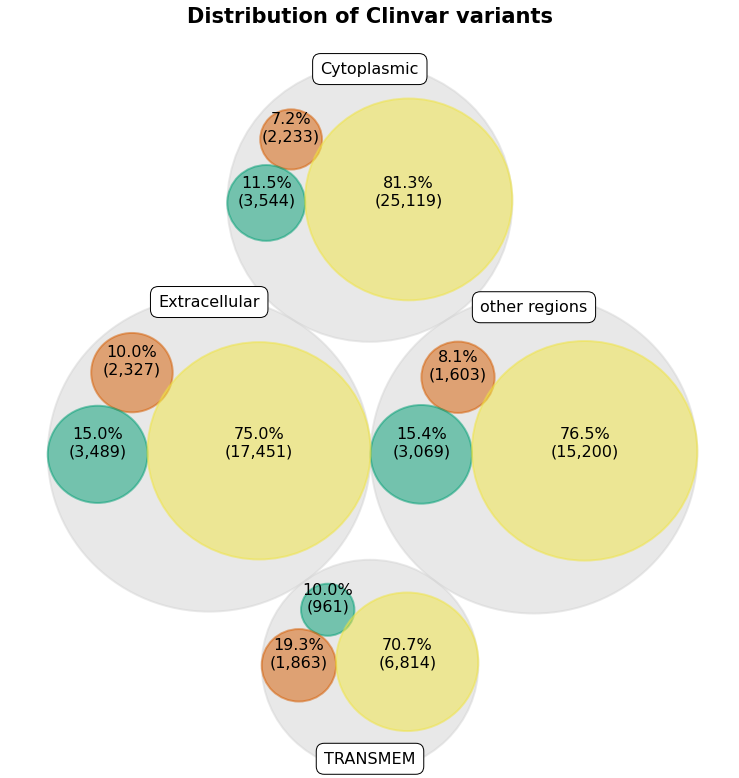

In [28]:

clinvar_TM = int((table_anno_df.loc[(table_anno_df['status']=='benign')]['Transmembrane'])) + int((table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Transmembrane'])) + int((table_anno_df.loc[(table_anno_df['status']=='VUS')]['Transmembrane']))
clinvar_EC = int((table_anno_df.loc[(table_anno_df['status']=='benign')]['Extracellular'])) + int((table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Extracellular'])) + int((table_anno_df.loc[(table_anno_df['status']=='VUS')]['Extracellular']))
clinvar_IC = int((table_anno_df.loc[(table_anno_df['status']=='benign')]['Cytoplasmic'])) + int((table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Cytoplasmic'])) + int((table_anno_df.loc[(table_anno_df['status']=='VUS')]['Cytoplasmic']))
clinvar_other = int((table_anno_df.loc[(table_anno_df['status']=='benign')]['other'])) + int((table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['other'])) + int((table_anno_df.loc[(table_anno_df['status']=='VUS')]['other']))

data = [{'id': 'all', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='total')]['all']), 'children':[
	{'id': 'TRANSMEM', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='total')]['Transmembrane']), 'children':[
		{'id': 'VUS', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Transmembrane']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Transmembrane']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Transmembrane']))/(clinvar_TM)):.1%}"},
		{'id': 'benign', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Transmembrane']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Transmembrane']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Transmembrane']))/(clinvar_TM)):.1%}"},
		{'id': 'pathogenic', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Transmembrane']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Transmembrane']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Transmembrane']))/(clinvar_TM)):.1%}"},

	]},
	{'id': 'Extracellular', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='total')]['Extracellular']), 'children':[
		{'id': 'VUS', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Extracellular']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Extracellular']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Extracellular']))/(clinvar_EC)):.1%}"},
		{'id': 'benign', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Extracellular']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Extracellular']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Extracellular']))/(clinvar_EC)):.1%}"},
		{'id': 'pathogenic', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Extracellular']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Extracellular']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Extracellular']))/(clinvar_EC)):.1%}"},
	]},
	{'id': 'Cytoplasmic', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='total')]['Cytoplasmic']), 'children':[
		{'id': 'VUS', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Cytoplasmic']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Cytoplasmic']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Cytoplasmic']))/(clinvar_IC)):.1%}"},
		{'id': 'benign', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Cytoplasmic']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Cytoplasmic']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='benign')]['Cytoplasmic']))/(clinvar_IC)):.1%}"},
		{'id': 'pathogenic', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Cytoplasmic']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Cytoplasmic']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Cytoplasmic']))/(clinvar_IC)):.1%}"},
	]},
	{'id': 'other regions', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='total')]['other']), 'children':[
		{'id': 'VUS', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['other']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['other']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['other']))/(clinvar_other)):.1%}"},
		{'id': 'benign', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='benign')]['other']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='benign')]['other']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='benign')]['other']))/(clinvar_other)):.1%}"},
		{'id': 'pathogenic', 'datum': int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['other']), 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['other']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['other']))/(clinvar_other)):.1%}"},
	]}
]},]


# Compute circle positions thanks to the circlify() function
circles = circlify.circlify(
    data, 
    show_enclosure=False, 
    target_enclosure=circlify.Circle(x=0, y=0, r=5)
)

# Create just a figure and only one subplot
fig, ax = plt.subplots(figsize=(13,13))

# Title
ax.set_title('Distribution of Clinvar variants', fontsize=21, fontweight="bold", y=1.05)

# Remove axes
ax.axis('off')

# Find axis boundaries
lim = max(
    max(
        abs(circle.x) + circle.r,
        abs(circle.y) + circle.r,
    )
    for circle in circles
)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

# Print circle the highest level (continents):
for circle in circles:
    if circle.level != 2:
        continue
    x, y, r = circle
    ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="lightgray"))

# Print circle and labels for the highest level:
for circle in circles:
    if circle.level != 3:
          continue
    x, y, r = circle
    def get_percent(x):
        for child in data[0]['children']:
            if child['id']==x:
                return child['percent']
    #label = f'{circle.ex["id"]}\n({circle.ex["datum"]}; {circle.ex["percent"]})'#circle.ex["id"]
    label = f'{circle.ex["percent"]}\n({circle.ex["dat2"]})'#circle.ex["id"]
    if circle.ex["id"]=='benign':
        ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="#009E74")) #91bfdb
    elif circle.ex["id"]=='pathogenic':
        ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="#D55C00")) #fc8d59
    elif circle.ex["id"]=='VUS':
        ax.add_patch( plt.Circle((x, y+0.05), r, alpha=0.5, linewidth=2, color="#F0E442")) #ffffbf
    else:
        ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="#69b3a2")) #fc8d59 #ffffbf #91bfdb #69b3a2
    plt.annotate(label, (x,y-0.025 ), ha='center', color="black", fontsize=16,)

# Print labels for the continents
for circle in circles:
    if circle.level != 2:
          continue
    x, y, r = circle
    print(x,y,r, circle.ex["id"])
    label = f'{circle.ex["id"]}'#\n({circle.ex["datum"]})'
    if circle.ex["id"] == 'TRANSMEM':
        plt.annotate(label, (x,y-(r-0.17) ) ,va='center', ha='center', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=.5), fontsize=16,)
    if circle.ex["id"] == 'Cytoplasmic':
        plt.annotate(label, (x,y+(r-0.07) ) ,va='center', ha='center', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=.5), fontsize=16,)
    if circle.ex["id"] == 'Extracellular':
        plt.annotate(label, (x,y+(r-0.07) ) ,va='center', ha='center', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=.5), fontsize=16,)
#    if circle.ex["id"] == 'Lumenal':
#        plt.annotate(label, (x-(r-0.17),y+(r-0.07) ) ,va='center', ha='center', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=.5), fontsize=16,)
    if circle.ex["id"] == 'other regions':
        plt.annotate(label, (x,y+(r-0.17) ) ,va='center', ha='center', bbox=dict(facecolor='white', edgecolor='black', boxstyle='round', pad=.5), fontsize=16,)



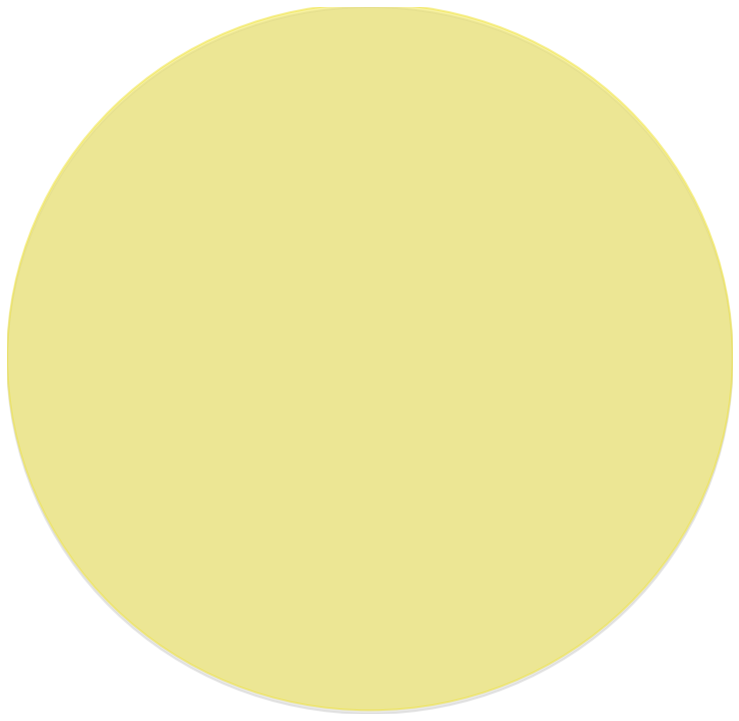

In [106]:
data = [{'id': 'all', 'datum': int(len(anno['variant'])), 'children':[
    {'id': 'TRANSMEM', 'datum': 3, 'children':[
        {'id': 'VUS', 'datum': 3, 'dat2': f"{int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Transmembrane']):,d}", 'percent': f"{((int(table_anno_df.loc[(table_anno_df['status']=='VUS')]['Transmembrane']))/(clinvar_TM)):.1%}"},

    ]},
]},]

# Compute circle positions thanks to the circlify() function
circles = circlify.circlify(
    data, 
    show_enclosure=False, 
    target_enclosure=circlify.Circle(x=0, y=0, r=5)
)


# Create just a figure and only one subplot
fig, ax = plt.subplots(figsize=(13,13))

# Title
#ax.set_title('Distribution of Clinvar variants', fontsize=21, fontweight="bold", y=1.05)

# Remove axes
ax.axis('off')

# Find axis boundaries
lim = max(
    max(
        abs(circle.x) + circle.r,
        abs(circle.y) + circle.r,
    )
    for circle in circles
)
plt.xlim(-lim, lim)
plt.ylim(-lim, lim)

# Print circle the highest level (continents):
for circle in circles:
    if circle.level != 2:
        continue
    x, y, r = circle
    ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="lightgray"))

# Print circle and labels for the highest level:
for circle in circles:
    if circle.level != 3:
          continue
    x, y, r = circle
    def get_percent(x):
        for child in data[0]['children']:
            if child['id']==x:
                return child['percent']
    #label = f'{circle.ex["id"]}\n({circle.ex["datum"]}; {circle.ex["percent"]})'#circle.ex["id"]
    label = f'{circle.ex["percent"]}\n({circle.ex["dat2"]})'#circle.ex["id"]
    if circle.ex["id"]=='benign':
        ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="#009E74")) #91bfdb
    elif circle.ex["id"]=='pathogenic':
        ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="#D55C00")) #fc8d59
    elif circle.ex["id"]=='VUS':
        ax.add_patch( plt.Circle((x, y+0.05), r, alpha=0.5, linewidth=2, color="#F0E442")) #ffffbf
    else:
        ax.add_patch( plt.Circle((x, y), r, alpha=0.5, linewidth=2, color="#69b3a2")) #fc8d59 #ffffbf #91bfdb #69b3a2
  #  plt.annotate(label, (x,y-0.025 ), ha='center', color="black", fontsize=16,)


# Print labels for the continents
for circle in circles:
    if circle.level != 2:
          continue
    x, y, r = circle

    
plt.savefig(os.path.join(plots_dir,'Fig1Cy.svg'))
plt.show()

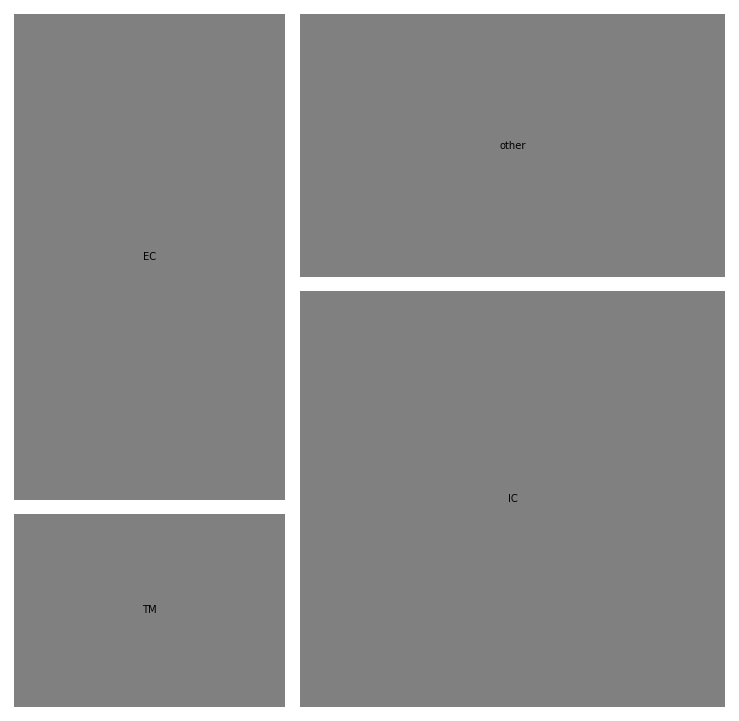

In [30]:
sizes=[clinvar_TM,clinvar_EC,clinvar_IC,clinvar_other]
label = ['TM','EC','IC','other']
fig, ax = plt.subplots(figsize=(13,13))
squarify.plot(sizes, label=label, pad=True, color='grey')
plt.axis('off')
plt.show()

INFO:TM


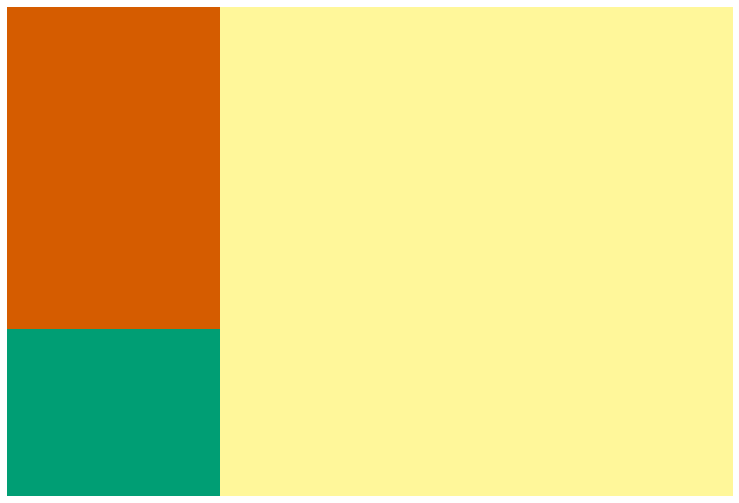

In [34]:
sizes=[int((table_anno_df.loc[(table_anno_df['status']=='benign')]['Transmembrane'])),
       int((table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Transmembrane'])),
       int((table_anno_df.loc[(table_anno_df['status']=='VUS')]['Transmembrane']))]
figsizes=(13,9)
logger.info('TM')
sizes=[int((table_anno_df.loc[(table_anno_df['status']=='benign')]['Extracellular'])),
       int((table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Extracellular'])),
       int((table_anno_df.loc[(table_anno_df['status']=='VUS')]['Extracellular']))]
figsizes=(6.8,13)
logger.info('EC')
sizes=[int((table_anno_df.loc[(table_anno_df['status']=='benign')]['Cytoplasmic'])),
       int((table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['Cytoplasmic'])),
       int((table_anno_df.loc[(table_anno_df['status']=='VUS')]['Cytoplasmic']))]
figsizes=(13,13)
logger.info('IC')
sizes=[int((table_anno_df.loc[(table_anno_df['status']=='benign')]['other'])),
       int((table_anno_df.loc[(table_anno_df['status']=='pathogenic')]['other'])),
       int((table_anno_df.loc[(table_anno_df['status']=='VUS')]['other']))]
figsizes=(13,8.2)
logger.info('other')

label = ['benign','pathogenic','VUS']
fig, ax = plt.subplots(figsize=figsizes)
#squarify.plot(sizes, color=["#009E74","#D55C00", "#F0E442"], )#label=label, pad=True, 
squarify.plot(sizes, color=["#009E74","#D55C00", "#fff79a"], )#label=label, pad=True, 
plt.axis('off')
plt.show()

## gnomAD distribution

### gnomAD cutoff value

In [13]:
gnomad_cutoff = clinvar.copy()
gnomad_cutoff = gnomad_cutoff.dropna(how='any', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
gnomad_cutoff = gnomad_cutoff.loc[(gnomad_cutoff['clinvar;significance_all'].isin(['pathogenic', 'benign']))].reset_index(drop=True)
gnomad_cutoff = gnomad_cutoff[~gnomad_cutoff["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
gnomad_cutoff['gnomad;AF_tot_first'] = gnomad_cutoff["gnomad;AF_tot_all"].apply(lambda x: float(x.split('|')[0]))
gnomad_cutoff = gnomad_cutoff[~gnomad_cutoff["gnomad;AF_tot_first"].isna()].reset_index(drop=True)

len(gnomad_cutoff['variant'])

40144

INFO:groupA: 6200
groupB: 33944
INFO:-9.911960815654355e-05


Ensemble test roc-auc:0.9495923147613146


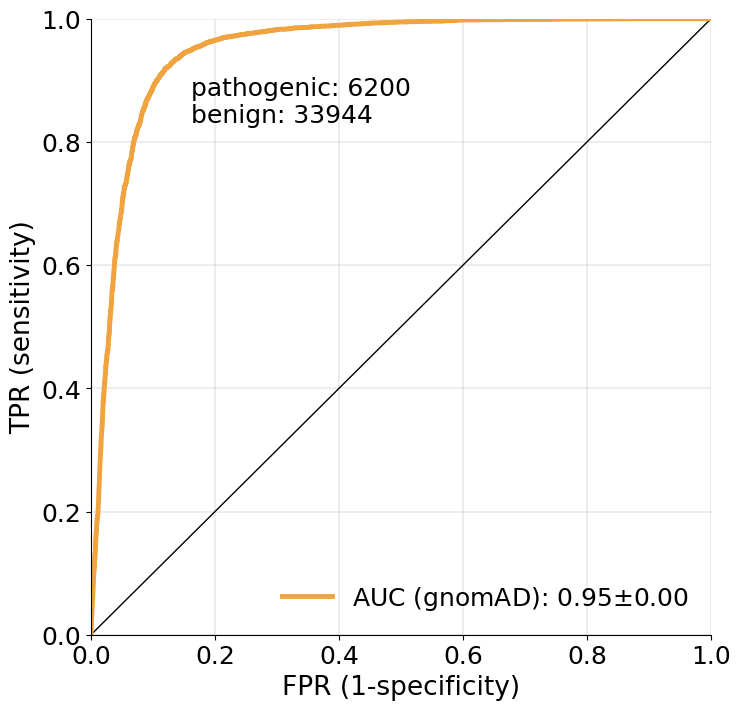

CPU times: user 6min 33s, sys: 43.3 s, total: 7min 16s
Wall time: 7min 49s


In [14]:
%%time

all_tmp = []
all_aucs = {}
all_vals_cat = {}



all_tmp = gnomad_cutoff.copy()
for region in ['all', ]:#'TRANSMEM', ]:#+list(all_tmp['uniprot;regions_all'].unique()):
    tmp2 = all_tmp.copy()
    if region != 'all':
        tmp2 = tmp2[(tmp2['uniprot;regions_all']==region)].reset_index(drop=True)
    #target_sub_df = target_sub_df.rename(columns={gemme_name[0]:'gemme;score', rosetta_names:'rosetta;ddG'})
    #       tmp = tmp.dropna(axis=0, how='any', subset=["rosetta;ddG", "gemme;score"]).reset_index(drop=True)

    control_df = tmp2.copy()
    control_df['label_class_raw'] = control_df[['clinvar;significance_all', 'gnomad;AF_tot_first']].apply(lambda x: '|'.join(list(set(x.dropna().astype(str)))), axis=1)
    control_df['score'] = control_df['label_class_raw'].apply(lambda x: clinvar_class_anno5(x))
    control_df['gnomad;AF_tot_first'] = control_df['gnomad;AF_tot_first']*(-1)

    control_df = control_df.dropna(subset = ['score']).reset_index(drop=True)
    control_score = np.copy(control_df['score'].values)
    if len(list(set(control_score))) > 1:
        test_score1 = control_df['gnomad;AF_tot_first'].values
        title = f"gnomAD_{region}"
        groupA = len(control_df[control_df['score']==1].reset_index(drop=True)['score'])
        groupB = len(control_df[control_df['score']==0].reset_index(drop=True)['score'])
        logger.info(f"groupA: {groupA}\ngroupB: {groupB}")
        satu = ''#, sat.;\n excl. resi with >10 ∆∆G<0'
        #try:
            #print("try")
        if region == 'all':
            #auc_dici = ROC_improve_checks(control_df)
            auc_dici = cutoff_checks(control_df, nameA='gnomad;AF_tot_first')#;ori
            all_aucs['all']=auc_dici*-1
            logger.info(auc_dici)
            auc_dici = disease_ROC_adapted(control_df, control_score, test_score1, groupA=groupA, groupB=groupB, nameA='gnomad;AF_tot_first')


### gnomAD distribution

In [17]:
%%time

all_df_sub = []
#sub_ana_var2 = gnomad.copy()#base_analysis_formated.copy()
sub_ana_var2 = analysis_df_base2.copy()
sub_ana_var2 = sub_ana_var2.dropna(how='any', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
sub_ana_var2['regions'] = 'all'
all_df_sub.append(sub_ana_var2[['gnomad;AF_tot_all', 'regions', 'clinvar;significance_all',]])

clinvar_benign = clinvar.copy()
clinvar_benign = clinvar_benign.loc[(clinvar_benign['clinvar;significance_all']=='benign')].reset_index(drop=True)
sub_ana_var2 = clinvar_benign.copy()
sub_ana_var2 = sub_ana_var2[~sub_ana_var2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
sub_ana_var2['regions'] = 'benign'
all_df_sub.append(sub_ana_var2[['gnomad;AF_tot_all', 'regions', 'clinvar;significance_all',]])

clinvar_pathogenic = clinvar.copy()
clinvar_pathogenic = clinvar_pathogenic.loc[(clinvar_pathogenic['clinvar;significance_all']=='pathogenic')].reset_index(drop=True)
sub_ana_var2 = clinvar_pathogenic.copy()
sub_ana_var2 = sub_ana_var2[~sub_ana_var2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
sub_ana_var2['regions'] = 'pathogenic'
all_df_sub.append(sub_ana_var2[['gnomad;AF_tot_all', 'regions', 'clinvar;significance_all',]])

sub_ana_var2 = anno.copy()
TM_range = ['TRANSMEM', 'Mitochondrial_intermembrane', 'INTRAMEM', 'INTRAMEM|TRANSMEM']
sub_ana_var2 = sub_ana_var2[~sub_ana_var2["gnomad;AF_tot_all"].isna()].reset_index(drop=True)
sub_ana_var2 = sub_ana_var2.loc[sub_ana_var2['uniprot;regions_all'].isin(TM_range)].reset_index(drop=True)
sub_ana_var2['regions'] = 'transmembrane'
all_df_sub.append(sub_ana_var2[['gnomad;AF_tot_all', 'regions', 'clinvar;significance_all',]])
logger.info('here')

sub_ana_var = pd.concat(all_df_sub)
sub_ana_var['gnomad;AF_tot_first'] = sub_ana_var["gnomad;AF_tot_all"].apply(lambda x: float(x.split('|')[0]))
sub_ana_var = sub_ana_var.sort_values(['regions'], ascending=[1])
sub_ana_var = sub_ana_var[['gnomad;AF_tot_first', 'regions', 'clinvar;significance_all',]]

sub_ana_var['gnomad_log'] = np.log10(sub_ana_var['gnomad;AF_tot_first'])
sub_ana_var.replace([np.inf, -np.inf], np.nan, inplace=True)
sub_ana_var = sub_ana_var.dropna(subset=['gnomad;AF_tot_first', 'gnomad_log'])

sorter = ['all', 'transmembrane', 'benign', 'pathogenic']
sub_ana_var['regions'] = sub_ana_var['regions'].astype("category")
sub_ana_var['regions'].cat.set_categories(sorter, inplace=True)
sub_ana_var = sub_ana_var.sort_values(["regions"])


INFO:here
/storage1/tiemann/dev/miniconda3/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2747: FutureWarning: The `inplace` parameter in pandas.Categorical.set_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  res = method(*args, **kwargs)


CPU times: user 4min 10s, sys: 35min 27s, total: 39min 37s
Wall time: 46min 1s


INFO:['benign', 'pathogenic']
Categories (4, object): ['all', 'transmembrane', 'benign', 'pathogenic']


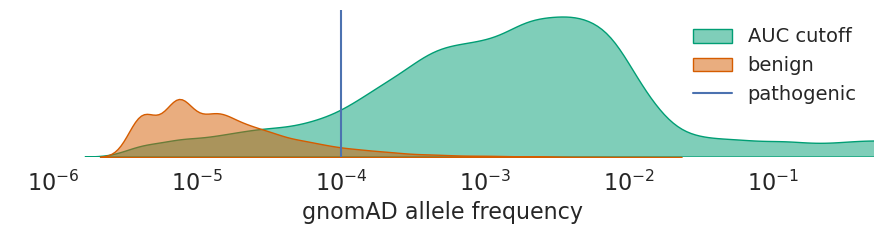

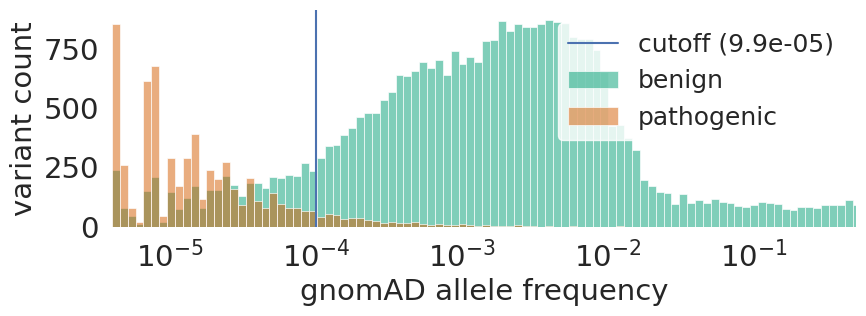

INFO:all


CPU times: user 10.8 s, sys: 626 ms, total: 11.5 s
Wall time: 8.86 s


In [18]:
%%time

gnomad_cutoff_value = 9.911960815654355e-05

tmps = sub_ana_var.copy()
tmps = tmps.loc[tmps['regions'].isin(['benign', 'pathogenic'])].reset_index(drop=True)
logger.info(tmps['regions'].unique())
f = plt.figure(figsize=(9,2.5))
with sns.axes_style("white"):#white, dark, whitegrid, darkgrid, ticks
    sns.set_theme(style="white", rc={"axes.facecolor": (1, 1, 1, 1), 'axes.linewidth':0})
    g = sns.kdeplot( x=tmps['gnomad;AF_tot_first'], fill=True, alpha=0.5, log_scale=10, hue=tmps['regions'], 
                hue_order=['pathogenic', 'benign', ], palette=sns.color_palette(['#D55C00', '#009E74', ]),
               )
    g.set_xlim(5e-7, 5e-1)
    g.set_xlabel('gnomAD allele frequency')
    g.set_ylabel('')
    sns.set(font_scale=1.0)
    g.set(yticks=[], xlabel="gnomAD allele frequency", )
    #g.despine(left=True)
    g.yaxis.label.set_size(16)
    g.xaxis.label.set_size(16)
    for tick in g.xaxis.get_minor_ticks(): 
        tick.label.set_fontsize(16)

    plt.xticks(fontsize=16)
    plt.yticks(fontsize=12)
    g.axvline(gnomad_cutoff_value)#7.097735196763732e-05)

    #sns.set_context("talk", font_scale=5.5)
    #plt.axvline(x=0)
    plt.legend(title='', labels=['AUC cutoff', 'benign', 'pathogenic'], fontsize=14, fancybox=True, facecolor='white', edgecolor='white')#loc='upper left', )
    plt.tight_layout()
    plt.show()
f = plt.figure(figsize=(9,3.5))
fontsize = 21
with sns.axes_style("white"):#white, dark, whitegrid, darkgrid, ticks
    sns.set_theme(style="white", rc={"axes.facecolor": (1, 1, 1, 1), 'axes.linewidth':0})
    g = sns.histplot(data=tmps, x='gnomad;AF_tot_first', log_scale=10, hue='regions', bins=100,
                 palette=sns.color_palette(['#D55C00', '#009E74', ]), hue_order=['pathogenic','benign', ], )
    g.set_xlim(4e-6, 5e-1)
    g.set_xlabel('gnomAD allele frequency')
    g.set_ylabel('variant count')
    sns.set(font_scale=1.5)
    #g.set(yticks=[], xlabel="gnomAD allele frequency", )
    #g.despine(left=True)
    g.yaxis.label.set_size(fontsize)
    g.xaxis.label.set_size(fontsize)
    for tick in g.xaxis.get_minor_ticks(): 
        tick.label.set_fontsize(fontsize)

    plt.xticks(fontsize=fontsize)
    plt.yticks(fontsize=fontsize)
    g.axvline(gnomad_cutoff_value)#7.097735196763732e-05)
    
    #sns.set_context("talk", font_scale=5.5)
    #plt.axvline(x=0)
    plt.legend(title='', labels=['cutoff (9.9e-05)', 'benign', 'pathogenic'], fontsize=fontsize-3, fancybox=True, facecolor='white', edgecolor='white')#loc='upper left', )
    plt.tight_layout()
    plt.savefig(os.path.join(plots_dir,'P_Fig1B-hP.svg'))
    plt.show()    


logger.info(region)

## info-table

### general table

In [41]:
%%time
csv_file_count_Clinvar_gnomad_PDB = os.path.join(tables_dir, f'{timeflag}-count_hP_Clinvar_gnomad_PDB_nonsyndel_df2.csv')

if os.path.isfile(csv_file_count_Clinvar_gnomad_PDB):
    logger.info('Read dataframe from existing files...')
    counts_df = pd.read_csv(csv_file_count_Clinvar_gnomad_PDB, header=[0,1])
else:
    logger.info('No existing files. Generate new files')
    analysis_df = base_analysis_formated.copy()

    analysis_df = analysis_df[['variant','accession', 'pdb;IDs', 'pdb;SS_all', 'clinvar;significance_all', 'uniprot;regions_all', 'gnomad;AF_tot_all']]

    tmp_ana_df = analysis_df.copy()
    counts = [['accession', 'accession','accession', 
                'length', 'length',
                'assembly', 'assembly', 'assembly', 'PDB',
                'all', 'all', 'all', 'all', 'all', 'all', 'all',
                'TRANSMEM', 'TRANSMEM', 'TRANSMEM',  'TRANSMEM', 'TRANSMEM', 'TRANSMEM', 'TRANSMEM',
                'Extracellular', 'Extracellular', 'Extracellular', 'Extracellular', 'Extracellular', 'Extracellular', 'Extracellular',
                'Cytoplasmic', 'Cytoplasmic', 'Cytoplasmic', 'Cytoplasmic', 'Cytoplasmic', 'Cytoplasmic', 'Cytoplasmic',
                'other', 'other', 'other', 'other', 'other', 'other', 'other',
                'MIM', 'MIM',
              ],
                ['ID', 'name', 'class',
                'all', 'TM',  
                'self', 'others', 'note', 'PDBids', 
                'total', 'VUS', 'benign', 'pathogenic', 'other', 'gnomad_total', 'gnomad_unique',
                'total', 'VUS', 'benign', 'pathogenic', 'other', 'gnomad_total', 'gnomad_unique',
                'total', 'VUS', 'benign', 'pathogenic', 'other', 'gnomad_total', 'gnomad_unique',
                'total', 'VUS', 'benign', 'pathogenic', 'other', 'gnomad_total', 'gnomad_unique',
                'total', 'VUS', 'benign', 'pathogenic', 'other', 'gnomad_total', 'gnomad_unique',
                'Chromosome', 'Phenotype',
              ]]
    #VUS, benign, pathogenic, other=['conflict', 'other', 'conflict|benign', 'VUS|benign', 'VUS|pathogenic', 'VUS|conflict']
    #Extracellular Cytoplasmic TRANSMEM other=['Lumenal', 'Nuclear', 'Perinuclear_space', 'Lumenal,_melanosome', 'Mitochondrial_matrix', 'Mitochondrial_itermembrane', 'INTRAMEM', 'Vacuolar', 'Vesicular', 'Intragranular', 'Peroxisomal']


    logger.info(len(tmp_ana_df['accession'].unique()))
    for index, accession in enumerate(tmp_ana_df['accession'].unique()):
        if index%100 == 0:
            logger.info(index)
        try:
            name = list(hMP_merged_dfs[hMP_merged_dfs['accession']==accession]['entryName'])[0].split('_')[0]
        except:
            name = ''

        tmp = tmp_ana_df.copy()
        tmp = tmp[tmp['accession']==accession].reset_index(drop=True)
        
        counts_dic={
            'all':0, 'TRANSMEM':0, 'Extracellular':0, 'Cytoplasmic':0, 'other':0,
        }
        tmpa = tmp.copy()
        counts_dic[f"all"]=len(tmpa['variant'])
        for region in tmp_ana_df['uniprot;regions_all'].unique():
            tmpb = tmpa.copy()
            tmpb = tmpb[tmpb['uniprot;regions_all']==region].reset_index(drop=True)
            if (region in ['Extracellular', 'Cytoplasmic', 'TRANSMEM']):
                counts_dic[f"{region}"]=len(tmpb['variant'])
            else:
                counts_dic['other']+=len(tmpb['variant'])
        
        
        clinvar_dic={
            'all_VUS':0, 'all_benign':0, 'all_pathogenic':0, 'all_other':0,
            'TRANSMEM_VUS':0, 'TRANSMEM_benign':0, 'TRANSMEM_pathogenic':0, 'TRANSMEM_other':0,
            'Extracellular_VUS':0, 'Extracellular_benign':0, 'Extracellular_pathogenic':0, 'Extracellular_other':0,
            'Cytoplasmic_VUS':0, 'Cytoplasmic_benign':0, 'Cytoplasmic_pathogenic':0, 'Cytoplasmic_other':0,
            'other_VUS':0, 'other_benign':0, 'other_pathogenic':0, 'other_other':0,
        }
        for clinvar in tmp['clinvar;significance_all'].unique():
            tmp2 = tmp.copy()
            tmp2 = tmp2.dropna(how='all', subset=['clinvar;significance_all']).reset_index(drop=True)
            tmp2 = tmp2[tmp2['clinvar;significance_all']==clinvar].reset_index(drop=True)
            if clinvar in ['VUS', 'benign', 'pathogenic']:
                clinvar_dic[f"all_{clinvar}"]=len(tmp2['variant'])
            else:
                clinvar_dic['all_other']+=len(tmp2['variant'])
            for region in tmp_ana_df['uniprot;regions_all'].unique():
                tmp3 = tmp2.copy()
                tmp3 = tmp3[tmp3['uniprot;regions_all']==region].reset_index(drop=True)
                if (region in ['Extracellular', 'Cytoplasmic', 'TRANSMEM']) and (clinvar in ['VUS', 'benign', 'pathogenic']):
                    clinvar_dic[f"{region}_{clinvar}"]=len(tmp3['variant'])
                elif (region in ['Extracellular', 'Cytoplasmic', 'TRANSMEM']):
                    clinvar_dic[f"{region}_other"]+=len(tmp3['variant'])
                elif (clinvar in ['VUS', 'benign', 'pathogenic']):
                    clinvar_dic[f"other_{clinvar}"]+=len(tmp3['variant'])
                else:
                    clinvar_dic['other_other']+=len(tmp3['variant'])

        gnomad_dic={
            'all':0, 'TRANSMEM':0, 'Extracellular':0, 'Cytoplasmic':0, 'other':0,
            'all_unique':0, 'TRANSMEM_unique':0, 'Extracellular_unique':0, 'Cytoplasmic_unique':0, 'other_unique':0,
        }
        tmp4 = tmp.copy()
        tmp4 = tmp4.dropna(how='all', subset=['gnomad;AF_tot_all']).reset_index(drop=True)
        gnomad_dic[f"all"]=len(tmp4['variant'])
        tmp4a = tmp4.copy()
        tmp4a = tmp4a[~tmp4a['clinvar;significance_all'].notna()].reset_index(drop=True)
        gnomad_dic[f"all_unique"]=len(tmp4a['variant'])
        for region in tmp_ana_df['uniprot;regions_all'].unique():
            tmp5 = tmp4.copy()
            tmp5 = tmp5[tmp5['uniprot;regions_all']==region].reset_index(drop=True)
            tmp5a = tmp4a.copy()
            tmp5a = tmp5a[tmp5a['uniprot;regions_all']==region].reset_index(drop=True)
            if (region in ['Extracellular', 'Cytoplasmic', 'TRANSMEM']):
                gnomad_dic[f"{region}"]=len(tmp5['variant'])
                gnomad_dic[f"{region}_unique"]=len(tmp5a['variant'])
            else:
                gnomad_dic['other']+=len(tmp5['variant'])
                gnomad_dic['other_unique']+=len(tmp5a['variant'])

        uniprot_files = glob.glob(os.path.join(shared_prism_dir, accession[0:2], accession[2:4], accession[4:6], f'prism_uniprot_*_{accession}.txt'))
        uniprot = read_prism(uniprot_files[0])
        sequence = uniprot.metadata['protein']['sequence']
        length_total = int(len(sequence))
        uniprot_tmp = uniprot.dataframe.copy()
        try:
            uniprot_tmp = uniprot_tmp.dropna(how='all', subset=['TRANSMEM']).reset_index(drop=True)
            uniprot_tmp['res'] = uniprot_tmp['resi'].apply(lambda x: x[0])
            length_TM = int(len(uniprot_tmp['res'].unique()))
        except:
            length_TM = np.nan

        pdb_ids = []
        pdb_files = tmp['pdb;IDs'].unique()
        for pdb in pdb_files:
            pdb = [elem.upper() for elem in pdb.split('|')]
            pdb_ids += pdb 
        pdb_ids = "|".join(sorted(set(sorted(pdb_ids))))

        def get_MIM_info(hMP_id, genemap2_df, morbidmap_df):
            result_dict = {}
            result_dict['Chromosome'] = '|'.join(genemap2_df[genemap2_df['MIM_ID'] == uniprot2omim[hMP_id]]['Chromosome'])
            result_dict['Phenotype'] = '|'.join(genemap2_df[genemap2_df['MIM_ID'] == uniprot2omim[hMP_id]]['Phenotype'])
            return result_dict
        try:
            MIM_dict = get_MIM_info(accession, genemap2_df, morbidmap_df)
            chromosome = MIM_dict['Chromosome']
            phenotype = MIM_dict['Phenotype']
        except:
            chromosome = None
            phenotype = None

        counts.append([
            accession, name, None,
            length_total, length_TM,
            None, None, None, pdb_ids,
            counts_dic['all'], clinvar_dic['all_VUS'], clinvar_dic['all_benign'], clinvar_dic['all_pathogenic'], clinvar_dic['all_other'], gnomad_dic['all'], gnomad_dic['all_unique'],
            counts_dic['TRANSMEM'], clinvar_dic['TRANSMEM_VUS'], clinvar_dic['TRANSMEM_benign'], clinvar_dic['TRANSMEM_pathogenic'], clinvar_dic['TRANSMEM_other'], gnomad_dic['TRANSMEM'], gnomad_dic['TRANSMEM_unique'],
            counts_dic['Extracellular'], clinvar_dic['Extracellular_VUS'], clinvar_dic['Extracellular_benign'], clinvar_dic['Extracellular_pathogenic'], clinvar_dic['Extracellular_other'], gnomad_dic['Extracellular'], gnomad_dic['Extracellular_unique'],
            counts_dic['Cytoplasmic'], clinvar_dic['Cytoplasmic_VUS'], clinvar_dic['Cytoplasmic_benign'], clinvar_dic['Cytoplasmic_pathogenic'], clinvar_dic['Cytoplasmic_other'], gnomad_dic['Cytoplasmic'], gnomad_dic['Cytoplasmic_unique'],
            counts_dic['other'], clinvar_dic['other_VUS'], clinvar_dic['other_benign'], clinvar_dic['other_pathogenic'], clinvar_dic['other_other'], gnomad_dic['other'], gnomad_dic['other_unique'],
            chromosome, phenotype,
        ])
    counts_df = pd.DataFrame(data=counts[2:], columns=counts[0:2])

    counts_df.to_csv(csv_file_count_Clinvar_gnomad_PDB, index=False)
counts_df.sort_values(by=[('TRANSMEM', 'total')], ascending=[False])


INFO:No existing files. Generate new files
INFO:1504
INFO:0
INFO:100
INFO:200
INFO:300
INFO:400
INFO:500
INFO:600
INFO:700
INFO:800
INFO:900
INFO:1000
INFO:1100
INFO:1200
INFO:1300
INFO:1400
INFO:1500


CPU times: user 7min 18s, sys: 5.6 s, total: 7min 24s
Wall time: 8min 21s


accession              length        assembly               \
            ID   name class    all     TM     self others  note   
128     P35499  SCN4A  None   1836  461.0     None   None  None   
765     Q14524  SCN5A  None   2016  463.0     None   None  None   
766     Q01118  SCN7A  None   1682  462.0     None   None  None   
1348    P13569   CFTR  None   1480  253.0     None   None  None   
674     P98161   PKD1  None   4303  230.0     None   None  None   
...        ...    ...   ...    ...    ...      ...    ...   ...   
620     Q96PH1   NOX5  None    765  151.0     None   None  None   
619     O15394  NCAM2  None    837   21.0     None   None  None   
618     O43525  KCNQ3  None    872  127.0     None   None  None   
615     Q15262  PTPRK  None   1439   22.0     None   None  None   
1503    Q6P179  ERAP2  None    960   20.0     None   None  None   

                                                    PDB   all  ...  \
                                                 PDBids total  ...   
128                                6AGF-A|6MBA-A|6MC9-A   922  ...   
765   4DCK-A|4JQ0-C|4JQ0-D|4OVN-B|4OVN-D|4OVN-F|4OVN...   990  ...   
766                                       7TJ8-A|7TJ9-A   673  ...   
1348  1XMI-A|1XMI-B|1XMI-C|1XMI-D|1XMI-E|1XMJ-A|2BBO...  1404  ...   
674                                       1B4R-A|6A70-B   734  ...   
...                                                 ...   ...  ...   
620                                       6SZ5-B|6SZ5-C     2  ...   
619   2DOC-A|2JLL-A|2KBG-A|2V5T-A|2VAJ-A|2WIM-A|2WIM...   358  ...   
618                                              5J03-A    38  ...   
615                                              2C7S-A   130  ...   
1503  3SE6-A|3SE6-B|4E36-A|4E36-B|4JBS-A|4JBS-B|5AB0...   598  ...   

       Cytoplasmic other                                           \
     gnomad_unique total VUS benign pathogenic other gnomad_total   
128            230    43  10      0          1     0           40   
765            139    52  24      0          9     4           27   
766            139    66   0      1          0     0           66   
1348           456     0   0      0          0     0            0   
674            185     0   0      0          0     0            0   
...            ...   ...  ..    ...        ...   ...          ...   
620              0     0   0      0          0     0            0   
619              0     0   0      0          0     0            0   
618             26     0   0      0          0     0            0   
615            130     0   0      0          0     0            0   
1503             0   598   0      4          0     0          598   

                          MIM  \
     gnomad_unique Chromosome   
128             32      chr17   
765             15       chr3   
766             65       None   
1348             0       chr7   
674              0      chr16   
...            ...        ...   
620              0       None   
619              0       None   
618              0       chr8   
615              0       None   
1503           594       None   

                                                         
                                              Phenotype  
128   Paramyotonia congenita, 168300 (3), Autosomal ...  
765   Ventricular fibrillation, familial, 1, 603829 ...  
766                                                None  
1348  Cystic fibrosis, 219700 (3), Autosomal recessi...  
674   Polycystic kidney disease 1, 173900 (3), Autos...  
...                                                 ...  
620                                                None  
619                                                None  
618   Seizures, benign neonatal, 2, 121201 (3), Auto...  
615                                                None  
1503                                               None  

[1504 rows x 46 columns]

In [42]:
tmpi_counts_df = counts_df.copy()
tmpi_counts_df = tmpi_counts_df.loc[~((tmpi_counts_df[('TRANSMEM', 'benign')]==0) | (tmpi_counts_df[('TRANSMEM', 'pathogenic')]==0))].reset_index(drop=True)
logger.info(tmpi_counts_df[('all', 'total')].sum())
tmpi_counts_df.sort_values(by=[('TRANSMEM', 'total')], ascending=[False])


INFO:15554


accession              length        assembly               \
          ID   name class    all     TM     self others  note   
1     P35499  SCN4A  None   1836  461.0     None   None  None   
24    Q14524  SCN5A  None   2016  463.0     None   None  None   
37    Q09428  ABCC8  None   1581  361.0     None   None  None   
22    Q8IZF0  NALCN  None   1738  495.0     None   None  None   
8     O15118   NPC1  None   1278  277.0     None   None  None   
31    Q13635   PTC1  None   1447  251.0     None   None  None   
12    O75907  DGAT1  None    488  261.0     None   None  None   
15    P21439   MDR3  None   1286  259.0     None   None  None   
14    P11166   GTR1  None    492  261.0     None   None  None   
20    P82251   BAT1  None    487  252.0     None   None  None   
19    P08100   OPSD  None    348  161.0     None   None  None   
25    P32245   MC4R  None    332  165.0     None   None  None   
30    P49768   PSN1  None    467  195.0     None   None  None   
40    Q9H221  ABCG8  None    673  126.0     None   None  None   
13    Q9ULV1   FZD4  None    537  206.0     None   None  None   
7     P51787  KCNQ1  None    676  128.0     None   None  None   
26    P43007   SATT  None    532  189.0     None   None  None   
6     Q9H3H5    GPT  None    408  228.0     None   None  None   
39    Q9Y653  AGRG1  None    693  147.0     None   None  None   
34    Q9NQW8  CNGB3  None    809  126.0     None   None  None   
33    Q9H222  ABCG5  None    651  127.0     None   None  None   
9     P29033   CXB2  None    226   83.0     None   None  None   
18    Q12809  KCNH2  None   1159  126.0     None   None  None   
11    Q16281  CNGA3  None    694  126.0     None   None  None   
23    P41181   AQP2  None    271  124.0     None   None  None   
27    Q99835    SMO  None    787  147.0     None   None  None   
10    Q14028  CNGB1  None   1251  122.0     None   None  None   
29    Q9HBA0  TRPV4  None    871  147.0     None   None  None   
2     P31213   S5A2  None    254   84.0     None   None  None   
3     P43681  ACHA4  None    627   85.0     None   None  None   
0     P30518    V2R  None    371  151.0     None   None  None   
35    P16615  AT2A2  None   1042  204.0     None   None  None   
38    P33897  ABCD1  None    745  105.0     None   None  None   
16    Q8N5M9  JAGN1  None    183   84.0     None   None  None   
32    P17787  ACHB2  None    502   86.0     None   None  None   
4     P14867  GBRA1  None    456   88.0     None   None  None   
36    O75027  ABCB7  None    752  126.0     None   None  None   
5     O60741   HCN1  None    890  129.0     None   None  None   
28    Q12879  NMDE1  None   1464   62.0     None   None  None   
21    P22607  FGFR3  None    806   21.0     None   None  None   
17    P15382  KCNE1  None    129   23.0     None   None  None   

                                                  PDB   all  ...  \
                                               PDBids total  ...   
1                                6AGF-A|6MBA-A|6MC9-A   922  ...   
24  4DCK-A|4JQ0-C|4JQ0-D|4OVN-B|4OVN-D|4OVN-F|4OVN...   990  ...   
37  6C3O-E|6C3O-F|6C3O-G|6C3O-H|6C3P-E|6C3P-F|6C3P...   853  ...   
22                 6XIW-A|7CM3-A|7SX3-A|7SX4-A|7WJI-D   598  ...   
8   3GKH-A|3GKI-A|3GKJ-A|3JD8-A|5F18-A|5F1B-C|5HNS...   796  ...   
31  6DMB-A|6DMO-A|6DMY-A|6E1H-A|6E1H-B|6E1H-C|6N7G...   822  ...   
12                        6VYI-A|6VYI-B|6VZ1-A|6VZ1-B   286  ...   
15                        6S7P-A|7NIU-A|7NIV-C|7NIW-A   666  ...   
14                 4PYP-A|5EQG-A|5EQH-A|5EQI-A|6THA-A   286  ...   
20   6LI9-B|6LI9-D|6LID-B|6LID-D|6YUP-D|6YUP-E|6YV1-A   293  ...   
19          4ZWJ-A|4ZWJ-B|4ZWJ-C|4ZWJ-D|5DGY-B|6CMO-R   315  ...   
25                                      6W25-A|7AUE-R   226  ...   
30  2KR6-A|5FN2-B|5FN3-B|6IDF-B|6IYC-B|6LQG-B|6LR4...   252  ...   
40  5DO7-B|5DO7-D|7JR7-B|7R87-B|7R88-B|7R89-B|7R8A...   583  ...   
13  5BPB-A|5BPB-B|5BPB-C|5BPB-D|5BPQ-A|5BPQ-B|5BPQ...   287  ...   
7   3BJ4-A|3BJ4-B|3HFC-A|3HFC-B|3HFC-C|3HFE-A|3HFE.

In [43]:
mylist = tmpi_counts_df[('accession','ID')].unique()
calculate_struc_sele(mylist)


INFO:0 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py P30518
INFO:1 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py P35499
INFO:2 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py P31213
INFO:3 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py P43681
INFO:4 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py P14867
INFO:5 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py O60741
INFO:6 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py Q9H3H5
INFO:7 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py P51787
INFO:8 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py O15118
INFO:9 python3 /storage1/tiemann/dev/repos/PRISM/software/scripts/struc_select_sifts.py P29033
INFO:10 python3 /storage1/tiemann/dev/repos/PRISM/